# Diffusion Soil: демонстрационный исследовательский прототип

Блокнот загружает подготовленный TNavigator NPZ и пять готовых checkpoint, анализирует данные и регрессоры, проверяет модели на независимых сценариях и строит условный ансамблевый прогноз нефтенасыщенности.

Основные результаты: карты p10/p50/p90, отдельные траектории ансамбля, GIF, RMSE/MAE/bias, CRPS, coverage, multi-case калибровка, сравнение U-Net/FNO/pixel diffusion/latent diffusion и статистических baseline, анализ по горизонтам и grid-группам, семивариограммы и ablation регрессоров.

50-летний rollout является рекурсивной surrogate-экстраполяцией. Блокнот явно показывает границы train-domain и не представляет дальний результат как замену расчету TNavigator.


## Автоматический запуск из архива Google Drive

Для запуска достаточно открыть notebook в Colab и нажать **«Выполнить все»**. Архив данных и весов автоматически скачивается по публичной ссылке Google Drive, проверяется и распаковывается в `/content`.

Повторная загрузка в пределах одной сессии Colab не выполняется: корректный архив и уже извлеченные файлы используются из локального кэша среды выполнения. Обучение моделей отключено; загружаются готовые веса U-Net, FNO, pixel diffusion, Spatial VAE и latent diffusion.


In [ ]:
# 0. Setup
from pathlib import Path
import os, sys, json, math, random, csv, hashlib, zipfile, time, shutil
from dataclasses import dataclass
from datetime import datetime

IN_COLAB = 'google.colab' in sys.modules

import numpy as np
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch
from PIL import Image
try:
    from tqdm.auto import tqdm
except Exception:
    def tqdm(iterable=None, *args, **kwargs):
        return iterable if iterable is not None else []
try:
    import pandas as pd
except Exception:
    pd = None
try:
    from IPython.display import Image as IPyImage, display, HTML
except Exception:
    IPyImage = None; display = print; HTML = None

plt.style.use('seaborn-v0_8-whitegrid')
SAT_CMAP = LinearSegmentedColormap.from_list('oil_sat', ['#0b1f2a', '#006d77', '#53a6a0', '#f4d35e', '#ee6c4d'])
DELTA_CMAP = 'RdBu_r'
UNC_CMAP = 'magma'
MASK_COLOR = '#f7f7f2'
plt.rcParams.update({'figure.dpi':130,'savefig.dpi':190,'figure.facecolor':'white','axes.facecolor':'white','axes.titlesize':13,'axes.labelsize':11,'font.size':10.5,'axes.grid':True,'grid.alpha':0.18,'axes.edgecolor':'#d6d3d1','axes.titleweight':'bold','legend.frameon':True,'legend.framealpha':0.94})

MODEL_RU = {'persistence':'Без изменения','det_unet':'U-Net','fno':'FNO','diffusion':'Пиксельная диффузия','latent_diffusion':'Латентная диффузия','mc':'Монте-Карло','lhs':'Латинский гиперкуб','mean_delta':'Средняя дельта','truth':'Факт','diff_p50':'Диффузия p50','mc_p50':'Монте-Карло p50','lhs_p50':'ЛГ p50'}
SCENARIO_FEATURES_RU = {'Injectors':'Нагнетатели','Producers':'Добывающие','WellCount':'Скважины','PhaseCount':'Фазы режима','DurationYears':'Длительность, лет','MeanStepDays':'Средний шаг, сут','AvgInjRate':'Ср. закачка','MinInjRate':'Мин. закачка','MaxInjRate':'Макс. закачка','AvgProdLrat':'Ср. отбор','MinProdLrat':'Мин. отбор','MaxProdLrat':'Макс. отбор','AvgInjBhp':'BHP нагн.','AvgProdBhp':'BHP доб.','CumInjectedNominal':'Накопл. закачка','CumProducedNominal':'Накопл. добыча','NominalVRR':'VRR','InjectorMeanX':'X нагн.','InjectorMeanY':'Y нагн.','ProducerMeanX':'X доб.','ProducerMeanY':'Y доб.'}

def show_table(rows, max_rows=20, caption=None, precision=4):
    if pd is not None:
        df = pd.DataFrame(rows)
        if caption and HTML is not None: display(HTML(f'<h4 style="margin:12px 0 4px 0">{caption}</h4>'))
        try: display(df.head(max_rows).round(precision))
        except Exception: display(df.head(max_rows))
        return df
    if caption: print(caption)
    for row in rows[:max_rows]: print(row)
    return rows

def style_dataframe(df, caption=None, precision=4):
    if pd is None:
        print(df); return df
    out = df.round(precision)
    try: display(out.style.set_caption(caption or '').format(precision=precision))
    except Exception:
        if caption: print(caption)
        display(out)
    return out

def seed_everything(seed=1234):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
    if torch.cuda.is_available(): torch.cuda.manual_seed_all(seed)
seed_everything(1234)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if DEVICE.type == 'cuda':
    torch.backends.cudnn.benchmark = True
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    try:
        torch.set_float32_matmul_precision('high')
    except Exception:
        pass
print('device:', DEVICE)


device: cuda


## 1. Автоматическая загрузка данных и весов

Блокнот использует один архив `diffusion_soil_colab_bundle.zip`, размещенный на Google Drive. Ручная загрузка через панель Files не требуется. После скачивания выполняются проверка ZIP, контроль обязательных файлов и распаковка в `/content`.


In [ ]:
import shutil
# Один публичный архив Google Drive: автоматическое скачивание, проверка и кэширование.
RUNTIME_ROOT = Path('/content') if IN_COLAB else Path.cwd()
PROJECT_ROOT = RUNTIME_ROOT
LOCAL_ROOT = RUNTIME_ROOT

BUNDLE_NAME = 'diffusion_soil_colab_bundle.zip'
BUNDLE_FILE_ID = '1leiEFXUBWaz4N0AUMA-zlsrZIe1w5iyP'
BUNDLE_URL = f'https://drive.google.com/uc?id={BUNDLE_FILE_ID}'
BUNDLE_PATH = RUNTIME_ROOT / BUNDLE_NAME
MIN_BUNDLE_BYTES = 100 * 1024 * 1024

REQUIRED_BUNDLE_FILES = [
    'tash_rich_active_soil.npz',
]
OPTIONAL_BUNDLE_FILES = [
    # Weights are optional: if a checkpoint is absent, the training cells will retrain that stage.
    'best_det_unet.pt',
    'best_fno.pt',
    'best_pixel_diffusion.pt',
    'final_spatial_vae.pt',
    'best_latent_diffusion.pt',
    'best_spatial_vae.pt',
    'last_spatial_vae.pt',
    'last_latent_diffusion.pt',
    'run_config.json',
    'training_history.json',
    'training_history.csv',
    'train_val_test_component_metrics.json',
    'train_val_test_component_metrics.csv',
    'validation_model_comparison.csv',
    'validation_model_comparison.json',
    'validation_suite_multisample.csv',
    'forecast_ensemble_summary.npz',
]

def _zip_name_index(zf):
    names = [n for n in zf.namelist() if not n.endswith('/')]
    return {Path(n).name: n for n in names}

def bundle_is_valid(path):
    path = Path(path)
    if not path.exists() or path.stat().st_size < MIN_BUNDLE_BYTES or not zipfile.is_zipfile(path):
        return False
    try:
        with zipfile.ZipFile(path, 'r') as zf:
            by_base = _zip_name_index(zf)
            missing = sorted(set(REQUIRED_BUNDLE_FILES).difference(by_base))
            if missing:
                print('ARCHIVE_MISSING_REQUIRED:', missing)
                print('ARCHIVE_CONTENT_SAMPLE:', list(by_base.keys())[:30])
                return False
            return zf.testzip() is None
    except (OSError, zipfile.BadZipFile):
        return False

def download_bundle_from_drive(destination):
    destination = Path(destination)
    if bundle_is_valid(destination):
        print(f'ARCHIVE_CACHE_HIT: {destination} | {destination.stat().st_size/1024/1024:.1f} MB')
        return destination
    if destination.exists():
        destination.unlink()
    try:
        import gdown
    except ImportError:
        import subprocess
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', 'gdown'])
        import gdown
    print('Скачиваю архив данных и весов с Google Drive...')
    result = gdown.download(id=BUNDLE_FILE_ID, output=str(destination), quiet=False, fuzzy=True, resume=True)
    if result is None or not bundle_is_valid(destination):
        if destination.exists():
            destination.unlink()
        raise RuntimeError(
            'Не удалось получить корректный архив с Google Drive. '
            'Проверьте, что для файла включен доступ «Все, у кого есть ссылка».'
        )
    print(f'ARCHIVE_DOWNLOADED: {destination} | {destination.stat().st_size/1024/1024:.1f} MB')
    return destination

download_bundle_from_drive(BUNDLE_PATH)

def extract_bundle_once(archive_path, destination):
    destination = Path(destination).resolve()
    with zipfile.ZipFile(archive_path, 'r') as zf:
        by_base = _zip_name_index(zf)
        missing = sorted(set(REQUIRED_BUNDLE_FILES).difference(by_base))
        if missing:
            raise FileNotFoundError(f'Missing required files in archive: {missing}')
        bad = zf.testzip()
        if bad is not None:
            raise RuntimeError(f'Archive is corrupted; first bad file: {bad}')
        extracted = []
        skipped_optional = []
        for name in REQUIRED_BUNDLE_FILES + OPTIONAL_BUNDLE_FILES:
            src_name = by_base.get(name)
            if src_name is None:
                if name in OPTIONAL_BUNDLE_FILES:
                    skipped_optional.append(name)
                continue
            target = destination / name
            if not target.exists() or target.stat().st_size == 0:
                with zf.open(src_name) as src_f, open(target, 'wb') as dst_f:
                    shutil.copyfileobj(src_f, dst_f)
            extracted.append(name)
        print('ARCHIVE_EXTRACTED:', extracted)
        if skipped_optional:
            print('ARCHIVE_OPTIONAL_NOT_FOUND:', skipped_optional)

extract_bundle_once(BUNDLE_PATH, RUNTIME_ROOT)

TASH_ACTIVE_NPZ_PATH = RUNTIME_ROOT / 'tash_rich_active_soil.npz'
if not TASH_ACTIVE_NPZ_PATH.exists():
    raise FileNotFoundError(f'После распаковки не найден {TASH_ACTIVE_NPZ_PATH}.')
if not zipfile.is_zipfile(TASH_ACTIVE_NPZ_PATH):
    raise RuntimeError(f'{TASH_ACTIVE_NPZ_PATH} не является корректным NPZ/ZIP.')
with np.load(TASH_ACTIVE_NPZ_PATH, allow_pickle=True) as z:
    if str(z['format_version'][0]) != 'active_tnavigator_multigrid_v2':
        raise ValueError(f'Неверный format_version: {z["format_version"][0]}')

DATASET_REGISTRY = {
    'tash_rich_active_npz': {
        'kind': 'active_trainable_npz',
        'path': TASH_ACTIVE_NPZ_PATH,
        'static_fields': [],
        'control_fields': ['scenario_features', 'phase_controls', 'well_summary'],
        'optional_map_fields': [],
        'grid_group': 'all',
    },
}

print('BUNDLE_READY:', BUNDLE_PATH)
print('DATASET_READY:', TASH_ACTIVE_NPZ_PATH, '| size MB:', round(TASH_ACTIVE_NPZ_PATH.stat().st_size/1024/1024, 2))


Скачиваю архив данных и весов с Google Drive...


Downloading...
From (original): https://drive.google.com/uc?id=1leiEFXUBWaz4N0AUMA-zlsrZIe1w5iyP
From (redirected): https://drive.google.com/uc?id=1leiEFXUBWaz4N0AUMA-zlsrZIe1w5iyP&confirm=t&uuid=b2cc04dd-b1af-475a-a132-5c864dc1c8d3
To: /content/diffusion_soil_colab_bundle.zip
100%|██████████| 454M/454M [00:10<00:00, 42.3MB/s]


ARCHIVE_DOWNLOADED: /content/diffusion_soil_colab_bundle.zip | 433.3 MB
ARCHIVE_EXTRACTED: ['tash_rich_active_soil.npz', 'best_det_unet.pt', 'best_fno.pt', 'best_pixel_diffusion.pt', 'final_spatial_vae.pt', 'best_latent_diffusion.pt', 'best_spatial_vae.pt']
ARCHIVE_OPTIONAL_NOT_FOUND: ['last_spatial_vae.pt', 'last_latent_diffusion.pt', 'run_config.json', 'training_history.json', 'training_history.csv', 'train_val_test_component_metrics.json', 'train_val_test_component_metrics.csv', 'validation_model_comparison.csv', 'validation_model_comparison.json', 'validation_suite_multisample.csv', 'forecast_ensemble_summary.npz']
BUNDLE_READY: /content/diffusion_soil_colab_bundle.zip
DATASET_READY: /content/tash_rich_active_soil.npz | size MB: 344.46


## 2. Аналитика регрессоров из готового NPZ

Raw EGRID/UNRST и CSV повторно не парсятся: все подготовленные статические поля, режимы управления, характеристики скважин и пространственные карты скважин уже находятся внутри `tash_rich_active_soil.npz`. Ниже выполняется только аналитика этих готовых регрессоров.


In [ ]:
print('Готовый active multigrid NPZ извлечен из архива; raw-конвертация не используется.')


Готовый active multigrid NPZ извлечен из архива; raw-конвертация не используется.


### Состав режимных признаков

Эти имена нужны для подписей таблиц и графиков. Численные значения берутся непосредственно из NPZ.


In [ ]:
SCENARIO_FEATURES = ['Injectors','Producers','WellCount','PhaseCount','DurationYears','MeanStepDays','AvgInjRate','MinInjRate','MaxInjRate','AvgProdLrat','MinProdLrat','MaxProdLrat','AvgInjBhp','AvgProdBhp','CumInjectedNominal','CumProducedNominal','NominalVRR','InjectorMeanX','InjectorMeanY','ProducerMeanX','ProducerMeanY']
PHASE_FEATURES = ['DaysFromStart','DeltaDays','InjectorCount','ProducerCount','InjTotalRate','ProdTotalLrat','CumInjectedNom','CumProducedNom','PhaseVRR']
WELL_FEATURES = ['InjRateMean','InjRateMax','InjBhpMean','ProdRateMean','ProdRateMax','ProdBhpMean']
RICH_REGRESSORS = {}


Raw CSV рядом с блокнотом не найдены; строю аналитику режимов из загруженного active NPZ.


,Сценарий,Сетка,Тип,Нагнетатели,Добывающие,Скважины,Фазы режима,"Длительность, лет","Средний шаг, сут",Ср. закачка,...,Макс. отбор,BHP нагн.,BHP доб.,Накопл. закачка,Накопл. добыча,VRR,X нагн.,Y нагн.,X доб.,Y доб.
0,Baza_PATTERN002_2__01_line_drive,0,line_drive,1.0,2.0,3.0,23.0,13.99,232.273,93.304,...,87.0,293.609,129.587,472633.0,556589.0,0.849,0.099,0.497,0.824,0.455
1,Baza_PATTERN002_2__02_five_spot,0,five_spot,1.0,4.0,5.0,21.0,10.99,200.750,330.762,...,169.0,297.143,116.286,1361809.0,1420846.0,0.958,0.493,0.497,0.468,0.469
2,Baza_PATTERN002_2__03_inverse_five_spot,0,inverse_five_spot,4.0,1.0,5.0,17.0,8.99,205.312,63.088,...,374.0,328.397,146.471,857194.0,772096.0,1.110,0.468,0.469,0.493,0.497
3,Baza_PATTERN002_2__04_random_1i3p,0,random_1i3p,1.0,3.0,4.0,24.0,12.99,206.304,276.667,...,259.0,344.417,115.403,1376772.0,1477459.0,0.932,0.056,0.303,0.239,0.499
4,Baza_PATTERN002_2__05_random_2i4p,0,random_2i4p,2.0,4.0,6.0,30.0,17.99,226.552,127.217,...,144.0,301.033,113.917,1689446.0,1830756.0,0.923,0.732,0.524,0.433,0.465
5,Baza_PATTERN002_2__06_random_4i8p,0,random_4i8p,4.0,8.0,12.0,12.0,7.00,232.273,241.458,...,192.0,304.938,119.948,2585105.0,2474587.0,1.045,0.461,0.490,0.405,0.309
6,Baza_PATTERN002_2__07_random_6i12p,0,random_6i12p,6.0,12.0,18.0,20.0,11.99,230.526,194.308,...,158.0,318.733,115.371,5356922.0,5095262.0,1.051,0.371,0.439,0.414,0.318
7,Baza_PATTERN002_2__08_random_10i20p,0,random_10i20p,10.0,20.0,30.0,27.0,15.99,224.615,121.189,...,99.0,323.189,117.228,7114728.0,7150749.0,0.995,0.399,0.401,0.449,0.485
8,Baza_PATTERN002_2__09_random_12i24p,0,random_12i24p,12.0,24.0,36.0,10.0,5.00,202.778,99.875,...,92.0,318.642,121.521,2352200.0,2518329.0,0.934,0.293,0.406,0.420,0.478
9,Baza_PATTERN002_2__10_random_15i30p,0,random_15i30p,15.0,30.0,45.0,16.0,9.99,243.333,78.742,...,98.0,310.817,115.331,4439958.0,4416608.0,1.005,0.550,0.492,0.353,0.496


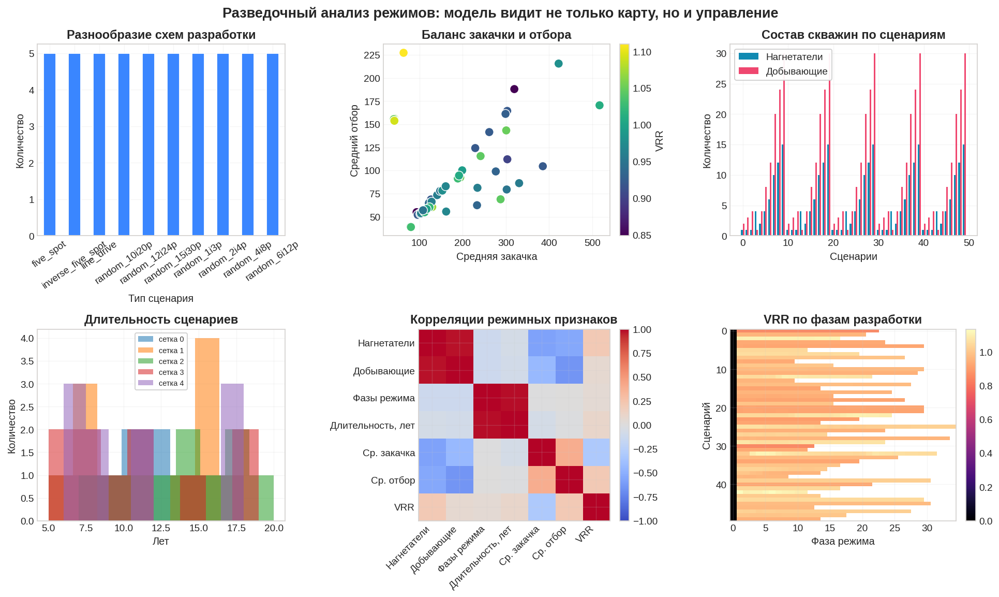

In [ ]:
# Rich scenario analytics: controls and scenario families.
def _scenario_kind_from_name(name):
    parts = str(name).split('__')
    return parts[-1].split('_', 1)[1] if len(parts) > 1 and '_' in parts[-1] else parts[-1]

def plot_npz_regressor_analytics(npz_path):
    npz_path = Path(npz_path)
    if not npz_path.exists():
        print('Active NPZ еще не найден; регрессорная аналитика будет построена после загрузки датасета.')
        return None
    st = npz_integrity(npz_path) if 'npz_integrity' in globals() else {'npz_ok': zipfile.is_zipfile(npz_path), 'message': 'zip check only', 'bytes': npz_path.stat().st_size}
    if not st['npz_ok']:
        raise RuntimeError(
            f'Файл {npz_path} не является корректным tash_rich_active_soil.npz: {st["message"]}. '
            f'Сейчас размер {st["bytes"]/1024/1024:.1f} MB, ожидается около 344 MB. '
            'В Colab удалите этот файл из панели Files и загрузите заново, дождитесь окончания загрузки.'
        )
    with np.load(npz_path, allow_pickle=True) as z:
        if 'scenario_features' not in z:
            print('В NPZ нет scenario_features; пропускаю аналитику режимов.')
            return None
        sf = z['scenario_features'].astype(float)
        names = np.asarray(z['scenario_names']).astype(str)
        sg = z['scenario_group'].astype(int) if 'scenario_group' in z else np.zeros(sf.shape[0], int)
        phase = z['phase_controls'].astype(float) if 'phase_controls' in z else np.zeros((sf.shape[0], 1, 0))
        pm = z['phase_mask'].astype(bool) if 'phase_mask' in z else np.zeros(phase.shape[:2], bool)
        rows = []
        for i, name in enumerate(names):
            row = {'Сценарий': name, 'Сетка': int(sg[i]), 'Тип': _scenario_kind_from_name(name)}
            for j, feat in enumerate(SCENARIO_FEATURES[:sf.shape[1]]):
                row[SCENARIO_FEATURES_RU.get(feat, feat)] = sf[i, j]
            rows.append(row)
    df = show_table(rows, max_rows=12, caption='Паспорт сценариев и режимных регрессоров из NPZ', precision=3)
    if pd is None: return df
    fig = plt.figure(figsize=(15, 9)); gs = fig.add_gridspec(2, 3)
    ax = fig.add_subplot(gs[0,0]); df['Тип'].value_counts().sort_index().plot(kind='bar', ax=ax, color='#3a86ff', edgecolor='white'); ax.set_title('Разнообразие схем разработки'); ax.set_xlabel('Тип сценария'); ax.set_ylabel('Количество'); ax.tick_params(axis='x', rotation=35)
    ax = fig.add_subplot(gs[0,1]); sc = ax.scatter(df['Ср. закачка'], df['Ср. отбор'], c=df['VRR'], cmap='viridis', s=90, edgecolor='white', linewidth=.8); ax.set_title('Баланс закачки и отбора'); ax.set_xlabel('Средняя закачка'); ax.set_ylabel('Средний отбор'); fig.colorbar(sc, ax=ax, fraction=.046, pad=.04).set_label('VRR')
    ax = fig.add_subplot(gs[0,2]); x = np.arange(len(df)); small = df.sort_values(['Сетка','Скважины']).reset_index(drop=True); ax.bar(x-.18, small['Нагнетатели'], .36, label='Нагнетатели', color='#118ab2'); ax.bar(x+.18, small['Добывающие'], .36, label='Добывающие', color='#ef476f'); ax.set_title('Состав скважин по сценариям'); ax.set_xlabel('Сценарии'); ax.set_ylabel('Количество'); ax.legend()
    ax = fig.add_subplot(gs[1,0])
    for g, grp in df.groupby('Сетка'): ax.hist(grp['Длительность, лет'], bins=8, alpha=.55, label=f'сетка {g}')
    ax.set_title('Длительность сценариев'); ax.set_xlabel('Лет'); ax.set_ylabel('Количество'); ax.legend(fontsize=8)
    ax = fig.add_subplot(gs[1,1]); cols = ['Нагнетатели','Добывающие','Фазы режима','Длительность, лет','Ср. закачка','Ср. отбор','VRR']; corr = df[cols].corr(numeric_only=True); im = ax.imshow(corr, cmap='coolwarm', vmin=-1, vmax=1); ax.set_xticks(range(len(cols))); ax.set_yticks(range(len(cols))); ax.set_xticklabels(cols, rotation=45, ha='right'); ax.set_yticklabels(cols); ax.set_title('Корреляции режимных признаков'); fig.colorbar(im, ax=ax, fraction=.046, pad=.04)
    ax = fig.add_subplot(gs[1,2])
    if phase.shape[-1] > 0:
        valid = np.where(pm, phase[...,8] if phase.shape[-1] > 8 else phase[...,-1], np.nan); im = ax.imshow(valid, aspect='auto', cmap='magma'); ax.set_title('VRR по фазам разработки'); ax.set_xlabel('Фаза режима'); ax.set_ylabel('Сценарий'); fig.colorbar(im, ax=ax, fraction=.046, pad=.04)
    else:
        ax.text(.5,.5,'Фазовые режимы отсутствуют',ha='center',va='center'); ax.axis('off')
    fig.suptitle('Разведочный анализ режимов: модель видит не только карту, но и управление', fontsize=15, weight='bold'); plt.tight_layout(); plt.show()
    return df

if RICH_REGRESSORS:
    rows = []
    for name, spec in RICH_REGRESSORS.items():
        scen = spec['scenario_features']
        rows.append({'Сценарий':name,'Тип':spec.get('kind',''),'Pattern':spec.get('pattern',''),'Нагнетатели':float(scen[0]),'Добывающие':float(scen[1]),'Длительность, лет':float(scen[4]),'Ср. закачка':float(scen[6]),'Ср. отбор':float(scen[9]),'VRR':float(scen[16])})
    rich_df = show_table(rows, max_rows=12, caption='Режимы из raw CSV', precision=3)
else:
    print('Raw CSV рядом с блокнотом не найдены; строю аналитику режимов из загруженного active NPZ.')
    rich_df = plot_npz_regressor_analytics(TASH_ACTIVE_NPZ_PATH)


## 2.1 Готовый trainable NPZ

Конвертация уже выполнена заранее. В pipeline сразу используется `active_tnavigator_multigrid_v2` из архива; повторная обработка simulator-файлов отключена.


In [ ]:
print('CONVERSION_SKIPPED: готовый tash_rich_active_soil.npz уже извлечен из архива.')


CONVERSION_SKIPPED: готовый tash_rich_active_soil.npz уже извлечен из архива.


## 3. Dataset и condition builder

Dataset восстанавливает 2D-слои из active-cell представления и формирует единый condition для всех моделей: стартовая SOIL-карта, ACTNUM, статические поля, пространственные карты скважин, режимные регрессоры, горизонт и номер слоя.


In [ ]:
def norm01_to_n11(x): return (np.clip(x, 0, 1) * 2 - 1).astype(np.float32)
def denorm_n11_to01(x): return np.clip((x + 1) * 0.5, 0, 1).astype(np.float32)

def normalize_arr(arr, name=''):
    arr = np.asarray(arr, dtype=np.float32)
    valid = np.isfinite(arr)
    if name.lower().startswith('perm'):
        arr = np.where(valid & (arr > 0), np.log10(arr + 1e-6), np.nan).astype(np.float32); valid = np.isfinite(arr)
    if not np.any(valid): return np.zeros_like(arr, dtype=np.float32)
    lo, hi = np.nanquantile(arr[valid], [0.01, 0.99])
    if hi - lo < 1e-8: return np.zeros_like(arr, dtype=np.float32)
    return ((np.clip(arr, lo, hi) - lo) / (hi - lo) * 2 - 1).astype(np.float32)

def fourier_scalar(v, n_freq=8):
    freqs = 2.0 ** np.arange(n_freq, dtype=np.float32); a = 2 * np.pi * float(v) * freqs
    return np.concatenate([np.sin(a), np.cos(a)]).astype(np.float32)

def encode_scalar(v, encoding='embed', n_freq=8, onehot_size=None):
    if encoding == 'scalar': return np.array([float(v)], dtype=np.float32)
    if encoding == 'embed': return fourier_scalar(v, n_freq)
    out = np.zeros(int(onehot_size), dtype=np.float32); out[int(np.clip(round(float(v)*(onehot_size-1)),0,onehot_size-1))]=1; return out

def build_temporal_pairs(base_times, target_times, T, pair_stride=1, max_pairs_per_base=None):
    """Build multi-horizon pairs. max_delta_steps is not a filter anymore.
    The model sees short, medium and long transitions inside the scenario history.
    """
    valid_base = sorted({int(t) for t in base_times if 0 <= int(t) < max(0, T-1)})
    valid_target = sorted({int(t) for t in target_times if 0 < int(t) < T})
    pairs = []
    for t in valid_base:
        targets = [t2 for t2 in valid_target if t < t2]
        if pair_stride and int(pair_stride) > 1:
            targets = targets[::int(pair_stride)]
        if max_pairs_per_base is not None and len(targets) > int(max_pairs_per_base):
            # Keep first, middle and final horizons instead of only local neighbors.
            idx = np.linspace(0, len(targets)-1, int(max_pairs_per_base)).round().astype(int)
            targets = [targets[i] for i in np.unique(idx)]
        pairs.extend((t, t2) for t2 in targets)
    return pairs

@dataclass(frozen=True)
class ConditionSpec:
    static_channels:int=0; map_channels:int=0; control_channels:int=0; delta_channels:int=16; z_channels:int=8
    @property
    def total(self): return 2 + self.static_channels + self.map_channels + self.control_channels + self.delta_channels + self.z_channels

class ForecastNPZDataset(Dataset):
    def __init__(self, path, base_times, target_times, static_fields=(), control_fields=(), optional_map_fields=(), target_mode='delta', max_delta_steps=8, dS_clip=0.1):
        self.path=Path(path); z=np.load(self.path); sat=z['saturations'].astype(np.float32); self.raw=sat[:,None] if sat.ndim==3 else sat
        self.sat=np.nan_to_num(self.raw, nan=0.0).astype(np.float32); self.times=z['times'].astype(np.float32) if 'times' in z else np.arange(self.sat.shape[0], dtype=np.float32)
        self.act=z['actnum_mask'].astype(bool) if 'actnum_mask' in z else np.isfinite(self.raw[0]); self.act=self.act[None] if self.act.ndim==2 else self.act
        self.target_mode=target_mode; self.max_delta_steps=int(max_delta_steps); self.dS_clip=float(dS_clip); self.horizon_days_scale=365.25*max(1,self.max_delta_steps); T,Z,H,W=self.sat.shape
        self.static=[]
        for name in static_fields:
            if name not in z: raise KeyError(f'missing static field {name} in {path}')
            a=z[name].astype(np.float32)
            if a.ndim==1: a=np.broadcast_to(a[:,None,None], (Z,H,W))
            if a.ndim==2: a=np.broadcast_to(a[None], (Z,H,W))
            self.static.append(normalize_arr(a, name))
        self.static=np.stack(self.static, axis=1).astype(np.float32) if self.static else None
        self.controls=[]
        for name in control_fields:
            if name not in z: raise KeyError(f'missing control field {name} in {path}')
            a=np.asarray(z[name], dtype=np.float32)
            if a.ndim==0: a=a.reshape(1,1)
            elif a.ndim==1: a=a[:,None] if a.shape[0]==T else a.reshape(1,-1)
            self.controls.append(normalize_arr(a, name))
        self.maps=[]
        for name in optional_map_fields:
            if name not in z: continue
            a=np.asarray(z[name], dtype=np.float32)
            if a.ndim==5: self.maps.append(normalize_arr(a, name))
        self.maps=np.concatenate(self.maps, axis=1).astype(np.float32) if self.maps else None
        self.samples=[]
        for t,t2 in build_temporal_pairs(base_times, target_times, T, pair_stride=globals().get('TRAIN_PAIR_STRIDE', 1), max_pairs_per_base=globals().get('MAX_TARGETS_PER_BASE', None)):
            for zz in range(Z): self.samples.append((t,t2,zz))
        if not self.samples: raise ValueError(f'no samples for {path}')
    @property
    def layers(self): return self.sat.shape[1]
    @property
    def image_shape(self): return self.sat.shape[-2:]
    @property
    def static_channels(self): return 0 if self.static is None else self.static.shape[1]
    @property
    def control_channels(self): return sum(a.shape[1] for a in self.controls)
    @property
    def map_channels(self): return 0 if self.maps is None else self.maps.shape[1]
    def __len__(self): return len(self.samples)
    def _window(self,t,t2): return slice(min(t+1,t2), max(min(t+1,t2)+1,t2+1))
    def __getitem__(self,i):
        t,t2,z=self.samples[i]; base=self.sat[t,z]; target=self.sat[t2,z]; mask=(self.act[z] & np.isfinite(self.raw[t,z]) & np.isfinite(self.raw[t2,z])).astype(np.float32)
        y = norm01_to_n11(target) if self.target_mode=='state' else np.clip((target-base)/max(self.dS_clip,1e-8), -1, 1).astype(np.float32)
        ctrl=[]; win=self._window(t,t2)
        for a in self.controls: ctrl.append(np.nanmean(a[win], axis=0) if a.shape[0]==self.sat.shape[0] else a.reshape(-1))
        maps=np.zeros((0,*base.shape), dtype=np.float32) if self.maps is None else np.nanmean(self.maps[win,:,z], axis=0).astype(np.float32)
        delta_days=float(self.times[t2]-self.times[t]) if hasattr(self,'times') else float(t2-t)*365.25
        delta_days_norm=delta_days/max(1.0,float(getattr(self,'horizon_days_scale',365.25*max(1,self.max_delta_steps))))
        return {'base':torch.from_numpy(norm01_to_n11(base))[None], 'target':torch.from_numpy(y)[None], 'mask':torch.from_numpy(mask)[None], 'static':torch.from_numpy(self.static[z]) if self.static is not None else torch.zeros((0,*base.shape)), 'control':torch.from_numpy(np.concatenate(ctrl).astype(np.float32) if ctrl else np.zeros((0,),np.float32)), 'maps':torch.from_numpy(maps), 'delta_norm':torch.tensor([(t2-t)/max(1,self.max_delta_steps)], dtype=torch.float32), 'delta_days_norm':torch.tensor([delta_days_norm], dtype=torch.float32), 'z_norm':torch.tensor([z/max(1,self.layers-1)], dtype=torch.float32)}



class ForecastActiveNPZDataset(Dataset):
    def __init__(self, path, base_times, target_times, target_mode='delta', max_delta_steps=8, dS_clip=0.1, grid_group=0, cache_size=3, scenario_filter=None):
        self.path=Path(path); self.z=np.load(self.path); self.target_mode=target_mode; self.max_delta_steps=int(max_delta_steps); self.dS_clip=float(dS_clip); self.horizon_days_scale=365.25*max(1,self.max_delta_steps); self.cache_size=int(cache_size); self.cache={}; self.well_cache={}; self.static_layer_cache={}
        self.scenario_names=[str(x) for x in self.z['scenario_names']]
        if 'scenario_group' in self.z:
            self.scenario_group=self.z['scenario_group'].astype(np.int32); self.grid_group=int(grid_group)
            self.scenario_indices=[int(i) for i,g in enumerate(self.scenario_group) if int(g)==self.grid_group]
            self.act=self.z[f'actnum_mask_g{self.grid_group}'].astype(bool); self.grid_shape=tuple(map(int,self.z[f'grid_shape_g{self.grid_group}']))
        else:
            self.grid_group=0; self.scenario_group=np.zeros(len(self.scenario_names),dtype=np.int32); self.scenario_indices=list(range(len(self.scenario_names)))
            self.act=self.z['actnum_mask'].astype(bool); self.grid_shape=tuple(map(int,self.z['grid_shape']))
        if scenario_filter is not None:
            allowed=set(map(int, scenario_filter)); self.scenario_indices=[i for i in self.scenario_indices if i in allowed]
        if not self.scenario_indices: raise ValueError(f'no scenarios for grid_group={self.grid_group}')
        self.layers,self.H,self.W=self.grid_shape; self.active_flat=np.flatnonzero(self.act.reshape(-1)); self.layer_active_idx=[]; self.layer_flat_idx=[]
        for zz in range(self.layers):
            start=zz*self.H*self.W; end=(zz+1)*self.H*self.W; idx=np.where((self.active_flat>=start)&(self.active_flat<end))[0]
            self.layer_active_idx.append(idx.astype(np.int64)); self.layer_flat_idx.append((self.active_flat[idx]-start).astype(np.int64))
        self.scenario_features=normalize_arr(self.z['scenario_features'],'scenario_features') if 'scenario_features' in self.z else np.zeros((len(self.scenario_names),0),np.float32)
        self.phase_controls=normalize_arr(self.z['phase_controls'],'phase_controls') if 'phase_controls' in self.z else np.zeros((len(self.scenario_names),1,0),np.float32)
        self.phase_mask=self.z['phase_mask'].astype(np.float32) if 'phase_mask' in self.z else np.zeros(self.phase_controls.shape[:2],np.float32)
        self.well_summary=normalize_arr(self.z['well_summary'],'well_summary') if 'well_summary' in self.z else np.zeros((len(self.scenario_names),0),np.float32)

        # Static active vectors are stored once per grid group: PORO, NTG, PERMX/PERMY/PERMZ, SWATINIT.
        self.static_names=[]
        self.static_active=[]
        for key in self.z.files:
            prefix=f'static_active_g{self.grid_group}_'
            if key.startswith(prefix):
                name=key[len(prefix):]
                arr=np.asarray(self.z[key],dtype=np.float32)
                self.static_names.append(name)
                self.static_active.append(normalize_arr(arr, name).reshape(-1))
        if self.static_active:
            order=np.argsort(self.static_names)
            self.static_names=[self.static_names[i] for i in order]
            self.static_active=np.stack([self.static_active[i] for i in order]).astype(np.float32)
        else:
            self.static_active=np.zeros((0,len(self.active_flat)),np.float32)

        self.well_map_channel_names=[str(x) for x in self.z['well_map_channel_names']] if 'well_map_channel_names' in self.z else []
        self.has_well_maps=any(f'well_maps_active_{s:03d}' in self.z.files for s in self.scenario_indices)
        self.samples=[]
        for s in self.scenario_indices:
            T=len(self.z[f'times_{s:03d}'])
            for t,t2 in build_temporal_pairs(base_times, target_times, T, pair_stride=globals().get('TRAIN_PAIR_STRIDE', 1), max_pairs_per_base=globals().get('MAX_TARGETS_PER_BASE', None)):
                for zz in range(self.layers): self.samples.append((s,t,t2,zz))
        if not self.samples: raise ValueError(f'no active samples for {path}, grid_group={self.grid_group}')
    @property
    def image_shape(self): return (self.H,self.W)
    @property
    def static_channels(self): return int(self.static_active.shape[0])
    @property
    def map_channels(self): return int(len(self.well_map_channel_names)) if self.has_well_maps else 0
    @property
    def control_channels(self): return self.scenario_features.shape[1]+self.phase_controls.shape[2]+self.well_summary.shape[1]
    def __len__(self): return len(self.samples)
    def __getstate__(self):
        state = self.__dict__.copy()
        state['z'] = None
        state['cache'] = {}
        state['well_cache'] = {}
        state['static_layer_cache'] = {}
        return state
    def __setstate__(self, state):
        self.__dict__.update(state)
    def _ensure_npz(self):
        if self.z is None:
            self.z = np.load(self.path, allow_pickle=True)
    def _soil(self,s):
        self._ensure_npz()
        if s not in self.cache:
            if len(self.cache)>=self.cache_size: self.cache.pop(next(iter(self.cache)))
            self.cache[s]=self.z[f'soil_active_{s:03d}'].astype(np.float32)
        return self.cache[s]
    def _well_active(self,s):
        self._ensure_npz()
        if not self.has_well_maps or f'well_maps_active_{s:03d}' not in self.z.files:
            return np.zeros((0,len(self.active_flat)),np.float32)
        if s not in self.well_cache:
            if len(self.well_cache)>=self.cache_size: self.well_cache.pop(next(iter(self.well_cache)))
            arr=np.asarray(self.z[f'well_maps_active_{s:03d}'],dtype=np.float32)
            names=self.well_map_channel_names or [f'well_map_{i}' for i in range(arr.shape[0])]
            norm=[]
            for ch,name in enumerate(names):
                raw=arr[ch].reshape(-1)
                norm.append(raw.astype(np.float32) if name.endswith('binary') else normalize_arr(raw, name).reshape(-1))
            self.well_cache[s]=np.stack(norm).astype(np.float32) if norm else np.zeros((0,len(self.active_flat)),np.float32)
        return self.well_cache[s]
    def _active_channels_to_layer(self, active_channels, z):
        c=active_channels.shape[0]
        if c==0: return np.zeros((0,self.H,self.W),np.float32)
        out=np.zeros((c,self.H*self.W),np.float32); idx=self.layer_active_idx[z]
        if len(idx): out[:,self.layer_flat_idx[z]]=active_channels[:,idx]
        return out.reshape(c,self.H,self.W)
    def _static_layer(self,z):
        if z not in self.static_layer_cache:
            if len(self.static_layer_cache)>min(self.layers,16): self.static_layer_cache.pop(next(iter(self.static_layer_cache)))
            self.static_layer_cache[z]=self._active_channels_to_layer(self.static_active,z)
        return self.static_layer_cache[z]
    def _soil_layer(self,s,t,z):
        vals=self._soil(s)[t]; out=np.zeros((self.H*self.W,),np.float32); idx=self.layer_active_idx[z]; out[self.layer_flat_idx[z]]=vals[idx]; return out.reshape(self.H,self.W)
    def _layer(self,s,t,z):
        return self._soil_layer(s,t,z)
    def _control(self,s):
        parts=[]
        if self.scenario_features.shape[1]: parts.append(self.scenario_features[s].reshape(-1))
        if self.phase_controls.shape[2]:
            m=self.phase_mask[s]>0.5; ph=self.phase_controls[s,m].mean(axis=0) if np.any(m) else np.zeros((self.phase_controls.shape[2],),np.float32); parts.append(ph.reshape(-1))
        if self.well_summary.shape[1]: parts.append(self.well_summary[s].reshape(-1))
        return np.concatenate(parts).astype(np.float32) if parts else np.zeros((0,),np.float32)
    def __getitem__(self,i):
        s,t,t2,z=self.samples[i]; base=self._soil_layer(s,t,z); target=self._soil_layer(s,t2,z); mask=self.act[z].astype(np.float32)
        y=norm01_to_n11(target) if self.target_mode=='state' else np.clip((target-base)/max(self.dS_clip,1e-8),-1,1).astype(np.float32)
        static=self._static_layer(z)
        maps=self._active_channels_to_layer(self._well_active(s),z)
        times=np.asarray(self.z[f'times_{s:03d}'],dtype=np.float32)
        delta_days=float(times[t2]-times[t])
        delta_days_norm=delta_days/max(1.0,float(getattr(self,'horizon_days_scale',365.25*max(1,self.max_delta_steps))))
        return {'base':torch.from_numpy(norm01_to_n11(base))[None], 'target':torch.from_numpy(y)[None], 'mask':torch.from_numpy(mask)[None], 'static':torch.from_numpy(static), 'control':torch.from_numpy(self._control(s)), 'maps':torch.from_numpy(maps), 'delta_norm':torch.tensor([(t2-t)/max(1,self.max_delta_steps)], dtype=torch.float32), 'delta_days_norm':torch.tensor([delta_days_norm], dtype=torch.float32), 'z_norm':torch.tensor([z/max(1,self.layers-1)], dtype=torch.float32)}

def make_forecast_dataset(path, item, base_times, target_times, max_delta_steps, dS_clip, grid_group=None, scenario_filter=None):
    if item.get('kind') == 'active_trainable_npz':
        gg = item.get('grid_group', 0) if grid_group is None else grid_group
        if gg == 'all': gg = 0
        return ForecastActiveNPZDataset(path, base_times, target_times, max_delta_steps=max_delta_steps, dS_clip=dS_clip, grid_group=int(gg), scenario_filter=scenario_filter)
    return ForecastNPZDataset(path, base_times, target_times, item.get('static_fields',[]), item.get('control_fields',[]), item.get('optional_map_fields',[]), max_delta_steps=max_delta_steps, dS_clip=dS_clip)

def active_grid_groups(path, item):
    if item.get('kind') != 'active_trainable_npz': return [None]
    z=np.load(path); n=int(z['n_grid_groups'][0]) if 'n_grid_groups' in z else 1; gg=item.get('grid_group','all')
    return list(range(n)) if gg == 'all' else [int(gg)]

def make_condition(batch, delta_encoding='embed', delta_freqs=8, z_encoding='embed', z_freqs=4, max_delta_steps=8, layers=1, device=DEVICE):
    mask=batch['mask'].to(device); base=batch['base'].to(device); H,W=mask.shape[-2:]
    parts=[mask, base]
    if batch['static'].shape[1]>0: parts.append(batch['static'].to(device))
    if batch['maps'].shape[1]>0: parts.append(batch['maps'].to(device))
    if batch['control'].shape[1]>0: parts.append(batch['control'].to(device)[:,:,None,None].expand(-1,-1,H,W))
    # Две разные временные координаты:
    # 1) delta_norm - дискретная дистанция между snapshot;
    # 2) delta_days_norm - физическая длительность интервала в днях, нормированная на train horizon.
    d_idx=[]; d_days=[]; zz=[]
    delta_days_tensor = batch.get('delta_days_norm', batch['delta_norm'])
    for v,dv,zv in zip(batch['delta_norm'].view(-1), delta_days_tensor.view(-1), batch['z_norm'].view(-1)):
        d_idx.append(torch.from_numpy(encode_scalar(float(v), delta_encoding, delta_freqs, max_delta_steps)))
        d_days.append(torch.from_numpy(encode_scalar(float(dv), delta_encoding, delta_freqs, max_delta_steps)))
        zz.append(torch.from_numpy(encode_scalar(float(zv), z_encoding, z_freqs, layers)))
    parts.append(torch.stack(d_idx).to(device)[:,:,None,None].expand(-1,-1,H,W))
    parts.append(torch.stack(d_days).to(device)[:,:,None,None].expand(-1,-1,H,W))
    parts.append(torch.stack(zz).to(device)[:,:,None,None].expand(-1,-1,H,W))
    return torch.cat(parts, dim=1)


## 4. Модели: baseline, neural operator, pixel diffusion и latent diffusion

В этом блоке задается модельный zoo. Логика профессионального прототипа такая: диффузионная модель должна быть не единственным результатом, а частью сравнения с сильными baseline-подходами.

Используются модели:

- `Persistence`: простейшая нижняя граница, карта не меняется;
- `Deterministic U-Net`: сверточная supervised-модель для прогноза среднего изменения карты;
- `FNO2d`: Fourier Neural Operator baseline, полезный для полевых PDE-like зависимостей и суррогатного моделирования;
- `GaussianDiffusion` + `SimpleUNet`: условная pixel diffusion по карте изменения насыщенности;
- `SpatialVAE2D` + latent diffusion: диффузия в компактной пространственной латентной сетке.

Зачем так сложно: если диффузия дает красивый ансамбль, но проигрывает FNO/U-Net по RMSE и дает слишком широкий p10-p90, это надо увидеть честно. Поэтому архитектура сразу строится вокруг сравнения качества, неопределенности и физической адекватности.


### Архитектурная критика и выбранная логика

Главная опасность проекта: получить генеративную модель, которая визуально красиво меняет карту, но слабо связана с физикой разработки. Поэтому пайплайн усиливается тремя принципами.

Первый принцип: condition должен быть богатым. Модель получает не только базовую карту насыщенности, но и active mask, static-свойства, слой, горизонт прогноза, режимные признаки и, после conversion, карты/агрегаты скважин.

Второй принцип: диффузия сравнивается с сильными baseline-моделями. U-Net проверяет, насколько хорошо работает обычный supervised forecast. FNO проверяет neural-operator подход для полевых зависимостей. MC/LHS показывают, насколько далеко ушел нейросетевой ансамбль от простой статистики дельт.

Третий принцип: p10/p50/p90 нельзя оценивать только по попаданию. Высокий coverage может быть следствием слишком широкого интервала. Поэтому рядом считаются RMSE, CRPS, spread, calibration curve, sharpness и физические диагностики карты.

Итоговая логика: диффузия полезна не потому, что “умеет фантазировать”, а только если ее ансамбль лучше калиброван, информативнее и физически правдоподобнее baseline-подходов.


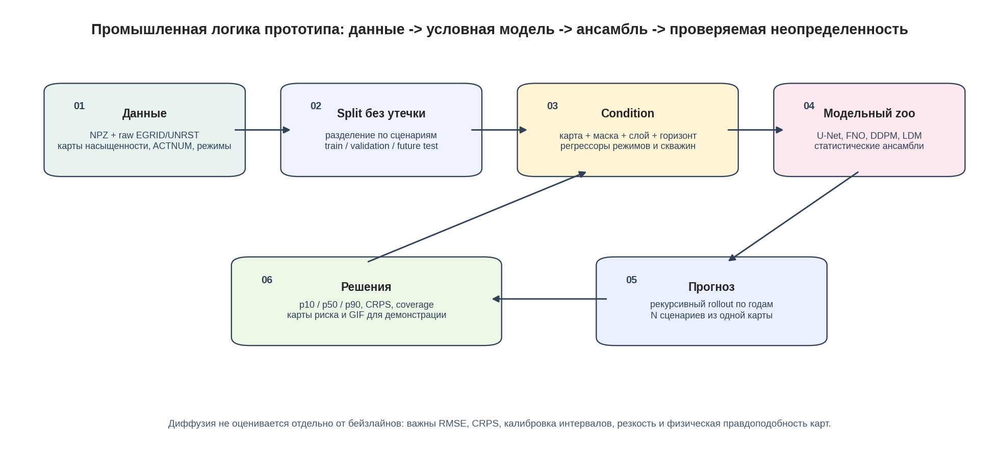

In [ ]:
def plot_pipeline_architecture():
    fig, ax = plt.subplots(figsize=(15.5, 7.2)); ax.set_xlim(0,1); ax.set_ylim(0,1); ax.axis('off')
    boxes = [
        ('01','Данные','NPZ + raw EGRID/UNRST\nкарты насыщенности, ACTNUM, режимы',.05,.64,.18,.18,'#e8f3f1'),
        ('02','Split без утечки','разделение по сценариям\ntrain / validation / future test',.29,.64,.18,.18,'#eef2ff'),
        ('03','Condition','карта + маска + слой + горизонт\nрегрессоры режимов и скважин',.53,.64,.20,.18,'#fff4d6'),
        ('04','Модельный zoo','U-Net, FNO, DDPM, LDM\nстатистические ансамбли',.79,.64,.17,.18,'#fde8ef'),
        ('05','Прогноз','рекурсивный rollout по годам\nN сценариев из одной карты',.61,.27,.21,.17,'#eaf0ff'),
        ('06','Решения','p10 / p50 / p90, CRPS, coverage\nкарты риска и GIF для демонстрации',.24,.27,.25,.17,'#edf7e8'),
    ]
    for num,title,body,x,y,w,h,color in boxes:
        ax.add_patch(FancyBboxPatch((x,y),w,h,boxstyle='round,pad=0.012,rounding_size=0.018',fc=color,ec='#334155',lw=1.3))
        ax.text(x+.018,y+h-.045,num,fontsize=11,weight='bold',color='#334155')
        ax.text(x+w/2,y+h-.055,title,ha='center',va='center',fontsize=12.5,weight='bold')
        ax.text(x+w/2,y+.065,body,ha='center',va='center',fontsize=10,color='#334155',linespacing=1.25)
    for start,end in [((.23,.73),(.29,.73)),((.47,.73),(.53,.73)),((.73,.73),(.79,.73)),((.865,.64),(.73,.44)),((.61,.36),(.49,.36)),((.365,.44),(.59,.64))]:
        ax.add_patch(FancyArrowPatch(start,end,arrowstyle='-|>',mutation_scale=15,lw=1.6,color='#334155'))
    ax.text(.5,.94,'Промышленная логика прототипа: данные -> условная модель -> ансамбль -> проверяемая неопределенность',ha='center',fontsize=16,weight='bold')
    ax.text(.5,.08,'Диффузия не оценивается отдельно от бейзлайнов: важны RMSE, CRPS, калибровка интервалов, резкость и физическая правдоподобность карт.',ha='center',fontsize=10.5,color='#475569')
    plt.tight_layout(); return fig
plot_pipeline_architecture(); plt.show()


In [ ]:
def timestep_embedding(t, dim):
    half=dim//2; freqs=torch.exp(-math.log(10000)*torch.arange(half,device=t.device).float()/max(1,half-1)); a=t[:,None].float()*freqs[None]
    emb=torch.cat([torch.sin(a), torch.cos(a)], -1); return F.pad(emb,(0,dim-emb.shape[1])) if emb.shape[1]<dim else emb

class ConvBlock(nn.Module):
    def __init__(self, ci, co): super().__init__(); self.net=nn.Sequential(nn.Conv2d(ci,co,3,padding=1), nn.GroupNorm(min(8,co),co), nn.SiLU(), nn.Conv2d(co,co,3,padding=1), nn.GroupNorm(min(8,co),co), nn.SiLU())
    def forward(self,x): return self.net(x)
class Down(nn.Module):
    def __init__(self,ci,co): super().__init__(); self.net=nn.Sequential(nn.MaxPool2d(2),ConvBlock(ci,co))
    def forward(self,x): return self.net(x)
class Up(nn.Module):
    def __init__(self,ci,skip,co): super().__init__(); self.up=nn.ConvTranspose2d(ci,co,2,2); self.conv=ConvBlock(co+skip,co)
    def forward(self,x,s):
        x=self.up(x); dy=s.size(2)-x.size(2); dx=s.size(3)-x.size(3); x=F.pad(x,[dx//2,dx-dx//2,dy//2,dy-dy//2]) if (dx or dy) else x; return self.conv(torch.cat([s,x],1))

class SimpleUNet(nn.Module):
    def __init__(self,target_channels,cond_channels,base_channels=32,time_dim=128):
        super().__init__(); self.target_channels=target_channels; c=base_channels; self.temb=nn.Sequential(nn.Linear(time_dim,time_dim),nn.SiLU(),nn.Linear(time_dim,c)); self.time_dim=time_dim
        self.inc=ConvBlock(target_channels+cond_channels,c); self.d1=Down(c,2*c); self.d2=Down(2*c,4*c); self.mid=ConvBlock(4*c,4*c); self.u1=Up(4*c,2*c,2*c); self.u2=Up(2*c,c,c); self.out=nn.Conv2d(c,target_channels,1)
    def forward(self,x,cond,t):
        h=torch.cat([x,cond],1); x1=self.inc(h)+self.temb(timestep_embedding(t,self.time_dim))[:,:,None,None]; x2=self.d1(x1); x3=self.mid(self.d2(x2)); return self.out(self.u2(self.u1(x3,x2),x1))

class DeterministicUNet(nn.Module):
    def __init__(self,cond_channels,out_channels=1,base_channels=32): super().__init__(); self.net=SimpleUNet(out_channels,cond_channels,base_channels)
    def forward(self,cond): return self.net(torch.zeros((cond.shape[0],1,*cond.shape[-2:]),device=cond.device), cond, torch.zeros(cond.shape[0],device=cond.device,dtype=torch.long))


class SpectralConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, modes1=12, modes2=12):
        super().__init__(); self.in_channels=in_channels; self.out_channels=out_channels; self.modes1=int(modes1); self.modes2=int(modes2)
        scale = 1.0 / max(1, in_channels*out_channels)
        self.weights1 = nn.Parameter(scale * torch.randn(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
        self.weights2 = nn.Parameter(scale * torch.randn(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
    def compl_mul2d(self, x, weights):
        return torch.einsum('bixy,ioxy->boxy', x, weights)
    def forward(self, x):
        b, _, h, w = x.shape; x_ft = torch.fft.rfft2(x)
        out_ft = torch.zeros(b, self.out_channels, h, w//2 + 1, dtype=torch.cfloat, device=x.device)
        m1 = min(self.modes1, h); m2 = min(self.modes2, w//2 + 1)
        out_ft[:, :, :m1, :m2] = self.compl_mul2d(x_ft[:, :, :m1, :m2], self.weights1[:, :, :m1, :m2])
        out_ft[:, :, -m1:, :m2] = self.compl_mul2d(x_ft[:, :, -m1:, :m2], self.weights2[:, :, :m1, :m2])
        return torch.fft.irfft2(out_ft, s=(h, w))

class FNO2d(nn.Module):
    def __init__(self, cond_channels, out_channels=1, width=48, modes=12, depth=4):
        super().__init__(); self.width=width
        self.lift = nn.Conv2d(cond_channels + 2, width, 1)
        self.spectral = nn.ModuleList([SpectralConv2d(width, width, modes, modes) for _ in range(depth)])
        self.local = nn.ModuleList([nn.Conv2d(width, width, 1) for _ in range(depth)])
        self.norms = nn.ModuleList([nn.GroupNorm(8, width) for _ in range(depth)])
        self.head = nn.Sequential(nn.Conv2d(width, width, 1), nn.GELU(), nn.Conv2d(width, out_channels, 1))
    def grid(self, x):
        b, _, h, w = x.shape
        yy = torch.linspace(0, 1, h, device=x.device).view(1, 1, h, 1).expand(b, 1, h, w)
        xx = torch.linspace(0, 1, w, device=x.device).view(1, 1, 1, w).expand(b, 1, h, w)
        return torch.cat([xx, yy], dim=1)
    def forward(self, cond):
        x = self.lift(torch.cat([cond, self.grid(cond)], dim=1))
        for spec, loc, norm in zip(self.spectral, self.local, self.norms):
            x = F.gelu(norm(spec(x) + loc(x)))
        return self.head(x)

class GaussianDiffusion(nn.Module):
    def __init__(self,model,timesteps=200,beta_start=1e-4,beta_end=0.02):
        super().__init__(); self.model=model; self.timesteps=int(timesteps); self.out_channels=model.target_channels; b=torch.linspace(beta_start,beta_end,self.timesteps); a=1-b; ac=torch.cumprod(a,0); acp=torch.cat([torch.ones(1),ac[:-1]])
        for n,v in {'betas':b,'alphas':a,'alphas_cumprod':ac,'sqrt_ac':torch.sqrt(ac),'sqrt_om':torch.sqrt(1-ac),'post_var':b*(1-acp)/(1-ac),'coef1':b*torch.sqrt(acp)/(1-ac),'coef2':(1-acp)*torch.sqrt(a)/(1-ac)}.items(): self.register_buffer(n,v)
    def ext(self,v,t,shape): return v.gather(0,t).view(t.shape[0],*([1]*(len(shape)-1)))
    def q_sample(self,x,t,noise): return self.ext(self.sqrt_ac,t,x.shape)*x + self.ext(self.sqrt_om,t,x.shape)*noise
    def training_loss(self,x,cond,mask=None):
        t=torch.randint(0,self.timesteps,(x.shape[0],),device=x.device); noise=torch.randn_like(x); pred=self.model(self.q_sample(x,t,noise),cond,t); loss=(pred-noise)**2
        return (loss*mask).sum()/mask.sum().clamp_min(1) if mask is not None else loss.mean()
    @torch.no_grad()
    def sample(self,cond,sampler='ddim',ddim_eta=0.0,clip_denoised=True):
        x=torch.randn((cond.shape[0],self.out_channels,*cond.shape[-2:]),device=cond.device)
        for i in reversed(range(self.timesteps)):
            t=torch.full((cond.shape[0],),i,device=cond.device,dtype=torch.long); eps=self.model(x,cond,t); ac=self.ext(self.alphas_cumprod,t,x.shape); x0=(x-torch.sqrt(1-ac)*eps)/torch.sqrt(ac).clamp_min(1e-8); x0=x0.clamp(-1,1) if clip_denoised else x0
            if sampler=='ddpm':
                mean=self.ext(self.coef1,t,x.shape)*x0+self.ext(self.coef2,t,x.shape)*x; var=self.ext(self.post_var,t,x.shape); x=mean+(t!=0).float().view(x.shape[0],1,1,1)*torch.sqrt(var.clamp_min(1e-20))*torch.randn_like(x)
            else:
                if i==0: x=x0; continue
                tp=torch.full_like(t,i-1); ap=self.ext(self.alphas_cumprod,tp,x.shape); sigma=ddim_eta*torch.sqrt((1-ap)/(1-ac)*(1-ac/ap)).clamp_min(0); x=torch.sqrt(ap)*x0+torch.sqrt((1-ap-sigma**2).clamp_min(0))*eps+sigma*torch.randn_like(x)
        return x

class SpatialVAE2D(nn.Module):
    def __init__(self,in_channels=1,latent_channels=8,hidden=64):
        super().__init__(); self.enc=nn.Sequential(nn.Conv2d(in_channels,hidden,3,padding=1),nn.SiLU(),nn.Conv2d(hidden,hidden*2,4,2,1),nn.GroupNorm(8,hidden*2),nn.SiLU(),nn.Conv2d(hidden*2,hidden*4,4,2,1),nn.GroupNorm(8,hidden*4),nn.SiLU()); self.mu=nn.Conv2d(hidden*4,latent_channels,1); self.lv=nn.Conv2d(hidden*4,latent_channels,1); self.dec=nn.Sequential(nn.Conv2d(latent_channels,hidden*4,3,padding=1),nn.SiLU(),nn.ConvTranspose2d(hidden*4,hidden*2,4,2,1),nn.GroupNorm(8,hidden*2),nn.SiLU(),nn.ConvTranspose2d(hidden*2,hidden,4,2,1),nn.GroupNorm(8,hidden),nn.SiLU(),nn.Conv2d(hidden,in_channels,3,padding=1))
    def encode(self,x): h=self.enc(x); return self.mu(h), self.lv(h).clamp(-12,8)
    def forward(self,x): mu,lv=self.encode(x); z=mu+torch.randn_like(mu)*torch.exp(0.5*lv); out=self.dec(z); out=F.interpolate(out,size=x.shape[-2:],mode='bilinear',align_corners=False) if out.shape[-2:]!=x.shape[-2:] else out; return out,mu,lv

## 5. Метрики, бейзлайны, ансамбли и визуализация

Этот блок содержит общие функции, которые используются в прогнозе, сравнении и демонстрации. Здесь специально собраны метрики и визуализация в одном месте, чтобы не дублировать вычисления ниже.

Что есть внутри:

- `masked_rmse`: ошибка только по активным ячейкам;
- `ensemble_crps`: probabilistic score для ансамбля;
- `coverage`: попадание truth в интервал p10-p90 или другой квантильный интервал;
- `summarize`: p10/p50/p90/mean/std по ансамблю;
- `physical_diagnostics`: масса/средняя насыщенность, delta, total variation и spread;
- `mc_delta_ensemble` и `lhs_delta_ensemble`: статистические ансамбли для честного baseline;
- `rollout`: рекурсивный прогноз по годам;
- plotting-функции для карт, fan chart, GIF, risk maps и demo-dashboard.

Оптимизация: `EnsembleForecast.summary()` кэширует p10/p50/p90/mean/std, чтобы не пересчитывать percentiles при каждом графике. Это важно, когда сценариев и карт становится много.


In [ ]:
def masked_rmse(p,t,m):
    m=m.astype(bool); return float(np.sqrt(np.mean((p[m]-t[m])**2))) if np.any(m) else 0.0
def masked_mae(p,t,m):
    m=m.astype(bool); return float(np.mean(np.abs(p[m]-t[m]))) if np.any(m) else 0.0
def masked_bias(p,t,m):
    m=m.astype(bool); return float(np.mean(p[m]-t[m])) if np.any(m) else 0.0

def _masked_values(a, mask):
    m=np.asarray(mask).astype(bool); return np.asarray(a, dtype=np.float64)[m]

def masked_dynamic_range(true, mask, q=(0.05,0.95)):
    vals=_masked_values(true, mask); vals=vals[np.isfinite(vals)]
    if vals.size == 0: return 1.0
    lo,hi=np.quantile(vals, q); return float(max(hi-lo, 1e-6))

def masked_mape_percent(pred, true, mask):
    p=_masked_values(pred, mask); t=_masked_values(true, mask); ok=np.isfinite(p)&np.isfinite(t)&(np.abs(t)>1e-6)
    return float(np.mean(np.abs((p[ok]-t[ok])/t[ok]))*100) if np.any(ok) else np.nan

def masked_ssim_global(pred, true, mask, data_range=1.0):
    p=_masked_values(pred, mask); t=_masked_values(true, mask); ok=np.isfinite(p)&np.isfinite(t)
    p=p[ok]; t=t[ok]
    if p.size < 2: return np.nan
    dr=max(float(data_range), 1e-6); c1=(0.01*dr)**2; c2=(0.03*dr)**2
    mux, muy = float(p.mean()), float(t.mean())
    vx, vy = float(p.var()), float(t.var())
    cov = float(((p-mux)*(t-muy)).mean())
    denom=(mux*mux+muy*muy+c1)*(vx+vy+c2)
    return float(((2*mux*muy+c1)*(2*cov+c2))/denom) if abs(denom)>1e-12 else np.nan

def masked_psnr_db(pred, true, mask, data_range=1.0):
    rmse=masked_rmse(np.asarray(pred), np.asarray(true), np.asarray(mask))
    if rmse <= 1e-12: return float('inf')
    return float(20*np.log10(max(float(data_range),1e-6)/rmse))

def map_quality_metrics(pred, true, mask, suffix=''):
    rng=masked_dynamic_range(true, mask)
    rmse=masked_rmse(pred,true,mask); mae=masked_mae(pred,true,mask); bias=masked_bias(pred,true,mask)
    suf = f' {suffix}' if suffix else ''
    return {
        f'RMSE{suf}_pp': float(rmse*100),
        f'MAE{suf}_pp': float(mae*100),
        f'Bias{suf}_pp': float(bias*100),
        f'NRMSE{suf}_pct_range': float(rmse/rng*100),
        f'MAPE{suf}, %': masked_mape_percent(pred,true,mask),
        f'SSIM{suf}': masked_ssim_global(pred,true,mask,data_range=1.0),
        f'PSNR{suf}_db': masked_psnr_db(pred,true,mask,data_range=1.0),
    }

def sequence_quality_metrics(pred_seq, true_seq, mask, suffix=''):
    pred=np.asarray(pred_seq); true=np.asarray(true_seq); m=np.asarray(mask).astype(bool)
    if pred.ndim == 3 and true.ndim == 3:
        p_flat=pred[:,m].reshape(-1); t_flat=true[:,m].reshape(-1); mm=np.ones_like(t_flat, dtype=bool)
        out=map_quality_metrics(p_flat,t_flat,mm,suffix=suffix)
        p_mean=pred[:,m].mean(axis=1); t_mean=true[:,m].mean(axis=1)
    else:
        p_flat=pred.reshape(-1); t_flat=true.reshape(-1); mm=np.isfinite(t_flat)
        out=map_quality_metrics(p_flat,t_flat,mm,suffix=suffix)
        p_mean=p_flat; t_mean=t_flat
    trend_err=(float(p_mean[-1]-p_mean[0])-float(t_mean[-1]-t_mean[0])) if len(p_mean)>1 and len(t_mean)>1 else np.nan
    out[f'Trend_error{("_"+str(suffix).replace(" ","_")) if suffix else ""}_pp']=float(trend_err*100) if np.isfinite(trend_err) else np.nan
    return out

def ensemble_crps(samples,true,mask):
    m=mask.astype(bool)
    if not np.any(m): return 0.0
    ens=np.asarray(samples[:,m],dtype=np.float64); y=np.asarray(true[m],dtype=np.float64); n=ens.shape[0]
    first=np.mean(np.abs(ens-y[None]),axis=0)
    ordered=np.sort(ens,axis=0); coeff=(2*np.arange(1,n+1)-n-1).astype(np.float64)[:,None]
    half_pairwise=np.sum(coeff*ordered,axis=0)/(n*n)
    return float(np.mean(first-half_pairwise))
def coverage(samples,true,mask,lo=.1,hi=.9):
    m=mask.astype(bool); qlo=np.quantile(samples,lo,0); qhi=np.quantile(samples,hi,0)
    return float(((true>=qlo)&(true<=qhi)&m).sum()/m.sum()) if np.any(m) else 0.0
def summarize(samples):
    return {'p10':np.percentile(samples,10,0).astype(np.float32),'p50':np.percentile(samples,50,0).astype(np.float32),'p90':np.percentile(samples,90,0).astype(np.float32),'mean':samples.mean(0).astype(np.float32),'std':samples.std(0).astype(np.float32)}
def total_variation_map(img, mask):
    m=mask.astype(bool); gx=np.abs(np.diff(img,axis=1)); gy=np.abs(np.diff(img,axis=0)); mx=m[:,1:] & m[:,:-1]; my=m[1:,:] & m[:-1,:]
    vals=[];
    if np.any(mx): vals.append(gx[mx].mean())
    if np.any(my): vals.append(gy[my].mean())
    return float(np.mean(vals)) if vals else 0.0
def physical_diagnostics(samples, base, mask):
    m=mask.astype(bool); summ=summarize(samples); p50=summ['p50']; delta=p50-base
    return {'active_mean_p50':float(p50[m].mean()),'active_delta_p50':float(delta[m].mean()),'active_mass_p50':float(p50[m].sum()),'tv_p50':total_variation_map(p50,mask),'mean_spread_p90_p10':float((summ['p90']-summ['p10'])[m].mean()),'mean_std':float(summ['std'][m].mean())}

def _bank_same_shape(train_deltas, base):
    arr=np.asarray(train_deltas,dtype=np.float32)
    if arr.ndim==2: arr=arr[None]
    same=[a for a in arr if getattr(a,'shape',None)==base.shape and np.isfinite(a).all()]
    if same: return np.stack(same).astype(np.float32)
    vals=arr.reshape(-1); vals=vals[np.isfinite(vals)]
    return np.zeros((1,*base.shape),np.float32)+(float(vals.mean()) if vals.size else 0.0)
def mc_delta_ensemble(base,train_deltas,n=32,seed=0):
    rng=np.random.default_rng(seed); bank=_bank_same_shape(train_deltas,base); idx=rng.integers(0,len(bank),size=n)
    return np.clip(base[None]+bank[idx],0,1).astype(np.float32)
def lhs_delta_ensemble(base,train_deltas,n=32,seed=0):
    rng=np.random.default_rng(seed); bank=_bank_same_shape(train_deltas,base); means=bank.reshape(len(bank),-1).mean(1)
    qs=(np.arange(n)+rng.random(n))/n; rng.shuffle(qs); targets=np.quantile(means,qs) if len(means)>1 else np.repeat(means[0],n)
    idx=[int(np.argmin(np.abs(means-v))) for v in targets]
    return np.clip(base[None]+bank[idx],0,1).astype(np.float32)
def mean_delta_ensemble(base,train_deltas,n=32,seed=0):
    d=_bank_same_shape(train_deltas,base).mean(0)
    return np.repeat(np.clip(base[None]+d[None],0,1).astype(np.float32),n,0)

@dataclass
class ForecastRequest:
    base_map: np.ndarray; mask: np.ndarray; start_year:int; horizon_years:int; scenarios:int; layer_index:int=0; interval_years:int=1
@dataclass
class EnsembleForecast:
    years:list; samples:np.ndarray; base_map:np.ndarray; mask:np.ndarray; metadata:dict; summary_cache:object=None
    def summary(self):
        if self.summary_cache is None: self.summary_cache=summarize(self.samples)
        return self.summary_cache
def enforce_soil_mean_trend(current_map, delta_norm, mask, dS_clip, target_mean_delta=None):
    """Calibrate active-cell mean delta so recursive oil saturation does not drift upward."""
    if not bool(globals().get('FORECAST_ENFORCE_NONINCREASING_SOIL', True)):
        return delta_norm
    dn = np.asarray(delta_norm, dtype=np.float32).copy()
    delta = np.clip(dn, -1, 1) * float(dS_clip)
    m = np.asarray(mask).astype(bool)
    if not np.any(m):
        return dn
    if target_mean_delta is None:
        target_mean_delta = globals().get('FORECAST_TARGET_MEAN_DELTA_PER_STEP', 0.0)
    target_mean_delta = min(0.0, float(target_mean_delta))
    raw_mean_delta = float(delta[m].mean())
    if raw_mean_delta > target_mean_delta:
        delta[m] += (target_mean_delta - raw_mean_delta)
    return np.clip(delta / max(float(dS_clip), 1e-8), -1, 1).astype(np.float32)

def rollout(request, sample_delta_fn, dS_clip, seed0=1234):
    if request.horizon_years <= 0 or request.interval_years <= 0:
        raise ValueError('horizon_years и interval_years должны быть положительными.')
    years=list(range(request.start_year+request.interval_years, request.start_year+request.horizon_years+1, request.interval_years))
    if not years or years[-1] != request.start_year + request.horizon_years:
        years.append(request.start_year + request.horizon_years)
    samples=np.zeros((request.scenarios,len(years),*request.base_map.shape),np.float32)
    # Equal recursive steps: condition horizon describes one interval, not cumulative years from the start.
    step_norm=float(globals().get('FORECAST_STEP_NORM', min(float(request.interval_years)/max(1,float(max_delta_steps)),1.0)))
    for s in progress_iter(range(request.scenarios), total=request.scenarios, desc='Долгосрочный ансамбль'):
        cur=request.base_map.copy()
        for k,year in enumerate(years):
            dn=sample_delta_fn(cur,step_norm,seed0+s*1000+k); dn=enforce_soil_mean_trend(cur,dn,request.mask,dS_clip); nxt=np.clip(cur+np.clip(dn,-1,1)*dS_clip,0,1); cur=(nxt*request.mask+cur*(1-request.mask)).astype(np.float32); samples[s,k]=cur
    return EnsembleForecast(years,samples,request.base_map,request.mask,{'start_year':request.start_year,'horizon_years':request.horizon_years,'interval_years':request.interval_years,'scenarios':request.scenarios,'recursive_steps':len(years),'surrogate_extrapolation':True})

def active_bbox(mask,pad=5):
    m=np.asarray(mask)>0.5
    if not np.any(m): return slice(0,mask.shape[0]),slice(0,mask.shape[1])
    y,x=np.where(m); return slice(max(int(y.min())-pad,0),min(int(y.max())+pad+1,mask.shape[0])),slice(max(int(x.min())-pad,0),min(int(x.max())+pad+1,mask.shape[1]))
def masked_for_plot(img,mask,crop=True,pad=5):
    img=np.asarray(img,dtype=float); mask=np.asarray(mask)>0.5; sy,sx=active_bbox(mask,pad) if crop else (slice(None),slice(None))
    return np.where(mask[sy,sx],img[sy,sx],np.nan),mask[sy,sx],(sy,sx)
def robust_limits(img,mask=None,q=(.02,.98),symmetric=False,default=(0,1)):
    vals=np.asarray(img,dtype=float); vals=vals[np.asarray(mask)>0.5] if mask is not None else vals.ravel(); vals=vals[np.isfinite(vals)]
    if vals.size==0: return default
    lo,hi=np.quantile(vals,q)
    if symmetric:
        lim=max(abs(float(lo)),abs(float(hi)),1e-8); return -lim,lim
    return float(lo), float(hi if hi-lo>1e-8 else lo+1e-6)
def plot_map(ax,img,mask,title,cmap=SAT_CMAP,vmin=0,vmax=1,crop=True,cbar=True,cbar_label=None):
    arr,_,_=masked_for_plot(img,mask,crop=crop); im=ax.imshow(arr,origin='lower',cmap=cmap,vmin=vmin,vmax=vmax,interpolation='nearest')
    ax.set_title(title); ax.set_xticks([]); ax.set_yticks([])
    for s in ax.spines.values(): s.set_visible(False)
    if cbar:
        cb=ax.figure.colorbar(im,ax=ax,fraction=.046,pad=.035)
        if cbar_label: cb.set_label(cbar_label)
    return im
def read_scenario_wells(scenario_name):
    # Raw well-coordinate files are intentionally absent from the autonomous bundle.
    roots=[]
    for root in roots:
        p=root/str(scenario_name)/'scenario_meta.json'
        if p.exists():
            try: return json.loads(p.read_text(encoding='utf-8')).get('wells',[])
            except Exception: pass
    return []
def add_well_markers(ax,wells,mask,crop=True):
    if not wells: return
    sy,sx=active_bbox(mask,5) if crop else (slice(0,mask.shape[0]),slice(0,mask.shape[1])); y0,x0=sy.start or 0,sx.start or 0
    for w in wells:
        role=str(w.get('role','')).upper(); color='#118ab2' if role.startswith('INJ') else '#ef476f'; marker='^' if role.startswith('INJ') else 'o'
        ax.scatter([float(w.get('i',0))-x0],[float(w.get('j',0))-y0],s=90,c=color,marker=marker,edgecolor='white',linewidth=1.1,zorder=5)

def ensemble_active_matrix(fc):
    m=fc.mask.astype(bool); return fc.samples[:,:,m].mean(axis=2)
def forecast_timeseries_rows(fc):
    m=fc.mask.astype(bool); rows=[]; summ=fc.summary()
    for k,year in enumerate(fc.years):
        means=np.array([fc.samples[s,k][m].mean() for s in range(fc.samples.shape[0])])
        rows.append({'Год':int(year),'Среднее ансамбля':float(means.mean()),'p10 среднего':float(np.percentile(means,10)),'p50 среднего':float(np.percentile(means,50)),'p90 среднего':float(np.percentile(means,90)),'std сценариев':float(means.std()),'ср. ширина p90-p10':float((summ['p90'][k]-summ['p10'][k])[m].mean())})
    return rows

def representative_year_indices(fc,max_years=6):
    n=len(fc.years)
    return sorted(set(np.linspace(0,n-1,min(max_years,n),dtype=int).tolist()))

def plot_forecast_grid(fc,scenarios=(0,1,2),max_years=6):
    scenarios=[s for s in scenarios if s<fc.samples.shape[0]]
    idx=representative_year_indices(fc,max_years)
    rows=len(scenarios)+1; cols=len(idx)+1
    fig,ax=plt.subplots(rows,cols,figsize=(3.0*cols,2.9*rows),squeeze=False)
    summ=fc.summary(); m=fc.mask.astype(bool)
    abs_vals=np.concatenate([fc.base_map[m],summ['p50'][:,m].ravel()])
    vmin,vmax=np.quantile(abs_vals,[.01,.99]); vmin=float(vmin); vmax=float(vmax)
    for r in range(rows):
        plot_map(ax[r,0],fc.base_map,fc.mask,f'Старт, {fc.metadata["start_year"]}',SAT_CMAP,vmin,vmax,cbar=(r==0),cbar_label='S_o')
    for cpos,k in enumerate(idx,1):
        y=fc.years[k]
        plot_map(ax[0,cpos],summ['p50'][k],fc.mask,f'p50, {y}',SAT_CMAP,vmin,vmax,cbar=(cpos==cols-1),cbar_label='S_o')
        for r,scenario in enumerate(scenarios,1):
            plot_map(ax[r,cpos],fc.samples[scenario,k],fc.mask,f'сценарий {scenario+1}, {y}',SAT_CMAP,vmin,vmax,cbar=False)
    fig.suptitle('Ансамблевый прогноз: реперные годы и отдельные траектории',fontsize=15,weight='bold')
    plt.tight_layout(); return fig

def plot_uncertainty(fc,step=-1):
    i=len(fc.years)-1 if step==-1 else step; summ=fc.summary(); spread=summ['p90'][i]-summ['p10'][i]; smax=max(float(np.nanquantile(summ['std'][i][fc.mask.astype(bool)],.98)),1e-6); spmax=max(float(np.nanquantile(spread[fc.mask.astype(bool)],.98)),1e-6)
    imgs=[('Старт',fc.base_map,SAT_CMAP,0,1,'S_o'),('p10',summ['p10'][i],SAT_CMAP,0,1,'S_o'),('p50',summ['p50'][i],SAT_CMAP,0,1,'S_o'),('p90',summ['p90'][i],SAT_CMAP,0,1,'S_o'),('Стандартное отклонение',summ['std'][i],UNC_CMAP,0,smax,'std'),('Ширина p90-p10',spread,UNC_CMAP,0,spmax,'S_o')]
    fig,ax=plt.subplots(2,3,figsize=(13.5,8))
    for a,args in zip(ax.ravel(),imgs): plot_map(a,args[1],fc.mask,f'{args[0]} | {fc.years[i]}',args[2],args[3],args[4],cbar=True,cbar_label=args[5])
    fig.suptitle('Доверительный интервал диффузионного ансамбля',fontsize=15,weight='bold'); plt.tight_layout(); return fig

def plot_fan(fc):
    vals=ensemble_active_matrix(fc); start=float(fc.base_map[fc.mask.astype(bool)].mean())
    vals=np.c_[np.full(vals.shape[0],start),vals]; years=np.r_[fc.metadata['start_year'],fc.years]
    p10,p50,p90=np.percentile(vals,[10,50,90],0); fig,ax=plt.subplots(figsize=(11,5.2))
    for curve in vals: ax.plot(years,curve,color='#64748b',alpha=.16,lw=.8)
    ax.fill_between(years,p10,p90,alpha=.24,color='#ef476f',label='интервал p10-p90')
    ax.plot(years,p50,lw=2.7,color='#b91c1c',label='p50 (медиана)')
    ax.plot(years,vals.mean(0),'--',lw=2,color='#334155',label='среднее ансамбля')
    ax.set_title(f'Fan-chart средней нефтенасыщенности: {vals.shape[0]} отдельных сценария')
    ax.set_xlabel('Год'); ax.set_ylabel('Средняя нефтенасыщенность'); ax.legend(); ax.grid(alpha=.22)
    fig.text(.5,.01,'Тонкие линии — реальные реализации ансамбля. Среднее чувствительно к выбросам; p50 делит сценарии пополам.',ha='center',fontsize=9,color='#475569')
    plt.tight_layout(rect=(0,.035,1,1)); return fig

def plot_uncertainty_evolution(fc):
    m=fc.mask.astype(bool); summ=fc.summary(); rows=[(y,float(summ['std'][k][m].mean()),float((summ['p90'][k]-summ['p10'][k])[m].mean()),float((summ['p50'][k]-fc.base_map)[m].mean())) for k,y in enumerate(fc.years)]
    years,stds,spreads,deltas=zip(*rows); fig,ax=plt.subplots(1,2,figsize=(13,4.6))
    ax[0].plot(years,stds,marker='o',lw=2.4,label='средний std'); ax[0].plot(years,spreads,marker='o',lw=2.4,label='средняя ширина p90-p10'); ax[0].set_title('Рост неопределенности ансамбля'); ax[0].set_xlabel('Год'); ax[0].set_ylabel('Неопределенность'); ax[0].legend(); ax[0].grid(alpha=.22)
    ax[1].bar(years,deltas,color=['#118ab2' if v>=0 else '#ef476f' for v in deltas],edgecolor='white'); ax[1].axhline(0,color='#334155',lw=1); ax[1].set_title('Среднее изменение p50 от стартовой карты'); ax[1].set_xlabel('Год'); ax[1].set_ylabel('ΔS_o'); ax[1].grid(alpha=.22); plt.tight_layout(); return fig

def plot_probability_maps(fc,depletion_threshold=None,low_sat_threshold=None,step=-1):
    i=len(fc.years)-1 if step==-1 else step; final=fc.samples[:,i]; base=fc.base_map[None]; m=fc.mask.astype(bool)
    p50=fc.summary()['p50'][i]; typical_change=float(np.quantile(np.abs((p50-fc.base_map)[m]),.70))
    depletion_threshold=max(0.002,typical_change) if depletion_threshold is None else float(depletion_threshold)
    low_sat_threshold=float(np.quantile(fc.base_map[m],.10)) if low_sat_threshold is None else float(low_sat_threshold)
    prob_depl=((base-final)>depletion_threshold).mean(0); prob_low=(final<low_sat_threshold).mean(0); delta=p50-fc.base_map
    dlo,dhi=robust_limits(delta,fc.mask,symmetric=True,default=(-.01,.01))
    maps=[(f'P(снижение S_o > {depletion_threshold:.3f})',prob_depl,'viridis',0,1,'вероятность'),(f'P(S_o ниже стартового p10={low_sat_threshold:.3f})',prob_low,'viridis',0,1,'вероятность'),(f'Изменение p50 к {fc.years[i]}',delta,DELTA_CMAP,dlo,dhi,'ΔS_o')]
    fig,ax=plt.subplots(1,3,figsize=(15,4.8))
    for a,(title,img,cmap,vmin,vmax,label) in zip(ax,maps): plot_map(a,img,fc.mask,title,cmap,vmin,vmax,cbar=True,cbar_label=label)
    fig.suptitle('Карты риска с порогами, согласованными с масштабом текущего прогноза',fontsize=15,weight='bold')
    plt.tight_layout(); return fig

def select_uncertain_points(fc,n=4,step=-1):
    i=len(fc.years)-1 if step==-1 else step; m=fc.mask.astype(bool); std=fc.summary()['std'][i].copy(); std[~m]=-np.inf; flat=np.argsort(std.ravel())[::-1][:n]
    return [np.unravel_index(int(idx),std.shape) for idx in flat if np.isfinite(std.ravel()[idx])]
def plot_point_trajectories(fc,points=None):
    if points is None: points=select_uncertain_points(fc,n=4)
    fig,ax=plt.subplots(1,len(points),figsize=(4.2*len(points),4.0),squeeze=False); years=np.array(fc.years)
    for a,(r,c) in zip(ax.ravel(),points):
        vals=fc.samples[:,:,r,c]
        for s in range(vals.shape[0]): a.plot(years,vals[s],color='#64748b',alpha=.20,lw=.9)
        q=np.percentile(vals,[10,50,90],0); a.fill_between(years,q[0],q[2],color='#ef476f',alpha=.20,label='p10-p90'); a.plot(years,q[1],color='#b91c1c',lw=2.3,label='p50'); a.set_title(f'ячейка ({r}, {c})'); a.set_ylim(0,1); a.set_xlabel('Год'); a.grid(alpha=.22)
    ax.ravel()[0].set_ylabel('Нефтенасыщенность'); ax.ravel()[0].legend(); fig.suptitle('Траектории в наиболее неопределенных ячейках',fontsize=14,weight='bold'); plt.tight_layout(); return fig

def plot_ensemble_distribution(fc):
    vals=ensemble_active_matrix(fc); years=np.asarray(fc.years); fig,ax=plt.subplots(figsize=(11,5.0))
    parts=ax.violinplot([vals[:,k] for k in range(vals.shape[1])],positions=years,widths=max(1.5,float(np.min(np.diff(years)))*.65),showmeans=False,showextrema=False)
    for pc in parts['bodies']: pc.set_facecolor('#8ecae6'); pc.set_edgecolor('#0369a1'); pc.set_alpha(.55)
    rng=np.random.default_rng(42)
    for k,year in enumerate(years):
        jitter=rng.uniform(-.45,.45,size=vals.shape[0]); ax.scatter(year+jitter,vals[:,k],s=13,color='#0369a1',alpha=.45)
    q=np.percentile(vals,[10,50,90],axis=0); ax.plot(years,q[1],color='#b91c1c',lw=2.3,marker='o',label='p50')
    ax.plot(years,q[0],color='#b91c1c',lw=1.2,ls='--',label='p10/p90'); ax.plot(years,q[2],color='#b91c1c',lw=1.2,ls='--')
    ax.set_title('Распределение отдельных сценариев по средней нефтенасыщенности')
    ax.set_xlabel('Год'); ax.set_ylabel('Средняя нефтенасыщенность'); ax.legend(); ax.grid(alpha=.22)
    plt.tight_layout(); return fig

def plot_demo_summary(fc):
    summ=fc.summary(); i=len(fc.years)-1; m=fc.mask.astype(bool); vals=ensemble_active_matrix(fc); fig=plt.figure(figsize=(15,8.6)); gs=fig.add_gridspec(2,4,height_ratios=[1,1.05])
    plot_map(fig.add_subplot(gs[0,0]),fc.base_map,fc.mask,'Стартовая карта',SAT_CMAP,0,1,cbar=True,cbar_label='S_o'); plot_map(fig.add_subplot(gs[0,1]),summ['p50'][i],fc.mask,f'p50, {fc.years[i]}',SAT_CMAP,0,1,cbar=True,cbar_label='S_o')
    smax=max(float(np.nanquantile(summ['std'][i][m],.98)),1e-6); plot_map(fig.add_subplot(gs[0,2]),summ['std'][i],fc.mask,'std ансамбля',UNC_CMAP,0,smax,cbar=True,cbar_label='std')
    delta=summ['p50'][i]-fc.base_map; dlo,dhi=robust_limits(delta,fc.mask,symmetric=True,default=(-.01,.01)); plot_map(fig.add_subplot(gs[0,3]),delta,fc.mask,'Изменение p50',DELTA_CMAP,dlo,dhi,cbar=True,cbar_label='ΔS_o')
    ax4=fig.add_subplot(gs[1,:2]); q=np.percentile(vals,[10,50,90],0); ax4.fill_between(fc.years,q[0],q[2],alpha=.25,color='#ef476f',label='p10-p90'); ax4.plot(fc.years,q[1],lw=2.7,color='#b91c1c',label='p50'); ax4.plot(fc.years,vals.mean(0),'--',color='#334155',lw=2,label='среднее'); ax4.set_title('Средняя насыщенность по активной области'); ax4.set_xlabel('Год'); ax4.set_ylabel('S_o'); ax4.legend(); ax4.grid(alpha=.22)
    ax5=fig.add_subplot(gs[1,2:]); ax5.hist(vals[:,-1],bins=min(16,max(5,fc.samples.shape[0]//2)),color='#2a9d8f',alpha=.78,edgecolor='white'); ax5.axvline(q[1,-1],color='#b91c1c',lw=2.4,label='p50'); ax5.axvspan(q[0,-1],q[2,-1],color='#ef476f',alpha=.13,label='p10-p90'); ax5.set_title(f'Распределение сценариев в {fc.years[i]}'); ax5.set_xlabel('Средняя S_o'); ax5.set_ylabel('Количество сценариев'); ax5.legend(); ax5.grid(alpha=.22)
    fig.suptitle('Демонстрационный экран прогноза: карта, ансамбль и риск',fontsize=16,weight='bold'); plt.tight_layout(); return fig
def save_gif(fc,path,stat='p50'):
    Path(path).parent.mkdir(parents=True,exist_ok=True)
    maps=fc.summary()[stat]
    m=fc.mask.astype(bool)
    frame_maps=[fc.base_map]+[maps[i] for i in range(len(fc.years))]
    frame_years=[fc.metadata.get('start_year','-')]+list(fc.years)
    all_abs=np.concatenate([img[m] for img in frame_maps])
    abs_vmin,abs_vmax=np.quantile(all_abs,[.01,.99])
    deltas=np.stack([img-fc.base_map for img in frame_maps])
    delta_limit=max(float(np.quantile(np.abs(deltas[:,m]),.995)),1e-4)
    frames=[]
    for i,(img,y) in enumerate(zip(frame_maps,frame_years)):
        delta=img-fc.base_map
        fig,axes=plt.subplots(1,2,figsize=(11.5,5.4))
        plot_map(axes[0],img,fc.mask,f'Нефтенасыщенность, {y}',SAT_CMAP,float(abs_vmin),float(abs_vmax),cbar=True,cbar_label='S_o')
        plot_map(axes[1],delta,fc.mask,f'Накопленное изменение к {y}',DELTA_CMAP,-delta_limit,delta_limit,cbar=True,cbar_label='ΔS_o')
        mean_delta=float(delta[m].mean()); mean_abs=float(np.abs(delta[m]).mean())
        fig.suptitle(f'p50 ансамбля | среднее ΔS_o={mean_delta:+.4f} | среднее |ΔS_o|={mean_abs:.4f}',fontsize=13,weight='bold')
        fig.text(.5,.025,f'Сценариев: {fc.samples.shape[0]} | старт: {fc.metadata.get("start_year","-")} | шаг: {fc.metadata.get("interval_years",1)} лет | единая шкала для всех кадров',ha='center',fontsize=9,color='#334155')
        plt.tight_layout(rect=(0,.05,1,.93)); fig.canvas.draw()
        frames.append(Image.fromarray(np.asarray(fig.canvas.buffer_rgba())[...,:3].copy())); plt.close(fig)
    frames[0].save(path,save_all=True,append_images=frames[1:],duration=1200,loop=0)
    return path



def save_scenario_strip_gif(fc, path, scenarios=None, view='soil', max_scenarios=5, duration=950, dpi=150):
    """Wide GIF like a presentation strip: several ensemble members side by side on one fixed scale."""
    Path(path).parent.mkdir(parents=True, exist_ok=True)
    if scenarios is None:
        scenarios = list(range(min(max_scenarios, fc.samples.shape[0])))
    scenarios = [int(s) for s in scenarios[:max_scenarios] if int(s) < fc.samples.shape[0]]
    if not scenarios:
        raise ValueError('Нет сценариев для GIF-strip.')
    m = fc.mask.astype(bool)
    frame_years = [fc.metadata.get('start_year', '-')] + list(fc.years)
    if view == 'delta':
        frame_maps = [[np.zeros_like(fc.base_map) for _ in scenarios]]
        frame_maps += [[fc.samples[s, k] - fc.base_map for s in scenarios] for k in range(len(fc.years))]
        abs_vals = np.concatenate([np.abs(img[m]).ravel() for frame in frame_maps for img in frame])
        lim = max(float(np.quantile(abs_vals, .995)), 1e-4) if abs_vals.size else 1e-3
        vmin, vmax, cmap, cbar_label = -lim, lim, DELTA_CMAP, 'ΔS_o к старту'
        title_prefix = 'Накопленное изменение нефтенасыщенности'
    else:
        frame_maps = [[fc.base_map for _ in scenarios]]
        frame_maps += [[fc.samples[s, k] for s in scenarios] for k in range(len(fc.years))]
        vals = np.concatenate([img[m].ravel() for frame in frame_maps for img in frame])
        if vals.size:
            vmin, vmax = np.quantile(vals, [.02, .98])
            if vmax - vmin < 1e-5:
                mid = float(np.mean(vals)); vmin, vmax = mid - 0.01, mid + 0.01
        else:
            vmin, vmax = 0.0, 1.0
        cmap, cbar_label = SAT_CMAP, 'S_o'
        title_prefix = 'Нефтенасыщенность: отдельные сценарии ансамбля'

    frames = []
    for frame_idx, (year, maps_row) in enumerate(zip(frame_years, frame_maps)):
        n = len(scenarios)
        fig = plt.figure(figsize=(2.65 * n + .85, 3.15), dpi=dpi)
        gs = fig.add_gridspec(1, n + 1, width_ratios=[1] * n + [.06], wspace=.08)
        for col, (scenario_id, img) in enumerate(zip(scenarios, maps_row)):
            ax = fig.add_subplot(gs[0, col])
            plot_map(ax, img, fc.mask, f'сценарий {scenario_id + 1}', cmap, float(vmin), float(vmax), cbar=False)
            if view == 'delta':
                mean_txt = float(img[m].mean()) if np.any(m) else 0.0
                ax.text(.02, .02, f'ср. Δ={mean_txt:+.4f}', transform=ax.transAxes, ha='left', va='bottom',
                        fontsize=8, color='#0f172a', bbox=dict(facecolor='white', alpha=.72, edgecolor='none', pad=2))
        cax = fig.add_subplot(gs[0, -1])
        norm = plt.Normalize(float(vmin), float(vmax))
        sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
        sm.set_array([])
        cb = fig.colorbar(sm, cax=cax)
        cb.set_label(cbar_label)
        if frame_idx == 0:
            suffix = 'стартовая карта'
        else:
            suffix = f'{year}, шаг {frame_idx}/{len(frame_years)-1}'
        fig.suptitle(f'{title_prefix} | {suffix}', fontsize=13, weight='bold', y=.98)
        fig.text(.5, .02, 'Каждая панель - отдельная траектория ансамбля; шкала фиксирована для всех кадров GIF.',
                 ha='center', fontsize=8.5, color='#475569')
        fig.canvas.draw()
        frames.append(Image.fromarray(np.asarray(fig.canvas.buffer_rgba())[..., :3].copy()))
        plt.close(fig)
    frames[0].save(path, save_all=True, append_images=frames[1:], duration=duration, loop=0)
    return Path(path)

def plot_change_visibility(fc):
    summ=fc.summary(); m=fc.mask.astype(bool); idx=representative_year_indices(fc,5)
    delta=np.stack([summ['p50'][k]-fc.base_map for k in idx])
    lim=max(float(np.quantile(np.abs(delta[:,m]),.995)),1e-4)
    fig,axes=plt.subplots(2,len(idx),figsize=(3.1*len(idx),6.3),squeeze=False)
    abs_vals=np.concatenate([fc.base_map[m],summ['p50'][:,m].ravel()]); vmin,vmax=np.quantile(abs_vals,[.01,.99])
    for col,k in enumerate(idx):
        year=fc.years[k]
        plot_map(axes[0,col],summ['p50'][k],fc.mask,f'p50, {year}',SAT_CMAP,float(vmin),float(vmax),cbar=(col==len(idx)-1),cbar_label='S_o')
        plot_map(axes[1,col],delta[col],fc.mask,f'ΔS_o к {year}',DELTA_CMAP,-lim,lim,cbar=(col==len(idx)-1),cbar_label='ΔS_o')
    fig.suptitle('Почему абсолютная карта кажется неизменной: p50 и накопленное изменение на общей шкале',fontsize=15,weight='bold')
    plt.tight_layout(); return fig

def plot_decision_dashboard(fc,depletion_threshold=0.02,step=-1):
    i=len(fc.years)-1 if step==-1 else int(step); year=fc.years[i]; m=fc.mask.astype(bool); summ=fc.summary()
    p50=summ['p50'][i]; delta=p50-fc.base_map; spread=summ['p90'][i]-summ['p10'][i]
    prob_depletion=((fc.base_map[None]-fc.samples[:,i])>depletion_threshold).mean(0)
    abs_vals=np.concatenate([fc.base_map[m],p50[m]]); vmin,vmax=np.quantile(abs_vals,[.01,.99])
    dlim=max(float(np.quantile(np.abs(delta[m]),.995)),1e-4); slim=max(float(np.quantile(spread[m],.99)),1e-4)
    fig=plt.figure(figsize=(16,9)); gs=fig.add_gridspec(2,3,height_ratios=[1,1])
    axes=[fig.add_subplot(gs[r,c]) for r in range(2) for c in range(3)]
    plot_map(axes[0],fc.base_map,fc.mask,f'Старт, {fc.metadata["start_year"]}',SAT_CMAP,float(vmin),float(vmax),cbar=True,cbar_label='S_o')
    plot_map(axes[1],p50,fc.mask,f'p50, {year}',SAT_CMAP,float(vmin),float(vmax),cbar=True,cbar_label='S_o')
    plot_map(axes[2],delta,fc.mask,f'Накопленное ΔS_o, {year}',DELTA_CMAP,-dlim,dlim,cbar=True,cbar_label='ΔS_o')
    plot_map(axes[3],spread,fc.mask,'Ширина p90-p10',UNC_CMAP,0,slim,cbar=True,cbar_label='S_o')
    plot_map(axes[4],prob_depletion,fc.mask,f'P(снижение > {depletion_threshold:.2f})','viridis',0,1,cbar=True,cbar_label='вероятность')
    means=fc.samples[:,i][:,m].mean(1)
    axes[5].hist(means,bins=min(12,max(5,len(means)//2)),color='#457b9d',alpha=.82,edgecolor='white')
    for q,color,label in [(10,'#2a9d8f','p10'),(50,'#e63946','p50'),(90,'#f4a261','p90')]:
        value=np.percentile(means,q); axes[5].axvline(value,color=color,lw=2,label=f'{label}: {value:.4f}')
    axes[5].set_title('Распределение средней S_o по сценариям'); axes[5].set_xlabel('Средняя S_o'); axes[5].set_ylabel('Сценариев'); axes[5].legend(); axes[5].grid(alpha=.2)
    fig.suptitle(f'Панель принятия решений: состояние, изменение, риск и неопределенность к {year}',fontsize=16,weight='bold')
    plt.tight_layout(); return fig


def plot_model_tradeoff(comp_df):
    if pd is None or comp_df is None: return None
    df=comp_df.copy()
    rmse_col = 'RMSE_pp' if 'RMSE_pp' in df.columns else 'RMSE p50'
    mae_col = 'MAE_pp' if 'MAE_pp' in df.columns else 'MAE p50'
    metric_suffix = R(', \u043f.\u043f.') if rmse_col == 'RMSE_pp' else ''
    prob=df[df['Coverage p10-p90'].notna() & df['CRPS'].notna()].copy()
    fig,axes=plt.subplots(1,2,figsize=(14,5.4))

    axes[0].scatter(df[rmse_col],df[mae_col],s=120,c='#457b9d',edgecolor='white',linewidth=1)
    for _,r in df.iterrows():
        axes[0].annotate(r['Модель'],(r[rmse_col],r[mae_col]),xytext=(5,5),textcoords='offset points',fontsize=8)
    axes[0].set_title('Точность центрального прогноза: RMSE против MAE')
    axes[0].set_xlabel('RMSE p50, меньше лучше'); axes[0].set_ylabel('MAE p50, меньше лучше')
    axes[0].grid(alpha=.22)

    if len(prob):
        sc=axes[1].scatter(prob['Spread p90-p10'],prob['Coverage p10-p90'],s=145,c=prob['CRPS'],cmap='viridis_r',edgecolor='white')
        for _,r in prob.iterrows():
            axes[1].annotate(r['Модель'],(r['Spread p90-p10'],r['Coverage p10-p90']),xytext=(5,5),textcoords='offset points',fontsize=8)
        fig.colorbar(sc,ax=axes[1],fraction=.046,pad=.04).set_label('CRPS, меньше лучше')
    axes[1].axhspan(.78,.82,color='#22c55e',alpha=.10,label='целевая зона 80%')
    axes[1].axhline(.8,color='#dc2626',ls='--',lw=1.6,label='целевое покрытие 80%')
    axes[1].text(.98,.96,'Лучше: ближе к 80% и левее',transform=axes[1].transAxes,ha='right',va='top',fontsize=9,color='#334155')
    axes[1].set_ylim(0,1.04); axes[1].set_title('Калибровка и резкость только стохастических ансамблей')
    axes[1].set_xlabel('Средняя ширина p90-p10'); axes[1].set_ylabel('Фактическое покрытие')
    axes[1].legend(fontsize=8); axes[1].grid(alpha=.22)
    fig.suptitle('Две разные задачи: точность p50 и качество вероятностного интервала',fontsize=15,weight='bold')
    plt.tight_layout(); return fig



def plot_validation_distributions(val_df):
    if pd is None or val_df is None: return None
    models=list(val_df['Модель'].drop_duplicates()); colors=plt.cm.Set2(np.linspace(0,1,max(len(models),3)))
    fig,axes=plt.subplots(1,3,figsize=(19,5.5))
    for ax,col in zip(axes,['RMSE p50','MAE p50','Bias p50']):
        vals=[val_df.loc[val_df['Модель']==m,col].dropna().values for m in models]
        kwargs=dict(patch_artist=True,showmeans=True,meanline=True)
        try: bp=ax.boxplot(vals,tick_labels=models,**kwargs)
        except TypeError: bp=ax.boxplot(vals,labels=models,**kwargs)
        for patch,color in zip(bp['boxes'],colors): patch.set_facecolor(color); patch.set_alpha(.78)
        if col=='Bias p50': ax.axhline(0,color='#334155',lw=1)
        ax.set_title(f'{col}: распределение по независимым кейсам')
        ax.tick_params(axis='x',rotation=28,labelsize=8); ax.grid(axis='y',alpha=.22)
    fig.suptitle('Устойчивость моделей: медиана, межквартильный диапазон и сложные выбросы',fontsize=15,weight='bold')
    plt.tight_layout(); return fig

def validation_distribution_summary(val_df):
    rows=[]
    for model,grp in val_df.groupby('Модель'):
        row={'Модель':model}
        for metric in ['RMSE p50','MAE p50','Bias p50']:
            v=grp[metric].dropna().to_numpy(float)
            if len(v):
                q1,med,q3=np.percentile(v,[25,50,75])
                row[f'{metric}: медиана']=med; row[f'{metric}: IQR']=q3-q1; row[f'{metric}: p95']=np.percentile(v,95)
        rows.append(row)
    return pd.DataFrame(rows) if pd is not None else rows



def plot_ablation_effects(ablation_maps,full_pred,mask):
    rename={
        'без статических полей':'Без статических полей',
        'без карт скважин':'Без карт скважин',
        'без режимов управления':'Без режимов управления',
        'без всех групп регрессоров':'Без всех регрессоров',
        'полный condition':'Полный набор признаков',
    }
    m=np.asarray(mask)>0.5
    raw_names=list(ablation_maps.keys())[1:]
    names=[rename.get(n,n) for n in raw_names]
    diffs=[ablation_maps[n]-full_pred for n in raw_names]
    vals_all=np.abs(np.stack(diffs)[:,m])
    lim=max(float(np.quantile(vals_all,.98)),1e-4)
    scores=[]
    fig=plt.figure(figsize=(4.2*len(names),7.4))
    gs=fig.add_gridspec(2,len(names),height_ratios=[1.2,.75])
    for col,(title,diff) in enumerate(zip(names,diffs)):
        ax=fig.add_subplot(gs[0,col])
        plot_map(ax,diff,mask,title,DELTA_CMAP,-lim,lim,cbar=(col==len(names)-1),cbar_label='Изменение прогноза')
        vals=np.abs(diff[m]); scores.append((float(vals.mean()),float(np.quantile(vals,.95))))
    ax=fig.add_subplot(gs[1,:])
    x=np.arange(len(names)); mean_vals=[s[0] for s in scores]; p95_vals=[s[1] for s in scores]
    ax.bar(x-.18,mean_vals,.36,label='Среднее |изменение|',color='#457b9d')
    ax.bar(x+.18,p95_vals,.36,label='p95 |изменение|',color='#e76f51')
    ax.set_xticks(x); ax.set_xticklabels(names,rotation=12,ha='right')
    ax.set_ylabel('Изменение S_o относительно полного condition')
    ax.set_title('Сводка чувствительности: чем выше столбец, тем сильнее меняется прогноз')
    ax.legend(); ax.grid(axis='y',alpha=.22)
    fig.suptitle('Ablation U-Net: что меняется, если убрать группу входных регрессоров',fontsize=15,weight='bold')
    fig.text(.5,.012,'Это не причинная важность признаков. Это проверка чувствительности конкретной trained-модели к занулению группы входов.',ha='center',fontsize=9,color='#475569')
    plt.tight_layout(rect=(0,.035,1,.94)); return fig

def directional_semivariogram(img,mask,direction=(0,1),max_lag=64):
    img=np.asarray(img,dtype=float); mask=np.asarray(mask)>0.5; dy,dx=direction; vals=[]; lags=[]
    for h in range(1,int(max_lag)+1):
        sy1=slice(max(0,dy*h),img.shape[0]+min(0,dy*h)); sx1=slice(max(0,dx*h),img.shape[1]+min(0,dx*h)); sy0=slice(max(0,-dy*h),img.shape[0]-max(0,dy*h)); sx0=slice(max(0,-dx*h),img.shape[1]-max(0,dx*h))
        m=mask[sy0,sx0] & mask[sy1,sx1]
        if np.any(m):
            d=img[sy1,sx1][m]-img[sy0,sx0][m]; vals.append(float(0.5*np.mean(d*d))); lags.append(h)
    return np.asarray(lags),np.asarray(vals)
def ensemble_semivariograms(samples,mask,direction=(0,1),max_lag=64,max_members=120):
    samples=np.asarray(samples); idx=np.linspace(0,samples.shape[0]-1,min(samples.shape[0],max_members)).astype(int); curves=[]; lags_ref=None
    for i in idx:
        lags,vals=directional_semivariogram(samples[i],mask,direction,max_lag)
        if vals.size:
            if lags_ref is None: lags_ref=lags
            n=min(len(lags_ref),len(vals)); curves.append(vals[:n])
    if not curves: return np.arange(1,max_lag+1),np.zeros((0,max_lag))
    n=min(map(len,curves)); return lags_ref[:n],np.stack([c[:n] for c in curves])

def tnav_reference_maps(ds,layer_index,time_index=-1,max_maps=32):
    maps=[]; names=[]
    if not isinstance(ds,ForecastActiveNPZDataset): return np.zeros((0,*ds.image_shape),np.float32),[]
    for s in ds.scenario_indices[:max_maps]:
        T=len(ds.z[f'times_{s:03d}'])
        ti=T-1 if time_index is None or int(time_index)<0 else int(np.clip(time_index,0,T-1))
        maps.append(ds._layer(s,ti,layer_index).clip(0,1).astype(np.float32)); names.append(ds.scenario_names[s])
    return (np.stack(maps) if maps else np.zeros((0,*ds.image_shape),np.float32)),names


def plot_semivariogram_comparison(generated,reference,mask,directions=None,title='Пространственная структура: диффузия и TNavigator',normalize=True):
    if directions is None: directions=[('горизонталь 0°',(0,1)),('вертикаль 90°',(1,0)),('диагональ 45°',(1,1)),('диагональ 135°',(1,-1))]
    max_lag=min(64,max(8,min(mask.shape)//2)); fig,axes=plt.subplots(2,2,figsize=(13,9)); axes=axes.ravel()
    amp_rows=[]
    for ax,(label,direction) in zip(axes,directions):
        lags,gen=ensemble_semivariograms(generated,mask,direction,max_lag=max_lag)
        _,ref=ensemble_semivariograms(reference,mask,direction,max_lag=max_lag) if reference.shape[0] else (lags,np.zeros((0,len(lags))))
        n=min(gen.shape[1] if gen.size else len(lags),ref.shape[1] if ref.size else len(lags)); x=lags[:n]
        gen_plot=gen[:,:n].copy() if gen.size else gen
        ref_plot=ref[:,:n].copy() if ref.size else ref
        if gen.size: amp_rows.append({'направление':label,'выборка':'диффузия','median sill':float(np.median(gen_plot[:,-1]))})
        if ref.size: amp_rows.append({'направление':label,'выборка':'TNavigator','median sill':float(np.median(ref_plot[:,-1]))})
        if normalize:
            if gen.size: gen_plot=gen_plot/np.maximum(gen_plot[:,-1:],1e-8)
            if ref.size: ref_plot=ref_plot/np.maximum(ref_plot[:,-1:],1e-8)
        if gen.size:
            for c in gen_plot: ax.plot(x,c,color='#3b82f6',alpha=.08,lw=.8)
            gq=np.percentile(gen_plot,[10,50,90],axis=0)
            ax.fill_between(x,gq[0],gq[2],color='#60a5fa',alpha=.18,label='Диффузия p10-p90')
            ax.plot(x,gq[1],color='#1d4ed8',lw=2.4,label=f'Диффузия p50 (n={gen.shape[0]})')
        if ref.size:
            for c in ref_plot: ax.plot(x,c,color='#ef4444',alpha=.18,lw=.8)
            rq=np.percentile(ref_plot,[10,50,90],axis=0) if ref.shape[0]>=5 else np.percentile(ref_plot,[0,50,100],axis=0)
            band='p10-p90' if ref.shape[0]>=5 else 'min-max'
            ax.plot(x,rq[1],color='#b91c1c',lw=2.4,label=f'TNavigator median (n={ref.shape[0]})')
            ax.plot(x,rq[0],color='#b91c1c',ls='--',lw=1.3,label=f'TNavigator {band}'); ax.plot(x,rq[2],color='#b91c1c',ls='--',lw=1.3)
        ax.set_title(label); ax.set_xlabel('Лаг, ячеек'); ax.set_ylabel('Нормированная семивариограмма' if normalize else 'Семивариограмма')
        ax.grid(alpha=.22); ax.legend(fontsize=7)
    fig.suptitle(title+'\nНормировка убирает масштаб и показывает форму пространственной изменчивости; амплитуда выводится таблицей ниже.',fontsize=13.5,weight='bold')
    plt.tight_layout()
    if amp_rows:
        style_dataframe(pd.DataFrame(amp_rows) if pd is not None else amp_rows,'Амплитуда семивариограммы до нормировки: если диффузия ниже, карты слишком гладкие',precision=6)
    return fig

def tnav_reference_delta_maps(ds,layer_index,base_index=None,target_index=-1,max_maps=32):
    maps=[]; names=[]
    if not isinstance(ds,ForecastActiveNPZDataset): return np.zeros((0,*ds.image_shape),np.float32),[]
    for s in ds.scenario_indices[:max_maps]:
        T=len(ds.z[f'times_{s:03d}'])
        b=max(0,T-2) if base_index is None else int(np.clip(base_index,0,T-1))
        t=T-1 if target_index is None or int(target_index)<0 else int(np.clip(target_index,0,T-1))
        if t<=b: continue
        maps.append((ds._layer(s,t,layer_index)-ds._layer(s,b,layer_index)).astype(np.float32)); names.append(ds.scenario_names[s])
    return (np.stack(maps) if maps else np.zeros((0,*ds.image_shape),np.float32)),names

def scenario_history_curve(ds,scenario_index,layer_index,end_year):
    soil=ds._soil(int(scenario_index)); idx=ds.layer_active_idx[int(layer_index)]
    values=np.asarray([np.nanmean(np.asarray(soil[t],dtype=float)[idx]) for t in range(soil.shape[0])])
    key=f'times_{int(scenario_index):03d}'
    raw=np.asarray(ds.z[key],dtype=float)[:len(values)] if key in ds.z.files else np.arange(len(values),dtype=float)
    if len(raw)>1 and np.nanmax(raw)-np.nanmin(raw)>20: years=end_year+(raw-raw[-1])/365.25
    else: years=np.linspace(end_year-max(len(values)-1,0),end_year,len(values))
    return years,values

def plot_tnav_response_curves(fc,ds,layer_index):
    fig,axes=plt.subplots(1,2,figsize=(15,5.2))
    end_year=int(fc.metadata['start_year'])
    for s in ds.scenario_indices:
        years,vals=scenario_history_curve(ds,s,layer_index,end_year)
        axes[0].plot(years,vals,color='#ef4444',alpha=.28,lw=1.0)
    years,vals=scenario_history_curve(ds,base_scenario,layer_index,end_year)
    axes[0].plot(years,vals,color='#7f1d1d',lw=2.6,label='Выбранная история')
    axes[0].set_title(f'Исторические сценарии TNavigator (n={len(ds.scenario_indices)})')
    axes[0].set_xlabel('Год'); axes[0].set_ylabel('Средняя нефтенасыщенность'); axes[0].legend(); axes[0].grid(alpha=.22)

    model=ensemble_active_matrix(fc); start=float(fc.base_map[fc.mask.astype(bool)].mean())
    model=np.c_[np.full(model.shape[0],start),model]; model_years=np.r_[end_year,fc.years]
    for curve in model: axes[1].plot(model_years,curve,color='#3b82f6',alpha=.17,lw=.9)
    q=np.percentile(model,[10,50,90],axis=0)
    axes[1].fill_between(model_years,q[0],q[2],color='#60a5fa',alpha=.24,label='Диффузия p10-p90')
    axes[1].plot(model_years,q[1],color='#1d4ed8',lw=2.6,label='Диффузия p50')
    axes[1].set_title(f'Условный прогноз диффузии (n={model.shape[0]})')
    axes[1].set_xlabel('Год'); axes[1].set_ylabel('Средняя нефтенасыщенность'); axes[1].legend(); axes[1].grid(alpha=.22)
    fig.suptitle('Историческое семейство TNavigator и условный ансамбль прогноза\nДиапазоны не являются взаимозаменяемыми: слева разные режимы, справа один заданный condition',fontsize=14,weight='bold')
    plt.tight_layout(); return fig


def training_horizon_years(datasets,max_pairs=5000):
    values=[]
    for ds in datasets:
        seen=set()
        for row in ds.samples:
            if len(row)!=4: continue
            s,t,t2,_=map(int,row); key=(s,t,t2)
            if key in seen: continue
            seen.add(key); times=np.asarray(ds.z[f'times_{s:03d}'],dtype=float)
            if t2<len(times): values.append(max(0.0,float(times[t2]-times[t])/365.25))
            if len(values)>=max_pairs: break
    return np.asarray(values,dtype=float)

def plot_forecast_applicability(fc,datasets):
    horizons=training_horizon_years(datasets); step=float(fc.metadata['interval_years']); total=float(fc.metadata['horizon_years'])
    fig,axes=plt.subplots(1,2,figsize=(14,4.8))
    if len(horizons):
        axes[0].hist(horizons,bins=min(18,max(6,len(np.unique(np.round(horizons,2))))),color='#457b9d',alpha=.82,edgecolor='white')
        axes[0].axvline(step,color='#dc2626',ls='--',lw=2,label=f'рекурсивный шаг: {step:g} лет')
        axes[0].axvline(np.max(horizons),color='#f59e0b',ls=':',lw=2,label=f'max train: {np.max(horizons):.2f} лет')
    axes[0].set_title('Горизонты обучающих пар'); axes[0].set_xlabel('Фактический горизонт, лет'); axes[0].set_ylabel('Число пар'); axes[0].legend(); axes[0].grid(alpha=.22)
    max_train=float(np.max(horizons)) if len(horizons) else np.nan
    vals=[max_train,step,total]; labels=['Макс. train-пара','Один шаг прогноза','Полный прогноз']
    axes[1].barh(labels,vals,color=['#2a9d8f','#f4a261','#e76f51'])
    axes[1].set_xscale('log'); axes[1].set_xlabel('Лет, логарифмическая шкала'); axes[1].set_title('Масштаб экстраполяции')
    for y,v in enumerate(vals): axes[1].text(v,y,f'  {v:.2f}',va='center')
    fig.suptitle('Область применимости: 50-летний результат является рекурсивной surrogate-экстраполяцией',fontsize=14,weight='bold')
    fig.text(.5,.01,'Режимные признаки в текущем checkpoint агрегированы по сценарию и повторно используются на каждом шаге; будущий календарь управления отдельно не задается.',ha='center',fontsize=9,color='#9f1239')
    plt.tight_layout(rect=(0,.04,1,.94)); return fig

def bootstrap_mean_ci(values,n_boot=2000,seed=1234):
    values=np.asarray(values,dtype=float); values=values[np.isfinite(values)]
    if not len(values): return np.nan,np.nan,np.nan
    rng=np.random.default_rng(seed); draws=rng.choice(values,size=(n_boot,len(values)),replace=True).mean(axis=1)
    return float(values.mean()),float(np.percentile(draws,2.5)),float(np.percentile(draws,97.5))

def paired_validation_summary(val_df):
    pivot=val_df.pivot_table(index='case_id',columns='Модель',values='RMSE p50',aggfunc='mean')
    if 'Без изменения' not in pivot: return pd.DataFrame()
    base=pivot['Без изменения']; rows=[]
    for model in pivot.columns:
        common=pd.concat([pivot[model],base],axis=1).dropna(); common.columns=['model','base']
        if not len(common): continue
        diff=(common['model']-common['base']).to_numpy(); mean_diff,lo,hi=bootstrap_mean_ci(diff)
        skill=1-common['model']/common['base'].clip(lower=1e-12)
        rows.append({'Модель':model,'Средняя RMSE':float(common['model'].mean()),'Медианная RMSE':float(common['model'].median()),'Skill vs без изменения':float(skill.mean()),'Доля побед vs без изменения':float((diff<0).mean()),'ΔRMSE vs без изменения':mean_diff,'95% CI нижняя':lo,'95% CI верхняя':hi,'Кейсов':len(common)})
    return pd.DataFrame(rows).sort_values('Средняя RMSE')

def plot_validation_slices(val_df):
    learned=['Без изменения','U-Net','FNO','Пиксельная диффузия','Латентная диффузия']
    fig,axes=plt.subplots(1,2,figsize=(15,5.2))
    for model in learned:
        g=val_df[val_df['Модель']==model]
        if len(g):
            by=g.groupby('Горизонт, лет')['RMSE p50'].mean().sort_index(); axes[0].plot(by.index,by.values,marker='o',lw=2,label=model)
            bg=g.groupby('grid_group')['RMSE p50'].mean().sort_index(); axes[1].plot(bg.index,bg.values,marker='o',lw=2,label=model)
    axes[0].set_title('Ошибка в зависимости от горизонта'); axes[0].set_xlabel('Фактический горизонт пары, лет'); axes[0].set_ylabel('Средняя RMSE p50')
    axes[1].set_title('Ошибка по grid-группам'); axes[1].set_xlabel('Grid-группа'); axes[1].set_ylabel('Средняя RMSE p50'); axes[1].set_xticks(sorted(val_df['grid_group'].unique()))
    for ax in axes: ax.legend(fontsize=8); ax.grid(alpha=.22)
    fig.suptitle('Где именно модели работают хуже: горизонт и геометрия сетки',fontsize=15,weight='bold'); plt.tight_layout(); return fig

def plot_multicase_calibration(cal_df):
    fig,axes=plt.subplots(1,2,figsize=(14,5.0))
    for model,g in cal_df.groupby('Модель'):
        stat=g.groupby('Номинальный интервал').agg({'Фактическое покрытие':['mean','std'],'Средняя ширина':'mean'})
        x=stat.index.to_numpy(float); cov=stat[('Фактическое покрытие','mean')].to_numpy(float); std=stat[('Фактическое покрытие','std')].fillna(0).to_numpy(float)
        axes[0].plot(x,cov,marker='o',lw=2,label=model); axes[0].fill_between(x,np.clip(cov-std,0,1),np.clip(cov+std,0,1),alpha=.10)
        axes[1].plot(x,stat[('Средняя ширина','mean')],marker='o',lw=2,label=model)
    axes[0].plot([0,1],[0,1],ls='--',color='#334155',label='идеал'); axes[0].set_xlim(0,1); axes[0].set_ylim(0,1); axes[0].set_title('Калибровка по независимым кейсам'); axes[0].set_xlabel('Номинальный интервал'); axes[0].set_ylabel('Среднее фактическое покрытие')
    axes[1].set_title('Резкость интервалов'); axes[1].set_xlabel('Номинальный интервал'); axes[1].set_ylabel('Средняя ширина')
    for ax in axes: ax.legend(fontsize=8); ax.grid(alpha=.22)
    fig.suptitle('Multi-case калибровка: средняя линия и межкейсовая нестабильность',fontsize=15,weight='bold'); plt.tight_layout(); return fig

def plot_spread_skill(val_df):
    err_col = 'RMSE_pp' if 'RMSE_pp' in val_df.columns else 'RMSE p50'
    err_label = 'RMSE p50' + R(', \u043f.\u043f.') if err_col == 'RMSE_pp' else 'RMSE p50'
    prob=val_df.dropna(subset=['Spread p90-p10',err_col]).copy(); fig,ax=plt.subplots(figsize=(9,5.2)); conclusions=[]
    for model,g in prob.groupby('Модель'):
        if len(g)<3: continue
        corr=float(g['Spread p90-p10'].corr(g[err_col],method='spearman'))
        ax.scatter(g['Spread p90-p10'],g[err_col],s=45,alpha=.7,label=f'{model}: ρ={corr:+.2f}')
        conclusions.append((model,corr))
    ax.set_title('Информативна ли неопределенность?'); ax.set_xlabel('Ширина p90-p10'); ax.set_ylabel(err_label); ax.legend(fontsize=8); ax.grid(alpha=.22)
    fig.text(.5,.01,'Положительная корреляция означает: модель обычно дает более широкий интервал именно там, где сильнее ошибается.',ha='center',fontsize=9,color='#475569')
    plt.tight_layout(rect=(0,.04,1,1)); return fig,conclusions



def validation_forecast_case(ds,scenario_index,layer_index=None,base_index=None,target_indices=None,n_ens=24):
    scenario_index=int(scenario_index)
    T=len(ds.z[f'times_{scenario_index:03d}'])
    layer_index=int(LAYER_INDEX if layer_index is None else np.clip(layer_index,0,ds.layers-1))
    if base_index is None:
        base_index=max(0,min(5,T-2))
    base_index=int(np.clip(base_index,0,T-2))
    if target_indices is None:
        target_indices=list(range(base_index+1,min(T,base_index+5)))
    target_indices=[int(i) for i in target_indices if base_index<i<T]
    if not target_indices:
        target_indices=[min(base_index+1,T-1)]
    times=np.asarray(ds.z[f'times_{scenario_index:03d}'],dtype=float)
    years=START_YEAR+(times-times[base_index])/365.25
    mask=ds.act[layer_index].astype(np.float32)
    base=ds._layer(scenario_index,base_index,layer_index).clip(0,1).astype(np.float32)
    truth=np.stack([ds._layer(scenario_index,t,layer_index).clip(0,1).astype(np.float32) for t in target_indices])
    diff_samples=[]; det_maps=[]; fno_maps=[]
    for t in target_indices:
        rel=(t-base_index)/max(1,max_delta_steps)
        rel_days=float((times[t]-times[base_index])/max(1.0,float(HORIZON_DAYS_SCALE)))
        b=build_forecast_batch(ds,scenario_index,base,mask,rel,layer_index,rel_days)
        c=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
        with torch.no_grad():
            det_maps.append(np.clip(base+det(c)[0,0].detach().cpu().numpy()*dS_clip,0,1))
            fno_maps.append(np.clip(base+fno(c)[0,0].detach().cpu().numpy()*dS_clip,0,1))
            chunks=[]; bs=4
            for start in range(0,n_ens,bs):
                n=min(bs,n_ens-start)
                chunks.append(diff.sample(c.repeat_interleave(n,0),sampler='ddim',ddim_eta=0.0).detach().cpu().numpy()[:,0])
            out=np.concatenate(chunks,0)
            diff_samples.append(np.clip(base[None]+out*dS_clip,0,1))
    diff_samples=np.stack(diff_samples,axis=1) # [ens,time,H,W]
    return {'ds':ds,'scenario_index':scenario_index,'scenario_name':ds.scenario_names[scenario_index],
            'layer_index':layer_index,'base_index':base_index,'target_indices':target_indices,'years':years,
            'base':base,'truth':truth,'mask':mask.astype(bool),'diff_samples':diff_samples,
            'det_maps':np.stack(det_maps),'fno_maps':np.stack(fno_maps)}

def validation_forecast_metrics(vcase):
    m=vcase['mask']; rows=[]; truth=vcase['truth']
    models={'U-Net':vcase['det_maps'][None],'FNO':vcase['fno_maps'][None],
            'Пиксельная диффузия':vcase['diff_samples']}
    for name,arr in models.items():
        pred=np.percentile(arr,50,axis=0)
        stochastic=arr.shape[0]>1 and float(np.max(np.std(arr[:,:,m],axis=0)))>1e-8
        cov_val=np.nan
        if stochastic:
            cov_by_step=[]
            for k in range(truth.shape[0]):
                qlo=np.percentile(arr[:,k],10,axis=0)
                qhi=np.percentile(arr[:,k],90,axis=0)
                cov_by_step.append(float(((truth[k]>=qlo) & (truth[k]<=qhi) & m).sum()/max(1,int(m.sum()))))
            cov_val=float(np.mean(cov_by_step))
        rows.append({'Модель':name,
                     'RMSE':float(np.sqrt(np.mean((pred[:,m]-truth[:,m])**2))),
                     'MAE':float(np.mean(np.abs(pred[:,m]-truth[:,m]))),
                     'Bias':float(np.mean(pred[:,m]-truth[:,m])),
                     'Coverage p10-p90':cov_val,
                     'Spread p90-p10':float(np.mean([((np.percentile(arr[:,k],90,axis=0)-np.percentile(arr[:,k],10,axis=0))[m]).mean() for k in range(truth.shape[0])])) if stochastic else np.nan})
    return rows

def plot_validation_forecast_against_truth(vcase):
    m=vcase['mask']; years=vcase['years']; b=vcase['base_index']; tids=vcase['target_indices']
    hist_vals=[float(vcase['ds']._layer(vcase['scenario_index'],t,vcase['layer_index'])[m].mean()) for t in range(b+1)]
    hist_years=years[:b+1]; target_years=years[tids]
    truth_mean=np.array([float(x[m].mean()) for x in vcase['truth']])
    ens_mean=vcase['diff_samples'][:,:,m].mean(axis=2)
    q10,q50,q90=np.percentile(ens_mean,[10,50,90],axis=0)
    det_mean=np.array([float(x[m].mean()) for x in vcase['det_maps']])
    fno_mean=np.array([float(x[m].mean()) for x in vcase['fno_maps']])
    metrics=validation_forecast_metrics(vcase)
    fig=plt.figure(figsize=(16,8.5)); gs=fig.add_gridspec(2,4,height_ratios=[1.05,1])
    ax=fig.add_subplot(gs[0,:2])
    ax.plot(hist_years,hist_vals,color='#334155',marker='o',lw=2.4,label='История TNavigator до base')
    ax.plot(target_years,truth_mean,color='#111827',marker='o',lw=2.8,label='Факт TNavigator после base')
    for curve in ens_mean: ax.plot(target_years,curve,color='#60a5fa',alpha=.18,lw=.9)
    ax.fill_between(target_years,q10,q90,color='#60a5fa',alpha=.25,label='Диффузия p10-p90')
    ax.plot(target_years,q50,color='#1d4ed8',marker='o',lw=2.5,label='Диффузия p50')
    ax.plot(target_years,det_mean,color='#f97316',marker='s',lw=2,label='U-Net')
    ax.plot(target_years,fno_mean,color='#16a34a',marker='^',lw=2,label='FNO')
    ax.axvline(years[b],color='#dc2626',ls='--',lw=1.5,label='базовый снимок')
    ax.set_title('Validation-прогноз: факт TNavigator против моделей'); ax.set_xlabel('Год'); ax.set_ylabel('Средняя нефтенасыщенность'); ax.legend(fontsize=8); ax.grid(alpha=.22)
    axm=fig.add_subplot(gs[0,2:])
    table=pd.DataFrame(metrics) if pd is not None else metrics
    axm.axis('off'); axm.set_title('Метрики по всем target-срезам validation-кейса',weight='bold')
    if pd is not None:
        txt=table.round(5).to_string(index=False)
    else:
        txt='\n'.join(map(str,table))
    axm.text(0,1,txt,va='top',ha='left',family='monospace',fontsize=9)
    final=-1; truth_final=vcase['truth'][final]; p50_map=np.percentile(vcase['diff_samples'][:,final],50,axis=0)
    err=p50_map-truth_final; lim=max(float(np.quantile(np.abs(err[m]),.98)),1e-4)
    panels=[('Карта на базовом снимке',vcase['base'],SAT_CMAP,0,1,'S_o'),('Фактическая карта TNavigator',truth_final,SAT_CMAP,0,1,'S_o'),('Диффузия p50',p50_map,SAT_CMAP,0,1,'S_o'),('Ошибка p50 - факт',err,DELTA_CMAP,-lim,lim,'ΔS_o')]
    for col,(title,img,cmap,vmin,vmax,label) in enumerate(panels):
        plot_map(fig.add_subplot(gs[1,col]),img,m,title,cmap,vmin,vmax,cbar=True,cbar_label=label)
    fig.suptitle(f"Validation-кейс: {vcase['scenario_name']} | слой {vcase['layer_index']} | базовый индекс {b} -> целевые индексы {tids}",fontsize=14,weight='bold')
    plt.tight_layout(); return fig,metrics

def historical_mean_series(ds, scenario_index, layer_index, end_year):
    """Return calendar years and mask-weighted historical mean oil saturation."""
    scenario_index = int(scenario_index)
    layer_index = int(np.clip(layer_index, 0, ds.layers - 1))
    soil = ds._soil(scenario_index)
    values = []
    layer_idx = ds.layer_active_idx[layer_index]
    for t in range(soil.shape[0]):
        active_values = np.asarray(soil[t], dtype=np.float32)[layer_idx]
        active_values = active_values[np.isfinite(active_values)]
        values.append(float(active_values.mean()) if active_values.size else np.nan)

    time_key = f'times_{scenario_index:03d}'
    raw_time = np.asarray(ds.z[time_key], dtype=float) if time_key in ds.z.files else np.arange(len(values), dtype=float)
    raw_time = raw_time[:len(values)]
    if len(raw_time) > 1 and np.nanmax(raw_time) > 20:
        elapsed_years = (raw_time - raw_time[-1]) / 365.25
    elif len(raw_time) > 1:
        span = max(float(raw_time[-1] - raw_time[0]), 1.0)
        elapsed_years = (raw_time - raw_time[-1]) / span * max(len(raw_time) - 1, 1)
    else:
        elapsed_years = np.zeros_like(raw_time)
    return end_year + elapsed_years, np.asarray(values, dtype=float)


def plot_history_and_forecast(fc, ds, scenario_index, layer_index):
    hist_years, hist_mean = historical_mean_series(
        ds, scenario_index, layer_index, int(fc.metadata['start_year'])
    )
    mask = fc.mask.astype(bool)
    scenario_means = np.asarray([
        [[fc.samples[s, k][mask].mean() for k in range(len(fc.years))]
         for s in range(fc.samples.shape[0])]
    ])[0]
    q10, q50, q90 = np.percentile(scenario_means, [10, 50, 90], axis=0)
    start_mean = float(fc.base_map[mask].mean())
    forecast_years = np.asarray([fc.metadata['start_year']] + list(fc.years), dtype=float)
    p10 = np.r_[start_mean, q10]
    p50 = np.r_[start_mean, q50]
    p90 = np.r_[start_mean, q90]

    fig, axes = plt.subplots(1, 2, figsize=(15, 5.4), gridspec_kw={'width_ratios': [1.7, 1]})
    ax = axes[0]
    ax.plot(hist_years, hist_mean, color='#334155', lw=2.4, label='История TNavigator')
    ax.scatter(hist_years, hist_mean, s=18, color='#64748b', alpha=.55, zorder=3)
    ax.fill_between(forecast_years, p10, p90, color='#60a5fa', alpha=.25, label='Прогнозный интервал p10-p90')
    ax.plot(forecast_years, p50, color='#1d4ed8', lw=2.6, marker='o', ms=4.5, label='Медианный прогноз p50')
    ax.axvline(fc.metadata['start_year'], color='#dc2626', ls='--', lw=1.5, label='Начало прогноза')
    ax.set_title('История и прогноз средней нефтенасыщенности', weight='bold')
    ax.set_xlabel('Год'); ax.set_ylabel('Средняя нефтенасыщенность, доли ед.')
    ax.grid(True, alpha=.22); ax.legend(frameon=False, ncol=2)

    ax = axes[1]
    hist_delta = hist_mean - hist_mean[-1]
    forecast_delta = p50 - start_mean
    ax.plot(hist_years, hist_delta, color='#334155', lw=2.2, label='История относительно 2025')
    ax.plot(forecast_years, forecast_delta, color='#1d4ed8', lw=2.6, marker='o', ms=4.5, label='Прогноз p50')
    ax.fill_between(forecast_years, p10-start_mean, p90-start_mean, color='#60a5fa', alpha=.25)
    ax.axhline(0, color='#94a3b8', lw=1)
    ax.axvline(fc.metadata['start_year'], color='#dc2626', ls='--', lw=1.5)
    ax.set_title('Изменение относительно точки прогноза', weight='bold')
    ax.set_xlabel('Год'); ax.set_ylabel('Изменение средней S_o')
    ax.grid(True, alpha=.22); ax.legend(frameon=False)

    historical_range = float(np.nanmax(hist_mean) - np.nanmin(hist_mean))
    forecast_change = float(p50[-1] - start_mean)
    fig.suptitle(
        f'Слой {layer_index}: исторический диапазон {historical_range:.4f}; '
        f'изменение p50 за прогноз {forecast_change:+.4f}',
        fontsize=14, weight='bold'
    )
    plt.tight_layout(rect=(0, 0, 1, .93))
    return fig


## 6. Загрузка единственного рабочего датасета

В архивной версии используется только `tash_rich_active_soil.npz`. Он уже извлечен из `diffusion_soil_colab_bundle.zip` в `/content` и напрямую назначается активным датасетом. GDM, SPE9, Google Drive и автоматические fallback-механизмы отсутствуют.


In [ ]:
ACTIVE_DATASET_NAME = 'tash_rich_active_npz'
active = DATASET_REGISTRY[ACTIVE_DATASET_NAME]
data_path = Path(active['path'])
if not data_path.exists():
    raise FileNotFoundError(f'Основной NPZ не найден: {data_path}')

print('ACTIVE_DATASET_NAME =', ACTIVE_DATASET_NAME)
with np.load(data_path, allow_pickle=True) as z:
    print('active NPZ keys:', len(z.files), 'format:', z['format_version'][0], 'scenarios:', len(z['scenario_names']), 'grid_groups:', int(z['n_grid_groups'][0]))
    for gi in range(int(z['n_grid_groups'][0])):
        print(' group', gi, 'shape', tuple(z[f'grid_shape_g{gi}']), 'active', int(z[f'actnum_mask_g{gi}'].sum()), 'scenarios', int((z['scenario_group']==gi).sum()))

with np.load(data_path, allow_pickle=True) as _z_time:
    _time_keys=[k for k in _z_time.files if k.startswith('times_')]
    MAX_SNAPSHOT_COUNT=max([len(_z_time[k]) for k in _time_keys] or [8])
base_times=list(range(max(0, MAX_SNAPSHOT_COUNT-1)))
val_times=list(range(1, MAX_SNAPSHOT_COUNT))
test_times=list(range(1, MAX_SNAPSHOT_COUNT))
max_delta_steps=max(1, MAX_SNAPSHOT_COUNT-1)
TRAIN_SAMPLE_STRATEGY='multi_horizon_all_pairs'
TRAIN_PAIR_STRIDE=1
MAX_TARGETS_PER_BASE=None
print('temporal sampling:', {'strategy': TRAIN_SAMPLE_STRATEGY, 'max_snapshot_count': MAX_SNAPSHOT_COUNT, 'max_delta_steps': max_delta_steps})
GRID_GROUPS = active_grid_groups(data_path, active)
print('training grid groups:', GRID_GROUPS)

def scenario_level_split(path, groups, train_fraction=0.6, val_fraction=0.2, seed=1234):
    z=np.load(path); rng=np.random.default_rng(seed); splits={}
    if 'scenario_group' not in z:
        return {None:{'train':None,'val':None,'test':None,'train_names':[],'val_names':[],'test_names':[]}}
    names=np.asarray(z['scenario_names']).astype(str); sg=z['scenario_group'].astype(int)
    for gg in groups:
        idx=np.where(sg==int(gg))[0]; rng.shuffle(idx); n=len(idx)
        if n >= 5:
            n_train=max(1,int(round(n*train_fraction))); n_val=max(1,int(round(n*val_fraction))); n_test=max(1,n-n_train-n_val)
            while n_train+n_val+n_test>n and n_train>1: n_train-=1
            while n_train+n_val+n_test>n and n_val>1: n_val-=1
        elif n >= 3:
            n_train=n-2; n_val=1; n_test=1
        else:
            n_train=max(1,n-1); n_val=n-n_train; n_test=0
        train_idx=np.sort(idx[:n_train]).astype(int); val_idx=np.sort(idx[n_train:n_train+n_val]).astype(int); test_idx=np.sort(idx[n_train+n_val:n_train+n_val+n_test]).astype(int)
        splits[int(gg)]={'train':train_idx.tolist(),'val':val_idx.tolist(),'test':test_idx.tolist(),
                         'train_names':names[train_idx].tolist(),'val_names':names[val_idx].tolist(),'test_names':names[test_idx].tolist()}
    return splits

SCENARIO_SPLITS = scenario_level_split(data_path, GRID_GROUPS)
if active.get('kind') == 'active_trainable_npz':
    for gg, sp in SCENARIO_SPLITS.items():
        print('scenario split group', gg, 'train', len(sp['train']), 'val', len(sp['val']), 'test', len(sp['test']))
        overlap = (set(sp['train']) & set(sp['val'])) | (set(sp['train']) & set(sp['test'])) | (set(sp['val']) & set(sp['test']))
        if overlap:
            raise ValueError(f'Утечка сценариев в split group={gg}: {sorted(overlap)}')
    print('SCENARIO_SPLIT_LEAKAGE_CHECK_OK: train/validation/test сценарии не пересекаются внутри каждой grid-группы.')

def estimate_dS_clip(ds, max_items=500):
    vals=[]
    idxs=np.linspace(0, len(ds)-1, min(max_items,len(ds)), dtype=int)
    if isinstance(ds, ForecastActiveNPZDataset):
        for i in idxs:
            s,t,t2,z=ds.samples[int(i)]; base=ds._layer(s,t,z); target=ds._layer(s,t2,z); vals.append(np.abs(target-base)[ds.act[z]])
    else:
        for i in idxs:
            t,t2,z=ds.samples[int(i)]; vals.append(np.abs(ds.sat[t2,z]-ds.sat[t,z])[ds.act[z]])
    vals=[v[np.isfinite(v)] for v in vals if v.size]
    return max(float(np.quantile(np.concatenate(vals),.99)),1e-4) if vals else 0.1

train_tmp_groups = [make_forecast_dataset(data_path, active, base_times, val_times, max_delta_steps=max_delta_steps, dS_clip=0.1, grid_group=gg, scenario_filter=SCENARIO_SPLITS.get(gg,{}).get('train')) for gg in GRID_GROUPS]
dS_clip=max(estimate_dS_clip(ds) for ds in train_tmp_groups)
train_datasets = [make_forecast_dataset(data_path, active, base_times, val_times, max_delta_steps=max_delta_steps, dS_clip=dS_clip, grid_group=gg, scenario_filter=SCENARIO_SPLITS.get(gg,{}).get('train')) for gg in GRID_GROUPS]
val_datasets = [make_forecast_dataset(data_path, active, base_times, val_times, max_delta_steps=max_delta_steps, dS_clip=dS_clip, grid_group=gg, scenario_filter=SCENARIO_SPLITS.get(gg,{}).get('val')) for gg in GRID_GROUPS]
test_datasets = [make_forecast_dataset(data_path, active, base_times, test_times, max_delta_steps=max_delta_steps, dS_clip=dS_clip, grid_group=gg, scenario_filter=SCENARIO_SPLITS.get(gg,{}).get('test')) for gg in GRID_GROUPS]
train_ds = train_datasets[0]
val_ds = val_datasets[0]
test_ds = test_datasets[0]

def compute_horizon_days_scale(datasets):
    vals=[]
    for ds in datasets:
        if isinstance(ds, ForecastActiveNPZDataset):
            for row in ds.samples:
                s,t,t2,z=map(int,row)
                times=np.asarray(ds.z[f'times_{s:03d}'],dtype=float)
                if 0 <= t < t2 < len(times):
                    vals.append(float(times[t2]-times[t]))
        elif hasattr(ds,'times'):
            for row in ds.samples:
                t,t2,z=map(int,row)
                vals.append(float(ds.times[t2]-ds.times[t]))
    vals=np.asarray([v for v in vals if np.isfinite(v) and v>0],dtype=float)
    return float(np.max(vals)) if len(vals) else 365.25*max(1,max_delta_steps)

HORIZON_DAYS_SCALE = compute_horizon_days_scale(train_datasets)
for _ds in train_tmp_groups + train_datasets + val_datasets + test_datasets:
    _ds.horizon_days_scale = HORIZON_DAYS_SCALE
USE_PHYSICAL_TIME_CONDITION = True
print('physical time condition:', {'horizon_days_scale': round(HORIZON_DAYS_SCALE, 2), 'horizon_years_scale': round(HORIZON_DAYS_SCALE/365.25, 3)})
TRAIN_PAIR_HORIZON_SUMMARY=[]
for _ds in train_datasets:
    _vals=[]
    for _row in _ds.samples[:min(len(_ds.samples), 20000)]:
        if isinstance(_ds, ForecastActiveNPZDataset):
            _s,_t,_t2,_z=map(int,_row); _times=np.asarray(_ds.z[f'times_{_s:03d}'], dtype=float); _vals.append((_times[_t2]-_times[_t])/365.25)
        else:
            _t,_t2,_z=map(int,_row); _vals.append((_ds.times[_t2]-_ds.times[_t])/365.25)
    if _vals:
        TRAIN_PAIR_HORIZON_SUMMARY.append({'grid_group': int(getattr(_ds,'grid_group',0)), 'min_years': float(np.min(_vals)), 'p50_years': float(np.median(_vals)), 'p90_years': float(np.quantile(_vals,.9)), 'max_years': float(np.max(_vals))})
print('multi-horizon pair coverage:', TRAIN_PAIR_HORIZON_SUMMARY)
print('len train by group:', [len(ds) for ds in train_datasets], 'total:', sum(len(ds) for ds in train_datasets))
print('len val by group:', [len(ds) for ds in val_datasets], 'total:', sum(len(ds) for ds in val_datasets))
print('len test by group:', [len(ds) for ds in test_datasets], 'total:', sum(len(ds) for ds in test_datasets), 'dS_clip:', dS_clip)
if isinstance(train_ds, ForecastActiveNPZDataset):
    for ds in train_datasets:
        print('active grid_group:', ds.grid_group, 'train scenarios:', len(ds.scenario_indices), 'shape:', ds.grid_shape, 'control_channels:', ds.control_channels)
SCENARIO_SPLIT_SIGNATURE = hashlib.sha256(json.dumps(SCENARIO_SPLITS, sort_keys=True).encode('utf-8')).hexdigest()[:16]
print('SCENARIO_SPLIT_SIGNATURE:', SCENARIO_SPLIT_SIGNATURE)
sample=train_ds[0]; print({k:tuple(v.shape) for k,v in sample.items()})

# Строгий контракт для TNavigator v2: модель должна видеть не только SOIL, но и всю физику/regressors.
REQUIRE_FULL_TASH_REGRESSORS = (ACTIVE_DATASET_NAME == 'tash_rich_active_npz')
if REQUIRE_FULL_TASH_REGRESSORS:
    with np.load(data_path, allow_pickle=True) as z:
        fmt = str(z['format_version'][0]) if 'format_version' in z else ''
        static_keys = [k for k in z.files if k.startswith(f'static_active_g{getattr(train_ds, "grid_group", 0)}_')]
        has_well_maps = any(k.startswith('well_maps_active_') for k in z.files)
    if fmt != 'active_tnavigator_multigrid_v2':
        raise ValueError(f'Нужен расширенный NPZ v2 с static/well maps, сейчас format_version={fmt}. Перезагрузите новый tash_rich_active_soil.npz.')
    if train_ds.static_channels < 6:
        raise ValueError(f'Ожидалось минимум 6 static-каналов PORO/NTG/PERMX/PERMY/PERMZ/SWATINIT, сейчас {train_ds.static_channels}; keys={static_keys}')
    if train_ds.map_channels < 10 or not has_well_maps:
        raise ValueError(f'Ожидалось минимум 10 spatial well-map каналов, сейчас {train_ds.map_channels}.')
    if train_ds.control_channels < 36:
        raise ValueError(f'Ожидалось минимум 36 режимных control-регрессоров, сейчас {train_ds.control_channels}.')
    cond_check = make_condition({k:v.unsqueeze(0) for k,v in sample.items()}, max_delta_steps=max_delta_steps, layers=train_ds.layers).shape[1]
    print('FULL_TASH_REGRESSOR_CONTRACT_OK:', {
        'format': fmt,
        'static_channels': train_ds.static_channels,
        'well_map_channels': train_ds.map_channels,
        'control_channels': train_ds.control_channels,
        'condition_channels': int(cond_check),
        'static_keys': static_keys,
        'well_map_names': getattr(train_ds, 'well_map_channel_names', []),
        'static_names': getattr(train_ds, 'static_names', []),
    })


ACTIVE_DATASET_NAME = tash_rich_active_npz
active NPZ keys: 254 format: active_tnavigator_multigrid_v2 scenarios: 50 grid_groups: 5
 group 0 shape (np.int32(99), np.int32(146), np.int32(72)) active 345750 scenarios 10
 group 1 shape (np.int32(98), np.int32(112), np.int32(86)) active 286522 scenarios 10
 group 2 shape (np.int32(86), np.int32(145), np.int32(103)) active 375455 scenarios 10
 group 3 shape (np.int32(99), np.int32(71), np.int32(123)) active 293059 scenarios 10
 group 4 shape (np.int32(86), np.int32(98), np.int32(140)) active 362457 scenarios 10
temporal sampling: {'strategy': 'multi_horizon_all_pairs', 'max_snapshot_count': 37, 'max_delta_steps': 36}
training grid groups: [0, 1, 2, 3, 4]
scenario split group 0 train 6 val 2 test 2
scenario split group 1 train 6 val 2 test 2
scenario split group 2 train 6 val 2 test 2
scenario split group 3 train 6 val 2 test 2
scenario split group 4 train 6 val 2 test 2
SCENARIO_SPLIT_LEAKAGE_CHECK_OK: train/validation/test сценарии не пере

## 6.1 Dataset preview и диагностика split

Перед обучением обязательно смотрим, что реально пришло в batch. Эта ячейка показывает базовую карту, target-карту, delta-карту, active mask, первый static channel и абсолютное изменение.

Зачем это нужно:

1. Быстро увидеть, не перепутаны ли оси `(T, Z, H, W)`.
2. Проверить, что mask совпадает с активной областью пласта.
3. Проверить, что target действительно отличается от base, а не является той же картой.
4. Увидеть распределение горизонтов прогноза и слоев в train-парах.
5. Проверить итоговое число condition channels.

Это простой, но важный контроль качества данных перед запуском моделей.


Preview scenario: Baza_PATTERN002_2__10_random_15i30p
Preview layer: 27 | active cells: 6572 | mean |delta|: 0.088215


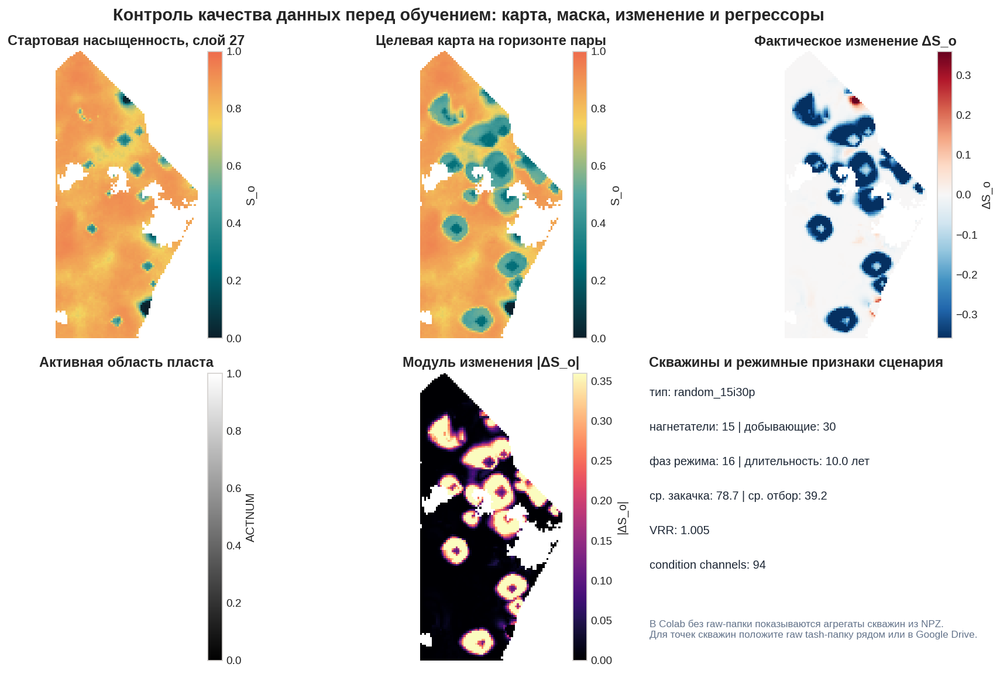

,Группа,Канал,min,mean,max,nonzero
0,static,ntg,0.0000,0.0000,0.0000,0
1,static,permx,-1.0000,0.3263,1.0000,6572
2,static,permy,-1.0000,0.3263,1.0000,6572
3,static,permz,-1.0000,0.3263,1.0000,6572
4,static,poro,-0.5552,0.2708,1.0000,6572
5,static,swatinit,-1.0000,-0.5246,1.0000,6572
6,well_map,inj_binary,0.0000,0.0011,1.0000,12
7,well_map,prod_binary,0.0000,0.0028,1.0000,29
8,well_map,inj_rate,0.0000,0.0000,0.0000,0
9,well_map,prod_rate,0.0000,0.0000,0.0000,0


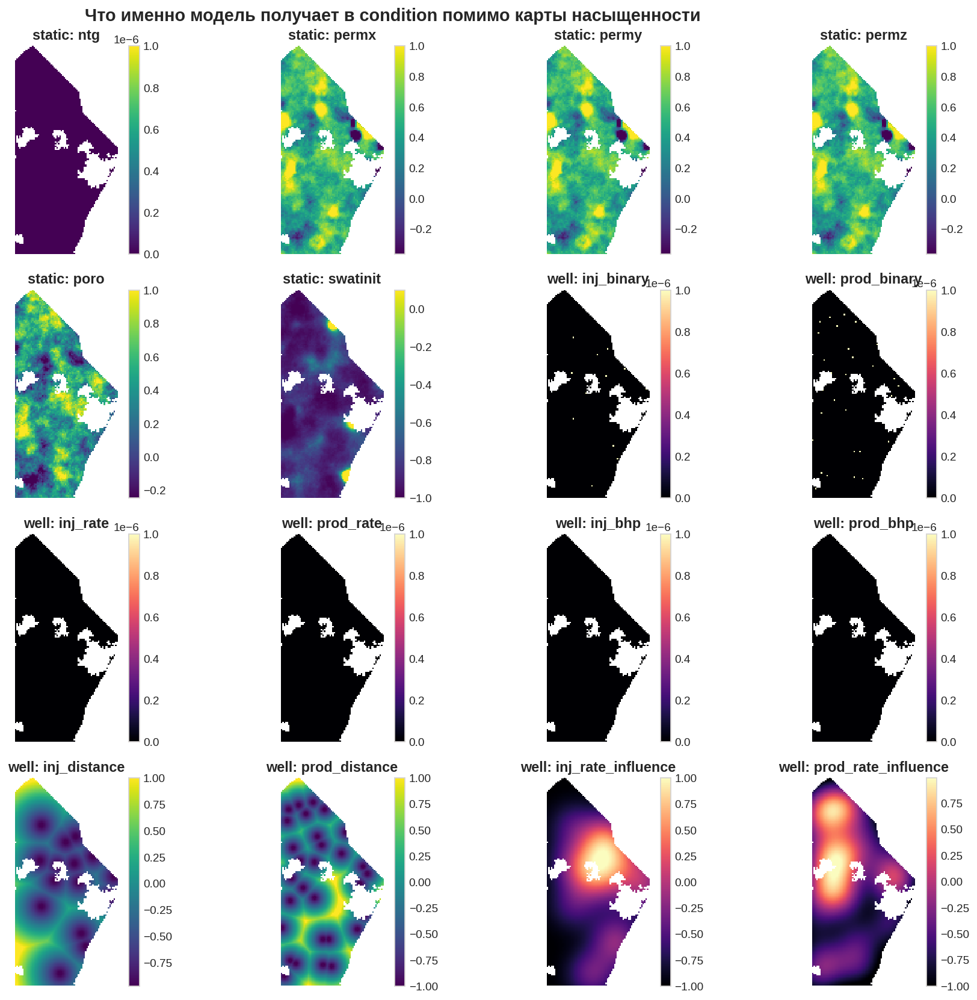

,Сетка,train samples,train scenarios,layers,H,W,active cells,val samples,val scenarios,test samples,test scenarios
0,0,100188,6,99,146,72,345750,89298,2,57222,2
1,1,203350,6,98,112,86,286522,40866,2,42042,2
2,2,197628,6,86,145,103,375455,85226,2,41882,2
3,3,134541,6,99,71,123,293059,78408,2,22275,2
4,4,99244,6,86,98,140,362457,80066,2,38442,2


,Выборка,Сценарии,Pair-layer samples
0,train,30,734951
1,validation,10,373864
2,test,10,201863


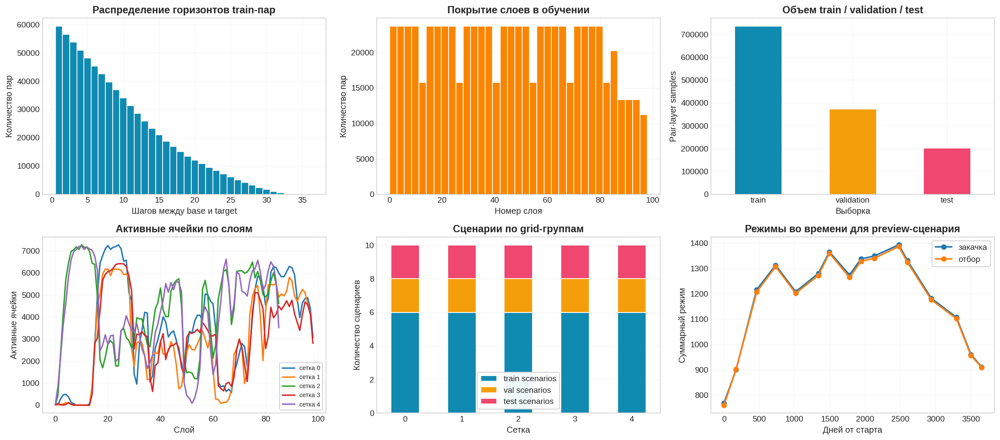

In [ ]:
# Выбираем информативный sample: большая активная область + заметное изменение target-base.
active_by_layer = train_ds.act.reshape(train_ds.layers, -1).sum(axis=1)
preview_layer = int(np.argmax(active_by_layer))
best_score, preview_idx = -1.0, 0
scan_step = max(1, len(train_ds)//900)
for i in range(0, len(train_ds), scan_step):
    z = int(train_ds.samples[i][-1])
    if active_by_layer[z] < np.quantile(active_by_layer, 0.55): continue
    item = train_ds[i]; m = item['mask'][0].numpy() > 0.5; delta = np.abs(item['target'][0].numpy()*dS_clip)
    score = float(delta[m].mean()) if np.any(m) else 0.0
    if score > best_score: best_score, preview_idx, preview_layer = score, i, z
preview = train_ds[preview_idx]; row = train_ds.samples[preview_idx]
preview_scenario = int(row[0]) if len(row)==4 else -1
preview_name = train_ds.scenario_names[preview_scenario] if preview_scenario>=0 and hasattr(train_ds,'scenario_names') else 'dense_npz'
print('Preview scenario:', preview_name)
print('Preview layer:', preview_layer, '| active cells:', int(active_by_layer[preview_layer]), '| mean |delta|:', round(best_score,6))
base_preview = denorm_n11_to01(preview['base'][0].numpy()); target_delta = preview['target'][0].numpy()*dS_clip; target_preview = np.clip(base_preview+target_delta,0,1); mask_preview = preview['mask'][0].numpy(); abs_delta=np.abs(target_delta)
dlo,dhi = robust_limits(target_delta, mask_preview, symmetric=True, default=(-dS_clip,dS_clip)); amax=max(float(np.nanquantile(abs_delta[mask_preview>0.5],.98)),1e-6)
wells = read_scenario_wells(preview_name)
fig=plt.figure(figsize=(15,9)); gs=fig.add_gridspec(2,3); axes=[fig.add_subplot(gs[i,j]) for i in range(2) for j in range(3)]
plot_map(axes[0],base_preview,mask_preview,f'Стартовая насыщенность, слой {preview_layer}',SAT_CMAP,0,1,cbar=True,cbar_label='S_o'); add_well_markers(axes[0],wells,mask_preview)
plot_map(axes[1],target_preview,mask_preview,'Целевая карта на горизонте пары',SAT_CMAP,0,1,cbar=True,cbar_label='S_o'); add_well_markers(axes[1],wells,mask_preview)
plot_map(axes[2],target_delta,mask_preview,'Фактическое изменение ΔS_o',DELTA_CMAP,dlo,dhi,cbar=True,cbar_label='ΔS_o')
plot_map(axes[3],mask_preview,mask_preview,'Активная область пласта','gray',0,1,cbar=True,cbar_label='ACTNUM')
plot_map(axes[4],abs_delta,mask_preview,'Модуль изменения |ΔS_o|',UNC_CMAP,0,amax,cbar=True,cbar_label='|ΔS_o|')
ax=axes[5]; ax.set_title('Скважины и режимные признаки сценария'); ax.set_xlim(0,1); ax.set_ylim(0,1); ax.axis('off')
if preview_scenario>=0:
    with np.load(data_path, allow_pickle=True) as z: sf_raw=z['scenario_features'][preview_scenario] if 'scenario_features' in z else np.zeros(len(SCENARIO_FEATURES))
    txt=[f'тип: {_scenario_kind_from_name(preview_name)}',f'нагнетатели: {sf_raw[0]:.0f} | добывающие: {sf_raw[1]:.0f}',f'фаз режима: {sf_raw[3]:.0f} | длительность: {sf_raw[4]:.1f} лет',f'ср. закачка: {sf_raw[6]:.1f} | ср. отбор: {sf_raw[9]:.1f}',f'VRR: {sf_raw[16]:.3f}',f'condition channels: {make_condition({k:v.unsqueeze(0) for k,v in preview.items()}, max_delta_steps=max_delta_steps, layers=train_ds.layers).shape[1]}']
    for k,t in enumerate(txt): ax.text(.03,.92-k*.12,t,fontsize=11,color='#1f2937')
    if wells:
        ax.scatter([],[],c='#118ab2',marker='^',label='нагнетательная'); ax.scatter([],[],c='#ef476f',marker='o',label='добывающая'); ax.legend(loc='lower left')
    else:
        ax.text(.03,.08,'В Colab без raw-папки показываются агрегаты скважин из NPZ.\nДля точек скважин положите raw tash-папку рядом или в Google Drive.',fontsize=9.5,color='#64748b')
else:
    ax.text(.5,.5,'Dense NPZ: режимные признаки отсутствуют',ha='center',va='center')
fig.suptitle('Контроль качества данных перед обучением: карта, маска, изменение и регрессоры',fontsize=16,weight='bold'); plt.tight_layout(); plt.show()



# Визуальный аудит condition-каналов: static + well maps, которые реально уходят в модель.
if isinstance(train_ds, ForecastActiveNPZDataset):
    static_names = getattr(train_ds, 'static_names', [f'static_{i}' for i in range(preview['static'].shape[0])])
    map_names = getattr(train_ds, 'well_map_channel_names', [f'map_{i}' for i in range(preview['maps'].shape[0])])
    rows = []
    for i, name in enumerate(static_names):
        arr = preview['static'][i].numpy()
        rows.append({'Группа': 'static', 'Канал': name, 'min': float(np.nanmin(arr)), 'mean': float(np.nanmean(arr)), 'max': float(np.nanmax(arr)), 'nonzero': int(np.count_nonzero(arr))})
    for i, name in enumerate(map_names):
        arr = preview['maps'][i].numpy()
        rows.append({'Группа': 'well_map', 'Канал': name, 'min': float(np.nanmin(arr)), 'mean': float(np.nanmean(arr)), 'max': float(np.nanmax(arr)), 'nonzero': int(np.count_nonzero(arr))})
    style_dataframe(pd.DataFrame(rows) if pd is not None else rows, 'Аудит каналов condition: static и spatial well maps', precision=4)
    n_static = min(6, preview['static'].shape[0])
    n_maps = min(10, preview['maps'].shape[0])
    fig, axes = plt.subplots(4, 4, figsize=(15, 13))
    panels = []
    for i in range(n_static): panels.append((f'static: {static_names[i]}', preview['static'][i].numpy(), 'viridis'))
    for i in range(n_maps): panels.append((f'well: {map_names[i]}', preview['maps'][i].numpy(), 'magma' if 'distance' not in map_names[i] else 'viridis'))
    for ax, item in zip(axes.ravel(), panels):
        title, img, cmap = item
        vmin, vmax = robust_limits(img, mask_preview, q=(0.01, 0.99), default=(None, None))
        plot_map(ax, img, mask_preview, title, cmap, vmin, vmax, cbar=True)
    for ax in axes.ravel()[len(panels):]:
        ax.axis('off')
    fig.suptitle('Что именно модель получает в condition помимо карты насыщенности', fontsize=16, weight='bold')
    plt.tight_layout(); plt.show()

def sample_to_pair(row):
    if len(row)==4:
        s,t,t2,z=row; return int(t),int(t2),int(z),int(s)
    t,t2,z=row; return int(t),int(t2),int(z),-1
pair_rows=[]
for ds_idx,ds in enumerate(train_datasets if 'train_datasets' in globals() else [train_ds]):
    for row in ds.samples:
        t,t2,z,s=sample_to_pair(row); pair_rows.append((t,t2,z,s,getattr(ds,'grid_group',ds_idx)))
pairs=np.array(pair_rows,dtype=int)
split_rows=[]
for ds_idx,ds in enumerate(train_datasets):
    rec={'Сетка':getattr(ds,'grid_group',ds_idx),'train samples':len(ds),'train scenarios':len(getattr(ds,'scenario_indices',[])),'layers':ds.layers,'H':ds.image_shape[0],'W':ds.image_shape[1], 'active cells': int(ds.act.sum())}
    if ds_idx < len(val_datasets): rec.update({'val samples':len(val_datasets[ds_idx]),'val scenarios':len(getattr(val_datasets[ds_idx],'scenario_indices',[]))})
    if ds_idx < len(test_datasets): rec.update({'test samples':len(test_datasets[ds_idx]),'test scenarios':len(getattr(test_datasets[ds_idx],'scenario_indices',[]))})
    split_rows.append(rec)
split_df = pd.DataFrame(split_rows) if pd is not None else split_rows
style_dataframe(split_df,'Scenario-level split: train / validation / test без пересечения сценариев',precision=2)
if pd is not None:
    totals = pd.DataFrame([
        {'Выборка':'train','Сценарии':sum(len(getattr(ds,'scenario_indices',[])) for ds in train_datasets),'Pair-layer samples':sum(len(ds) for ds in train_datasets)},
        {'Выборка':'validation','Сценарии':sum(len(getattr(ds,'scenario_indices',[])) for ds in val_datasets),'Pair-layer samples':sum(len(ds) for ds in val_datasets)},
        {'Выборка':'test','Сценарии':sum(len(getattr(ds,'scenario_indices',[])) for ds in test_datasets),'Pair-layer samples':sum(len(ds) for ds in test_datasets)},
    ])
    style_dataframe(totals, 'Итоговый объем выборок', precision=0)
fig,axes=plt.subplots(2,3,figsize=(18,8))
axes[0,0].hist(pairs[:,1]-pairs[:,0],bins=np.arange(1,max_delta_steps+2)-.5,color='#118ab2',edgecolor='white'); axes[0,0].set_title('Распределение горизонтов train-пар'); axes[0,0].set_xlabel('Шагов между base и target'); axes[0,0].set_ylabel('Количество пар')
axes[0,1].hist(pairs[:,2],bins=min(train_ds.layers,35),color='#fb8500',edgecolor='white'); axes[0,1].set_title('Покрытие слоев в обучении'); axes[0,1].set_xlabel('Номер слоя'); axes[0,1].set_ylabel('Количество пар')
if pd is not None:
    totals.set_index('Выборка')['Pair-layer samples'].plot(kind='bar', ax=axes[0,2], color=['#118ab2','#f59e0b','#ef476f'], edgecolor='white')
    axes[0,2].set_title('Объем train / validation / test'); axes[0,2].set_ylabel('Pair-layer samples'); axes[0,2].tick_params(axis='x', rotation=0)
else:
    axes[0,2].axis('off')
for ds in train_datasets: axes[1,0].plot(ds.act.reshape(ds.layers,-1).sum(1),lw=1.8,label=f'сетка {getattr(ds,"grid_group",0)}')
axes[1,0].set_title('Активные ячейки по слоям'); axes[1,0].set_xlabel('Слой'); axes[1,0].set_ylabel('Активные ячейки'); axes[1,0].legend(fontsize=8)
if pd is not None:
    sc = pd.DataFrame(split_rows).set_index('Сетка')[['train scenarios','val scenarios','test scenarios']]
    sc.plot(kind='bar', stacked=True, ax=axes[1,1], color=['#118ab2','#f59e0b','#ef476f'], edgecolor='white')
    axes[1,1].set_title('Сценарии по grid-группам'); axes[1,1].set_ylabel('Количество сценариев'); axes[1,1].tick_params(axis='x', rotation=0)
else:
    axes[1,1].axis('off')
if preview_scenario>=0:
    with np.load(data_path, allow_pickle=True) as z:
        phase=z['phase_controls'][preview_scenario] if 'phase_controls' in z else np.zeros((1,0)); pm=z['phase_mask'][preview_scenario].astype(bool) if 'phase_mask' in z else np.zeros(phase.shape[0],bool)
    if phase.shape[-1]>0 and np.any(pm):
        days=phase[pm,0]; axes[1,2].plot(days,phase[pm,4],marker='o',lw=2,label='закачка'); axes[1,2].plot(days,phase[pm,5],marker='o',lw=2,label='отбор'); axes[1,2].set_title('Режимы во времени для preview-сценария'); axes[1,2].set_xlabel('Дней от старта'); axes[1,2].set_ylabel('Суммарный режим'); axes[1,2].legend()
    else: axes[1,2].text(.5,.5,'Фазы режима отсутствуют',ha='center',va='center'); axes[1,2].axis('off')
plt.tight_layout(); plt.show()


## 7. Режим обучения и сохранения checkpoint

По умолчанию включен `TRAIN_MODE = 'retrain'`: notebook заново обучает U-Net, FNO и пиксельную диффузию на текущем NPZ, сохраняет лучшие веса в `/content/outputs/checkpoints` и дальше использует именно их. Быстрый режим `load_pretrained` оставлен только как аварийный вариант для демонстрации без переобучения.

Важное исправление относительно предыдущих весов: condition теперь содержит не только разность индексов snapshot, но и физический горизонт `delta_days_norm`. Это нужно, чтобы модель видела реальную длительность перехода между TNavigator-снимками.

Для ограниченных Colab-сессий добавлен `TRAIN_STAGES='missing'`: ноутбук загружает уже сохраненные совместимые веса стадий и обучает только то, чего нет в архиве/checkpoints. Если нужно принудительно переобучить всё, поставь `TRAIN_STAGES='all'`.

После supervised-стадий автоматически создается `diffusion_soil_supervised_checkpoints_latest.zip`, после latent-стадии — `diffusion_soil_full_checkpoints_latest.zip`. Эти архивы можно скачать на компьютер и затем положить в следующий Colab-архив: `TRAIN_STAGES='missing'` подхватит сохраненные веса и продолжит с отсутствующих стадий.

После обучения считается отдельная таблица `train_val_test_component_metrics.csv/json`: train нужен для контроля сходимости, validation — для выбора/сравнения, test — для финальной независимой оценки. Checkpoint также хранит `scenario_split_signature`, поэтому старые веса с другим split не подмешиваются в честный test.


## 7.1 Настройки бюджета

Режим `budget_5h` сохраняет все 5 grid-групп, все static/well/control регрессоры и сценарный split, но ограничивает число batch на группу. После каждой эпохи сохраняется checkpoint, поэтому при обрыве Colab останутся веса последней и лучшей эпохи.


## 7.2 Обучение U-Net, FNO и пиксельной диффузии

Обучение идет последовательно: сначала supervised U-Net, затем FNO, затем denoising-модель пиксельной диффузии. На каждой эпохе выводится progress bar, train loss, validation RMSE/loss и путь к сохраненному checkpoint.


In [ ]:
RUN_MODE = 'budget_5h'  # 'demo', 'budget_5h', or 'full'
TRAIN_MODE = 'retrain'     # 'retrain' or 'load_pretrained'
# 'missing' удобно для бесплатного Colab: уже сохраненные совместимые стадии грузятся, отсутствующие обучаются.
# Для полного переобучения поставь 'all'. Для ручного дробления: ['det_unet'], ['fno'], ['pixel_diffusion'] и т.д.
TRAIN_STAGES = 'missing'    # 'missing', 'all' or list: ['det_unet','fno','pixel_diffusion','spatial_vae','latent_diffusion']
RESUME_FROM_CHECKPOINT = False
TRAIN_TIME_BUDGET_HOURS = 5.7 if RUN_MODE == 'budget_5h' else None

if RUN_MODE == 'demo':
    BATCH = 2; EPOCHS = 2; TIMESTEPS = 60
    MAX_TRAIN_BATCHES_PER_GROUP = 4; MAX_VAL_BATCHES_PER_GROUP = 3
    LATENT_EPOCHS = 1
elif RUN_MODE == 'budget_5h':
    # Все grid-группы и все регрессоры сохраняются; ограничивается только число batch на группу.
    BATCH = 8; EPOCHS = 6; TIMESTEPS = 120
    MAX_TRAIN_BATCHES_PER_GROUP = 180; MAX_VAL_BATCHES_PER_GROUP = 32
    LATENT_EPOCHS = 3
else:
    BATCH = 6; EPOCHS = 35; TIMESTEPS = 200
    MAX_TRAIN_BATCHES_PER_GROUP = None; MAX_VAL_BATCHES_PER_GROUP = None
    LATENT_EPOCHS = 20

NUM_WORKERS = 0  # NPZ является ZIP-контейнером; fork-workers в Colab могут ломать параллельную decompression.
PIN_MEMORY = bool(DEVICE.type == 'cuda')
PERSISTENT_WORKERS = bool(NUM_WORKERS > 0)
PREFETCH_FACTOR = 2 if NUM_WORKERS > 0 else None
USE_AMP = bool(DEVICE.type == 'cuda')
print({'RUN_MODE': RUN_MODE, 'TRAIN_MODE': TRAIN_MODE, 'BATCH': BATCH, 'EPOCHS': EPOCHS, 'TIMESTEPS': TIMESTEPS,
       'MAX_TRAIN_BATCHES_PER_GROUP': MAX_TRAIN_BATCHES_PER_GROUP, 'MAX_VAL_BATCHES_PER_GROUP': MAX_VAL_BATCHES_PER_GROUP,
       'LATENT_EPOCHS': LATENT_EPOCHS, 'NUM_WORKERS': NUM_WORKERS, 'USE_AMP': USE_AMP, 'TRAIN_STAGES': TRAIN_STAGES})

loader_kwargs = dict(batch_size=BATCH, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY, persistent_workers=PERSISTENT_WORKERS)
if PREFETCH_FACTOR is not None:
    loader_kwargs['prefetch_factor'] = PREFETCH_FACTOR
train_loaders=[DataLoader(ds, shuffle=True, **loader_kwargs) for ds in train_datasets]
val_loaders=[DataLoader(ds, shuffle=False, **loader_kwargs) for ds in val_datasets]
test_loaders=[DataLoader(ds, shuffle=False, **loader_kwargs) for ds in test_datasets]
TRAIN_GROUPS=[{'grid_group': getattr(ds,'grid_group',0), 'train_ds': ds, 'val_ds': vds, 'test_ds': tds, 'train_loader': tl, 'val_loader': vl, 'test_loader': tel} for ds,vds,tds,tl,vl,tel in zip(train_datasets,val_datasets,test_datasets,train_loaders,val_loaders,test_loaders)]
TEST_GROUPS=[{'grid_group': g['grid_group'], 'val_ds': g['test_ds'], 'val_loader': g['test_loader']} for g in TRAIN_GROUPS]
tmp=next(iter(TRAIN_GROUPS[0]['train_loader']))
cond=make_condition(tmp,max_delta_steps=max_delta_steps,layers=TRAIN_GROUPS[0]['train_ds'].layers)
cond_channels=cond.shape[1]
print('cond_channels',cond_channels,'sample keys:',{k:tuple(v.shape) for k,v in tmp.items()})
if 'delta_days_norm' not in tmp:
    raise RuntimeError('Dataset не вернул delta_days_norm: физическое время не попадет в condition.')

def train_batches():
    for g in TRAIN_GROUPS:
        for j,b in enumerate(g['train_loader']):
            if MAX_TRAIN_BATCHES_PER_GROUP is not None and j >= MAX_TRAIN_BATCHES_PER_GROUP: break
            yield b, g['train_ds'], g['grid_group']

def count_train_loaders():
    return sum(min(len(g['train_loader']), MAX_TRAIN_BATCHES_PER_GROUP or len(g['train_loader'])) for g in TRAIN_GROUPS)

def count_val_loaders():
    return sum(min(len(g['val_loader']), MAX_VAL_BATCHES_PER_GROUP or len(g['val_loader'])) for g in TRAIN_GROUPS)

def progress_iter(iterable, total=None, desc='progress'):
    return tqdm(iterable, total=total, desc=desc, leave=False, dynamic_ncols=True, mininterval=1.0)

RUN_DIR = PROJECT_ROOT / 'outputs'
CHECKPOINT_DIR = RUN_DIR / 'checkpoints'
METRICS_DIR = RUN_DIR / 'metrics'
for d in [RUN_DIR, CHECKPOINT_DIR, METRICS_DIR]: d.mkdir(parents=True, exist_ok=True)

run_config = {
    'active_dataset': ACTIVE_DATASET_NAME, 'data_path': str(data_path), 'run_mode': RUN_MODE, 'train_mode': TRAIN_MODE,
    'batch': BATCH, 'epochs': EPOCHS, 'timesteps': TIMESTEPS, 'max_delta_steps': max_delta_steps,
    'horizon_days_scale': float(HORIZON_DAYS_SCALE), 'uses_delta_days_norm': True,
    'sample_strategy': TRAIN_SAMPLE_STRATEGY, 'max_snapshot_count': int(MAX_SNAPSHOT_COUNT),
    'dS_clip': float(dS_clip), 'cond_channels': int(cond_channels),
    'grid_groups': [int(g['grid_group']) for g in TRAIN_GROUPS],
    'group_image_shapes': [tuple(map(int, g['train_ds'].image_shape)) for g in TRAIN_GROUPS],
    'group_layers': [int(g['train_ds'].layers) for g in TRAIN_GROUPS],
    'group_train_samples': [int(len(g['train_ds'])) for g in TRAIN_GROUPS],
    'group_val_samples': [int(len(g['val_ds'])) for g in TRAIN_GROUPS],
    'group_test_samples': [int(len(g['test_ds'])) for g in TRAIN_GROUPS],
    'scenario_splits': SCENARIO_SPLITS,
    'scenario_split_signature': SCENARIO_SPLIT_SIGNATURE,
    'static_channels': int(train_ds.static_channels), 'control_channels': int(train_ds.control_channels), 'map_channels': int(train_ds.map_channels),
    'device': str(DEVICE), 'num_workers': int(NUM_WORKERS),
    'planned_train_batches_per_epoch': int(count_train_loaders()), 'planned_val_batches_per_eval': int(count_val_loaders()),
}
print('planned batches:', {'train_per_epoch': count_train_loaders(), 'val_per_eval': count_val_loaders(), 'test_full_batches': sum(len(g['test_loader']) for g in TRAIN_GROUPS)})
with open(METRICS_DIR/'run_config.json','w',encoding='utf-8') as f: json.dump(run_config,f,ensure_ascii=False,indent=2)


def make_checkpoint_archive(name='diffusion_soil_checkpoints_latest.zip'):
    """Pack current checkpoints and metrics into one downloadable file for the next Colab session."""
    archive_path = PROJECT_ROOT / name
    include_roots = [CHECKPOINT_DIR, METRICS_DIR]
    with zipfile.ZipFile(archive_path, 'w', compression=zipfile.ZIP_DEFLATED, compresslevel=3) as zf:
        for root in include_roots:
            if not root.exists():
                continue
            for file in sorted(root.rglob('*')):
                if file.is_file():
                    zf.write(file, file.relative_to(PROJECT_ROOT))
    print('CHECKPOINT_ARCHIVE_READY:', archive_path, '| MB:', round(archive_path.stat().st_size/1024**2, 2))
    return archive_path

def save_checkpoint(name, model, optimizer=None, epoch=None, metrics=None, extra=None):
    payload = {'model_state': model.state_dict(), 'epoch': epoch, 'metrics': metrics or {}, 'run_config': run_config, 'extra': extra or {}}
    if optimizer is not None: payload['optimizer_state'] = optimizer.state_dict()
    path = CHECKPOINT_DIR / f'{name}.pt'
    torch.save(payload, path)
    return path

def write_records(path, rows):
    path=Path(path); path.parent.mkdir(parents=True,exist_ok=True)
    if str(path).lower().endswith('.json'):
        with open(path,'w',encoding='utf-8') as f: json.dump(rows,f,ensure_ascii=False,indent=2)
    else:
        try:
            pd.DataFrame(rows).to_csv(path,index=False)
        except Exception:
            with open(path.with_suffix('.json'),'w',encoding='utf-8') as f: json.dump(rows,f,ensure_ascii=False,indent=2)
    return path

def masked_mse_loss(pred, target, mask):
    return (((pred-target)**2)*mask).sum()/mask.sum().clamp_min(1.0)

@torch.no_grad()
def eval_supervised_delta(model, groups, desc='validation'):
    model.eval(); se=0.0; count=0.0
    for g in progress_iter(groups, total=len(groups), desc=desc):
        ds=g['val_ds']; limit=min(len(g['val_loader']), MAX_VAL_BATCHES_PER_GROUP or len(g['val_loader']))
        for j,b in enumerate(progress_iter(g['val_loader'], total=limit, desc=f'{desc} group {g["grid_group"]}')):
            if MAX_VAL_BATCHES_PER_GROUP is not None and j >= MAX_VAL_BATCHES_PER_GROUP: break
            c=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
            y=b['target'].to(DEVICE); m=b['mask'].to(DEVICE)
            pred=model(c)
            se += float((((pred-y)**2)*m).sum().detach().cpu()); count += float(m.sum().detach().cpu())
    return math.sqrt(se/max(count,1.0))

@torch.no_grad()
def eval_diffusion_loss(model, groups, desc='diff validation'):
    model.eval(); vals=[]
    for g in progress_iter(groups, total=len(groups), desc=desc):
        ds=g['val_ds']; limit=min(len(g['val_loader']), MAX_VAL_BATCHES_PER_GROUP or len(g['val_loader']))
        for j,b in enumerate(progress_iter(g['val_loader'], total=limit, desc=f'{desc} group {g["grid_group"]}')):
            if MAX_VAL_BATCHES_PER_GROUP is not None and j >= MAX_VAL_BATCHES_PER_GROUP: break
            c=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
            vals.append(float(model.training_loss(b['target'].to(DEVICE),c,b['mask'].to(DEVICE)).detach().cpu()))
    return float(np.mean(vals)) if vals else float('nan')



@torch.no_grad()
def eval_supervised_delta_split(model, groups, split='val', max_batches=None, desc='supervised split'):
    model.eval(); se=0.0; ae=0.0; count=0.0; batches=0
    loader_key=f'{split}_loader'; ds_key=f'{split}_ds'
    for g in progress_iter(groups, total=len(groups), desc=desc):
        loader=g[loader_key]; ds=g[ds_key]; limit=min(len(loader), max_batches or len(loader))
        for j,b in enumerate(progress_iter(loader, total=limit, desc=f'{desc} group {g["grid_group"]}')):
            if max_batches is not None and j >= max_batches: break
            c=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
            y=b['target'].to(DEVICE); m=b['mask'].to(DEVICE); pred=model(c)
            se += float((((pred-y)**2)*m).sum().detach().cpu()); ae += float((torch.abs(pred-y)*m).sum().detach().cpu()); count += float(m.sum().detach().cpu()); batches += 1
    return {'rmse_delta_norm': math.sqrt(se/max(count,1.0)), 'mae_delta_norm': ae/max(count,1.0), 'batches': batches}

@torch.no_grad()
def eval_diffusion_loss_split(model, groups, split='val', max_batches=None, desc='diffusion split'):
    model.eval(); vals=[]; loader_key=f'{split}_loader'; ds_key=f'{split}_ds'
    for g in progress_iter(groups, total=len(groups), desc=desc):
        loader=g[loader_key]; ds=g[ds_key]; limit=min(len(loader), max_batches or len(loader))
        for j,b in enumerate(progress_iter(loader, total=limit, desc=f'{desc} group {g["grid_group"]}')):
            if max_batches is not None and j >= max_batches: break
            c=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
            vals.append(float(model.training_loss(b['target'].to(DEVICE),c,b['mask'].to(DEVICE)).detach().cpu()))
    return {'diffusion_loss': float(np.mean(vals)) if vals else float('nan'), 'batches': len(vals)}

def final_split_metrics():
    rows=[]
    split_limits={'train': MAX_VAL_BATCHES_PER_GROUP, 'val': MAX_VAL_BATCHES_PER_GROUP, 'test': None}
    for split in ['train','val','test']:
        for model_name,model in [('U-Net',det),('FNO',fno)]:
            t0=time.time(); metrics=eval_supervised_delta_split(model,TRAIN_GROUPS,split=split,max_batches=split_limits[split],desc=f'{model_name} {split}')
            rows.append({'Модель':model_name,'Выборка':split,'Тип метрики':'delta map','seconds':round(time.time()-t0,1),**metrics})
        t0=time.time(); metrics=eval_diffusion_loss_split(diff,TRAIN_GROUPS,split=split,max_batches=split_limits[split],desc=f'pixel diffusion {split}')
        rows.append({'Модель':'Пиксельная диффузия','Выборка':split,'Тип метрики':'noise/denoising loss','seconds':round(time.time()-t0,1),**metrics})
    return rows

def find_pretrained_file(filename):
    candidates = [RUNTIME_ROOT / filename, Path('/content') / filename, Path.cwd() / filename, PROJECT_ROOT / filename,
                  PROJECT_ROOT / 'outputs' / 'checkpoints' / filename, LOCAL_ROOT / filename, LOCAL_ROOT / 'натренировал' / filename]
    for path in candidates:
        if path.exists() and path.is_file(): return path
    raise FileNotFoundError(f'Не найден checkpoint {filename}. Проверенные пути: {[str(p) for p in candidates]}')


def stage_selection(stage):
    """True=train, False=must load, None=train only if compatible checkpoint is absent."""
    if TRAIN_MODE != 'retrain':
        return False
    if TRAIN_STAGES == 'all':
        return True
    if TRAIN_STAGES == 'missing':
        return None
    return stage in set(TRAIN_STAGES)

def load_model_checkpoint(model, path, expected_cond_channels=None, expected_timesteps=None, freeze=True):
    path = Path(path)
    try: payload = torch.load(path, map_location=DEVICE, weights_only=False)
    except TypeError: payload = torch.load(path, map_location=DEVICE)
    if not isinstance(payload, dict) or 'model_state' not in payload:
        raise ValueError(f'{path} не является checkpoint этого notebook: отсутствует model_state.')
    saved_cfg = payload.get('run_config', {}) or {}
    saved_cond = saved_cfg.get('cond_channels')
    if expected_cond_channels is not None and saved_cond is not None and int(saved_cond) != int(expected_cond_channels):
        raise ValueError(f'{path.name}: cond_channels={saved_cond}, текущий notebook ожидает {expected_cond_channels}. Старые веса несовместимы с delta_days_norm.')
    saved_split = saved_cfg.get('scenario_split_signature')
    current_split = globals().get('SCENARIO_SPLIT_SIGNATURE')
    if TRAIN_MODE == 'retrain' and current_split is not None and saved_split != current_split:
        raise ValueError(f'{path.name}: checkpoint split_signature={saved_split}, текущий split_signature={current_split}. Старые веса не загружаются, чтобы не было leakage в test.')
    saved_strategy = saved_cfg.get('sample_strategy')
    current_strategy = globals().get('TRAIN_SAMPLE_STRATEGY')
    if TRAIN_MODE == 'retrain' and current_strategy is not None and saved_strategy != current_strategy:
        raise ValueError(f'{path.name}: sample_strategy={saved_strategy}, current={current_strategy}. Retrain is required for multi-horizon training.')
    saved_steps = saved_cfg.get('timesteps')
    if expected_timesteps is not None and saved_steps is not None and int(saved_steps) != int(expected_timesteps):
        raise ValueError(f'{path.name}: timesteps={saved_steps}, текущая модель ожидает {expected_timesteps}.')
    model.load_state_dict(payload['model_state'], strict=True)
    model.to(DEVICE).eval()
    if freeze:
        for parameter in model.parameters(): parameter.requires_grad_(False)
    print('LOADED:', path, '| epoch:', payload.get('epoch'), '| metrics:', payload.get('metrics', {}))
    return payload


def try_load_model_checkpoint(model, filename, expected_cond_channels=None, expected_timesteps=None, freeze=False):
    try:
        path = find_pretrained_file(filename)
        return load_model_checkpoint(model, path, expected_cond_channels=expected_cond_channels, expected_timesteps=expected_timesteps, freeze=freeze)
    except Exception as exc:
        print('CHECKPOINT_NOT_READY:', filename, '|', str(exc)[:220])
        return None

def train_or_load_stage(stage, model, best_filename, train_fn, expected_timesteps=None):
    selected = stage_selection(stage)
    if selected is not True:
        payload = try_load_model_checkpoint(model, best_filename, expected_cond_channels=cond_channels, expected_timesteps=expected_timesteps, freeze=False)
        if payload is not None:
            print('STAGE_LOADED_SKIP_TRAIN:', stage, best_filename)
            model.eval()
            return model, payload
        if selected is False:
            raise FileNotFoundError(f'Для стадии {stage} нет совместимого checkpoint {best_filename}, а TRAIN_STAGES не разрешает обучение этой стадии.')
    print('STAGE_TRAIN_START:', stage)
    model = train_fn(model)
    model.eval()
    return model, {'stage': stage, 'trained_in_this_run': True}


history = {'det_loss': [], 'det_val_rmse': [], 'fno_loss': [], 'fno_val_rmse': [], 'diff_loss': [], 'diff_val_loss': [], 'vae_loss': [], 'latent_diff_loss': []}
training_rows = []
TRAIN_START_TIME = time.time()

def budget_exhausted():
    return TRAIN_TIME_BUDGET_HOURS is not None and (time.time()-TRAIN_START_TIME) > TRAIN_TIME_BUDGET_HOURS*3600

def train_supervised_model(model, stage, checkpoint_name, lr=2e-4, use_amp=None):
    if use_amp is None: use_amp = bool(USE_AMP)
    opt=torch.optim.AdamW(model.parameters(),lr=lr,weight_decay=1e-4)
    scaler=torch.cuda.amp.GradScaler(enabled=use_amp)
    best=float('inf')
    for epoch in range(1,EPOCHS+1):
        model.train(); losses=[]; t0=time.time()
        total=count_train_loaders()
        for b,ds,gg in progress_iter(train_batches(), total=total, desc=f'{stage} эпоха {epoch}/{EPOCHS}'):
            opt.zero_grad(set_to_none=True)
            c=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
            y=b['target'].to(DEVICE); m=b['mask'].to(DEVICE)
            with torch.cuda.amp.autocast(enabled=use_amp):
                loss=masked_mse_loss(model(c),y,m)
            scaler.scale(loss).backward(); scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(model.parameters(),1.0)
            scaler.step(opt); scaler.update()
            losses.append(float(loss.detach().cpu()))
        val_rmse=eval_supervised_delta(model,TRAIN_GROUPS,desc=f'{stage} validation')
        row={'stage':stage,'epoch':epoch,'train_loss':float(np.mean(losses)),'val_rmse_delta':float(val_rmse),'grid_groups':len(TRAIN_GROUPS),'seconds':round(time.time()-t0,1)}
        training_rows.append(row)
        if stage=='det_unet':
            history['det_loss'].append(row['train_loss']); history['det_val_rmse'].append(row['val_rmse_delta'])
        else:
            history['fno_loss'].append(row['train_loss']); history['fno_val_rmse'].append(row['val_rmse_delta'])
        save_checkpoint(f'last_{checkpoint_name}',model,opt,epoch,row,extra={'uses_delta_days_norm':True})
        if val_rmse < best:
            best=val_rmse; path=save_checkpoint(f'best_{checkpoint_name}',model,opt,epoch,row,extra={'uses_delta_days_norm':True}); print('BEST_SAVED',path,row)
        else:
            print('EPOCH_DONE',row)
        write_records(METRICS_DIR/'training_history.csv',training_rows); write_records(METRICS_DIR/'training_history.json',training_rows)
        if budget_exhausted():
            print('TIME_BUDGET_REACHED after epoch; saved latest checkpoint.')
            break
    load_model_checkpoint(model, CHECKPOINT_DIR/f'best_{checkpoint_name}.pt', expected_cond_channels=cond_channels, freeze=False)
    model.eval()
    return model

def train_pixel_diffusion_model(model, checkpoint_name='pixel_diffusion', lr=2e-4):
    opt=torch.optim.AdamW(model.parameters(),lr=lr,weight_decay=1e-4)
    scaler=torch.cuda.amp.GradScaler(enabled=USE_AMP)
    best=float('inf')
    for epoch in range(1,EPOCHS+1):
        model.train(); losses=[]; t0=time.time()
        for b,ds,gg in progress_iter(train_batches(), total=count_train_loaders(), desc=f'pixel diffusion эпоха {epoch}/{EPOCHS}'):
            opt.zero_grad(set_to_none=True)
            c=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
            with torch.cuda.amp.autocast(enabled=USE_AMP):
                loss=model.training_loss(b['target'].to(DEVICE),c,b['mask'].to(DEVICE))
            scaler.scale(loss).backward(); scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(model.parameters(),1.0)
            scaler.step(opt); scaler.update()
            losses.append(float(loss.detach().cpu()))
        val_loss=eval_diffusion_loss(model,TRAIN_GROUPS,desc='pixel diffusion validation')
        row={'stage':'pixel_diffusion','epoch':epoch,'train_loss':float(np.mean(losses)),'val_diffusion_loss':float(val_loss),'grid_groups':len(TRAIN_GROUPS),'seconds':round(time.time()-t0,1)}
        training_rows.append(row); history['diff_loss'].append(row['train_loss']); history['diff_val_loss'].append(row['val_diffusion_loss'])
        save_checkpoint(f'last_{checkpoint_name}',model,opt,epoch,row,extra={'uses_delta_days_norm':True})
        if val_loss < best:
            best=val_loss; path=save_checkpoint(f'best_{checkpoint_name}',model,opt,epoch,row,extra={'uses_delta_days_norm':True}); print('BEST_SAVED',path,row)
        else:
            print('EPOCH_DONE',row)
        write_records(METRICS_DIR/'training_history.csv',training_rows); write_records(METRICS_DIR/'training_history.json',training_rows)
        if budget_exhausted():
            print('TIME_BUDGET_REACHED after epoch; saved latest checkpoint.')
            break
    load_model_checkpoint(model, CHECKPOINT_DIR/f'best_{checkpoint_name}.pt', expected_cond_channels=cond_channels, expected_timesteps=TIMESTEPS, freeze=False)
    model.eval()
    return model


{'RUN_MODE': 'budget_5h', 'TRAIN_MODE': 'retrain', 'BATCH': 8, 'EPOCHS': 6, 'TIMESTEPS': 120, 'MAX_TRAIN_BATCHES_PER_GROUP': 180, 'MAX_VAL_BATCHES_PER_GROUP': 32, 'LATENT_EPOCHS': 3, 'NUM_WORKERS': 0, 'USE_AMP': True, 'TRAIN_STAGES': 'missing'}
cond_channels 94 sample keys: {'base': (8, 1, 146, 72), 'target': (8, 1, 146, 72), 'mask': (8, 1, 146, 72), 'static': (8, 6, 146, 72), 'control': (8, 36), 'maps': (8, 10, 146, 72), 'delta_norm': (8, 1), 'delta_days_norm': (8, 1), 'z_norm': (8, 1)}
planned batches: {'train_per_epoch': 900, 'val_per_eval': 160, 'test_full_batches': 25236}


In [ ]:

PRETRAINED_FILES = {'det_unet':'best_det_unet.pt','fno':'best_fno.pt','pixel_diffusion':'best_pixel_diffusion.pt'}
loaded_checkpoints = {}
bundle_history_path = RUNTIME_ROOT / 'training_history.json'
if bundle_history_path.exists():
    with open(bundle_history_path,'r',encoding='utf-8') as stream:
        training_rows=json.load(stream)

det = DeterministicUNet(cond_channels, 1, 32).to(DEVICE)
if TRAIN_MODE == 'retrain':
    print('U-NET_STAGE: train/load policy =', TRAIN_STAGES)
    det, loaded_checkpoints['det_unet'] = train_or_load_stage(
        'det_unet', det, PRETRAINED_FILES['det_unet'], lambda m: train_supervised_model(m,'det_unet','det_unet'))
else:
    loaded_checkpoints['det_unet'] = load_model_checkpoint(det, find_pretrained_file(PRETRAINED_FILES['det_unet']), expected_cond_channels=cond_channels)
write_records(METRICS_DIR/'training_history.csv',training_rows)
write_records(METRICS_DIR/'training_history.json',training_rows)
print('U-NET_READY:', loaded_checkpoints.get('det_unet', {}).get('metrics', {}))


U-NET_STAGE: train/load policy = missing
LOADED: /content/best_det_unet.pt | epoch: 6 | metrics: {'stage': 'det_unet', 'epoch': 6, 'train_loss': 0.004607930704369209, 'val_rmse_delta': 0.021243270348528957, 'grid_groups': 5, 'seconds': 613.5}
STAGE_LOADED_SKIP_TRAIN: det_unet best_det_unet.pt
U-NET_READY: {'stage': 'det_unet', 'epoch': 6, 'train_loss': 0.004607930704369209, 'val_rmse_delta': 0.021243270348528957, 'grid_groups': 5, 'seconds': 613.5}


In [ ]:

fno = FNO2d(cond_channels, 1, width=48, modes=12, depth=4).to(DEVICE)
if TRAIN_MODE == 'retrain':
    print('FNO_STAGE: AMP disabled because spectral branch has complex weights.')
    fno, loaded_checkpoints['fno'] = train_or_load_stage(
        'fno', fno, PRETRAINED_FILES['fno'], lambda m: train_supervised_model(m,'fno','fno', use_amp=False))
else:
    loaded_checkpoints['fno'] = load_model_checkpoint(fno, find_pretrained_file(PRETRAINED_FILES['fno']), expected_cond_channels=cond_channels)
write_records(METRICS_DIR/'training_history.csv',training_rows)
write_records(METRICS_DIR/'training_history.json',training_rows)
print('FNO_READY:', loaded_checkpoints.get('fno', {}).get('metrics', {}))


FNO_STAGE: AMP disabled because spectral branch has complex weights.
LOADED: /content/best_fno.pt | epoch: 3 | metrics: {'stage': 'fno', 'epoch': 3, 'train_loss': 0.0034618940435514863, 'val_rmse_delta': 0.02468503693206614, 'grid_groups': 5, 'seconds': 643.6}
STAGE_LOADED_SKIP_TRAIN: fno best_fno.pt
FNO_READY: {'stage': 'fno', 'epoch': 3, 'train_loss': 0.0034618940435514863, 'val_rmse_delta': 0.02468503693206614, 'grid_groups': 5, 'seconds': 643.6}


In [ ]:

diff = GaussianDiffusion(SimpleUNet(1, cond_channels, 32), timesteps=TIMESTEPS).to(DEVICE)
if TRAIN_MODE == 'retrain':
    print('PIXEL_DIFFUSION_STAGE: train/load policy =', TRAIN_STAGES)
    diff, loaded_checkpoints['pixel_diffusion'] = train_or_load_stage(
        'pixel_diffusion', diff, PRETRAINED_FILES['pixel_diffusion'], lambda m: train_pixel_diffusion_model(m,'pixel_diffusion'), expected_timesteps=TIMESTEPS)
else:
    loaded_checkpoints['pixel_diffusion'] = load_model_checkpoint(diff, find_pretrained_file(PRETRAINED_FILES['pixel_diffusion']), expected_cond_channels=cond_channels, expected_timesteps=TIMESTEPS)

print('SUPERVISED_AND_PIXEL_STAGES_DONE:', {'rows':len(training_rows), 'checkpoints_dir':str(CHECKPOINT_DIR)})
write_records(METRICS_DIR/'training_history.csv',training_rows)
write_records(METRICS_DIR/'training_history.json',training_rows)
split_metrics_rows = final_split_metrics()
write_records(METRICS_DIR/'train_val_test_component_metrics.csv', split_metrics_rows)
write_records(METRICS_DIR/'train_val_test_component_metrics.json', split_metrics_rows)
split_metrics_df = pd.DataFrame(split_metrics_rows) if pd is not None else split_metrics_rows

if 'R' not in globals():
    def R(text):
        return text.encode('utf-8').decode('unicode_escape') if '\\u' in str(text) else text

style_dataframe(
    split_metrics_df,
    R('\u041a\u043e\u043c\u043f\u043e\u043d\u0435\u043d\u0442\u043d\u044b\u0435 \u043c\u0435\u0442\u0440\u0438\u043a\u0438 \u043f\u043e\u0441\u043b\u0435 \u043e\u0431\u0443\u0447\u0435\u043d\u0438\u044f: train / validation / test'),
    precision=6
)
supervised_archive_path = make_checkpoint_archive('diffusion_soil_supervised_checkpoints_latest.zip')
print('Archive after supervised and pixel stages:', supervised_archive_path)


PIXEL_DIFFUSION_STAGE: train/load policy = missing
LOADED: /content/best_pixel_diffusion.pt | epoch: 6 | metrics: {'stage': 'pixel_diffusion', 'epoch': 6, 'train_loss': 0.013898524976426012, 'val_diffusion_loss': 0.004722111070805113, 'grid_groups': 5, 'seconds': 705.7}
STAGE_LOADED_SKIP_TRAIN: pixel_diffusion best_pixel_diffusion.pt
SUPERVISED_AND_PIXEL_STAGES_DONE: {'rows': 0, 'checkpoints_dir': '/content/outputs/checkpoints'}


U-Net train:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net train group 0:   0%|          | 0/32 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
if 'R' not in globals():
    def R(text):
        return text.encode('utf-8').decode('unicode_escape') if '\\u' in str(text) else text

style_dataframe(
    split_metrics_df,
    R('\u041a\u043e\u043c\u043f\u043e\u043d\u0435\u043d\u0442\u043d\u044b\u0435 \u043c\u0435\u0442\u0440\u0438\u043a\u0438 \u043f\u043e\u0441\u043b\u0435 \u043e\u0431\u0443\u0447\u0435\u043d\u0438\u044f: train / validation / test'),
    precision=6
)
supervised_archive_path = make_checkpoint_archive('diffusion_soil_supervised_checkpoints_latest.zip')
print('Archive after supervised and pixel stages:', supervised_archive_path)

,Модель,Выборка,Тип метрики,seconds,rmse_delta_norm,mae_delta_norm,batches,diffusion_loss
0,U-Net,train,delta map,131.000000,0.075646,0.018086,160,nan
1,FNO,train,delta map,122.000000,0.061531,0.017580,160,nan
2,Пиксельная диффузия,train,noise/denoising loss,134.300000,nan,nan,160,0.015005
3,U-Net,val,delta map,4.900000,0.021243,0.004698,160,nan
4,FNO,val,delta map,4.800000,0.024685,0.006547,160,nan
5,Пиксельная диффузия,val,noise/denoising loss,3.600000,nan,nan,160,0.005902
6,U-Net,test,delta map,546.700000,0.051207,0.010651,25236,nan
7,FNO,test,delta map,678.400000,0.056903,0.013566,25236,nan
8,Пиксельная диффузия,test,noise/denoising loss,536.700000,nan,nan,25236,0.009517


CHECKPOINT_ARCHIVE_READY: /content/diffusion_soil_supervised_checkpoints_latest.zip | MB: 0.0
Archive after supervised and pixel stages: /content/diffusion_soil_supervised_checkpoints_latest.zip


## 8. Загрузка Spatial VAE и latent diffusion

Латентный стек загружается из checkpoint и проходит проверку пространственных размеров: condition уменьшается до латентной сетки, диффузия генерирует латентную дельту, а VAE декодирует ее обратно в размер исходного слоя.


In [ ]:
LATENT_CH = 8

def train_spatial_vae(model, epochs, lr=2e-4):
    opt=torch.optim.AdamW(model.parameters(),lr=lr,weight_decay=1e-4)
    scaler=torch.cuda.amp.GradScaler(enabled=USE_AMP)
    best=float('inf')
    for epoch in range(1,epochs+1):
        model.train(); vals=[]; t0=time.time()
        for b,ds,gg in progress_iter(train_batches(), total=count_train_loaders(), desc=f'Spatial VAE эпоха {epoch}/{epochs}'):
            opt.zero_grad(set_to_none=True)
            x=b['target'].to(DEVICE); m=b['mask'].to(DEVICE)
            with torch.cuda.amp.autocast(enabled=USE_AMP):
                rec,mu,lv=model(x)
                rec_loss=masked_mse_loss(rec,x,m)
                kl=(-0.5*(1+lv-mu.pow(2)-lv.exp())).mean()
                loss=rec_loss+1e-4*kl
            scaler.scale(loss).backward(); scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(model.parameters(),1.0)
            scaler.step(opt); scaler.update()
            vals.append(float(loss.detach().cpu()))
        row={'stage':'spatial_vae','epoch':epoch,'train_loss':float(np.mean(vals)),'grid_groups':len(TRAIN_GROUPS),'seconds':round(time.time()-t0,1)}
        training_rows.append(row); history['vae_loss'].append(row['train_loss'])
        save_checkpoint('final_spatial_vae',model,opt,epoch,row,extra={'latent_channels':LATENT_CH})
        if row['train_loss'] < best:
            best=row['train_loss']; save_checkpoint('best_spatial_vae',model,opt,epoch,row,extra={'latent_channels':LATENT_CH})
        print('VAE_EPOCH_DONE',row)
        write_records(METRICS_DIR/'training_history.csv',training_rows); write_records(METRICS_DIR/'training_history.json',training_rows)
        if budget_exhausted(): break
    model.eval(); return model

def train_latent_diffusion_model(model, vae_model, epochs, lr=2e-4):
    for p in vae_model.parameters(): p.requires_grad_(False)
    vae_model.eval()
    opt=torch.optim.AdamW(model.parameters(),lr=lr,weight_decay=1e-4)
    scaler=torch.cuda.amp.GradScaler(enabled=USE_AMP)
    best=float('inf')
    for epoch in range(1,epochs+1):
        model.train(); vals=[]; t0=time.time()
        for b,ds,gg in progress_iter(train_batches(), total=count_train_loaders(), desc=f'Latent diffusion эпоха {epoch}/{epochs}'):
            opt.zero_grad(set_to_none=True)
            x=b['target'].to(DEVICE); mask=b['mask'].to(DEVICE)
            cond_full=make_condition(b,max_delta_steps=max_delta_steps,layers=ds.layers)
            with torch.no_grad():
                mu,_=vae_model.encode(x)
            latent_cond=F.interpolate(cond_full,size=mu.shape[-2:],mode='bilinear',align_corners=False)
            latent_mask=F.interpolate(mask,size=mu.shape[-2:],mode='nearest')
            with torch.cuda.amp.autocast(enabled=USE_AMP):
                loss=model.training_loss(mu.detach(),latent_cond,latent_mask)
            scaler.scale(loss).backward(); scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(model.parameters(),1.0)
            scaler.step(opt); scaler.update()
            vals.append(float(loss.detach().cpu()))
        row={'stage':'latent_diffusion','epoch':epoch,'train_loss':float(np.mean(vals)),'grid_groups':len(TRAIN_GROUPS),'seconds':round(time.time()-t0,1),'cond_channels':cond_channels,'latent_channels':LATENT_CH}
        training_rows.append(row); history['latent_diff_loss'].append(row['train_loss'])
        save_checkpoint('last_latent_diffusion',model,opt,epoch,row,extra={'latent_channels':LATENT_CH,'uses_delta_days_norm':True})
        if row['train_loss'] < best:
            best=row['train_loss']; save_checkpoint('best_latent_diffusion',model,opt,epoch,row,extra={'latent_channels':LATENT_CH,'uses_delta_days_norm':True})
        print('LATENT_EPOCH_DONE',row)
        write_records(METRICS_DIR/'training_history.csv',training_rows); write_records(METRICS_DIR/'training_history.json',training_rows)
        if budget_exhausted(): break
    load_model_checkpoint(model,CHECKPOINT_DIR/'best_latent_diffusion.pt',expected_cond_channels=cond_channels,expected_timesteps=TIMESTEPS,freeze=False)
    model.eval(); return model


In [ ]:

vae = SpatialVAE2D(1, LATENT_CH, hidden=32).to(DEVICE)
if TRAIN_MODE == 'retrain':
    vae, vae_payload = train_or_load_stage(
        'spatial_vae', vae, 'final_spatial_vae.pt', lambda m: train_spatial_vae(m,LATENT_EPOCHS))
else:
    vae_payload = load_model_checkpoint(vae, find_pretrained_file('final_spatial_vae.pt'), expected_cond_channels=cond_channels)

with torch.no_grad():
    bx = next(iter(TRAIN_GROUPS[0]['train_loader']))
    mu, _ = vae.encode(bx['target'].to(DEVICE))
    latent_hw = mu.shape[-2:]


LOADED: /content/final_spatial_vae.pt | epoch: 3 | metrics: {'stage': 'spatial_vae', 'epoch': 3, 'train_loss': 0.0013458301245474205, 'grid_groups': 5, 'seconds': 655.7}
STAGE_LOADED_SKIP_TRAIN: spatial_vae final_spatial_vae.pt


In [ ]:

latent_cond_channels = cond_channels
latent_diff = GaussianDiffusion(SimpleUNet(LATENT_CH, latent_cond_channels, 32), timesteps=TIMESTEPS).to(DEVICE)
if TRAIN_MODE == 'retrain':
    latent_diff, latent_payload = train_or_load_stage(
        'latent_diffusion', latent_diff, 'best_latent_diffusion.pt', lambda m: train_latent_diffusion_model(m,vae,LATENT_EPOCHS), expected_timesteps=TIMESTEPS)
else:
    latent_payload = load_model_checkpoint(latent_diff, find_pretrained_file('best_latent_diffusion.pt'), expected_cond_channels=cond_channels, expected_timesteps=TIMESTEPS)

print('LATENT STACK READY:', {'train_mode':TRAIN_MODE,'vae_epoch': vae_payload.get('epoch'), 'latent_epoch': latent_payload.get('epoch'),
                              'latent_channels': LATENT_CH, 'latent_hw': tuple(map(int, latent_hw))})
write_records(METRICS_DIR/'training_history.csv', training_rows)
write_records(METRICS_DIR/'training_history.json', training_rows)
latent_archive_path = make_checkpoint_archive('diffusion_soil_full_checkpoints_latest.zip')
print('Архив всех доступных весов и метрик для скачивания:', latent_archive_path)

@torch.no_grad()
def sample_latent_delta(condition, n_samples=8):
    """Sample normalized delta-S maps from the loaded/trained latent diffusion stack."""
    repeated=condition.repeat_interleave(int(n_samples),0)
    latent_condition=F.interpolate(repeated,size=latent_hw,mode='bilinear',align_corners=False)
    latent=latent_diff.sample(latent_condition,sampler='ddim',ddim_eta=0.0)
    decoded=vae.dec(latent)
    if decoded.shape[-2:] != condition.shape[-2:]:
        decoded=F.interpolate(decoded,size=condition.shape[-2:],mode='bilinear',align_corners=False)
    return decoded[:,0].clamp(-1,1).detach().cpu().numpy()

with torch.no_grad():
    latent_test_batch=next(iter(TRAIN_GROUPS[0]['val_loader']))
    latent_test_condition=make_condition(latent_test_batch,max_delta_steps=max_delta_steps,layers=TRAIN_GROUPS[0]['val_ds'].layers)
    latent_test_condition_small=F.interpolate(latent_test_condition,size=latent_hw,mode='bilinear',align_corners=False)
    latent_test_mu,_=vae.encode(latent_test_batch['target'].to(DEVICE))
    latent_test_eps=latent_diff.model(torch.zeros_like(latent_test_mu),latent_test_condition_small,torch.zeros(latent_test_mu.shape[0],device=DEVICE,dtype=torch.long))
    latent_test_decoded=vae.dec(latent_test_mu)
    if latent_test_eps.shape != latent_test_mu.shape or latent_test_decoded.shape[1] != 1:
        raise RuntimeError({'latent_mu':tuple(latent_test_mu.shape),'noise_prediction':tuple(latent_test_eps.shape),'decoded':tuple(latent_test_decoded.shape)})
print('LATENT_STACK_SHAPE_OK:', {'latent':tuple(latent_test_mu.shape),'condition':tuple(latent_test_condition_small.shape),'decoded':tuple(latent_test_decoded.shape)})


LOADED: /content/best_latent_diffusion.pt | epoch: 3 | metrics: {'stage': 'latent_diffusion', 'epoch': 3, 'train_loss': 0.950483885705471, 'grid_groups': 5, 'seconds': 676.2, 'cond_channels': 94, 'latent_channels': 8}
STAGE_LOADED_SKIP_TRAIN: latent_diffusion best_latent_diffusion.pt
LATENT STACK READY: {'train_mode': 'retrain', 'vae_epoch': 3, 'latent_epoch': 3, 'latent_channels': 8, 'latent_hw': (36, 18)}
CHECKPOINT_ARCHIVE_READY: /content/diffusion_soil_full_checkpoints_latest.zip | MB: 0.0
Архив всех доступных весов и метрик для скачивания: /content/diffusion_soil_full_checkpoints_latest.zip
LATENT_STACK_SHAPE_OK: {'latent': (8, 8, 36, 18), 'condition': (8, 94, 36, 18), 'decoded': (8, 1, 144, 72)}


## 8.1 Контроль обучения по сохраненной истории

Здесь используется история, сохраненная вместе с весами. Для U-Net и FNO доступны две кривые: ошибка обучения и RMSE на validation, потому что эти модели прямо предсказывают карту изменения нефтенасыщенности.

Для диффузионных моделей во время обучения сохранялся noise-loss/denoising-loss, а не RMSE p50 по карте. Поэтому их точность, MAE, CRPS и покрытие интервала считаются ниже на validation-кейсах, где уже есть фактический target из TNavigator.


/tmp/ipykernel_3202/2018148804.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].set_yscale('log'); axes[0].set_title('Только supervised-модели: train loss'); axes[0].set_xlabel('Эпоха'); axes[0].set_ylabel('MSE по активным ячейкам, лог-шкала'); axes[0].legend(); axes[0].grid(alpha=.22)
/tmp/ipykernel_3202/2018148804.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[1].set_title('Только U-Net/FNO: validation RMSE по ΔS'); axes[1].set_xlabel('Эпоха'); axes[1].set_ylabel('RMSE'); axes[1].legend(); axes[1].grid(alpha=.22)
/tmp/ipykernel_3202/2018148804.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argume

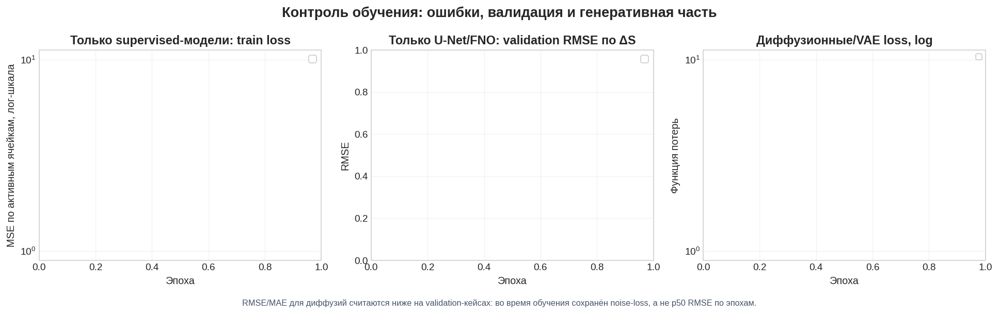

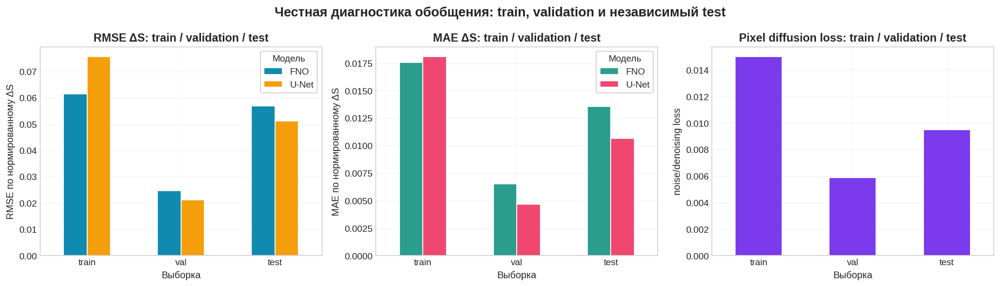

In [ ]:
# История обучения: отдельно показываем supervised-ошибки и diffusion-loss, чтобы разные масштабы не портили график.
if pd is not None and training_rows:
    hist_df = pd.DataFrame(training_rows)
    style_dataframe(hist_df, 'Лог обучения по эпохам и компонентам', precision=5)
else:
    hist_df = None
fig, axes = plt.subplots(1, 3, figsize=(15, 4.6))
if history.get('det_loss'): axes[0].plot(range(1,len(history['det_loss'])+1), history['det_loss'], marker='o', lw=2.2, label='U-Net: обучение')
if history.get('fno_loss'): axes[0].plot(range(1,len(history['fno_loss'])+1), history['fno_loss'], marker='o', lw=2.2, label='FNO: обучение')
axes[0].set_yscale('log'); axes[0].set_title('Только supervised-модели: train loss'); axes[0].set_xlabel('Эпоха'); axes[0].set_ylabel('MSE по активным ячейкам, лог-шкала'); axes[0].legend(); axes[0].grid(alpha=.22)
if history.get('det_val_rmse'): axes[1].plot(range(1,len(history['det_val_rmse'])+1), history['det_val_rmse'], marker='o', lw=2.2, label='U-Net: validation')
if history.get('fno_val_rmse'): axes[1].plot(range(1,len(history['fno_val_rmse'])+1), history['fno_val_rmse'], marker='o', lw=2.2, label='FNO: validation')
axes[1].set_title('Только U-Net/FNO: validation RMSE по ΔS'); axes[1].set_xlabel('Эпоха'); axes[1].set_ylabel('RMSE'); axes[1].legend(); axes[1].grid(alpha=.22)
for key,label in [('diff_loss','пиксельная диффузия: обучение'),('diff_val_loss','пиксельная диффузия: validation'),('vae_loss','VAE'),('latent_diff_loss','латентная диффузия')]:
    if history.get(key): axes[2].plot(range(1,len(history[key])+1), history[key], marker='o', lw=2.2, label=label)
axes[2].set_yscale('log'); axes[2].set_title('Диффузионные/VAE loss, log'); axes[2].set_xlabel('Эпоха'); axes[2].set_ylabel('Функция потерь'); axes[2].legend(fontsize=8); axes[2].grid(alpha=.22)
fig.suptitle('Контроль обучения: ошибки, валидация и генеративная часть', fontsize=15, weight='bold')
fig.text(.5,.01,'RMSE/MAE для диффузий считаются ниже на validation-кейсах: во время обучения сохранён noise-loss, а не p50 RMSE по эпохам.',ha='center',fontsize=9,color='#475569')
plt.tight_layout(rect=(0,.04,1,1)); plt.show()


if pd is not None and 'split_metrics_df' in globals() and len(split_metrics_df):
    fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))
    sup = split_metrics_df[split_metrics_df['Тип метрики']=='delta map'].copy()
    if len(sup):
        pivot = sup.pivot_table(index='Выборка', columns='Модель', values='rmse_delta_norm', aggfunc='mean').reindex(['train','val','test'])
        pivot.plot(kind='bar', ax=axes[0], color=['#118ab2','#f59e0b'], edgecolor='white')
        axes[0].set_title('RMSE ΔS: train / validation / test'); axes[0].set_ylabel('RMSE по нормированному ΔS'); axes[0].tick_params(axis='x', rotation=0); axes[0].grid(axis='y', alpha=.22)
        pivot_mae = sup.pivot_table(index='Выборка', columns='Модель', values='mae_delta_norm', aggfunc='mean').reindex(['train','val','test'])
        pivot_mae.plot(kind='bar', ax=axes[1], color=['#2a9d8f','#ef476f'], edgecolor='white')
        axes[1].set_title('MAE ΔS: train / validation / test'); axes[1].set_ylabel('MAE по нормированному ΔS'); axes[1].tick_params(axis='x', rotation=0); axes[1].grid(axis='y', alpha=.22)
    diff_part = split_metrics_df[split_metrics_df['Модель']=='Пиксельная диффузия'].copy()
    if len(diff_part):
        diff_part.set_index('Выборка').reindex(['train','val','test'])['diffusion_loss'].plot(kind='bar', ax=axes[2], color='#7c3aed', edgecolor='white')
        axes[2].set_title('Pixel diffusion loss: train / validation / test'); axes[2].set_ylabel('noise/denoising loss'); axes[2].tick_params(axis='x', rotation=0); axes[2].grid(axis='y', alpha=.22)
    fig.suptitle('Честная диагностика обобщения: train, validation и независимый test', fontsize=15, weight='bold')
    plt.tight_layout(); plt.show()


## 9. Долгосрочный операционный прогноз: 2025 -> 2075

По умолчанию строится прогноз на **50 лет вперед** с отображением каждые **5 лет**. Получаются карты для 2030, 2035, ..., 2075 и стартовый кадр 2025 в GIF.

Параметры блока:

- `FORECAST_YEARS=50`: полный горизонт;
- `FORECAST_INTERVAL_YEARS=5`: частота кадров и рекурсивных шагов;
- `N_SCENARIOS=32`: размер диффузионного ансамбля.

Можно установить `FORECAST_YEARS=100`, сохранив интервал 5 лет. Интервал 1 год тоже поддерживается, но потребует в пять раз больше диффузионных вызовов.

Важно: после горизонта, представленного в TNavigator-выборке, результат является рекурсивной surrogate-экстраполяцией. Он нужен для сценарной демонстрации и анализа неопределенности, а не заменяет долгосрочный физический расчет TNavigator.


In [ ]:
START_YEAR = 2025
FORECAST_YEARS = 50
FORECAST_INTERVAL_YEARS = 5
HORIZON_YEARS = FORECAST_YEARS  # compatibility alias
N_SCENARIOS = 32
LAYER_INDEX = int(preview_layer) if 'preview_layer' in globals() else 0
BASE_TIME_INDEX = None  # None = последний доступный исторический срез
BASE_SCENARIO_OFFSET = 0
FORECAST_GRID_GROUP = 0

# Опционально: прогноз от пользовательской карты 2025.
# Если путь None, берется стартовая карта выбранного validation-сценария TNavigator.
# Если путь задан, condition все равно берется из явно выбранного сценария управления:
# USER_SCENARIO_NAME или BASE_SCENARIO_OFFSET внутри FORECAST_GRID_GROUP.
USER_BASE_MAP_PATH = None  # например: '/content/my_2025_saturation.npy' или '/content/my_2025_saturation.npz'
USER_SCENARIO_NAME = None  # например: 'Baza_PATTERN002_2__02_five_spot'

forecast_ds = val_ds
if isinstance(train_ds, ForecastActiveNPZDataset):
    matching = [g for g in TRAIN_GROUPS if int(g['grid_group']) == int(FORECAST_GRID_GROUP)]
    if not matching:
        raise ValueError(f'FORECAST_GRID_GROUP={FORECAST_GRID_GROUP} is not in trained groups {[g["grid_group"] for g in TRAIN_GROUPS]}')
    forecast_ds = matching[0]['val_ds']
    if USER_SCENARIO_NAME:
        scenario_lookup = {name: i for i, name in enumerate(forecast_ds.scenario_names)}
        if USER_SCENARIO_NAME not in scenario_lookup:
            raise ValueError(f'USER_SCENARIO_NAME={USER_SCENARIO_NAME} не найден в NPZ.')
        base_scenario = scenario_lookup[USER_SCENARIO_NAME]
        if base_scenario not in forecast_ds.scenario_indices:
            print('Внимание: выбранный USER_SCENARIO_NAME не входит в validation split; используется только как condition-сценарий для операционного прогноза.')
    else:
        base_scenario = forecast_ds.scenario_indices[min(BASE_SCENARIO_OFFSET, len(forecast_ds.scenario_indices)-1)]
    scenario_group_value = int(forecast_ds.scenario_group[base_scenario]) if hasattr(forecast_ds, 'scenario_group') else int(FORECAST_GRID_GROUP)
    if scenario_group_value != int(FORECAST_GRID_GROUP):
        raise ValueError(f'USER_SCENARIO_NAME относится к grid_group={scenario_group_value}, а выбран FORECAST_GRID_GROUP={FORECAST_GRID_GROUP}. Выберите сценарий той же сетки или измените FORECAST_GRID_GROUP.')
    LAYER_INDEX = int(np.clip(LAYER_INDEX, 0, forecast_ds.layers-1))
    scenario_time_count = len(forecast_ds.z[f'times_{base_scenario:03d}'])
    if BASE_TIME_INDEX is None:
        BASE_TIME_INDEX = scenario_time_count - 1
    elif int(BASE_TIME_INDEX) < 0:
        BASE_TIME_INDEX = scenario_time_count + int(BASE_TIME_INDEX)
    BASE_TIME_INDEX = int(np.clip(BASE_TIME_INDEX, 0, scenario_time_count-1))
    mask = forecast_ds.act[LAYER_INDEX].astype(np.float32)
    default_base_map = forecast_ds._layer(base_scenario, BASE_TIME_INDEX, LAYER_INDEX).clip(0,1).astype(np.float32)
    print('forecast condition scenario:', forecast_ds.scenario_names[base_scenario], '| grid_group:', forecast_ds.grid_group, '| layer:', LAYER_INDEX, '| historical start index:', BASE_TIME_INDEX)
else:
    raise RuntimeError('Операционный прогноз без допущений рассчитан на active_tnavigator_multigrid_v2. Загрузите tash_rich_active_soil.npz v2.')

def load_user_base_map(path, expected_shape, mask):
    if path is None:
        return None
    path = Path(path)
    if not path.exists():
        raise FileNotFoundError(f'USER_BASE_MAP_PATH не найден: {path}')
    if path.suffix.lower() == '.npy':
        arr = np.load(path).astype(np.float32)
    elif path.suffix.lower() == '.npz':
        z = np.load(path)
        preferred = [k for k in ['base_map','saturation','soil','SOIL','arr_0'] if k in z.files]
        if not preferred:
            raise KeyError(f'В {path} нет ключей base_map/saturation/soil/SOIL/arr_0. Доступные: {z.files}')
        arr = z[preferred[0]].astype(np.float32)
    elif path.suffix.lower() in ['.csv', '.txt']:
        arr = np.loadtxt(path, delimiter=',' if path.suffix.lower()=='.csv' else None).astype(np.float32)
    else:
        raise ValueError(f'Неподдерживаемый формат карты: {path.suffix}. Используйте .npy/.npz/.csv/.txt')
    arr = np.squeeze(arr)
    if arr.shape != tuple(expected_shape):
        raise ValueError(f'Форма пользовательской карты {arr.shape} не совпадает с ожидаемой {expected_shape}. Нужен 2D слой той же grid-группы и размера.')
    arr = np.clip(np.nan_to_num(arr, nan=0.0), 0, 1).astype(np.float32)
    return (arr * mask + default_base_map * (1-mask)).astype(np.float32)

user_map = load_user_base_map(USER_BASE_MAP_PATH, default_base_map.shape, mask)
base_map = user_map if user_map is not None else default_base_map
print('forecast base map source:', 'USER_BASE_MAP_PATH' if user_map is not None else 'TNavigator validation scenario')

FORECAST_ENFORCE_NONINCREASING_SOIL = True
_hist_times = np.asarray(forecast_ds.z[f'times_{base_scenario:03d}'], dtype=float)
_hist_mask = mask.astype(bool)
_hist_means = np.asarray([float(forecast_ds._layer(base_scenario, ti, LAYER_INDEX).clip(0,1)[_hist_mask].mean()) for ti in range(len(_hist_times))], dtype=float)
_hist_year_span = max(float((_hist_times[-1] - _hist_times[0]) / 365.25), 1e-6)
_hist_decline_per_year = max(0.0, float((_hist_means[0] - _hist_means[-1]) / _hist_year_span))
FORECAST_TARGET_MEAN_DELTA_PER_STEP = -_hist_decline_per_year * float(FORECAST_INTERVAL_YEARS)
print('forecast mean-trend guard:', {'enabled': FORECAST_ENFORCE_NONINCREASING_SOIL, 'history_start_mean': round(float(_hist_means[0]),6), 'history_end_mean': round(float(_hist_means[-1]),6), 'decline_per_year': round(_hist_decline_per_year,6), 'target_delta_per_step': round(FORECAST_TARGET_MEAN_DELTA_PER_STEP,6)})

def build_forecast_batch(ds, scenario_idx, current_map, current_mask, rel_horizon, layer_index, rel_horizon_days=None):
    """Condition для прогноза: base map + mask + static + well maps + controls + horizon + layer."""
    if not isinstance(ds, ForecastActiveNPZDataset):
        raise RuntimeError('build_forecast_batch требует ForecastActiveNPZDataset v2.')
    static = ds._static_layer(layer_index).astype(np.float32)
    maps = ds._active_channels_to_layer(ds._well_active(scenario_idx), layer_index).astype(np.float32)
    control = ds._control(scenario_idx).astype(np.float32)
    if static.shape[0] < 6 or maps.shape[0] < 10 or control.shape[0] < 36:
        raise ValueError({
            'message': 'Неполный condition для прогноза: нет всех static/well/control регрессоров.',
            'static_shape': static.shape,
            'maps_shape': maps.shape,
            'control_shape': control.shape,
            'scenario': ds.scenario_names[scenario_idx],
        })
    return {
        'base': torch.from_numpy(norm01_to_n11(current_map))[None,None],
        'target': torch.zeros((1,1,*current_map.shape), dtype=torch.float32),
        'mask': torch.from_numpy(current_mask.astype(np.float32))[None,None],
        'static': torch.from_numpy(static)[None],
        'control': torch.from_numpy(control)[None],
        'maps': torch.from_numpy(maps)[None],
        'delta_norm': torch.tensor([[float(rel_horizon)]], dtype=torch.float32),
        'delta_days_norm': torch.tensor([[float(globals().get('FORECAST_STEP_DAYS_NORM', rel_horizon) if rel_horizon_days is None else rel_horizon_days)]], dtype=torch.float32),
        'z_norm': torch.tensor([[layer_index/max(1,ds.layers-1)]], dtype=torch.float32),
    }

scenario_times_days=np.asarray(forecast_ds.z[f'times_{base_scenario:03d}'],dtype=float)
positive_steps=np.diff(scenario_times_days); positive_steps=positive_steps[positive_steps>0]
MEDIAN_SNAPSHOT_DAYS=float(np.median(positive_steps)) if len(positive_steps) else 365.25
FORECAST_STEP_INDICES=FORECAST_INTERVAL_YEARS*365.25/MEDIAN_SNAPSHOT_DAYS
FORECAST_STEP_NORM=min(FORECAST_STEP_INDICES/max(1,max_delta_steps),1.0)
FORECAST_STEP_DAYS_NORM=(FORECAST_INTERVAL_YEARS*365.25)/max(1.0,float(HORIZON_DAYS_SCALE))
TRAINED_MAX_HORIZON_YEARS=HORIZON_DAYS_SCALE/365.25
print('Временная шкала:', {'медианный_шаг_сут':round(MEDIAN_SNAPSHOT_DAYS,1),'индексов_на_интервал':round(FORECAST_STEP_INDICES,2),'delta_norm':round(FORECAST_STEP_NORM,3),'delta_days_norm':round(FORECAST_STEP_DAYS_NORM,3),'обученный_макс_горизонт_лет':round(TRAINED_MAX_HORIZON_YEARS,2)})
if FORECAST_INTERVAL_YEARS > TRAINED_MAX_HORIZON_YEARS:
    print('TIME_WARNING: один рекурсивный шаг длиннее максимального горизонта обучающих пар; delta_norm ограничен 1.0.')

request=ForecastRequest(base_map,(mask>0.5).astype(np.float32),START_YEAR,FORECAST_YEARS,N_SCENARIOS,LAYER_INDEX,FORECAST_INTERVAL_YEARS)
forecast_condition_preview = build_forecast_batch(forecast_ds, base_scenario, base_map, request.mask, FORECAST_STEP_NORM, LAYER_INDEX, FORECAST_STEP_DAYS_NORM)
print('forecast condition contract:', {k: tuple(v.shape) for k,v in forecast_condition_preview.items()})
print('forecast condition channels:', make_condition(forecast_condition_preview, max_delta_steps=max_delta_steps, layers=forecast_ds.layers).shape[1])

@torch.no_grad()
def diffusion_sampler(cur, rel, seed):
    torch.manual_seed(int(seed))
    b = build_forecast_batch(forecast_ds, base_scenario, cur, request.mask, rel, LAYER_INDEX, FORECAST_STEP_DAYS_NORM)
    c = make_condition(b, max_delta_steps=max_delta_steps, layers=forecast_ds.layers)
    return diff.sample(c,sampler='ddim',ddim_eta=0.0)[0,0].detach().cpu().numpy()

forecast=rollout(request,diffusion_sampler,dS_clip,seed0=1234)
print('forecast samples:',forecast.samples.shape,'years:',forecast.years)
print('Долгосрочный режим:', {'горизонт_лет': FORECAST_YEARS, 'интервал_лет': FORECAST_INTERVAL_YEARS, 'кадров_GIF': len(forecast.years)+1})
print('ПРЕДУПРЕЖДЕНИЕ: дальняя часть является рекурсивной surrogate-экстраполяцией за пределы наблюдаемого TNavigator-горизонта.')
forecast_p50_preview=forecast.summary()['p50']
forecast_mask_bool=forecast.mask.astype(bool)
mean_change_final=float((forecast_p50_preview[-1]-forecast.base_map)[forecast_mask_bool].mean())
mean_abs_change_final=float(np.abs(forecast_p50_preview[-1]-forecast.base_map)[forecast_mask_bool].mean())
print('Изменение p50 к финальному году:', {'mean_delta': round(mean_change_final,6), 'mean_abs_delta': round(mean_abs_change_final,6), 'full_color_scale': '0..1'})
if mean_abs_change_final < 0.02:
    print('VISUAL_WARNING: изменение мало относительно шкалы 0..1; используйте ΔS_o-панели и новый двухпанельный GIF.')


forecast condition scenario: Baza_PATTERN002_2__05_random_2i4p | grid_group: 0 | layer: 27 | historical start index: 31
forecast base map source: TNavigator validation scenario
forecast mean-trend guard: {'enabled': True, 'history_start_mean': 0.840214, 'history_end_mean': 0.814588, 'decline_per_year': 0.001311, 'target_delta_per_step': -0.006553}
Временная шкала: {'медианный_шаг_сут': 223.0, 'индексов_на_интервал': 8.19, 'delta_norm': 0.227, 'delta_days_norm': 0.224, 'обученный_макс_горизонт_лет': 22.35}
forecast condition contract: {'base': (1, 1, 146, 72), 'target': (1, 1, 146, 72), 'mask': (1, 1, 146, 72), 'static': (1, 6, 146, 72), 'control': (1, 36), 'maps': (1, 10, 146, 72), 'delta_norm': (1, 1), 'delta_days_norm': (1, 1), 'z_norm': (1, 1)}
forecast condition channels: 94


Долгосрочный ансамбль:   0%|          | 0/32 [00:00<?, ?it/s]

forecast samples: (32, 10, 146, 72) years: [2030, 2035, 2040, 2045, 2050, 2055, 2060, 2065, 2070, 2075]
Долгосрочный режим: {'горизонт_лет': 50, 'интервал_лет': 5, 'кадров_GIF': 11}
ПРЕДУПРЕЖДЕНИЕ: дальняя часть является рекурсивной surrogate-экстраполяцией за пределы наблюдаемого TNavigator-горизонта.
Изменение p50 к финальному году: {'mean_delta': -0.092003, 'mean_abs_delta': 0.102658, 'full_color_scale': '0..1'}


## 10. Иллюстрации условного ансамбля и GIF

Ансамбль содержит 32 независимые реализации диффузионного прогноза для **одной стартовой карты и одного набора режимов**. На fan-chart и временных графиках тонкими линиями показываются все реализации; p50 является медианой, а среднее — арифметическим средним и может смещаться из-за асимметрии или выбросов.

Прогноз начинается с последнего доступного исторического среза TNavigator. Поэтому история и прогноз должны сходиться в одной точке начала прогноза без искусственного скачка.


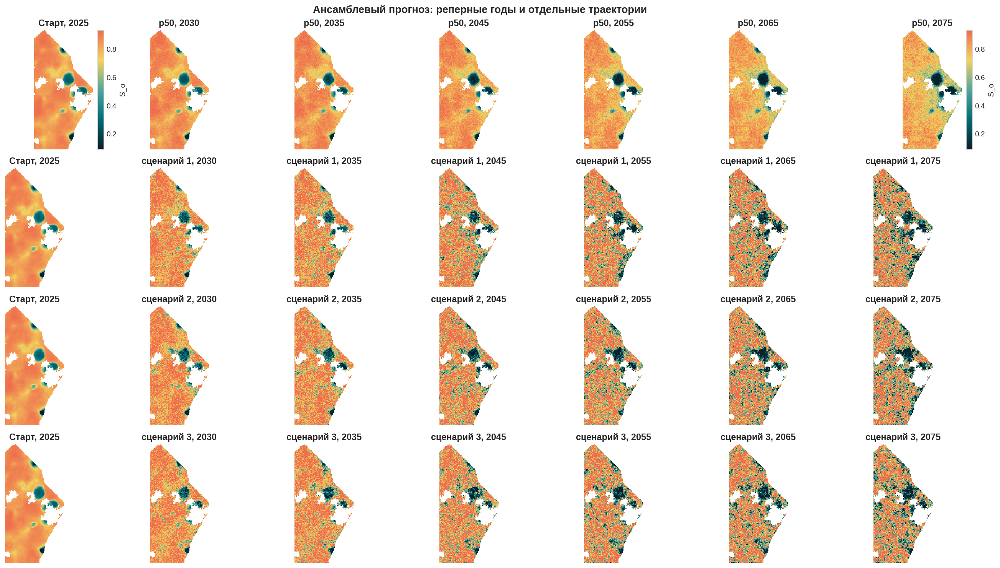

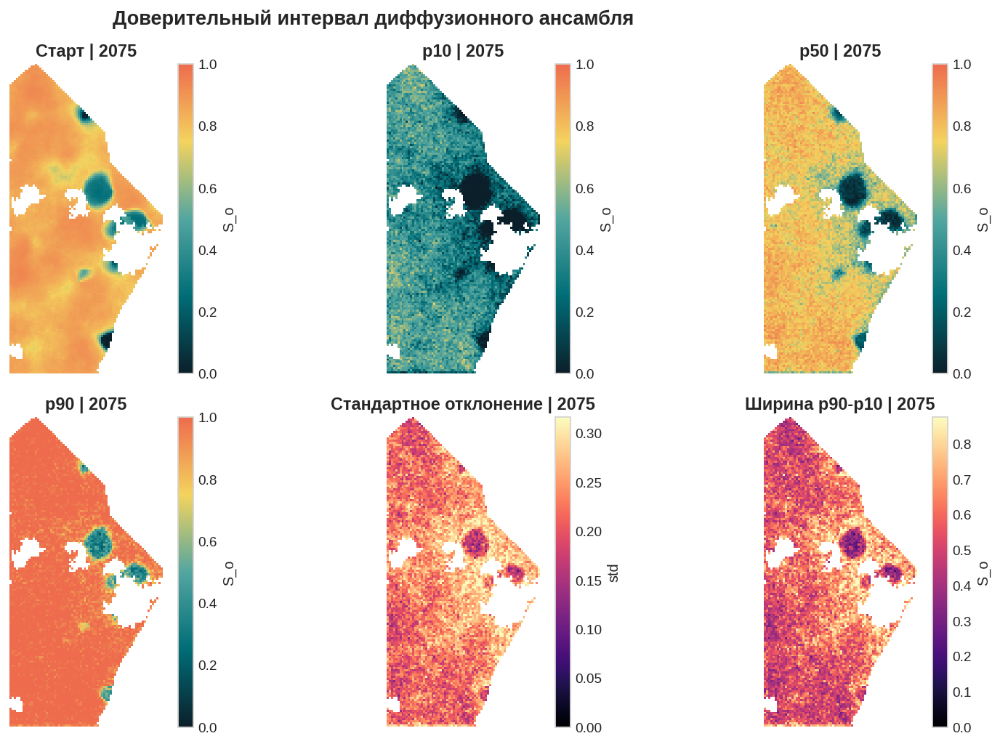

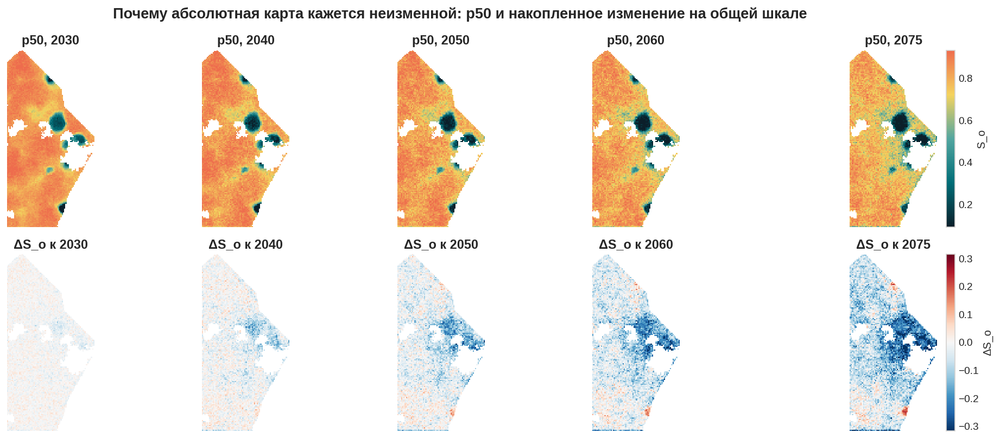

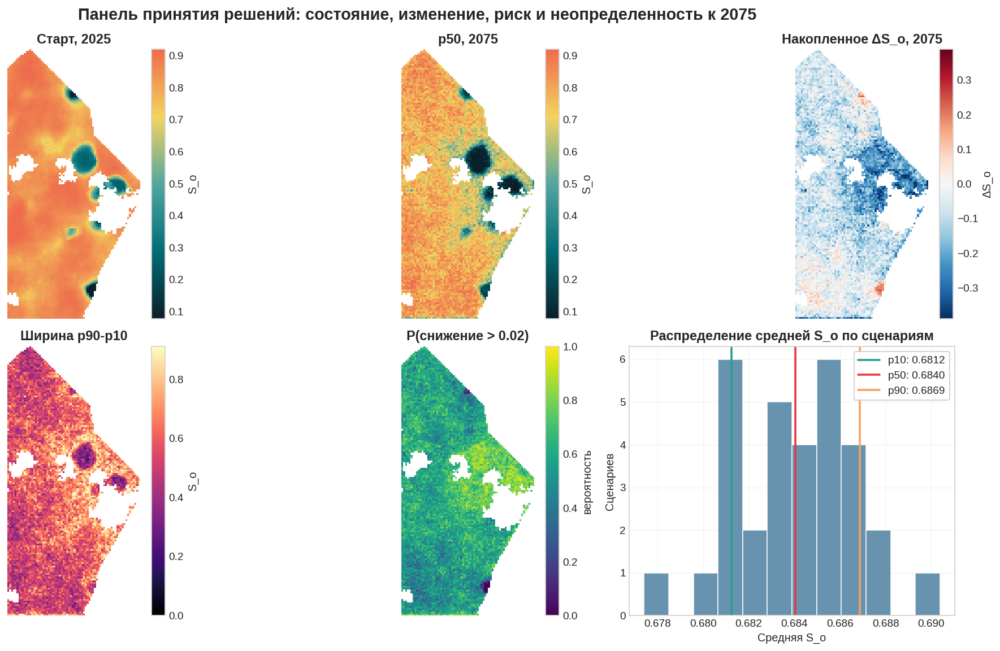

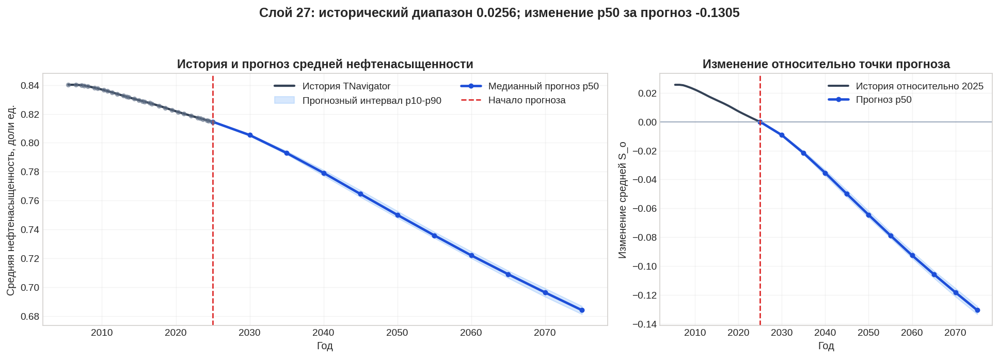

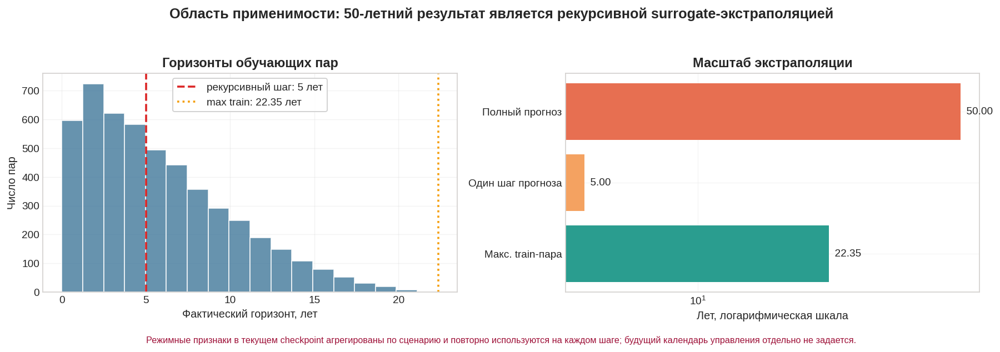

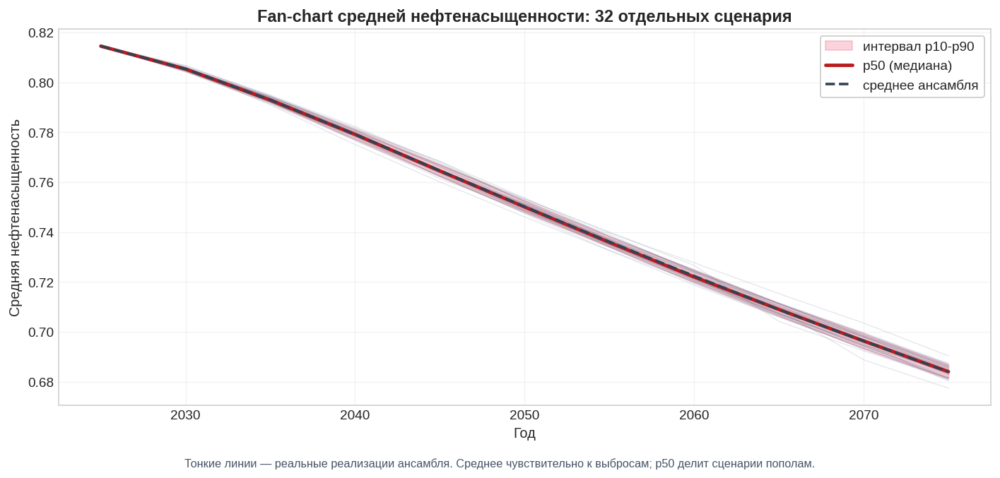

,Год,Среднее ансамбля,p10 среднего,p50 среднего,p90 среднего,std сценариев,ср. ширина p90-p10
0,2030,0.80544,0.80464,0.80539,0.80599,0.00058,0.22524
1,2035,0.79305,0.79206,0.79296,0.79434,0.00096,0.31164
2,2040,0.77923,0.77727,0.77919,0.78119,0.00155,0.36613
3,2045,0.76466,0.76242,0.76455,0.76714,0.00191,0.40953
4,2050,0.75025,0.74803,0.75008,0.75276,0.00184,0.44728
5,2055,0.73613,0.73406,0.73589,0.73832,0.00184,0.48035
6,2060,0.72242,0.72002,0.72204,0.72477,0.00208,0.51009
7,2065,0.70895,0.70637,0.70899,0.71143,0.00222,0.53883
8,2070,0.69630,0.69337,0.69634,0.69923,0.00271,0.56265
9,2075,0.68401,0.68124,0.68404,0.68686,0.00259,0.58969


saved gif p50: /content/outputs/forecast_p50_2025_2075_step5.gif
saved gif scenario strip S_o: /content/outputs/forecast_scenarios_strip_soil_2025_2075.gif
saved gif scenario strip ΔS_o: /content/outputs/forecast_scenarios_strip_delta_2025_2075.gif
saved npz: /content/outputs/forecast_ensemble_summary.npz


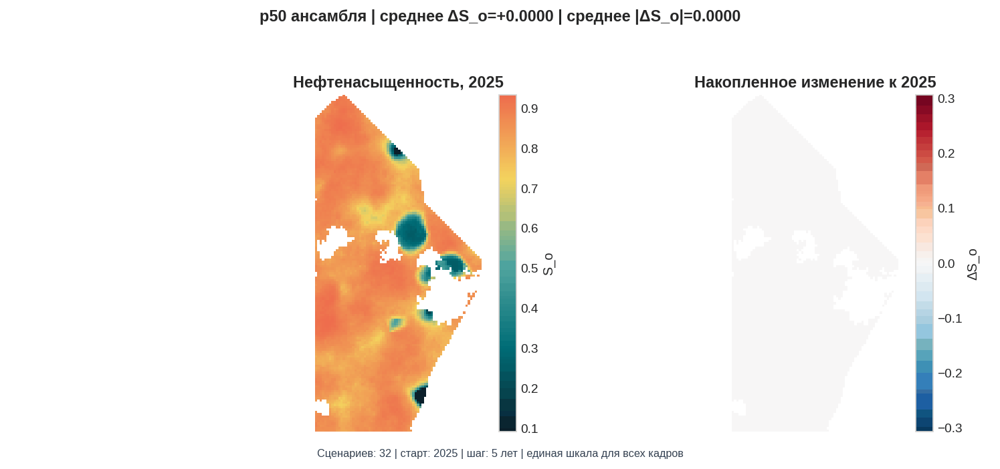

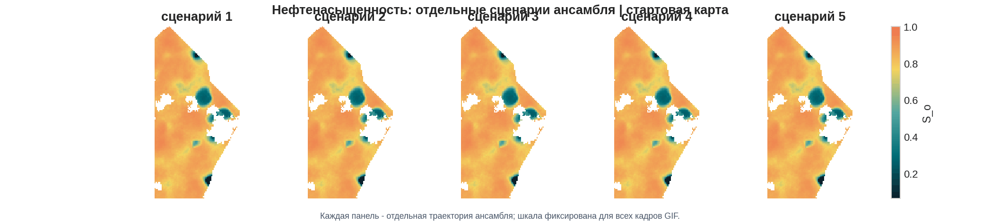

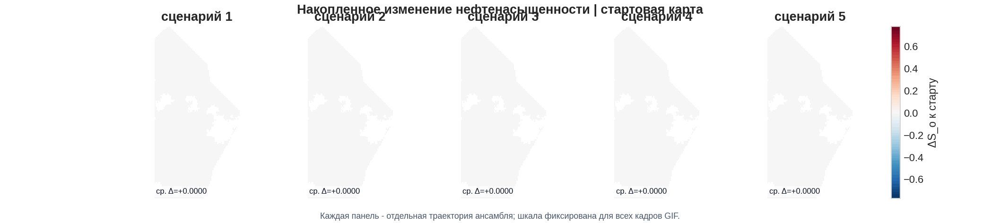

In [ ]:
plot_forecast_grid(forecast); plt.show()
plot_uncertainty(forecast); plt.show()
plot_change_visibility(forecast); plt.show()
plot_decision_dashboard(forecast,depletion_threshold=0.02); plt.show()
plot_history_and_forecast(forecast, forecast_ds, base_scenario, LAYER_INDEX); plt.show()
plot_forecast_applicability(forecast, train_datasets); plt.show()
plot_fan(forecast); plt.show()
forecast_table = show_table(forecast_timeseries_rows(forecast), max_rows=20, caption='Таблица прогноза по годам: p10/p50/p90 и разброс ансамбля', precision=5)

gif_name=f'forecast_p50_{START_YEAR}_{START_YEAR+FORECAST_YEARS}_step{FORECAST_INTERVAL_YEARS}.gif'
gif_path=save_gif(forecast, PROJECT_ROOT/'outputs'/gif_name, stat='p50')
strip_soil_path=save_scenario_strip_gif(
    forecast,
    PROJECT_ROOT/'outputs'/f'forecast_scenarios_strip_soil_{START_YEAR}_{START_YEAR+FORECAST_YEARS}.gif',
    scenarios=range(min(5, forecast.samples.shape[0])),
    view='soil',
)
strip_delta_path=save_scenario_strip_gif(
    forecast,
    PROJECT_ROOT/'outputs'/f'forecast_scenarios_strip_delta_{START_YEAR}_{START_YEAR+FORECAST_YEARS}.gif',
    scenarios=range(min(5, forecast.samples.shape[0])),
    view='delta',
)
np.savez_compressed(PROJECT_ROOT/'outputs/forecast_ensemble_summary.npz', years=np.array(forecast.years), samples=forecast.samples, base_map=forecast.base_map, mask=forecast.mask, **forecast.summary())
print('saved gif p50:', gif_path)
print('saved gif scenario strip S_o:', strip_soil_path)
print('saved gif scenario strip ΔS_o:', strip_delta_path)
print('saved npz:', PROJECT_ROOT/'outputs/forecast_ensemble_summary.npz')
if IPyImage is not None:
    display(IPyImage(filename=str(gif_path)))
    display(IPyImage(filename=str(strip_soil_path)))
    display(IPyImage(filename=str(strip_delta_path)))


## 10.1 Demo-ready аналитические виды

Эти графики сделаны специально для демонстрации прототипа. Они отвечают на вопросы, которые обычно задают на защите:

- какая карта была на входе;
- какой медианный прогноз модель дает на конец горизонта;
- где модель не уверена;
- где есть риск заметного падения насыщенности;
- насколько расходятся сценарии;
- как ведут себя самые неопределенные ячейки;
- можно ли быстро забрать картинки в презентацию.

Каждый график не только отображается в output ячейки, но и сохраняется в `outputs/demo_figures/` как PNG.


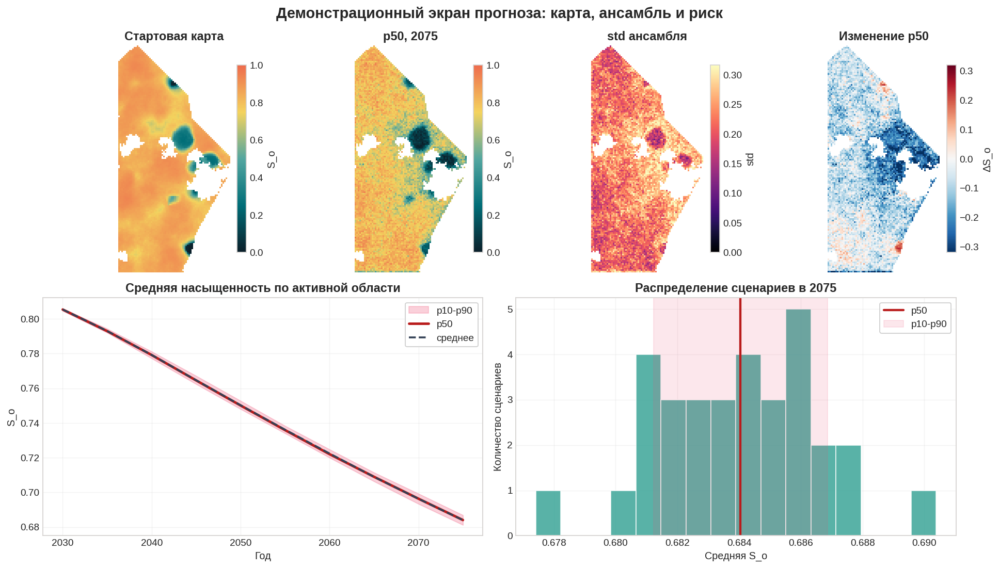

saved: /content/outputs/demo_figures/01_executive_summary.png


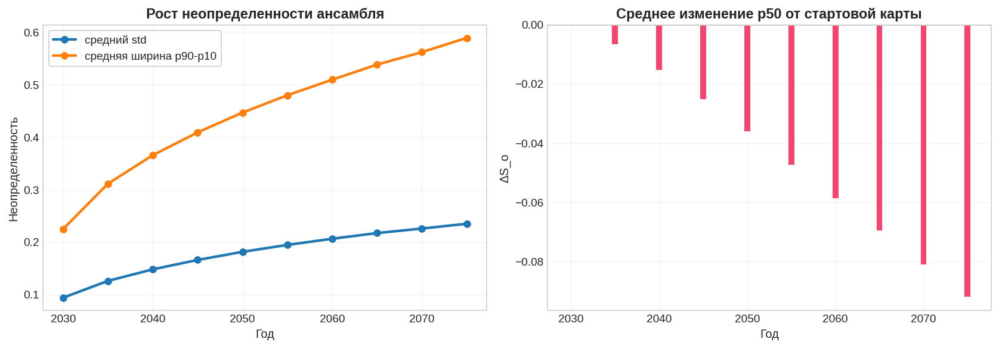

saved: /content/outputs/demo_figures/02_uncertainty_evolution.png


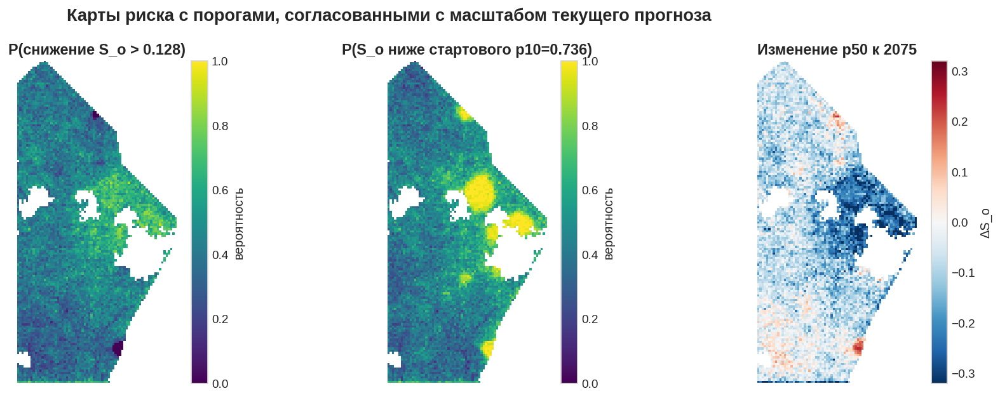

saved: /content/outputs/demo_figures/03_probability_maps.png


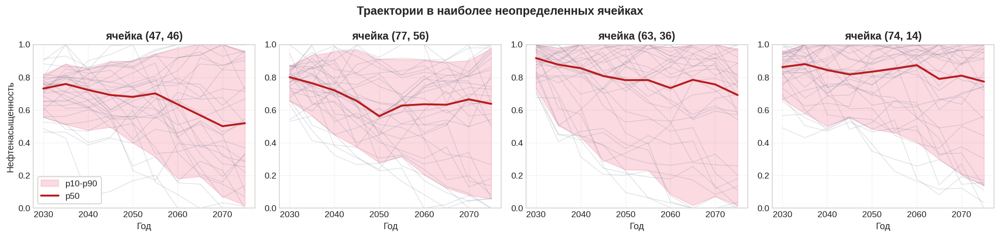

saved: /content/outputs/demo_figures/04_uncertain_cell_trajectories.png


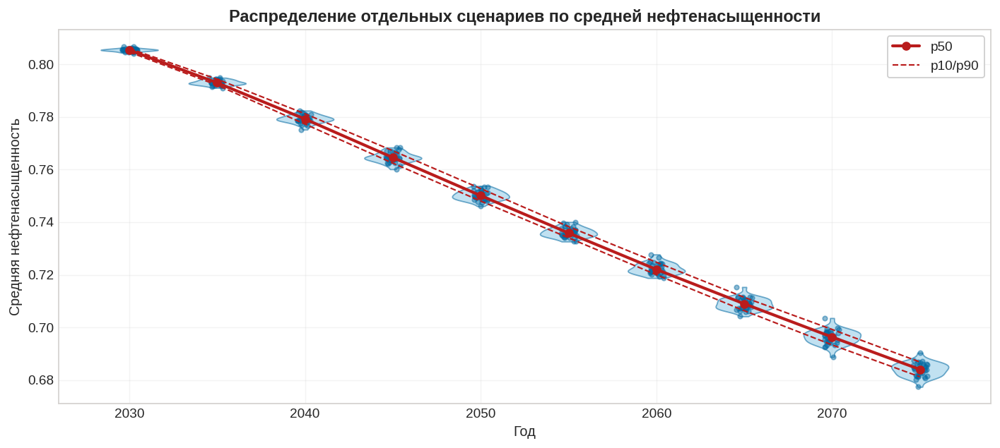

saved: /content/outputs/demo_figures/05_scenario_distribution.png


,figure,path
0,01_executive_summary,/content/outputs/demo_figures/01_executive_sum...
1,02_uncertainty_evolution,/content/outputs/demo_figures/02_uncertainty_e...
2,03_probability_maps,/content/outputs/demo_figures/03_probability_m...
3,04_uncertain_cell_trajectories,/content/outputs/demo_figures/04_uncertain_cel...
4,05_scenario_distribution,/content/outputs/demo_figures/05_scenario_dist...


,figure,path
0,01_executive_summary,/content/outputs/demo_figures/01_executive_sum...
1,02_uncertainty_evolution,/content/outputs/demo_figures/02_uncertainty_e...
2,03_probability_maps,/content/outputs/demo_figures/03_probability_m...
3,04_uncertain_cell_trajectories,/content/outputs/demo_figures/04_uncertain_cel...
4,05_scenario_distribution,/content/outputs/demo_figures/05_scenario_dist...


In [ ]:
demo_dir = PROJECT_ROOT / 'outputs' / 'demo_figures'
demo_dir.mkdir(parents=True, exist_ok=True)

def show_and_save(fig, name):
    path = demo_dir / f'{name}.png'
    fig.savefig(path, bbox_inches='tight')
    plt.show()
    print('saved:', path)
    return path

demo_figures = {}
demo_figures['01_executive_summary'] = show_and_save(plot_demo_summary(forecast), '01_executive_summary')
demo_figures['02_uncertainty_evolution'] = show_and_save(plot_uncertainty_evolution(forecast), '02_uncertainty_evolution')
demo_figures['03_probability_maps'] = show_and_save(plot_probability_maps(forecast, depletion_threshold=None, low_sat_threshold=None), '03_probability_maps')
demo_figures['04_uncertain_cell_trajectories'] = show_and_save(plot_point_trajectories(forecast), '04_uncertain_cell_trajectories')
demo_figures['05_scenario_distribution'] = show_and_save(plot_ensemble_distribution(forecast), '05_scenario_distribution')
show_table([{'figure':k, 'path':str(v)} for k,v in demo_figures.items()], max_rows=10)


## 10.2 Пространственная структура изменений и сравнение с TNavigator

Семивариограмма показывает, насколько быстро меняется поле в пространстве при увеличении расстояния между ячейками. В абсолютных картах нефтенасыщенности общий высокий фон может задавить полезный сигнал, поэтому ниже сравниваются карты изменений `ΔS_o`, а не сами карты `S_o`.

Кривые нормируются по собственному масштабу, чтобы смотреть именно форму пространственной изменчивости. Отдельная таблица под графиком показывает исходный sill/amplitude: если у диффузии амплитуда мала, значит ансамбль генерирует более сглаженные изменения, чем семейство TNavigator.


TNavigator-карты изменений для сравнения: (2, 146, 72) | карты изменений диффузии: (32, 146, 72)


,направление,выборка,median sill
0,горизонталь 0°,диффузия,0.065190
1,горизонталь 0°,TNavigator,0.000102
2,вертикаль 90°,диффузия,0.063181
3,вертикаль 90°,TNavigator,0.000096
4,диагональ 45°,диффузия,0.068136
5,диагональ 45°,TNavigator,0.000089
6,диагональ 135°,диффузия,0.064549
7,диагональ 135°,TNavigator,0.000081


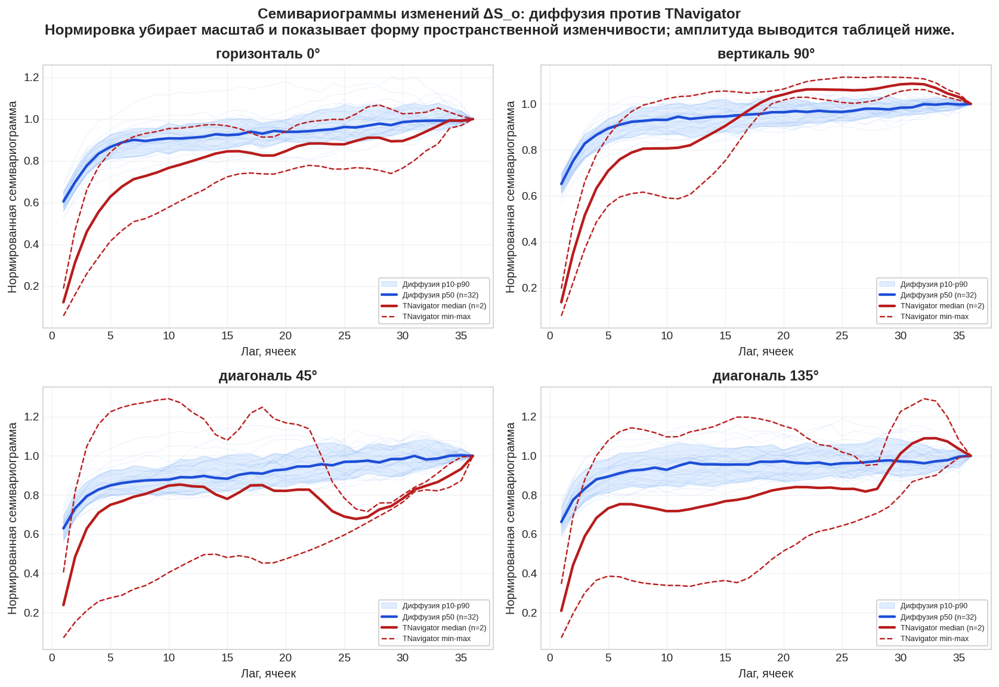

Контекстный график семейства TNavigator скрыт по умолчанию: он не является проверкой попадания прогноза в факт.


In [ ]:
# Spatial statistics: сравниваем не абсолютные карты, а карты изменений, чтобы проверить структуру вытеснения.
tnav_ref_deltas, tnav_ref_names = tnav_reference_delta_maps(forecast_ds, LAYER_INDEX, base_index=None, target_index=-1, max_maps=N_SCENARIOS)
generated_deltas = forecast.samples[:,-1] - forecast.base_map[None]
print('TNavigator-карты изменений для сравнения:', tnav_ref_deltas.shape, '| карты изменений диффузии:', generated_deltas.shape)
if tnav_ref_deltas.shape[0] > 0:
    plot_semivariogram_comparison(generated_deltas, tnav_ref_deltas, request.mask, title='Семивариограммы изменений ΔS_o: диффузия против TNavigator', normalize=True); plt.show()
else:
    print('Для этого набора данных нет TNavigator-карт изменений для сравнения.')

SHOW_CONTEXT_TNAV_FAMILY = False
if SHOW_CONTEXT_TNAV_FAMILY:
    plot_tnav_response_curves(forecast, forecast_ds, LAYER_INDEX); plt.show()
else:
    print('Контекстный график семейства TNavigator скрыт по умолчанию: он не является проверкой попадания прогноза в факт.')


## 10.3 Validation-прогноз с фактом TNavigator

Это главный проверочный график: берем отложенный validation-сценарий, показываем его фактическую историю до базового снимка и строим прогноз на следующие доступные снимки. В отличие от 50-летнего рекурсивного прогноза, здесь есть фактическая траектория TNavigator после базовой точки, поэтому модель можно проверить напрямую.

На графике одновременно показаны: история TNavigator, фактическое продолжение TNavigator, отдельные линии ансамбля диффузии, интервал p10-p90, медиана p50, U-Net, FNO и таблица ключевых метрик.


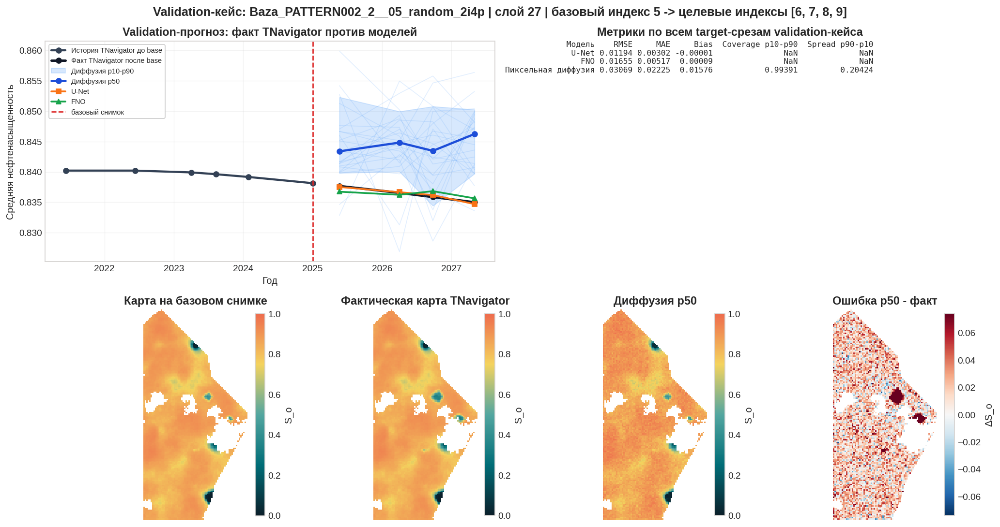

,Модель,RMSE,MAE,Bias,Coverage p10-p90,Spread p90-p10
0,U-Net,0.01194,0.00302,-0.00001,nan,nan
1,FNO,0.01655,0.00517,0.00009,nan,nan
2,Пиксельная диффузия,0.03069,0.02225,0.01576,0.99391,0.20424


,Модель,RMSE,MAE,Bias,Coverage p10-p90,Spread p90-p10
0,U-Net,0.01194,0.00302,-0.00001,NaN,NaN
1,FNO,0.01655,0.00517,0.00009,NaN,NaN
2,Пиксельная диффузия,0.03069,0.02225,0.01576,0.99391,0.20424


In [ ]:
# Выбираем отложенный validation-сценарий с максимально длинной доступной историей в текущей grid-группе.
val_scenarios = list(getattr(forecast_ds, 'scenario_indices', []))
base_for_val = 5
best_s = max(val_scenarios, key=lambda s: len(forecast_ds.z[f'times_{s:03d}'])) if val_scenarios else base_scenario
T_val = len(forecast_ds.z[f'times_{best_s:03d}'])
base_for_val = min(base_for_val, max(0, T_val-3))
targets_for_val = list(range(base_for_val+1, min(T_val, base_for_val+5)))
validation_case = validation_forecast_case(forecast_ds, best_s, LAYER_INDEX, base_for_val, targets_for_val, n_ens=min(N_SCENARIOS, 24))
fig, validation_case_metrics = plot_validation_forecast_against_truth(validation_case)
plt.show()
style_dataframe(pd.DataFrame(validation_case_metrics) if pd is not None else validation_case_metrics, 'Validation-прогноз: метрики против факта TNavigator', precision=5)


## 11. Сравнение с U-Net, FNO и статистическими baseline

`Без изменения` и `Средняя дельта` — детерминированные контрольные прогнозы. Для них корректны RMSE, MAE и bias, но нет настоящего интервала p10-p90.

CRPS оценивает сразу точность и распределение вероятностного ансамбля: он штрафует и смещение относительно факта, и чрезмерный разброс. Чем меньше CRPS, тем лучше. В этом notebook CRPS и coverage теперь показываются только для стохастических ансамблей: диффузии, Монте-Карло и латинского гиперкуба.

Линия идеальной калибровки не означает, что модель была откалибрована. Это диагностический ориентир: номинальный интервал 80% должен содержать факт примерно в 80% независимых случаев.


delta-bank for baselines: (452, 146, 72)


Долгосрочный ансамбль:   0%|          | 0/1 [00:00<?, ?it/s]

Долгосрочный ансамбль:   0%|          | 0/1 [00:00<?, ?it/s]

,Модель,active_mean_p50,active_delta_p50,active_mass_p50,tv_p50,mean_spread_p90_p10,mean_std
0,Пиксельная диффузия,0.72259,-0.09200,4748.83154,0.06158,0.58969,0.23523
1,U-Net,0.74828,-0.06631,4917.71680,0.01944,0.00000,0.00000
2,FNO,0.74928,-0.06531,4924.27734,0.02196,0.00000,0.00000
3,Средняя дельта,0.81303,-0.00156,5343.25244,0.01479,0.00000,0.00000
4,Монте-Карло,0.81459,0.00000,5353.47363,0.01475,0.00067,0.00451
5,Латинский гиперкуб,0.81459,0.00000,5353.47363,0.01475,0.00045,0.00697


,Модель,RMSE p50,MAE p50,Bias p50,Coverage p10-p90,CRPS,Spread p90-p10,RMSE_pp,MAE_pp,Bias_pp,NRMSE_pct_range,"MAPE, %",SSIM,PSNR_db,active_mean_p50,active_delta_p50,active_mass_p50,tv_p50,mean_spread_p90_p10,mean_std
0,Без изменения,0.00005,0.00000,0.00000,nan,nan,nan,0.00482,0.00048,0.00006,0.02986,0.00056,1.00000,86.34178,0.84021,0.00000,5521.88428,0.01057,0.00000,0.00000
1,U-Net,0.00222,0.00139,-0.00047,nan,nan,nan,0.22198,0.13896,-0.04694,1.37574,0.35072,0.99972,53.07376,0.83974,-0.00047,5518.79492,0.01065,0.00000,0.00000
2,FNO,0.00376,0.00271,-0.00147,nan,nan,nan,0.37634,0.27087,-0.14748,2.33239,0.47297,0.99929,48.48846,0.83874,-0.00148,5512.18750,0.01068,0.00000,0.00000
3,Средняя дельта,0.00326,0.00194,-0.00155,nan,nan,nan,0.32615,0.19389,-0.15547,2.02137,1.52554,0.99951,49.73157,0.83866,-0.00156,5511.66309,0.01062,0.00000,0.00000
4,Пиксельная диффузия,0.02394,0.01960,0.01520,1.00000,0.02233,0.20362,2.39356,1.96048,1.52028,14.83435,28.79761,0.97986,32.41911,0.85542,0.01520,5621.79297,0.02342,0.20362,0.08493
5,Латентная диффузия,0.03404,0.02976,-0.02932,0.98433,0.02269,0.16950,3.40380,2.97555,-2.93242,21.09544,3.97758,0.98156,29.36071,0.81089,-0.02932,5329.16113,0.01759,0.16950,0.07154
6,Монте-Карло,0.00005,0.00000,0.00000,0.99239,0.00009,0.00054,0.00482,0.00048,0.00006,0.02986,0.00056,1.00000,86.34178,0.84021,0.00000,5521.88428,0.01057,0.00054,0.00790
7,Латинский гиперкуб,0.00005,0.00000,0.00000,0.99194,0.00009,0.00053,0.00483,0.00048,0.00006,0.02992,0.00057,1.00000,86.32484,0.84021,0.00000,5521.88477,0.01057,0.00053,0.00898


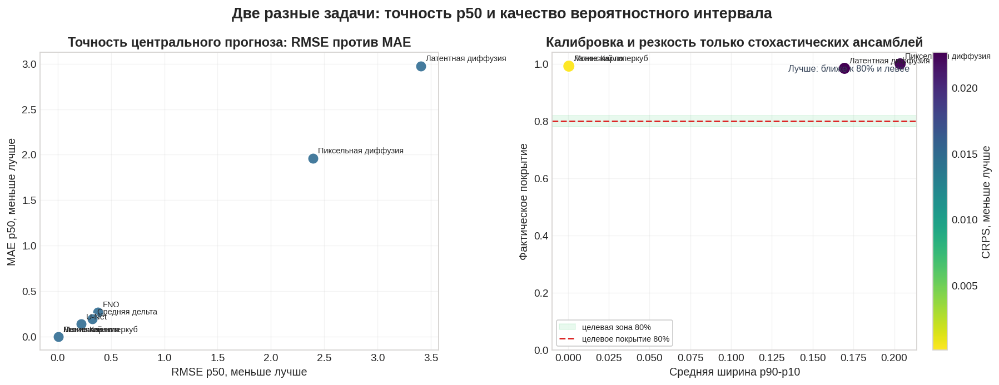

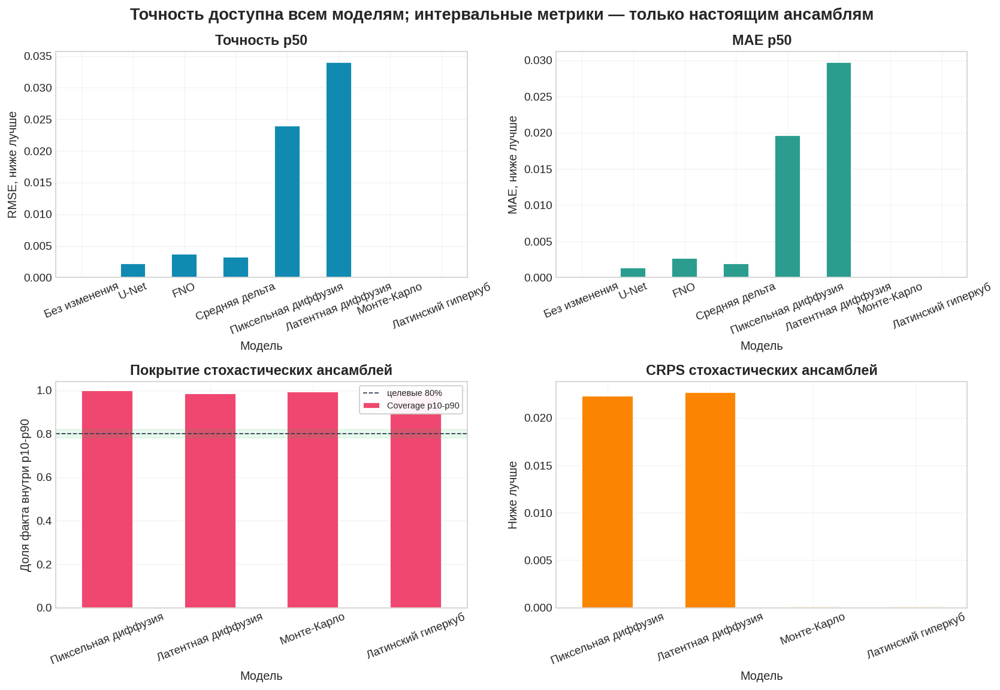

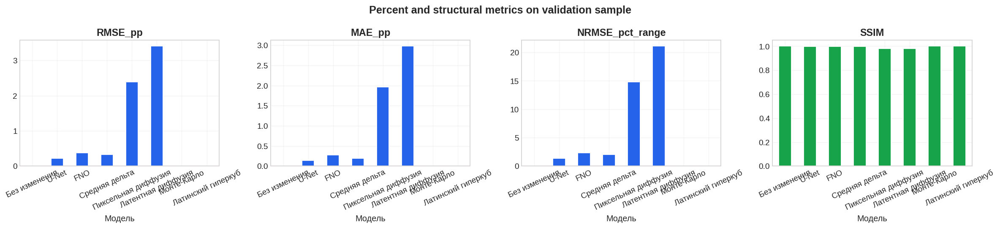

In [ ]:
# Сравнение моделей и ансамблей. Банк delta собирается той же формы, что forecast-карта.
train_deltas=[]
for ds in (train_datasets if 'train_datasets' in globals() else [train_ds]):
    step=max(1, len(ds)//450)
    for i in range(0, len(ds), step):
        d=ds[i]['target'][0].numpy()*dS_clip
        if d.shape == base_map.shape: train_deltas.append(d)
train_deltas=np.stack(train_deltas) if train_deltas else np.zeros((1,*base_map.shape),np.float32)
print('delta-bank for baselines:', train_deltas.shape)
mc=mc_delta_ensemble(base_map,train_deltas,N_SCENARIOS,42); lhs=lhs_delta_ensemble(base_map,train_deltas,N_SCENARIOS,42); mean_delta=mean_delta_ensemble(base_map,train_deltas,N_SCENARIOS,42)
@torch.no_grad()
def det_sampler(cur, rel, seed):
    b = build_forecast_batch(forecast_ds, base_scenario, cur, request.mask, rel, LAYER_INDEX)
    c = make_condition(b, max_delta_steps=max_delta_steps, layers=forecast_ds.layers)
    return det(c)[0,0].detach().cpu().numpy()
det_forecast=rollout(ForecastRequest(base_map,request.mask,START_YEAR,FORECAST_YEARS,1,LAYER_INDEX,FORECAST_INTERVAL_YEARS),det_sampler,dS_clip,seed0=7); det_repeated=np.repeat(det_forecast.samples[:,-1],N_SCENARIOS,0)
@torch.no_grad()
def fno_sampler(cur, rel, seed):
    b = build_forecast_batch(forecast_ds, base_scenario, cur, request.mask, rel, LAYER_INDEX)
    c = make_condition(b, max_delta_steps=max_delta_steps, layers=forecast_ds.layers)
    return fno(c)[0,0].detach().cpu().numpy()
fno_forecast=rollout(ForecastRequest(base_map,request.mask,START_YEAR,FORECAST_YEARS,1,LAYER_INDEX,FORECAST_INTERVAL_YEARS),fno_sampler,dS_clip,seed0=9); fno_repeated=np.repeat(fno_forecast.samples[:,-1],N_SCENARIOS,0)
final_rows=[]
for name,ens in [('diffusion',forecast.samples[:,-1]),('det_unet',det_repeated),('fno',fno_repeated),('mean_delta',mean_delta),('mc',mc),('lhs',lhs)]:
    final_rows.append({'Модель':MODEL_RU.get(name,name), **physical_diagnostics(ens,base_map,request.mask.astype(bool))})
write_records(METRICS_DIR/'final_year_physical_diagnostics.csv', final_rows); write_records(METRICS_DIR/'final_year_physical_diagnostics.json', final_rows)
style_dataframe(pd.DataFrame(final_rows) if pd is not None else final_rows,'Физические диагностики финального года без truth',precision=5)

vb_idx=0
for i,row in enumerate(forecast_ds.samples):
    if int(row[-1]) == int(LAYER_INDEX): vb_idx=i; break
vb=forecast_ds[vb_idx]; vb1={k:v.unsqueeze(0) for k,v in vb.items()}; vbase=denorm_n11_to01(vb['base'][0].numpy()); vtrue=np.clip(vbase+vb['target'][0].numpy()*dS_clip,0,1); vmask=vb['mask'][0].numpy()>0.5
with torch.no_grad():
    vc=make_condition(vb1,max_delta_steps=max_delta_steps,layers=forecast_ds.layers); det_pred=np.clip(vbase+det(vc)[0,0].cpu().numpy()*dS_clip,0,1); fno_pred=np.clip(vbase+fno(vc)[0,0].cpu().numpy()*dS_clip,0,1)
    chunks=[]; DIFF_SAMPLE_BATCH=4
    for start in range(0,N_SCENARIOS,DIFF_SAMPLE_BATCH):
        n=min(DIFF_SAMPLE_BATCH,N_SCENARIOS-start); chunks.append(diff.sample(vc.repeat_interleave(n,0),sampler='ddim',ddim_eta=0.0).detach().cpu().numpy()[:,0])
    dout=np.concatenate(chunks,0); dens=np.clip(vbase[None]+dout*dS_clip,0,1)
    latent_out=sample_latent_delta(vc,N_SCENARIOS); latent_ens=np.clip(vbase[None]+latent_out*dS_clip,0,1)
mc1=mc_delta_ensemble(vbase,train_deltas,N_SCENARIOS,123); lhs1=lhs_delta_ensemble(vbase,train_deltas,N_SCENARIOS,123); mean1=mean_delta_ensemble(vbase,train_deltas,N_SCENARIOS,123)
rows=[]
for name,ens in [('persistence',vbase[None]),('det_unet',det_pred[None]),('fno',fno_pred[None]),('mean_delta',mean1),('diffusion',dens),('latent_diffusion',latent_ens),('mc',mc1),('lhs',lhs1)]:
    s=summarize(ens)
    stochastic = ens.shape[0] > 1 and float(np.max(np.std(ens[:,vmask],axis=0))) > 1e-8
    rows.append({'Модель':MODEL_RU.get(name,name),'RMSE p50':masked_rmse(s['p50'],vtrue,vmask),'MAE p50':masked_mae(s['p50'],vtrue,vmask),'Bias p50':masked_bias(s['p50'],vtrue,vmask),'Coverage p10-p90':coverage(ens,vtrue,vmask,.1,.9) if stochastic else np.nan,'CRPS':ensemble_crps(ens,vtrue,vmask) if stochastic else np.nan,'Spread p90-p10':float((s['p90']-s['p10'])[vmask].mean()) if stochastic else np.nan, **map_quality_metrics(s['p50'],vtrue,vmask), **physical_diagnostics(ens,vbase,vmask)})
write_records(METRICS_DIR/'validation_model_comparison.csv', rows); write_records(METRICS_DIR/'validation_model_comparison.json', rows)
comp_df=pd.DataFrame(rows) if pd is not None else rows; style_dataframe(comp_df,'Сравнение моделей на validation sample без утечки',precision=5)
if pd is not None:
    plot_model_tradeoff(comp_df); plt.show()
if pd is not None:
    fig,axes=plt.subplots(2,2,figsize=(13,9)); axes=axes.ravel()
    accuracy=comp_df.set_index('Модель')
    for ax,col,color,title,ylabel in zip(axes[:2],['RMSE p50','MAE p50'],['#118ab2','#2a9d8f'],['Точность p50','MAE p50'],['RMSE, ниже лучше','MAE, ниже лучше']):
        accuracy[col].plot(kind='bar',ax=ax,color=color,edgecolor='white'); ax.set_title(title); ax.set_ylabel(ylabel); ax.tick_params(axis='x',rotation=22); ax.grid(axis='y',alpha=.22)
    probabilistic=comp_df.dropna(subset=['Coverage p10-p90','CRPS']).set_index('Модель')
    probabilistic['Coverage p10-p90'].plot(kind='bar',ax=axes[2],color='#ef476f',edgecolor='white')
    axes[2].axhspan(.78,.82,color='#22c55e',alpha=.10); axes[2].axhline(.8,color='#334155',ls='--',lw=1,label='целевые 80%'); axes[2].set_ylim(0,1.04); axes[2].set_title('Покрытие стохастических ансамблей'); axes[2].set_ylabel('Доля факта внутри p10-p90'); axes[2].legend(fontsize=8)
    probabilistic['CRPS'].plot(kind='bar',ax=axes[3],color='#fb8500',edgecolor='white'); axes[3].set_title('CRPS стохастических ансамблей'); axes[3].set_ylabel('Ниже лучше')
    for ax in axes: ax.tick_params(axis='x',rotation=22); ax.grid(axis='y',alpha=.22)
    fig.suptitle('Точность доступна всем моделям; интервальные метрики — только настоящим ансамблям',fontsize=15,weight='bold'); plt.tight_layout(); plt.show()

    percent_cols=[c for c in ['RMSE_pp','MAE_pp','NRMSE_pct_range','SSIM'] if c in comp_df.columns]
    if percent_cols:
        fig_pct,axes_pct=plt.subplots(1,len(percent_cols),figsize=(4.6*len(percent_cols),4.2),squeeze=False)
        for ax,col in zip(axes_pct.ravel(),percent_cols):
            comp_df.set_index(comp_df.columns[0])[col].plot(kind='bar',ax=ax,color='#2563eb' if 'SSIM' not in col else '#16a34a',edgecolor='white')
            ax.set_title(col); ax.tick_params(axis='x',rotation=25); ax.grid(axis='y',alpha=.22)
        fig_pct.suptitle('Percent and structural metrics on validation sample',fontsize=14,weight='bold')
        plt.tight_layout(); plt.show()


,Модель,Номинальный интервал,Фактическое покрытие,Средняя ширина
0,Пиксельная диффузия,0.10000,0.29717,0.02015
1,Пиксельная диффузия,0.20000,0.57502,0.04082
2,Пиксельная диффузия,0.30000,0.78545,0.06202
3,Пиксельная диффузия,0.40000,0.92133,0.08434
4,Пиксельная диффузия,0.50000,0.97794,0.10838
5,Пиксельная диффузия,0.60000,0.99452,0.13527
6,Пиксельная диффузия,0.70000,0.99939,0.16647
7,Пиксельная диффузия,0.80000,1.00000,0.20362
8,Пиксельная диффузия,0.90000,1.00000,0.25743
9,Латентная диффузия,0.10000,0.07060,0.01584


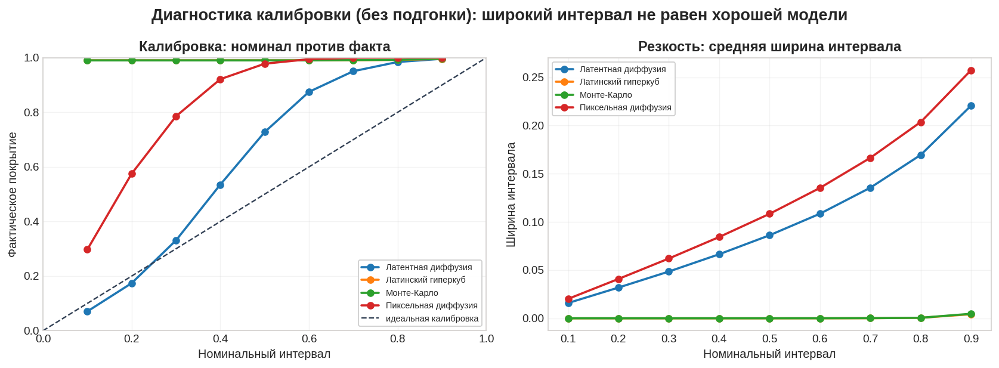

Примечание: это оценка калибровки, а не постобработка интервалов. Детерминированная «Средняя дельта» исключена.


In [ ]:
def interval_curve(samples, truth, mask, levels=np.linspace(0.1,0.9,9)):
    rows=[]
    for level in levels:
        lo=(1-level)/2; hi=1-lo; qlo=np.quantile(samples,lo,0); qhi=np.quantile(samples,hi,0); m=mask.astype(bool)
        rows.append({'Номинальный интервал':float(level),'Фактическое покрытие':float(((truth>=qlo)&(truth<=qhi)&m).sum()/m.sum()),'Средняя ширина':float((qhi-qlo)[m].mean())})
    return rows
calibration_rows=[]
for name,ens in [('diffusion',dens),('latent_diffusion',latent_ens),('mc',mc1),('lhs',lhs1)]:
    for row in interval_curve(ens,vtrue,vmask): calibration_rows.append({'Модель':MODEL_RU.get(name,name), **row})
write_records(METRICS_DIR/'calibration_sharpness.csv', calibration_rows); write_records(METRICS_DIR/'calibration_sharpness.json', calibration_rows)
if pd is not None:
    cal_df=pd.DataFrame(calibration_rows); style_dataframe(cal_df,'Проверка калибровки и резкости стохастических ансамблей',precision=5)
    fig,ax=plt.subplots(1,2,figsize=(13,4.8))
    for name,grp in cal_df.groupby('Модель'):
        ax[0].plot(grp['Номинальный интервал'],grp['Фактическое покрытие'],marker='o',lw=2,label=name); ax[1].plot(grp['Номинальный интервал'],grp['Средняя ширина'],marker='o',lw=2,label=name)
    ax[0].plot([0,1],[0,1],color='#334155',ls='--',lw=1.3,label='идеальная калибровка'); ax[0].set_title('Калибровка: номинал против факта'); ax[0].set_xlabel('Номинальный интервал'); ax[0].set_ylabel('Фактическое покрытие'); ax[0].set_xlim(0,1); ax[0].set_ylim(0,1)
    ax[1].set_title('Резкость: средняя ширина интервала'); ax[1].set_xlabel('Номинальный интервал'); ax[1].set_ylabel('Ширина интервала')
    for a in ax: a.grid(alpha=.22); a.legend(fontsize=8)
    fig.suptitle('Диагностика калибровки (без подгонки): широкий интервал не равен хорошей модели',fontsize=15,weight='bold'); plt.tight_layout(); plt.show()
else: print(calibration_rows)

print('Примечание: это оценка калибровки, а не постобработка интервалов. Детерминированная «Средняя дельта» исключена.')


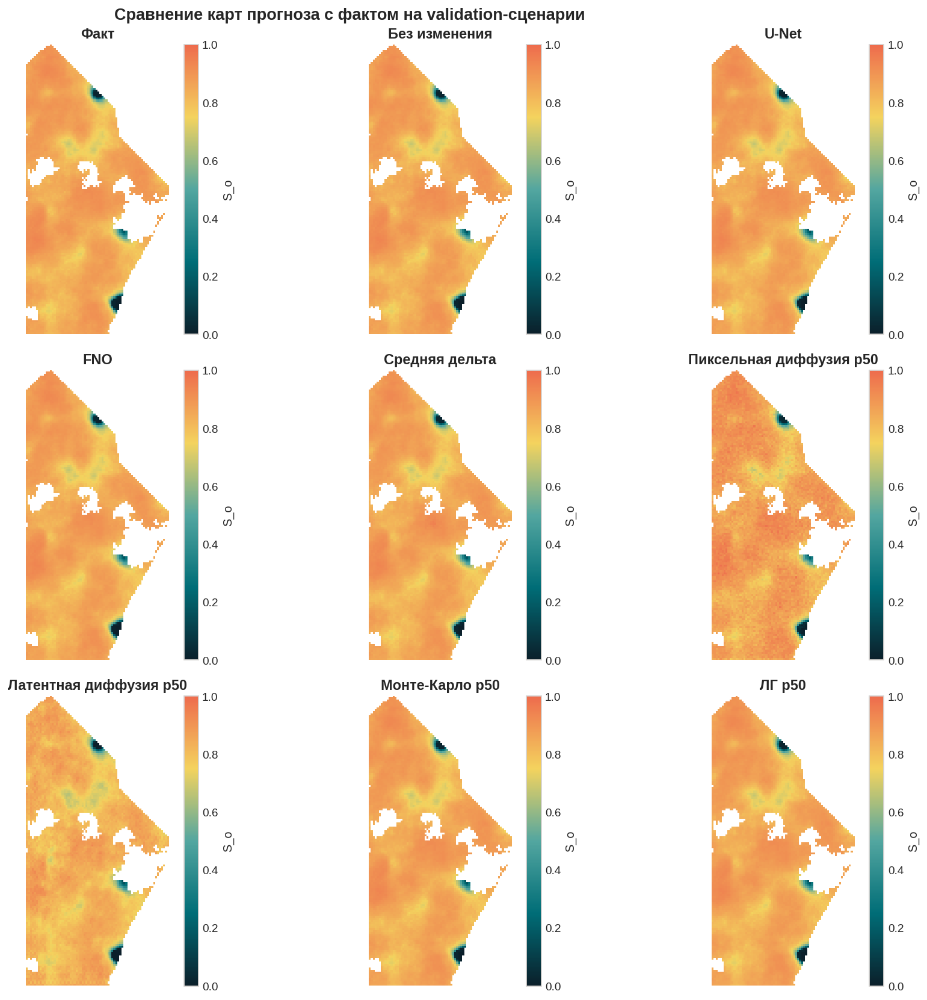

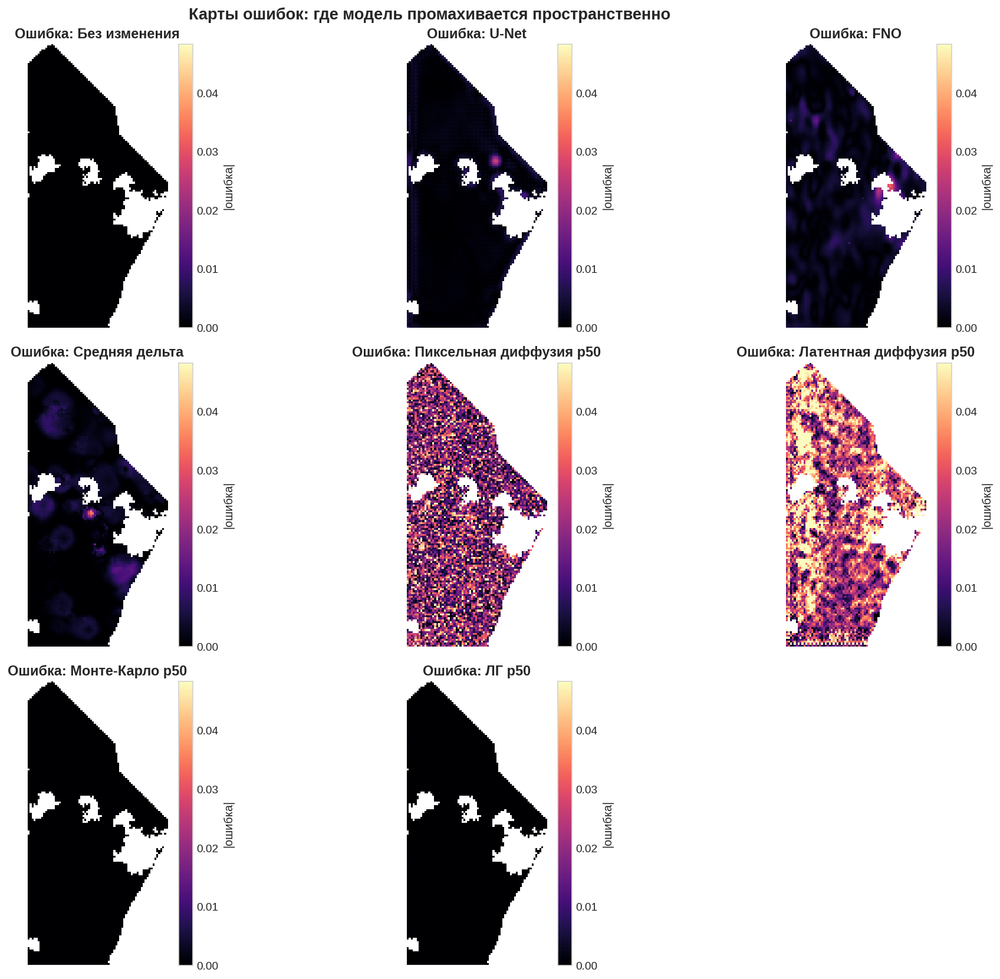

In [ ]:
model_maps = {
    'Факт': vtrue,
    'Без изменения': vbase,
    'U-Net': det_pred,
    'FNO': fno_pred,
    'Средняя дельта': summarize(mean1)['p50'],
    'Пиксельная диффузия p50': summarize(dens)['p50'],
    'Латентная диффузия p50': summarize(latent_ens)['p50'],
    'Монте-Карло p50': summarize(mc1)['p50'],
    'ЛГ p50': summarize(lhs1)['p50'],
}
fig, axes = plt.subplots(3, 3, figsize=(15, 13))
for ax, (name, img) in zip(axes.ravel(), model_maps.items()):
    plot_map(ax, img, vmask, name, SAT_CMAP, 0, 1, cbar=True, cbar_label='S_o')
fig.suptitle('Сравнение карт прогноза с фактом на validation-сценарии', fontsize=15, weight='bold')
plt.tight_layout(); plt.show()

err_names = ['Без изменения', 'U-Net', 'FNO', 'Средняя дельта', 'Пиксельная диффузия p50', 'Латентная диффузия p50', 'Монте-Карло p50', 'ЛГ p50']
emax = max(float(np.nanquantile(np.concatenate([np.abs(model_maps[n]-vtrue)[vmask].ravel() for n in err_names]), .98)), 1e-6)
fig, axes = plt.subplots(3, 3, figsize=(15, 13))
for ax, name in zip(axes.ravel(), err_names):
    plot_map(ax, np.abs(model_maps[name]-vtrue), vmask, f'Ошибка: {name}', UNC_CMAP, 0, emax, cbar=True, cbar_label='|ошибка|')
for ax in axes.ravel()[len(err_names):]:
    ax.axis('off')
fig.suptitle('Карты ошибок: где модель промахивается пространственно', fontsize=15, weight='bold')
plt.tight_layout(); plt.show()


## 11.1 Устойчивость, калибровка и чувствительность

Validation-кейсы выбираются стратифицированно: по grid-группам, сценариям и фактическим временным горизонтам. Все модели сравниваются попарно на одинаковых кейсах.

Дополнительно рассчитываются:

- skill относительно baseline «Без изменения»;
- доля кейсов, в которых модель выигрывает у baseline;
- bootstrap-интервал для разницы RMSE;
- качество отдельно по горизонту и grid-группе;
- multi-case calibration вместо вывода по одной карте;
- связь ширины ансамбля с реальной ошибкой;
- ablation регрессоров для U-Net.

Положительный skill означает улучшение относительно сохранения исходной карты. Если 95% bootstrap-интервал разницы RMSE пересекает ноль, устойчивое преимущество на текущем числе кейсов не доказано.


Multi-case validation:   0%|          | 0/32 [00:00<?, ?it/s]

,Модель,Средняя RMSE,Медианная RMSE,Skill vs без изменения,Доля побед vs без изменения,ΔRMSE vs без изменения,95% CI нижняя,95% CI верхняя,Кейсов
2,Без изменения,0.01625,0.01326,0.00000,0.00000,0.00000,0.00000,0.00000,32
4,Латинский гиперкуб,0.01646,0.01324,-2.92610,0.37500,0.00021,0.00007,0.00036,32
5,Монте-Карло,0.01646,0.01324,-2.96240,0.37500,0.00021,0.00007,0.00036,32
7,Средняя дельта,0.01665,0.01324,-9.32696,0.40625,0.00040,0.00016,0.00070,32
1,U-Net,0.01713,0.01644,-34.45838,0.50000,0.00088,-0.00150,0.00338,32
0,FNO,0.01861,0.01447,-42.45798,0.37500,0.00236,0.00080,0.00397,32
6,Пиксельная диффузия,0.03275,0.02830,-128.05590,0.00000,0.01650,0.01422,0.01873,32
3,Латентная диффузия,0.04005,0.03804,-183.57704,0.00000,0.02380,0.02043,0.02707,32


,Модель,RMSE p50: медиана,RMSE p50: IQR,RMSE p50: p95,MAE p50: медиана,MAE p50: IQR,MAE p50: p95,Bias p50: медиана,Bias p50: IQR,Bias p50: p95
0,FNO,0.01447,0.01732,0.04042,0.00519,0.00376,0.01446,-0.00157,0.00159,0.00053
1,U-Net,0.01644,0.01468,0.03608,0.00463,0.00439,0.01355,-0.00241,0.00190,-0.00022
2,Без изменения,0.01326,0.02602,0.04487,0.00092,0.00317,0.00921,0.00071,0.00273,0.00709
3,Латентная диффузия,0.03804,0.00911,0.05284,0.03017,0.00448,0.03660,-0.02624,0.00433,-0.01835
4,Латинский гиперкуб,0.01324,0.02497,0.04479,0.00166,0.00302,0.00946,-0.00008,0.00280,0.00693
5,Монте-Карло,0.01324,0.02497,0.04479,0.00166,0.00302,0.00946,-0.00008,0.00280,0.00693
6,Пиксельная диффузия,0.02830,0.01098,0.05291,0.02109,0.00230,0.02851,0.01419,0.00320,0.02231
7,Средняя дельта,0.01324,0.02353,0.04467,0.00183,0.00305,0.01014,-0.00037,0.00272,0.00585


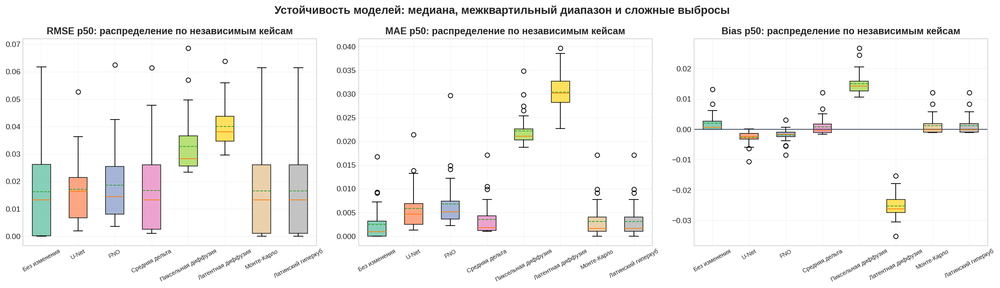

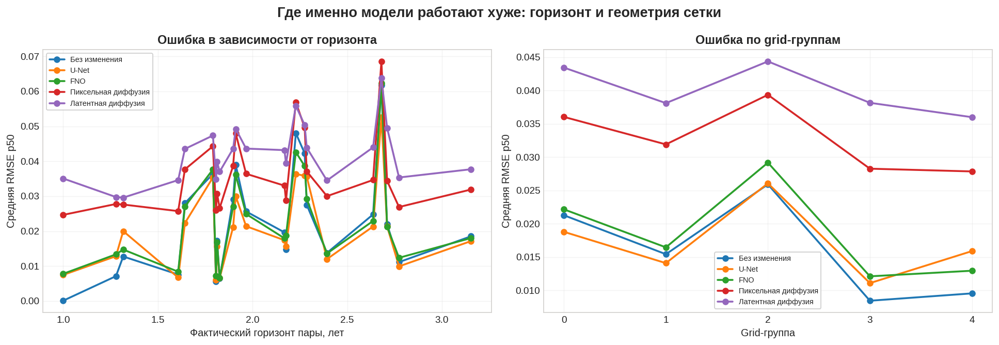

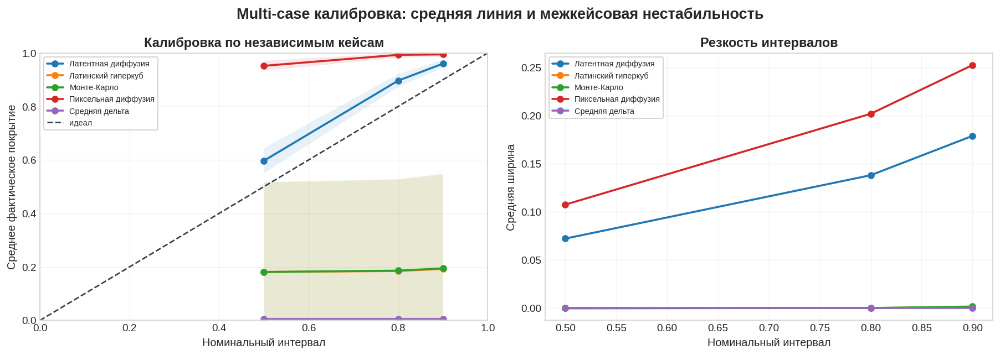

/usr/local/lib/python3.12/dist-packages/pandas/core/nanops.py:1632: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  return spearmanr(a, b)[0]


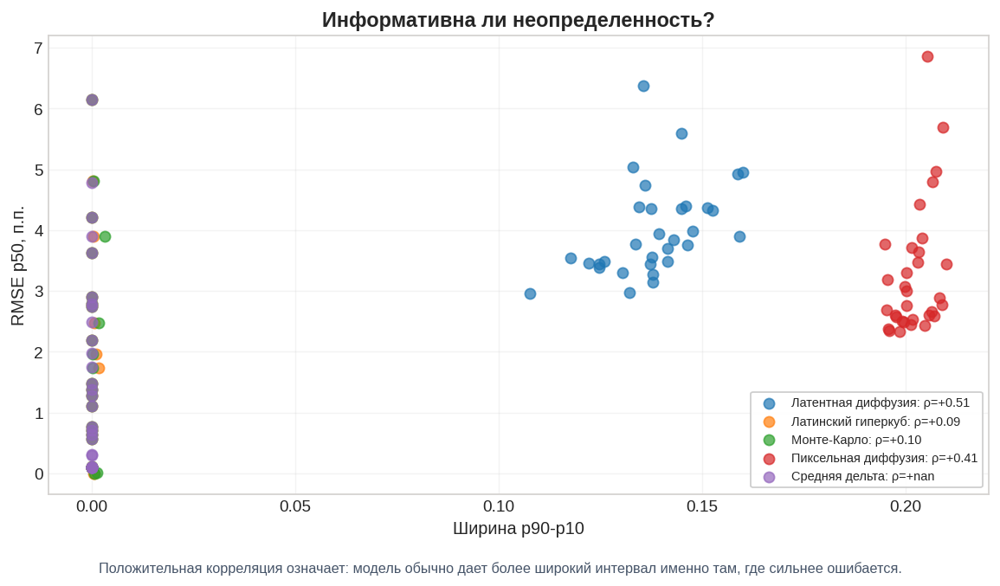

Итог validation: минимальная средняя RMSE у Без изменения (0.01625); skill относительно без изменения +0.000.
Информативность неопределенности Латентная диффузия: Spearman spread-vs-RMSE = +0.514
Информативность неопределенности Латинский гиперкуб: Spearman spread-vs-RMSE = +0.090
Информативность неопределенности Монте-Карло: Spearman spread-vs-RMSE = +0.104
Информативность неопределенности Пиксельная диффузия: Spearman spread-vs-RMSE = +0.413
Информативность неопределенности Средняя дельта: Spearman spread-vs-RMSE = +nan


Independent test evaluation:   0%|          | 0/24 [00:00<?, ?it/s]

,Модель,Средняя RMSE,Медианная RMSE,Skill vs без изменения,Доля побед vs без изменения,ΔRMSE vs без изменения,95% CI нижняя,95% CI верхняя,Кейсов
2,Без изменения,0.00616,0.00164,0.00000,0.00000,0.00000,0.00000,0.00000,24
5,Монте-Карло,0.00650,0.00203,-4.87252,0.33333,0.00034,0.00016,0.00053,24
4,Латинский гиперкуб,0.00650,0.00203,-4.87297,0.33333,0.00034,0.00016,0.00053,24
7,Средняя дельта,0.00692,0.00314,-13.76002,0.33333,0.00076,0.00040,0.00117,24
1,U-Net,0.00826,0.00648,-32.17471,0.29167,0.00210,0.00075,0.00372,24
0,FNO,0.00913,0.00740,-36.25370,0.08333,0.00297,0.00192,0.00409,24
6,Пиксельная диффузия,0.02649,0.02529,-199.10176,0.00000,0.02033,0.01830,0.02225,24
3,Латентная диффузия,0.03681,0.03669,-293.65848,0.00000,0.03065,0.02783,0.03327,24


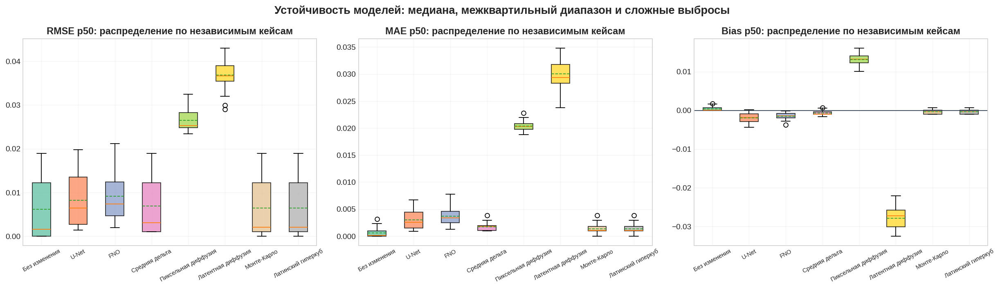

TEST_EVAL_DONE: {'cases': 24, 'best_model': 'Без изменения', 'best_rmse': 0.006160496617515794}


,Вариант,mean_abs_change_vs_full,p95_abs_change_vs_full,mean_delta_vs_full
0,полный набор признаков,0.000000,0.000000,0.000000
1,без статических полей,0.001135,0.002325,0.000672
2,без карт скважин,0.000970,0.002534,-0.000049
3,без режимов управления,0.026337,0.041669,0.022352
4,без всех регрессоров,0.026148,0.035024,0.025067


Вывод ablation: сильнее всего прогноз меняет отключение без режимов управления (mean |change|=0.02634). Это чувствительность, не доказательство причинности.


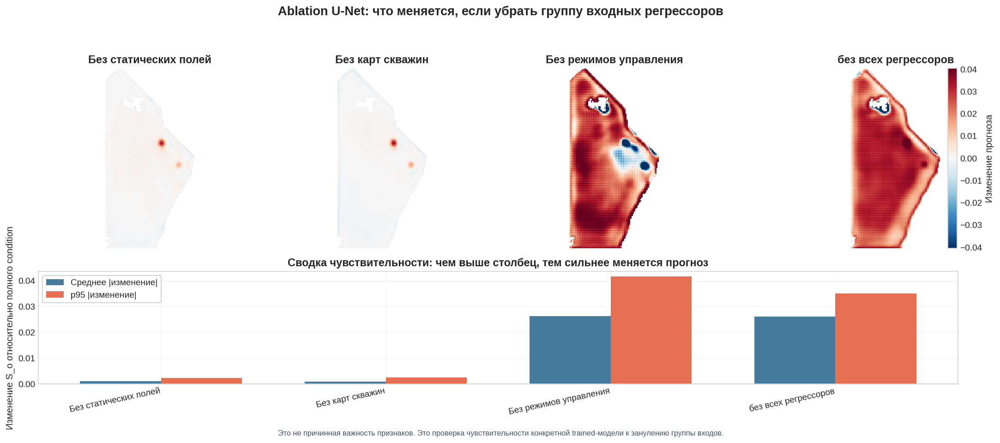

In [ ]:
N_VALIDATION_CASES = 12 if RUN_MODE == 'demo' else 32
N_EVAL_ENSEMBLE = 8 if RUN_MODE == 'demo' else 24
N_LATENT_EVAL_ENSEMBLE = 6 if RUN_MODE == 'demo' else 12
N_TEST_CASES = 8 if RUN_MODE == 'demo' else 24

def pick_validation_cases(groups,n_cases):
    """Round-robin sampling across grid groups, scenarios and forecast horizons."""
    pools=[]
    for g in groups:
        ds=g['val_ds']; active=np.asarray(ds.act).reshape(ds.layers,-1).sum(1); top=np.argsort(active)[::-1][:max(1,min(8,ds.layers))]
        selected={}
        for idx,row in enumerate(ds.samples):
            if len(row)!=4: continue
            s,t,t2,z=map(int,row); h=t2-t; desired=int(top[(s*17+h*7)%len(top)])
            if z==desired and (s,h) not in selected: selected[(s,h)]=(ds,idx)
        by_scenario={}
        for (scenario,horizon),item in selected.items(): by_scenario.setdefault(scenario,[]).append((horizon,item))
        for scenario in by_scenario: by_scenario[scenario]=[item for _,item in sorted(by_scenario[scenario],key=lambda x:x[0])]
        scenario_ids=sorted(by_scenario); pool=[]; inner=0
        while any(inner<len(by_scenario[s]) for s in scenario_ids):
            for scenario in scenario_ids:
                if inner<len(by_scenario[scenario]): pool.append(by_scenario[scenario][inner])
            inner+=1
        pools.append(pool)
    cases=[]; cursor=0
    while len(cases)<n_cases and any(cursor<len(pool) for pool in pools):
        for pool in pools:
            if cursor<len(pool) and len(cases)<n_cases: cases.append(pool[cursor])
        cursor+=1
    return cases

def case_metadata(ds,idx):
    row=ds.samples[idx]
    if len(row)==4:
        s,t,t2,z=map(int,row); times=np.asarray(ds.z[f'times_{s:03d}'],dtype=float); days=float(times[t2]-times[t])
        return {'scenario_id':s,'scenario_name':ds.scenario_names[s],'base_index':t,'target_index':t2,'horizon_steps':t2-t,'Горизонт, лет':days/365.25,'layer':z}
    t,t2,z=map(int,row); return {'scenario_id':-1,'scenario_name':'dense','base_index':t,'target_index':t2,'horizon_steps':t2-t,'Горизонт, лет':float(t2-t),'layer':z}

@torch.no_grad()
def evaluate_case(ds,idx,n_ens=8,n_latent=6):
    vb=ds[idx]; vb1={k:v.unsqueeze(0) for k,v in vb.items()}; meta=case_metadata(ds,idx)
    vbase=denorm_n11_to01(vb['base'][0].numpy()); vtrue=np.clip(vbase+vb['target'][0].numpy()*dS_clip,0,1); vmask=vb['mask'][0].numpy()>0.5
    vc=make_condition(vb1,max_delta_steps=max_delta_steps,layers=ds.layers)
    det_pred=np.clip(vbase+det(vc)[0,0].detach().cpu().numpy()*dS_clip,0,1); fno_pred=np.clip(vbase+fno(vc)[0,0].detach().cpu().numpy()*dS_clip,0,1)
    chunks=[]; bs=4
    for start in range(0,n_ens,bs):
        n=min(bs,n_ens-start); chunks.append(diff.sample(vc.repeat_interleave(n,0),sampler='ddim',ddim_eta=0.0).detach().cpu().numpy()[:,0])
    dens=np.clip(vbase[None]+np.concatenate(chunks,0)*dS_clip,0,1)
    latent_ens=np.clip(vbase[None]+sample_latent_delta(vc,n_latent)*dS_clip,0,1)
    mc_ens=mc_delta_ensemble(vbase,train_deltas,n_ens,1000+idx); lhs_ens=lhs_delta_ensemble(vbase,train_deltas,n_ens,2000+idx); mean_ens=mean_delta_ensemble(vbase,train_deltas,n_ens,3000+idx)
    ensembles=[('Без изменения',vbase[None]),('U-Net',det_pred[None]),('FNO',fno_pred[None]),('Средняя дельта',mean_ens),('Пиксельная диффузия',dens),('Латентная диффузия',latent_ens),('Монте-Карло',mc_ens),('Латинский гиперкуб',lhs_ens)]
    rows=[]; calibration=[]
    for name,ens in ensembles:
        s=summarize(ens); stochastic=ens.shape[0]>1 and float(np.max(np.std(ens[:,vmask],axis=0)))>1e-8
        rows.append({'Модель':name,'RMSE p50':masked_rmse(s['p50'],vtrue,vmask),'MAE p50':masked_mae(s['p50'],vtrue,vmask),'Bias p50':masked_bias(s['p50'],vtrue,vmask),'Coverage p10-p90':coverage(ens,vtrue,vmask,.1,.9) if stochastic else np.nan,'CRPS':ensemble_crps(ens,vtrue,vmask) if stochastic else np.nan,'Spread p90-p10':float((s['p90']-s['p10'])[vmask].mean()) if stochastic else np.nan, **map_quality_metrics(s['p50'],vtrue,vmask)})
        if stochastic:
            for item in interval_curve(ens,vtrue,vmask,levels=np.array([.5,.8,.9])): calibration.append({'Модель':name,**item})
    return rows,calibration,vb1,vbase,vmask,meta

validation_rows=[]; calibration_multicase_rows=[]; ablation_source=None
selected_cases=pick_validation_cases(TRAIN_GROUPS,N_VALIDATION_CASES)
for case_id,(ds,idx) in enumerate(progress_iter(selected_cases,total=len(selected_cases),desc='Multi-case validation')):
    rows_case,cal_case,vb1_case,vbase_case,vmask_case,meta=evaluate_case(ds,idx,N_EVAL_ENSEMBLE,N_LATENT_EVAL_ENSEMBLE)
    common={'case_id':case_id,'grid_group':getattr(ds,'grid_group',-1),'sample_idx':idx,**meta}
    for row in rows_case: validation_rows.append({**row,**common})
    for row in cal_case: calibration_multicase_rows.append({**row,**common})
    if ablation_source is None: ablation_source=(ds,vb1_case,vbase_case,vmask_case)

val_suite_df=pd.DataFrame(validation_rows) if pd is not None else validation_rows
cal_multi_df=pd.DataFrame(calibration_multicase_rows) if pd is not None else calibration_multicase_rows
if pd is not None:
    paired_df=paired_validation_summary(val_suite_df); style_dataframe(paired_df,'Парное сравнение на одинаковых validation-кейсах',precision=5)
    box_summary_df=validation_distribution_summary(val_suite_df); style_dataframe(box_summary_df,'Медиана, IQR и тяжелые кейсы',precision=5)
    plot_validation_distributions(val_suite_df); plt.show()
    plot_validation_slices(val_suite_df); plt.show()
    plot_multicase_calibration(cal_multi_df); plt.show()
    spread_fig,spread_corr=plot_spread_skill(val_suite_df); plt.show()
    best=paired_df.iloc[0]; print(f"Итог validation: минимальная средняя RMSE у {best['Модель']} ({best['Средняя RMSE']:.5f}); skill относительно без изменения {best['Skill vs без изменения']:+.3f}.")
    for model,corr in spread_corr: print(f'Информативность неопределенности {model}: Spearman spread-vs-RMSE = {corr:+.3f}')
write_records(METRICS_DIR/'validation_suite_multisample.csv',validation_rows)
write_records(METRICS_DIR/'calibration_multicase.csv',calibration_multicase_rows)

# Финальная независимая test-оценка: не используется для выбора эпох и моделей.
test_rows=[]; test_calibration_rows=[]
selected_test_cases=pick_validation_cases(TEST_GROUPS,N_TEST_CASES)
for case_id,(ds,idx) in enumerate(progress_iter(selected_test_cases,total=len(selected_test_cases),desc='Independent test evaluation')):
    rows_case,cal_case,_,_,_,meta=evaluate_case(ds,idx,N_EVAL_ENSEMBLE,N_LATENT_EVAL_ENSEMBLE)
    common={'case_id':case_id,'grid_group':getattr(ds,'grid_group',-1),'sample_idx':idx,**meta}
    for row in rows_case: test_rows.append({**row,**common})
    for row in cal_case: test_calibration_rows.append({**row,**common})
test_suite_df=pd.DataFrame(test_rows) if pd is not None else test_rows
test_cal_df=pd.DataFrame(test_calibration_rows) if pd is not None else test_calibration_rows
write_records(METRICS_DIR/'test_suite_multisample.csv',test_rows)
write_records(METRICS_DIR/'test_suite_multisample.json',test_rows)
write_records(METRICS_DIR/'test_calibration_multicase.csv',test_calibration_rows)
if pd is not None and len(test_suite_df):
    test_summary=paired_validation_summary(test_suite_df)
    style_dataframe(test_summary,'Независимый test: итоговые метрики по одинаковым test-кейсам',precision=5)
    plot_validation_distributions(test_suite_df); plt.show()
    print('TEST_EVAL_DONE:', {'cases':N_TEST_CASES, 'best_model':test_summary.iloc[0]['Модель'], 'best_rmse':float(test_summary.iloc[0]['Средняя RMSE'])})

# Ablation/sensitivity на одном validation-case.
ds_ab,vb1_ab,vbase_ab,vmask_ab=ablation_source
def zeroed_batch(batch,zero_static=False,zero_maps=False,zero_control=False):
    out={k:v.clone() for k,v in batch.items()}
    if zero_static and out['static'].shape[1]>0: out['static'].zero_()
    if zero_maps and out['maps'].shape[1]>0: out['maps'].zero_()
    if zero_control and out['control'].shape[1]>0: out['control'].zero_()
    return out
@torch.no_grad()
def det_map_from_batch(batch):
    c=make_condition(batch,max_delta_steps=max_delta_steps,layers=ds_ab.layers); return np.clip(vbase_ab+det(c)[0,0].detach().cpu().numpy()*dS_clip,0,1)
ablation_batches={'полный набор признаков':vb1_ab,'без статических полей':zeroed_batch(vb1_ab,zero_static=True),'без карт скважин':zeroed_batch(vb1_ab,zero_maps=True),'без режимов управления':zeroed_batch(vb1_ab,zero_control=True),'без всех регрессоров':zeroed_batch(vb1_ab,zero_static=True,zero_maps=True,zero_control=True)}
full_pred=det_map_from_batch(vb1_ab); ablation_rows=[]; ablation_maps={}
for name,batch in ablation_batches.items():
    pred=det_map_from_batch(batch); ablation_maps[name]=pred; ablation_rows.append({'Вариант':name,'mean_abs_change_vs_full':float(np.mean(np.abs(pred-full_pred)[vmask_ab])),'p95_abs_change_vs_full':float(np.quantile(np.abs(pred-full_pred)[vmask_ab],.95)),'mean_delta_vs_full':float(np.mean((pred-full_pred)[vmask_ab]))})
style_dataframe(pd.DataFrame(ablation_rows) if pd is not None else ablation_rows,'Ablation/sensitivity U-Net: изменение относительно полного condition',precision=6)
ranked=sorted([r for r in ablation_rows if r['Вариант']!='полный набор признаков'],key=lambda r:r['mean_abs_change_vs_full'],reverse=True)
print('Вывод ablation: сильнее всего прогноз меняет отключение',ranked[0]['Вариант'],f"(mean |change|={ranked[0]['mean_abs_change_vs_full']:.5f}). Это чувствительность, не доказательство причинности.")
plot_ablation_effects(ablation_maps,full_pred,vmask_ab); plt.show()

if pd is not None and 'val_suite_df' in globals() and len(val_suite_df):
    pct_cols=[c for c in ['RMSE_pp','MAE_pp','NRMSE_pct_range','MAPE, %','SSIM','PSNR_db'] if c in val_suite_df.columns]
    if pct_cols:
        percentage_metric_summary=val_suite_df.groupby(val_suite_df.columns[0])[pct_cols].agg(['mean','median','std']).reset_index()
        style_dataframe(percentage_metric_summary,'Percent and structural metrics: validation cases',precision=4)
if pd is not None and 'test_suite_df' in globals() and len(test_suite_df):
    pct_cols=[c for c in ['RMSE_pp','MAE_pp','NRMSE_pct_range','MAPE, %','SSIM','PSNR_db'] if c in test_suite_df.columns]
    if pct_cols:
        test_percentage_metric_summary=test_suite_df.groupby(test_suite_df.columns[0])[pct_cols].agg(['mean','median','std']).reset_index()
        style_dataframe(test_percentage_metric_summary,'Percent and structural metrics: test cases',precision=4)


## 11.2 Проверка на известных интервалах: факт TNavigator против прогноза

Этот блок сделан для экспертной проверки: модель стартует с исторического снимка validation/test-сценария и прогнозирует следующие известные TNavigator-срезы. Поэтому на одном графике видны фактическая траектория TNavigator и прогнозная траектория модели на том же интервале.

Чтобы не показывать один случайный пример, автоматически выбираются разные группы сетки, сценарии, слои и режимы. Для каждого кейса строятся линии средней нефтенасыщенности, интервал p10-p90 ансамбля диффузии, U-Net/FNO и метрики ошибки.


{'backtest_profile': 'presentation_fast', 'cases': 8, 'target_steps': 3, 'diffusion_ensemble': 6, 'approx_diffusion_rollouts': 144}
План проверки:         split  grid_group  scenario_index  layer_index  base_index  \
0        test           0               3           49           3   
1        test           1              17           24           3   
2        test           2              27           21           3   
3        test           3              37           24           3   
4        test           4              40           21           3   
5  validation           0               7           24           3   
6  validation           1              16           24           3   
7  validation           2              29           21           3   

  target_indices     score  
0      [4, 5, 6]  0.003930  
1      [4, 5, 6]  0.012910  
2      [4, 5, 6]  0.004775  
3      [4, 5, 6]  0.013940  
4      [4, 5, 6]  0.000906  
5      [4, 5, 6]  0.022576  
6      [4, 5, 6]  0

Проверка кейсов:   0%|          | 0/8 [00:00<?, ?it/s]

,Выборка,Группа сетки,Сценарий,Режим,Регрессоры режима,Слой,Базовый индекс,Число целевых срезов,Факт. изменение,Амплитуда кейса,Модель,RMSE,MAE,Bias,Coverage p10-p90,Spread p90-p10
0,Тест,0,Baza_PATTERN002_2__04_random_1i3p,04_random_1i3p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",49,3,3,-0.00282,0.00393,U-Net,0.01697,0.00229,0.00218,nan,nan
1,Тест,0,Baza_PATTERN002_2__04_random_1i3p,04_random_1i3p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",49,3,3,-0.00282,0.00393,FNO,0.01695,0.00205,0.00165,nan,nan
2,Тест,0,Baza_PATTERN002_2__04_random_1i3p,04_random_1i3p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",49,3,3,-0.00282,0.00393,Пиксельная диффузия,0.04024,0.02635,0.02268,0.85185,0.10366
3,Тест,1,Baza_PATTERN003_3__08_random_10i20p,08_random_10i20p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",24,3,3,-0.00921,0.01291,U-Net,0.02238,0.00642,0.00144,nan,nan
4,Тест,1,Baza_PATTERN003_3__08_random_10i20p,08_random_10i20p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",24,3,3,-0.00921,0.01291,FNO,0.03106,0.00922,0.00294,nan,nan
5,Тест,1,Baza_PATTERN003_3__08_random_10i20p,08_random_10i20p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",24,3,3,-0.00921,0.01291,Пиксельная диффузия,0.05451,0.03862,0.01992,0.89130,0.16470
6,Тест,2,Baza_PATTERN004_4__08_random_10i20p,08_random_10i20p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",21,3,3,-0.00352,0.00477,U-Net,0.01756,0.00496,0.00159,nan,nan
7,Тест,2,Baza_PATTERN004_4__08_random_10i20p,08_random_10i20p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",21,3,3,-0.00352,0.00477,FNO,0.01702,0.00508,0.00202,nan,nan
8,Тест,2,Baza_PATTERN004_4__08_random_10i20p,08_random_10i20p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",21,3,3,-0.00352,0.00477,Пиксельная диффузия,0.04440,0.03338,0.01478,0.90167,0.16089
9,Тест,3,Baza_PATTERN005_5__08_random_10i20p,08_random_10i20p,"Нагнетатели=-1.00, Добывающие=-1.00, Скважин=-1.00",24,3,3,-0.01006,0.01394,U-Net,0.02880,0.00863,0.00211,nan,nan


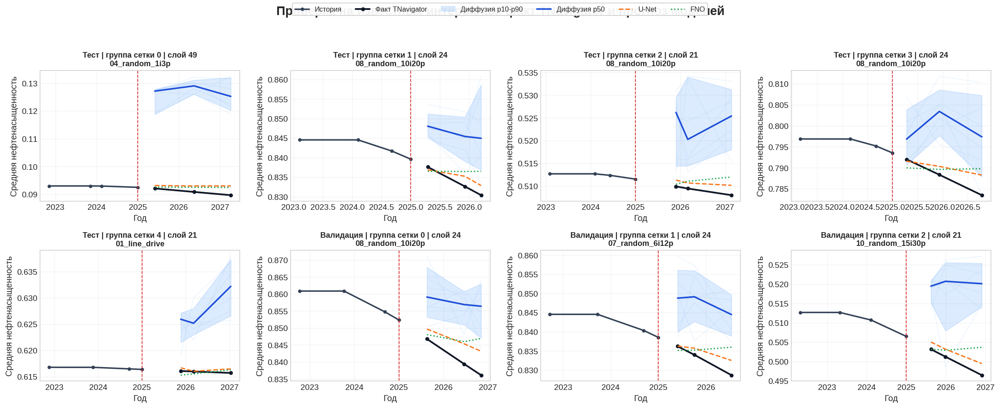

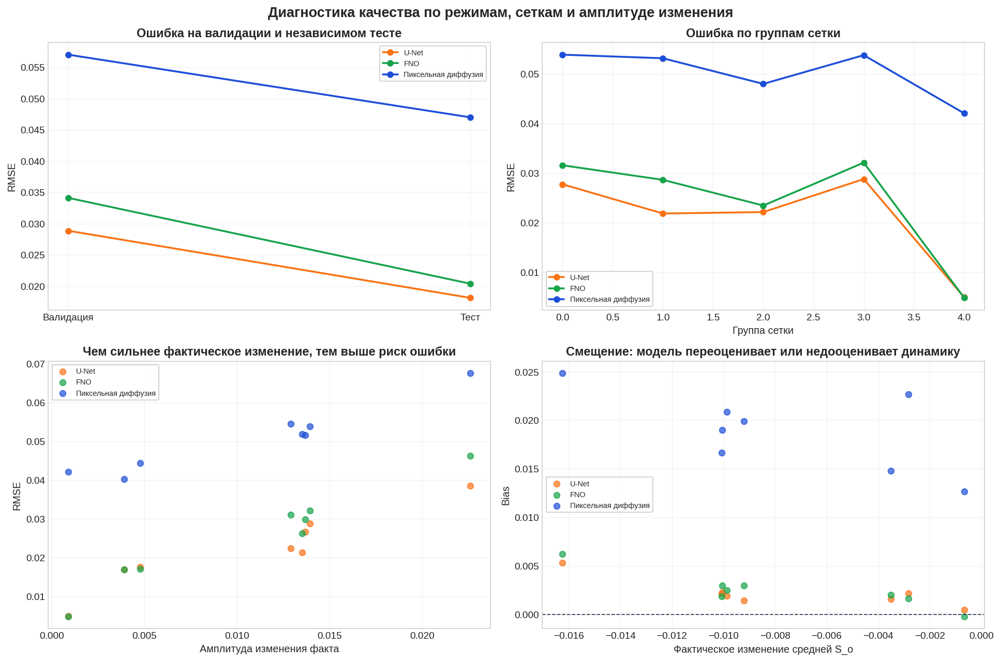

Таблицы сохранены: /content/outputs/backtest


In [ ]:
# Known-interval line check: TNavigator fact vs model forecasts.
# Source is ASCII-safe; Russian labels are decoded through unicode escapes.

R = lambda s: s.encode('ascii').decode('unicode_escape')
MODEL_COL = R('\\u041c\\u043e\\u0434\\u0435\\u043b\\u044c')
PIXEL_NAME = R('\\u041f\\u0438\\u043a\\u0441\\u0435\\u043b\\u044c\\u043d\\u0430\\u044f \\u0434\\u0438\\u0444\\u0444\\u0443\\u0437\\u0438\\u044f')
SPLIT_RU = {'validation': R('\\u0412\\u0430\\u043b\\u0438\\u0434\\u0430\\u0446\\u0438\\u044f'), 'test': R('\\u0422\\u0435\\u0441\\u0442')}

# Backtest can be expensive: cases * target steps * diffusion ensemble.
# presentation_fast gives enough visual evidence without spending minutes per cell.
BACKTEST_PROFILE = globals().get('BACKTEST_PROFILE', 'presentation_fast')  # 'presentation_fast' or 'full'
if BACKTEST_PROFILE == 'full':
    BACKTEST_N_CASES = 20
    BACKTEST_TARGET_STEPS = 5
    BACKTEST_DIFF_ENSEMBLE = min(16, int(globals().get('N_SCENARIOS', 16)))
else:
    BACKTEST_N_CASES = 8
    BACKTEST_TARGET_STEPS = 3
    BACKTEST_DIFF_ENSEMBLE = min(6, int(globals().get('N_SCENARIOS', 6)))
BACKTEST_BASE_INDEX = 3
BACKTEST_SPLITS = [('validation', val_datasets), ('test', test_datasets)]
print({'backtest_profile': BACKTEST_PROFILE, 'cases': BACKTEST_N_CASES, 'target_steps': BACKTEST_TARGET_STEPS, 'diffusion_ensemble': BACKTEST_DIFF_ENSEMBLE, 'approx_diffusion_rollouts': BACKTEST_N_CASES * BACKTEST_TARGET_STEPS * BACKTEST_DIFF_ENSEMBLE})


def _split_ru(name):
    return SPLIT_RU.get(str(name), str(name))


def _scenario_feature_names(ds):
    if hasattr(ds, 'z') and ds.z is not None and 'scenario_feature_names' in ds.z.files:
        return [str(x) for x in ds.z['scenario_feature_names']]
    return [f'feature_{i}' for i in range(getattr(ds, 'scenario_features', np.zeros((0, 0))).shape[1])]


def _short_regime_label(ds, scenario_idx):
    name = str(ds.scenario_names[int(scenario_idx)])
    parts = [p for p in name.split('__') if p]
    tail = parts[-1] if len(parts) > 1 else name
    names = _scenario_feature_names(ds)
    vals = getattr(ds, 'scenario_features', np.zeros((len(ds.scenario_names), 0), np.float32))
    aliases = {
        'Injectors': R('\\u041d\\u0430\\u0433\\u043d\\u0435\\u0442\\u0430\\u0442\\u0435\\u043b\\u0438'),
        'Producers': R('\\u0414\\u043e\\u0431\\u044b\\u0432\\u0430\\u044e\\u0449\\u0438\\u0435'),
        'WellCount': R('\\u0421\\u043a\\u0432\\u0430\\u0436\\u0438\\u043d'),
        'PhaseCount': R('\\u0424\\u0430\\u0437'),
        'DurationYears': R('\\u041b\\u0435\\u0442'),
    }
    extras = []
    if vals.shape[1]:
        row = np.asarray(vals[int(scenario_idx)], dtype=float)
        for wanted in ['Injectors', 'Producers', 'WellCount', 'PhaseCount', 'DurationYears']:
            if wanted in names:
                extras.append(f'{aliases[wanted]}={row[names.index(wanted)]:.2f}')
    return tail, ', '.join(extras[:3])


def _historical_mean_curve(ds, scenario_idx, layer_idx, indices):
    mask = ds.act[int(layer_idx)].astype(bool)
    vals = []
    for t in indices:
        arr = ds._layer(int(scenario_idx), int(t), int(layer_idx)).clip(0, 1)
        vals.append(float(arr[mask].mean()) if mask.any() else np.nan)
    return np.asarray(vals, dtype=float)


def _case_change_score(ds, scenario_idx, layer_idx, base_idx, target_indices):
    y = _historical_mean_curve(ds, scenario_idx, layer_idx, [base_idx] + list(target_indices))
    if len(y) < 2 or not np.isfinite(y).all():
        return 0.0
    return float(abs(y[-1] - y[0]) + np.nanstd(y))


def build_backtest_case_plan(n_cases=20):
    candidates = []
    for split_name, datasets in BACKTEST_SPLITS:
        for ds in datasets:
            if not isinstance(ds, ForecastActiveNPZDataset):
                continue
            scenario_ids = list(getattr(ds, 'scenario_indices', []))
            if not scenario_ids:
                continue
            take = min(len(scenario_ids), max(2, int(np.ceil(n_cases / max(1, len(BACKTEST_SPLITS) * len(datasets)))) + 1))
            scen_pos = np.linspace(0, len(scenario_ids) - 1, take).round().astype(int)
            layer_candidates = sorted(set(int(np.clip(x, 0, ds.layers - 1)) for x in np.linspace(0, ds.layers - 1, 5)))
            for s in [scenario_ids[i] for i in scen_pos]:
                T = len(ds.z[f'times_{int(s):03d}'])
                if T < 3:
                    continue
                base_idx = int(np.clip(BACKTEST_BASE_INDEX, 0, T - 2))
                target_indices = list(range(base_idx + 1, min(T, base_idx + 1 + BACKTEST_TARGET_STEPS)))
                if not target_indices:
                    continue
                for z in layer_candidates:
                    if int(ds.act[z].sum()) <= 0:
                        continue
                    candidates.append({
                        'split': split_name,
                        'ds': ds,
                        'grid_group': int(getattr(ds, 'grid_group', 0)),
                        'scenario_index': int(s),
                        'layer_index': int(z),
                        'base_index': base_idx,
                        'target_indices': target_indices,
                        'score': _case_change_score(ds, s, z, base_idx, target_indices),
                    })
    if not candidates:
        raise RuntimeError(R('\\u041d\\u0435 \\u0443\\u0434\\u0430\\u043b\\u043e\\u0441\\u044c \\u0441\\u043e\\u0431\\u0440\\u0430\\u0442\\u044c \\u043a\\u0435\\u0439\\u0441\\u044b \\u0434\\u043b\\u044f \\u043f\\u0440\\u043e\\u0432\\u0435\\u0440\\u043a\\u0438.'))
    selected, used = [], set()
    for key in sorted({(c['split'], c['grid_group']) for c in candidates}):
        group = sorted([c for c in candidates if (c['split'], c['grid_group']) == key], key=lambda x: x['score'], reverse=True)
        if group:
            c = group[0]
            selected.append(c)
            used.add((c['split'], c['grid_group'], c['scenario_index'], c['layer_index']))
    for c in sorted(candidates, key=lambda x: x['score'], reverse=True):
        key = (c['split'], c['grid_group'], c['scenario_index'], c['layer_index'])
        if key in used:
            continue
        selected.append(c)
        used.add(key)
        if len(selected) >= n_cases:
            break
    return selected[:n_cases]


@torch.no_grad()
def run_backtest_case(case, n_ens=16):
    ds = case['ds']
    vcase = validation_forecast_case(ds, case['scenario_index'], layer_index=case['layer_index'], base_index=case['base_index'], target_indices=case['target_indices'], n_ens=n_ens)
    m = vcase['mask']; b = vcase['base_index']; tids = vcase['target_indices']
    times = np.asarray(ds.z[f"times_{case['scenario_index']:03d}"], dtype=float)
    years = START_YEAR + (times - times[b]) / 365.25
    hist_idx = list(range(0, b + 1))
    hist_years = years[hist_idx]
    hist_mean = _historical_mean_curve(ds, case['scenario_index'], case['layer_index'], hist_idx)
    target_years = years[tids]
    truth_mean = np.asarray([float(x[m].mean()) for x in vcase['truth']], dtype=float)
    unet_mean = np.asarray([float(x[m].mean()) for x in vcase['det_maps']], dtype=float)
    fno_mean = np.asarray([float(x[m].mean()) for x in vcase['fno_maps']], dtype=float)
    diff_mean_lines = vcase['diff_samples'][:, :, m].mean(axis=2)
    diff_q10, diff_p50, diff_q90 = np.percentile(diff_mean_lines, [10, 50, 90], axis=0)
    metrics = validation_forecast_metrics(vcase)
    regime, regime_nums = _short_regime_label(ds, case['scenario_index'])
    rows = []
    for row in metrics:
        rows.append({
            R('\\u0412\\u044b\\u0431\\u043e\\u0440\\u043a\\u0430'): _split_ru(case['split']),
            R('\\u0413\\u0440\\u0443\\u043f\\u043f\\u0430 \\u0441\\u0435\\u0442\\u043a\\u0438'): case['grid_group'],
            R('\\u0421\\u0446\\u0435\\u043d\\u0430\\u0440\\u0438\\u0439'): str(ds.scenario_names[case['scenario_index']]),
            R('\\u0420\\u0435\\u0436\\u0438\\u043c'): regime,
            R('\\u0420\\u0435\\u0433\\u0440\\u0435\\u0441\\u0441\\u043e\\u0440\\u044b \\u0440\\u0435\\u0436\\u0438\\u043c\\u0430'): regime_nums,
            R('\\u0421\\u043b\\u043e\\u0439'): case['layer_index'],
            R('\\u0411\\u0430\\u0437\\u043e\\u0432\\u044b\\u0439 \\u0438\\u043d\\u0434\\u0435\\u043a\\u0441'): b,
            R('\\u0427\\u0438\\u0441\\u043b\\u043e \\u0446\\u0435\\u043b\\u0435\\u0432\\u044b\\u0445 \\u0441\\u0440\\u0435\\u0437\\u043e\\u0432'): len(tids),
            R('\\u0424\\u0430\\u043a\\u0442. \\u0438\\u0437\\u043c\\u0435\\u043d\\u0435\\u043d\\u0438\\u0435'): float(truth_mean[-1] - hist_mean[-1]),
            R('\\u0410\\u043c\\u043f\\u043b\\u0438\\u0442\\u0443\\u0434\\u0430 \\u043a\\u0435\\u0439\\u0441\\u0430'): float(case['score']),
            **row,
        })
    return {**case, 'vcase': vcase, 'hist_years': hist_years, 'hist_mean': hist_mean, 'target_years': target_years, 'truth_mean': truth_mean, 'unet_mean': unet_mean, 'fno_mean': fno_mean, 'diff_lines': diff_mean_lines, 'diff_q10': diff_q10, 'diff_p50': diff_p50, 'diff_q90': diff_q90, 'regime': regime, 'regime_numbers': regime_nums, 'metrics_rows': rows}


def plot_backtest_lines(cases, max_cases=20):
    shown = cases[:max_cases]
    n = len(shown); cols = 4; rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(18, 3.65 * rows), squeeze=False)
    for ax, c in zip(axes.ravel(), shown):
        ax.plot(c['hist_years'], c['hist_mean'], color='#334155', lw=1.9, marker='o', ms=3.5, label=R('\\u0418\\u0441\\u0442\\u043e\\u0440\\u0438\\u044f'))
        ax.plot(c['target_years'], c['truth_mean'], color='#111827', lw=2.2, marker='o', ms=4, label=R('\\u0424\\u0430\\u043a\\u0442 TNavigator'))
        for line in c['diff_lines']:
            ax.plot(c['target_years'], line, color='#93c5fd', alpha=.20, lw=.8)
        ax.fill_between(c['target_years'], c['diff_q10'], c['diff_q90'], color='#60a5fa', alpha=.22, label=R('\\u0414\\u0438\\u0444\\u0444\\u0443\\u0437\\u0438\\u044f p10-p90'))
        ax.plot(c['target_years'], c['diff_p50'], color='#1d4ed8', lw=2.0, label=R('\\u0414\\u0438\\u0444\\u0444\\u0443\\u0437\\u0438\\u044f p50'))
        ax.plot(c['target_years'], c['unet_mean'], color='#f97316', lw=1.6, ls='--', label='U-Net')
        ax.plot(c['target_years'], c['fno_mean'], color='#16a34a', lw=1.6, ls=':', label='FNO')
        ax.axvline(c['hist_years'][-1], color='#dc2626', ls='--', lw=1.0)
        group_label = R('\\u0433\\u0440\\u0443\\u043f\\u043f\\u0430 \\u0441\\u0435\\u0442\\u043a\\u0438')
        layer_label = R('\\u0441\\u043b\\u043e\\u0439')
        ax.set_title(f"{_split_ru(c['split'])} | {group_label} {c['grid_group']} | {layer_label} {c['layer_index']}\n{c['regime']}", fontsize=10, weight='bold')
        ax.set_xlabel(R('\\u0413\\u043e\\u0434'))
        ax.set_ylabel(R('\\u0421\\u0440\\u0435\\u0434\\u043d\\u044f\\u044f \\u043d\\u0435\\u0444\\u0442\\u0435\\u043d\\u0430\\u0441\\u044b\\u0449\\u0435\\u043d\\u043d\\u043e\\u0441\\u0442\\u044c'))
        ax.grid(alpha=.20)
    for ax in axes.ravel()[n:]:
        ax.axis('off')
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=7, frameon=True, fontsize=9)
    fig.suptitle(R('\\u041f\\u0440\\u043e\\u0432\\u0435\\u0440\\u043a\\u0430 \\u043d\\u0430 \\u0438\\u0437\\u0432\\u0435\\u0441\\u0442\\u043d\\u044b\\u0445 \\u0438\\u043d\\u0442\\u0435\\u0440\\u0432\\u0430\\u043b\\u0430\\u0445: \\u0444\\u0430\\u043a\\u0442 TNavigator \\u0438 \\u043f\\u0440\\u043e\\u0433\\u043d\\u043e\\u0437 \\u043c\\u043e\\u0434\\u0435\\u043b\\u0435\\u0439'), fontsize=16, weight='bold', y=.995)
    plt.tight_layout(rect=(0, 0, 1, .955))
    return fig


def plot_backtest_error_diagnostics(metrics_df):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    models = ['U-Net', 'FNO', PIXEL_NAME]
    colors = {'U-Net':'#f97316', 'FNO':'#16a34a', PIXEL_NAME:'#1d4ed8'}
    sample_col = R('\\u0412\\u044b\\u0431\\u043e\\u0440\\u043a\\u0430'); grid_col = R('\\u0413\\u0440\\u0443\\u043f\\u043f\\u0430 \\u0441\\u0435\\u0442\\u043a\\u0438')
    amp_col = R('\\u0410\\u043c\\u043f\\u043b\\u0438\\u0442\\u0443\\u0434\\u0430 \\u043a\\u0435\\u0439\\u0441\\u0430'); change_col = R('\\u0424\\u0430\\u043a\\u0442. \\u0438\\u0437\\u043c\\u0435\\u043d\\u0435\\u043d\\u0438\\u0435')
    rmse_col = 'RMSE_pp' if 'RMSE_pp' in metrics_df.columns else 'RMSE'
    mae_col = 'MAE_pp' if 'MAE_pp' in metrics_df.columns else 'MAE'
    bias_col = 'Bias_pp' if 'Bias_pp' in metrics_df.columns else 'Bias'
    rmse_label = R('RMSE, \u043f.\u043f.') if rmse_col == 'RMSE_pp' else 'RMSE'
    bias_label = R('Bias, \u043f.\u043f.') if bias_col == 'Bias_pp' else 'Bias'
    for model in models:
        g = metrics_df[metrics_df[MODEL_COL] == model]
        if len(g) == 0:
            continue
        by_split = g.groupby(sample_col)[rmse_col].mean()
        axes[0,0].plot(by_split.index, by_split.values, marker='o', lw=2, color=colors[model], label=model)
        by_grid = g.groupby(grid_col)[rmse_col].mean().sort_index()
        axes[0,1].plot(by_grid.index, by_grid.values, marker='o', lw=2, color=colors[model], label=model)
        axes[1,0].scatter(g[amp_col], g[rmse_col], s=42, alpha=.70, color=colors[model], label=model)
        axes[1,1].scatter(g[change_col], g[bias_col], s=42, alpha=.70, color=colors[model], label=model)
    axes[0,0].set_title(R('\\u041e\\u0448\\u0438\\u0431\\u043a\\u0430 \\u043d\\u0430 \\u0432\\u0430\\u043b\\u0438\\u0434\\u0430\\u0446\\u0438\\u0438 \\u0438 \\u043d\\u0435\\u0437\\u0430\\u0432\\u0438\\u0441\\u0438\\u043c\\u043e\\u043c \\u0442\\u0435\\u0441\\u0442\\u0435'))
    axes[0,0].set_ylabel(rmse_label)
    axes[0,1].set_title(R('\\u041e\\u0448\\u0438\\u0431\\u043a\\u0430 \\u043f\\u043e \\u0433\\u0440\\u0443\\u043f\\u043f\\u0430\\u043c \\u0441\\u0435\\u0442\\u043a\\u0438'))
    axes[0,1].set_xlabel(R('\\u0413\\u0440\\u0443\\u043f\\u043f\\u0430 \\u0441\\u0435\\u0442\\u043a\\u0438'))
    axes[0,1].set_ylabel(rmse_label)
    axes[1,0].set_title(R('\\u0427\\u0435\\u043c \\u0441\\u0438\\u043b\\u044c\\u043d\\u0435\\u0435 \\u0444\\u0430\\u043a\\u0442\\u0438\\u0447\\u0435\\u0441\\u043a\\u043e\\u0435 \\u0438\\u0437\\u043c\\u0435\\u043d\\u0435\\u043d\\u0438\\u0435, \\u0442\\u0435\\u043c \\u0432\\u044b\\u0448\\u0435 \\u0440\\u0438\\u0441\\u043a \\u043e\\u0448\\u0438\\u0431\\u043a\\u0438'))
    axes[1,0].set_xlabel(R('\\u0410\\u043c\\u043f\\u043b\\u0438\\u0442\\u0443\\u0434\\u0430 \\u0438\\u0437\\u043c\\u0435\\u043d\\u0435\\u043d\\u0438\\u044f \\u0444\\u0430\\u043a\\u0442\\u0430'))
    axes[1,0].set_ylabel(rmse_label)
    axes[1,1].axhline(0, color='#334155', lw=1, ls='--')
    axes[1,1].set_title(R('\\u0421\\u043c\\u0435\\u0449\\u0435\\u043d\\u0438\\u0435: \\u043c\\u043e\\u0434\\u0435\\u043b\\u044c \\u043f\\u0435\\u0440\\u0435\\u043e\\u0446\\u0435\\u043d\\u0438\\u0432\\u0430\\u0435\\u0442 \\u0438\\u043b\\u0438 \\u043d\\u0435\\u0434\\u043e\\u043e\\u0446\\u0435\\u043d\\u0438\\u0432\\u0430\\u0435\\u0442 \\u0434\\u0438\\u043d\\u0430\\u043c\\u0438\\u043a\\u0443'))
    axes[1,1].set_xlabel(R('\\u0424\\u0430\\u043a\\u0442\\u0438\\u0447\\u0435\\u0441\\u043a\\u043e\\u0435 \\u0438\\u0437\\u043c\\u0435\\u043d\\u0435\\u043d\\u0438\\u0435 \\u0441\\u0440\\u0435\\u0434\\u043d\\u0435\\u0439 S_o'))
    axes[1,1].set_ylabel(bias_label)
    for ax in axes.ravel():
        ax.grid(alpha=.22); ax.legend(fontsize=8)
    fig.suptitle(R('\\u0414\\u0438\\u0430\\u0433\\u043d\\u043e\\u0441\\u0442\\u0438\\u043a\\u0430 \\u043a\\u0430\\u0447\\u0435\\u0441\\u0442\\u0432\\u0430 \\u043f\\u043e \\u0440\\u0435\\u0436\\u0438\\u043c\\u0430\\u043c, \\u0441\\u0435\\u0442\\u043a\\u0430\\u043c \\u0438 \\u0430\\u043c\\u043f\\u043b\\u0438\\u0442\\u0443\\u0434\\u0435 \\u0438\\u0437\\u043c\\u0435\\u043d\\u0435\\u043d\\u0438\\u044f'), fontsize=15, weight='bold')
    plt.tight_layout()
    return fig


backtest_plan = build_backtest_case_plan(BACKTEST_N_CASES)
plan_df = pd.DataFrame([{k:v for k,v in c.items() if k != 'ds'} for c in backtest_plan]) if pd is not None else backtest_plan
print(R('\\u041f\\u043b\\u0430\\u043d \\u043f\\u0440\\u043e\\u0432\\u0435\\u0440\\u043a\\u0438:'), plan_df)

backtest_cases = []
for case in progress_iter(backtest_plan, total=len(backtest_plan), desc=R('\\u041f\\u0440\\u043e\\u0432\\u0435\\u0440\\u043a\\u0430 \\u043a\\u0435\\u0439\\u0441\\u043e\\u0432')):
    backtest_cases.append(run_backtest_case(case, n_ens=BACKTEST_DIFF_ENSEMBLE))

backtest_metrics_rows = [row for c in backtest_cases for row in c['metrics_rows']]
backtest_metrics_df = pd.DataFrame(backtest_metrics_rows)
style_dataframe(backtest_metrics_df, R('\\u041c\\u0435\\u0442\\u0440\\u0438\\u043a\\u0438 \\u043f\\u043e \\u043a\\u0430\\u0436\\u0434\\u043e\\u043c\\u0443 \\u043a\\u0435\\u0439\\u0441\\u0443 \\u043f\\u0440\\u043e\\u0432\\u0435\\u0440\\u043a\\u0438'), precision=5)

summary_cols = [c for c in ['RMSE', 'MAE', 'Bias', 'RMSE_pp', 'MAE_pp', 'NRMSE_pct_range', 'MAPE, %', 'SSIM', 'PSNR_db', 'Trend_error_pp', 'Coverage p10-p90', 'Spread p90-p10'] if c in backtest_metrics_df.columns]
sample_col = R('\\u0412\\u044b\\u0431\\u043e\\u0440\\u043a\\u0430')
backtest_summary = backtest_metrics_df.groupby([sample_col, MODEL_COL])[summary_cols].agg(['mean', 'std']).reset_index()
style_dataframe(backtest_summary, R('\\u0418\\u0442\\u043e\\u0433 \\u043f\\u0440\\u043e\\u0432\\u0435\\u0440\\u043a\\u0438: \\u0441\\u0440\\u0435\\u0434\\u043d\\u0435\\u0435 \\u0438 \\u0440\\u0430\\u0437\\u0431\\u0440\\u043e\\u0441 \\u043c\\u0435\\u0442\\u0440\\u0438\\u043a'), precision=5)

fig = plot_backtest_lines(backtest_cases, max_cases=BACKTEST_N_CASES)
plt.show()
fig = plot_backtest_error_diagnostics(backtest_metrics_df)
plt.show()

backtest_out = PROJECT_ROOT / 'outputs' / 'backtest'
backtest_out.mkdir(parents=True, exist_ok=True)
backtest_metrics_df.to_csv(backtest_out / 'validation_test_line_backtest_metrics.csv', index=False)
backtest_summary.to_csv(backtest_out / 'validation_test_line_backtest_summary.csv', index=False)
print(R('\\u0422\\u0430\\u0431\\u043b\\u0438\\u0446\\u044b \\u0441\\u043e\\u0445\\u0440\\u0430\\u043d\\u0435\\u043d\\u044b:'), backtest_out)


## 11.3 Полный исторический ряд: прогноз на всем доступном интервале

Этот блок показывает не короткие фрагменты на 1-2 года, а весь доступный исторический ряд выбранных train / validation / test сценариев. Черная линия - факт TNavigator, синий ансамбль - рекурсивный прогноз диффузии, оранжевая и зеленая линии - U-Net и FNO.


all_top_cases не найден: собираю top-кейсы заново для train / validation / test
all_top_cases готов: {'train': 3, 'validation': 0, 'test': 5}


Train: full-history rollout:   0%|          | 0/3 [00:00<?, ?it/s]

Валидация: full-history rollout: 0it [00:00, ?it/s]

Тест: full-history rollout:   0%|          | 0/5 [00:00<?, ?it/s]

UnicodeEncodeError: 'ascii' codec can't encode characters in position 0-3: ordinal not in range(128)

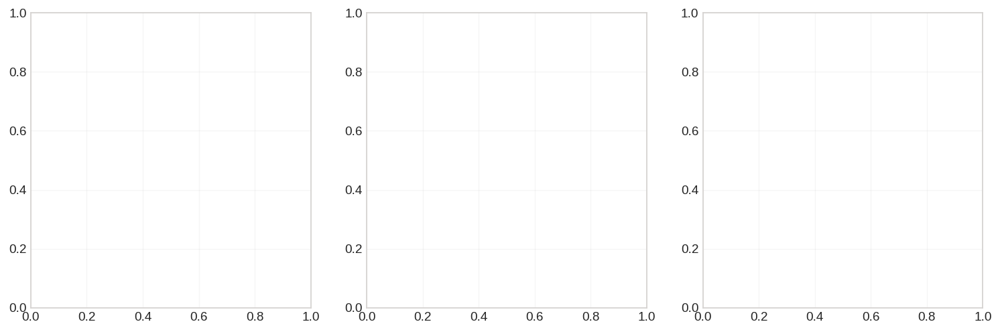

In [ ]:
# Full-history backtest: recursive rollout over every available historical TNavigator snapshot.
# Uses top cases already selected in all_top_cases, but rebuilds each case from base_index=0 to the last fact.
# HOTFIX: если all_top_cases не был создан предыдущей ячейкой,
# собираем его заново для train / validation / test.

if 'R' not in globals():
    def R(x):
        return str(x).encode('ascii').decode('unicode_escape') if '\\u' in str(x) else str(x)

if 'all_top_cases' not in globals():
    print('all_top_cases не найден: собираю top-кейсы заново для train / validation / test')

    # Важно: добавляем train, потому что старый BACKTEST_SPLITS иногда был только validation/test.
    BACKTEST_SPLITS = [
        ('train', train_datasets),
        ('validation', val_datasets),
        ('test', test_datasets),
    ]

    # Сколько кандидатов собрать. Берем с запасом, потом build_full_history_cases_from_top выберет лучшие.
    if 'BACKTEST_N_CASES' not in globals():
        BACKTEST_N_CASES = max(30, FULL_HISTORY_TOP_N * 8)

    if 'build_backtest_case_plan' in globals():
        top_plan = build_backtest_case_plan(BACKTEST_N_CASES)
    else:
        raise NameError('Не найдена функция build_backtest_case_plan. Сначала выполни ячейку с backtest-функциями.')

    all_top_cases = {}
    for split_name in ['train', 'validation', 'test']:
        rows = [c for c in top_plan if c.get('split') == split_name]
        rows = sorted(rows, key=lambda c: float(c.get('score', 0.0)), reverse=True)
        all_top_cases[split_name] = rows[:max(FULL_HISTORY_TOP_N * 2, FULL_HISTORY_TOP_N)]

    print('all_top_cases готов:', {k: len(v) for k, v in all_top_cases.items()})

R = globals().get('R', lambda s: s.encode('ascii').decode('unicode_escape'))
FULL_HISTORY_TOP_N = 5
FULL_HISTORY_DIFF_ENSEMBLE = min(6, int(globals().get('N_SCENARIOS', 6)))
FULL_HISTORY_BASE_INDEX = 0


def _full_history_split_label(split_name):
    return {'train': 'Train', 'validation': R('\\u0412\\u0430\\u043b\\u0438\\u0434\\u0430\\u0446\\u0438\\u044f'), 'test': R('\\u0422\\u0435\\u0441\\u0442')}.get(str(split_name), str(split_name))


@torch.no_grad()
def run_full_history_rollout(case, n_ens=6, base_index=0):
    ds = case['ds']
    scenario_idx = int(case['scenario_index'])
    layer_idx = int(case['layer_index'])
    T = len(ds.z[f'times_{scenario_idx:03d}'])
    if T < 2:
        raise ValueError('Scenario has less than two snapshots.')

    base_index = int(np.clip(base_index, 0, T - 2))
    target_indices = list(range(base_index + 1, T))
    times = np.asarray(ds.z[f'times_{scenario_idx:03d}'], dtype=float)
    years = START_YEAR + (times - times[base_index]) / 365.25
    mask = ds.act[layer_idx].astype(np.float32)
    mask_bool = mask.astype(bool)

    base = ds._layer(scenario_idx, base_index, layer_idx).clip(0, 1).astype(np.float32)
    truth_maps = np.stack([ds._layer(scenario_idx, t, layer_idx).clip(0, 1).astype(np.float32) for t in target_indices])
    truth_mean = np.asarray([float(x[mask_bool].mean()) for x in truth_maps], dtype=float)
    full_fact_mean = np.asarray([float(ds._layer(scenario_idx, t, layer_idx).clip(0, 1)[mask_bool].mean()) for t in range(base_index, T)], dtype=float)

    cur_unet = base.copy()
    cur_fno = base.copy()
    cur_diff = np.repeat(base[None], n_ens, axis=0).astype(np.float32)
    unet_maps, fno_maps, diff_samples_by_time = [], [], []

    prev_t = base_index
    for t in target_indices:
        step_idx = max(1, int(t - prev_t))
        rel = min(step_idx / max(1, max_delta_steps), 1.0)
        rel_days = float((times[t] - times[prev_t]) / max(1.0, float(HORIZON_DAYS_SCALE)))

        # U-Net recursive step.
        b_unet = build_forecast_batch(ds, scenario_idx, cur_unet, mask, rel, layer_idx, rel_days)
        c_unet = make_condition(b_unet, max_delta_steps=max_delta_steps, layers=ds.layers)
        d_unet = det(c_unet)[0, 0].detach().cpu().numpy() * dS_clip
        d_unet = enforce_soil_mean_trend(cur_unet, d_unet / max(dS_clip, 1e-8), mask, dS_clip) * dS_clip
        cur_unet = np.clip(cur_unet + d_unet, 0, 1).astype(np.float32)
        cur_unet = (cur_unet * mask + base * (1 - mask)).astype(np.float32)
        unet_maps.append(cur_unet.copy())

        # FNO recursive step.
        b_fno = build_forecast_batch(ds, scenario_idx, cur_fno, mask, rel, layer_idx, rel_days)
        c_fno = make_condition(b_fno, max_delta_steps=max_delta_steps, layers=ds.layers)
        d_fno = fno(c_fno)[0, 0].detach().cpu().numpy() * dS_clip
        d_fno = enforce_soil_mean_trend(cur_fno, d_fno / max(dS_clip, 1e-8), mask, dS_clip) * dS_clip
        cur_fno = np.clip(cur_fno + d_fno, 0, 1).astype(np.float32)
        cur_fno = (cur_fno * mask + base * (1 - mask)).astype(np.float32)
        fno_maps.append(cur_fno.copy())

        # Diffusion ensemble recursive step. Each ensemble member carries its own state.
        next_diff = []
        for start in range(0, n_ens, 4):
            chunk = cur_diff[start:start + 4]
            batch_items = []
            for member_map in chunk:
                batch_items.append(build_forecast_batch(ds, scenario_idx, member_map, mask, rel, layer_idx, rel_days))
            # Collate small list manually.
            b = {k: torch.cat([item[k] for item in batch_items], dim=0) for k in batch_items[0].keys()}
            c = make_condition(b, max_delta_steps=max_delta_steps, layers=ds.layers)
            d = diff.sample(c, sampler='ddim', ddim_eta=0.0).detach().cpu().numpy()[:, 0] * dS_clip
            d = np.stack([enforce_soil_mean_trend(chunk[ii], d[ii] / max(dS_clip, 1e-8), mask, dS_clip) * dS_clip for ii in range(len(chunk))]).astype(np.float32)
            nxt = np.clip(chunk + d, 0, 1).astype(np.float32)
            nxt = (nxt * mask[None] + chunk * (1 - mask[None])).astype(np.float32)
            next_diff.append(nxt)
        cur_diff = np.concatenate(next_diff, axis=0)
        diff_samples_by_time.append(cur_diff.copy())
        prev_t = t

    diff_samples = np.stack(diff_samples_by_time, axis=1)  # [ens,time,H,W]
    unet_maps = np.stack(unet_maps)
    fno_maps = np.stack(fno_maps)
    diff_mean_lines = diff_samples[:, :, mask_bool].mean(axis=2)
    diff_q10, diff_p50, diff_q90 = np.percentile(diff_mean_lines, [10, 50, 90], axis=0)

    regime, regime_numbers = _short_regime_label(ds, scenario_idx)
    return {
        **case,
        'base_index': base_index,
        'target_indices': target_indices,
        'years_full': years[base_index:T],
        'years_target': years[target_indices],
        'fact_full': full_fact_mean,
        'truth_mean': truth_mean,
        'unet_mean': np.asarray([float(x[mask_bool].mean()) for x in unet_maps], dtype=float),
        'fno_mean': np.asarray([float(x[mask_bool].mean()) for x in fno_maps], dtype=float),
        'diff_lines': diff_mean_lines,
        'diff_q10': diff_q10,
        'diff_p50': diff_p50,
        'diff_q90': diff_q90,
        'base_map': base,
        'mask': mask_bool,
        'regime': regime,
        'regime_numbers': regime_numbers,
        'scenario_name': str(ds.scenario_names[scenario_idx]),
    }


def _full_history_score(case):
    truth = np.asarray(case['truth_mean'], dtype=float)
    pred = np.asarray(case['diff_p50'], dtype=float)
    return float(np.sqrt(np.mean((pred - truth) ** 2)))


def build_full_history_cases_from_top(all_top_cases, n_show=5):
    result = {}
    for split_name in ['train', 'validation', 'test']:
        source_cases = list(all_top_cases.get(split_name, []))[:max(n_show * 2, n_show)]
        full_cases = []
        for case in progress_iter(source_cases, total=len(source_cases), desc=f'{_full_history_split_label(split_name)}: full-history rollout'):
            try:
                full_cases.append(run_full_history_rollout(case, n_ens=FULL_HISTORY_DIFF_ENSEMBLE, base_index=FULL_HISTORY_BASE_INDEX))
            except Exception as e:
                print('SKIP_FULL_HISTORY_CASE', split_name, case.get('grid_group'), case.get('scenario_index'), case.get('layer_index'), e)
        result[split_name] = sorted(full_cases, key=_full_history_score)[:n_show]
    return result


def plot_full_history_cases(full_cases_by_split, n_show=5):
    for split_name in ['train', 'validation', 'test']:
        cases = list(full_cases_by_split.get(split_name, []))[:n_show]
        if not cases:
            print('No full-history cases for', split_name)
            continue
        fig, axes = plt.subplots(1, len(cases), figsize=(4.7 * len(cases), 4.4), squeeze=False)
        for ax, case in zip(axes.ravel(), cases):
            years = np.asarray(case['years_target'], dtype=float)
            ax.plot(case['years_full'], case['fact_full'], color='#111827', lw=2.8, marker='o', ms=3.6, label=R('\u0444\u0430\u043a\u0442 TNavigator'))
            for line in case['diff_lines']:
                ax.plot(years, line, color='#93c5fd', alpha=0.18, lw=0.8, label='_nolegend_')
            ax.fill_between(years, case['diff_q10'], case['diff_q90'], color='#60a5fa', alpha=0.23, label=R('\u0434\u0438\u0444\u0444\u0443\u0437\u0438\u044f p10-p90'))
            ax.plot(years, case['diff_p50'], color='#1d4ed8', lw=2.3, marker='o', ms=3.6, label=R('\u0434\u0438\u0444\u0444\u0443\u0437\u0438\u044f p50'))
            ax.plot(years, case['unet_mean'], color='#f97316', lw=1.8, ls='--', marker='s', ms=3.2, label='U-Net')
            ax.plot(years, case['fno_mean'], color='#16a34a', lw=1.8, ls=':', marker='^', ms=3.2, label='FNO')
            rmse = _full_history_score(case)
            span = float(case['years_full'][-1] - case['years_full'][0]) if len(case['years_full']) > 1 else 0.0
            label_group = R('\u0433\u0440\u0443\u043f\u043f\u0430')
            label_layer = R('\u0441\u043b\u043e\u0439')
            label_history = R('\u0438\u0441\u0442\u043e\u0440\u0438\u044f')
            label_years = R('\u043b\u0435\u0442')
            ax.set_title(f"{label_group} {case['grid_group']} | {label_layer} {case['layer_index']}\n{case['regime']}\n{label_history} {span:.1f} {label_years}, RMSE={rmse:.4f}", fontsize=9.5, weight='bold')
            ax.set_xlabel(R('\u0413\u043e\u0434'))
            ax.set_ylabel(R('\u0421\u0440\u0435\u0434\u043d\u044f\u044f \u043d\u0435\u0444\u0442\u0435\u043d\u0430\u0441\u044b\u0449\u0435\u043d\u043d\u043e\u0441\u0442\u044c'))
            ax.grid(alpha=.22)
        handles, labels = axes.ravel()[0].get_legend_handles_labels()
        fig.legend(handles, labels, loc='upper center', ncol=5, frameon=True, fontsize=9)
        title_suffix = R('\u043f\u043e\u043b\u043d\u044b\u0439 \u0438\u0441\u0442\u043e\u0440\u0438\u0447\u0435\u0441\u043a\u0438\u0439 \u0440\u044f\u0434 - \u0444\u0430\u043a\u0442 \u043f\u0440\u043e\u0442\u0438\u0432 \u043f\u0440\u043e\u0433\u043d\u043e\u0437\u0430')
        fig.suptitle(f"{_full_history_split_label(split_name)}: {title_suffix}", fontsize=15, weight='bold', y=1.04)
        plt.tight_layout(rect=(0, 0, 1, .90))
        plt.show()


Год Год


Train: full-history rollout:   0%|          | 0/3 [00:00<?, ?it/s]

Валидация: full-history rollout: 0it [00:00, ?it/s]

Тест: full-history rollout:   0%|          | 0/5 [00:00<?, ?it/s]

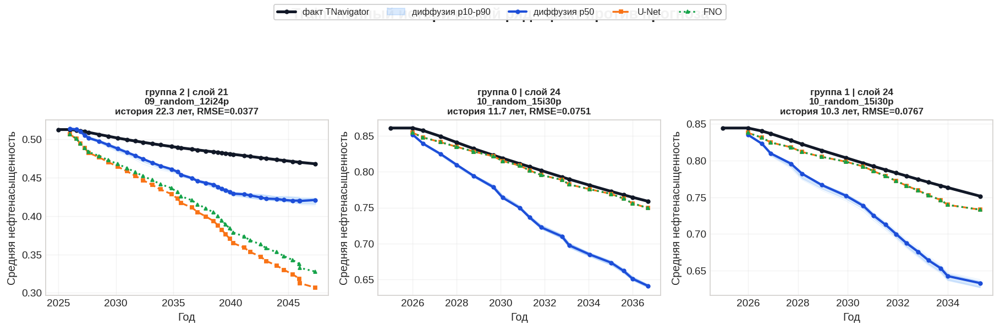

No full-history cases for validation


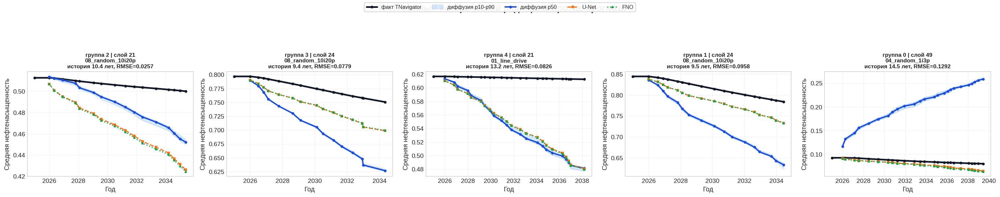

,Выборка,Ранг,Группа сетки,Сценарий,Режим,Слой,"Длина истории, лет",Число фактических срезов,RMSE диффузии p50,RMSE diffusion_p50_pp,MAE diffusion_p50_pp,Bias diffusion_p50_pp,NRMSE diffusion_p50_pct_range,"MAPE diffusion_p50, %",SSIM diffusion_p50,PSNR diffusion_p50_db,Trend_error_diffusion_p50_pp,RMSE U-Net,RMSE U-Net_pp,MAE U-Net_pp,Bias U-Net_pp,NRMSE U-Net_pct_range,"MAPE U-Net, %",SSIM U-Net,PSNR U-Net_db,Trend_error_U-Net_pp,RMSE FNO,RMSE FNO_pp,MAE FNO_pp,Bias FNO_pp,NRMSE FNO_pct_range,"MAPE FNO, %",SSIM FNO,PSNR FNO_db,Trend_error_FNO_pp
0,Train,1,2,Baza_PATTERN004_4__09_random_12i24p,09_random_12i24p,21,22.34908,36,0.03774,3.77411,3.32484,-3.31196,91.46706,6.90714,0.83889,28.46370,-4.82826,0.09464,9.46385,8.27104,-8.27104,229.36001,17.19606,0.52996,20.47864,-15.52395,0.08297,8.29695,7.28696,-7.28696,201.07975,15.14507,0.58664,21.62163,-13.43812
1,Train,2,0,Baza_PATTERN002_2__10_random_15i30p,10_random_15i30p,24,11.67967,18,0.07508,7.50832,6.69991,-6.69991,79.25981,8.47409,0.81344,22.48915,-10.85627,0.00615,0.61542,0.57225,-0.57225,6.49657,0.70995,0.99824,44.21652,-0.29587,0.00613,0.61263,0.56998,-0.56998,6.46713,0.70700,0.99827,44.25597,-0.28035
2,Train,3,1,Baza_PATTERN003_3__10_random_15i30p,10_random_15i30p,24,10.28884,18,0.07671,7.67111,6.80900,-6.80900,95.56070,8.70540,0.77911,22.30283,-10.95029,0.01291,1.29057,1.17634,-1.17634,16.07687,1.49314,0.98959,37.78439,-1.18929,0.01291,1.29063,1.17638,-1.17638,16.07771,1.49320,0.98958,37.78393,-1.18976
3,Тест,1,2,Baza_PATTERN004_4__08_random_10i20p,08_random_10i20p,21,10.38193,17,0.02570,2.56984,2.00887,-1.99654,214.42805,3.99553,0.80228,31.80186,-4.89019,0.04495,4.49476,4.00248,-4.00248,375.04311,7.94300,0.72272,26.94587,-6.80282,0.04619,4.61937,4.11645,-4.11645,385.44101,8.16907,0.71351,26.70834,-6.96461
4,Тест,2,3,Baza_PATTERN005_5__08_random_10i20p,08_random_10i20p,24,9.35250,16,0.07786,7.78616,6.87287,-6.87287,194.46557,8.95096,0.64065,22.17353,-11.65541,0.03405,3.40533,3.12460,-3.12460,85.05078,4.06135,0.90357,29.35682,-4.52682,0.03363,3.36278,3.08711,-3.08711,83.98823,4.01250,0.90590,29.46602,-4.46153
5,Тест,3,4,Baza_PATTERN006_6__01_line_drive,01_line_drive,21,13.19097,24,0.08260,8.26028,7.21476,-7.21476,2353.71351,11.75159,0.37982,21.66010,-12.77649,0.07932,7.93185,6.98144,-6.98144,2260.13038,11.37116,0.41004,22.01250,-12.55169,0.07984,7.98366,7.02410,-7.02410,2274.89079,11.44067,0.40636,21.95596,-12.64130
6,Тест,4,1,Baza_PATTERN003_3__08_random_10i20p,08_random_10i20p,24,9.47023,18,0.09578,9.57824,8.53152,-8.53152,172.01992,10.60352,0.64132,20.37429,-14.17904,0.03198,3.19782,2.95639,-2.95639,57.43109,3.66497,0.93579,29.90292,-4.43264,0.03197,3.19720,2.95601,-2.95601,57.41990,3.66448,0.93585,29.90461,-4.42663
7,Тест,5,0,Baza_PATTERN002_2__04_random_1i3p,04_random_1i3p,49,14.45585,26,0.12923,12.92318,12.15910,12.15910,1075.81492,144.40321,0.16399,17.77261,15.41499,0.00874,0.87444,0.79374,-0.79374,72.79461,9.45907,0.98159,41.16538,-1.35230,0.00989,0.98907,0.89786,-0.89786,82.33702,10.70309,0.97655,40.09546,-1.51082


saved: /content/outputs/backtest/full_history_train_validation_test_forecasts.csv


In [ ]:
# HOTFIX: безопасный R, который не падает на уже декодированном русском тексте.
def R(s):
    s = str(s)
    if '\\u' in s or '\\x' in s:
        try:
            return s.encode('ascii').decode('unicode_escape')
        except UnicodeEncodeError:
            return s
    return s

print(R('Год'), R('\\u0413\\u043e\\u0434'))

full_history_cases = build_full_history_cases_from_top(all_top_cases, n_show=FULL_HISTORY_TOP_N)
plot_full_history_cases(full_history_cases, n_show=FULL_HISTORY_TOP_N)

full_history_rows = []
for split_name, cases in full_history_cases.items():
    for rank, case in enumerate(cases, start=1):
        full_history_rows.append({
            R('\u0412\u044b\u0431\u043e\u0440\u043a\u0430'): _full_history_split_label(split_name),
            R('\u0420\u0430\u043d\u0433'): rank,
            R('\u0413\u0440\u0443\u043f\u043f\u0430 \u0441\u0435\u0442\u043a\u0438'): case['grid_group'],
            R('\u0421\u0446\u0435\u043d\u0430\u0440\u0438\u0439'): case['scenario_name'],
            R('\u0420\u0435\u0436\u0438\u043c'): case['regime'],
            R('\u0421\u043b\u043e\u0439'): case['layer_index'],
            R('\u0414\u043b\u0438\u043d\u0430 \u0438\u0441\u0442\u043e\u0440\u0438\u0438, \u043b\u0435\u0442'): float(case['years_full'][-1] - case['years_full'][0]),
            R('\u0427\u0438\u0441\u043b\u043e \u0444\u0430\u043a\u0442\u0438\u0447\u0435\u0441\u043a\u0438\u0445 \u0441\u0440\u0435\u0437\u043e\u0432'): len(case['years_full']),
            R('RMSE \u0434\u0438\u0444\u0444\u0443\u0437\u0438\u0438 p50'): _full_history_score(case),
            **sequence_quality_metrics(case['diff_p50'], case['truth_mean'], np.ones_like(case['truth_mean'], dtype=bool), suffix='diffusion_p50'),
            'RMSE U-Net': float(np.sqrt(np.mean((np.asarray(case['unet_mean']) - np.asarray(case['truth_mean'])) ** 2))),
            **sequence_quality_metrics(case['unet_mean'], case['truth_mean'], np.ones_like(case['truth_mean'], dtype=bool), suffix='U-Net'),
            'RMSE FNO': float(np.sqrt(np.mean((np.asarray(case['fno_mean']) - np.asarray(case['truth_mean'])) ** 2))),
            **sequence_quality_metrics(case['fno_mean'], case['truth_mean'], np.ones_like(case['truth_mean'], dtype=bool), suffix='FNO'),
        })
full_history_df = pd.DataFrame(full_history_rows)
style_dataframe(full_history_df, R('\u041f\u043e\u043b\u043d\u044b\u0439 \u0438\u0441\u0442\u043e\u0440\u0438\u0447\u0435\u0441\u043a\u0438\u0439 \u0440\u044f\u0434: top-\u043a\u0435\u0439\u0441\u044b train / validation / test'), precision=5)

full_history_out = PROJECT_ROOT / 'outputs' / 'backtest'
full_history_out.mkdir(parents=True, exist_ok=True)
full_history_df.to_csv(full_history_out / 'full_history_train_validation_test_forecasts.csv', index=False)
print('saved:', full_history_out / 'full_history_train_validation_test_forecasts.csv')

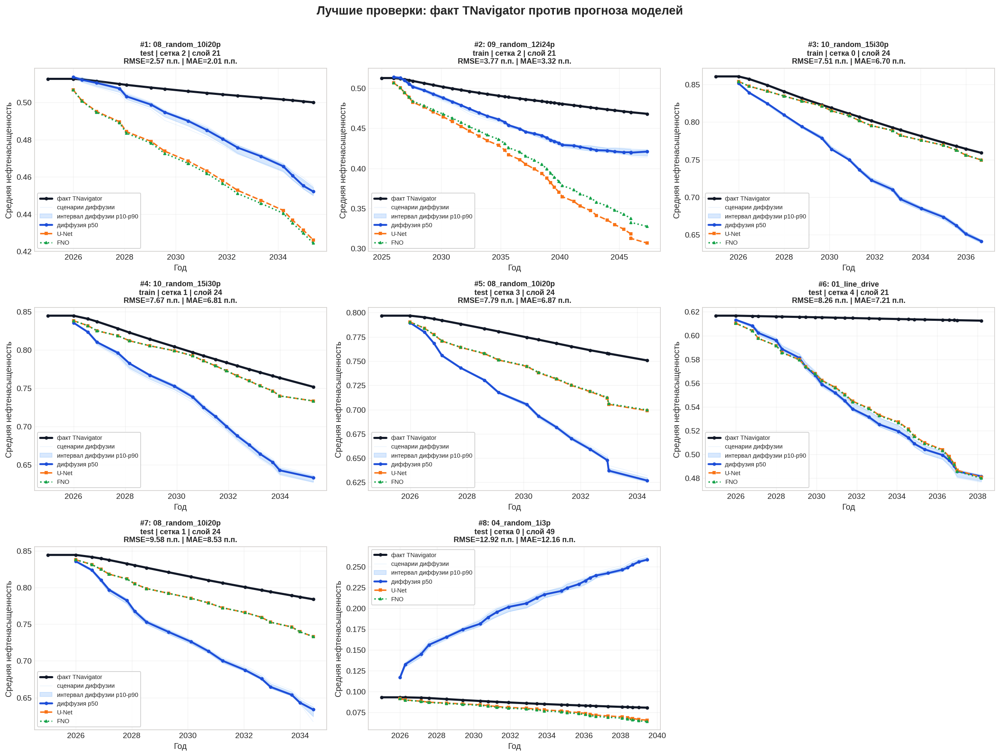

In [ ]:
def plot_best_full_history_cases_with_legends(best_cases=None, full_history_cases=None, n_show=10):
    # Если best_cases еще не создан, соберем из full_history_cases.
    if best_cases is None:
        if full_history_cases is None:
            raise ValueError('Передай best_cases или full_history_cases')
        rows = []
        for split_name, cases in full_history_cases.items():
            for c in cases:
                cc = dict(c)
                cc['split_name'] = split_name
                truth = np.asarray(cc['truth_mean'], dtype=float)
                pred = np.asarray(cc['diff_p50'], dtype=float)
                n = min(len(truth), len(pred))
                cc['rmse_diff'] = float(np.sqrt(np.mean((pred[:n] - truth[:n]) ** 2))) if n else np.inf
                cc['mae_diff'] = float(np.mean(np.abs(pred[:n] - truth[:n]))) if n else np.inf
                rows.append(cc)
        best_cases = sorted(rows, key=lambda x: x['rmse_diff'])[:n_show]
    else:
        best_cases = list(best_cases)[:n_show]

    n_show = min(n_show, len(best_cases))
    cols = 3 if n_show >= 6 else 2
    rows = int(np.ceil(n_show / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(6.2 * cols, 4.6 * rows), squeeze=False, dpi=130)
    axes = axes.ravel()

    for i, (ax, c) in enumerate(zip(axes, best_cases), start=1):
        years = np.asarray(c['years_target'], dtype=float)
        fact_years = np.asarray(c['years_full'], dtype=float)
        fact = np.asarray(c['fact_full'], dtype=float)
        p50 = np.asarray(c['diff_p50'], dtype=float)
        q10 = np.asarray(c['diff_q10'], dtype=float)
        q90 = np.asarray(c['diff_q90'], dtype=float)

        ax.plot(
            fact_years, fact,
            color='#111827', lw=2.8, marker='o', ms=3.6,
            label='факт TNavigator'
        )

        # Отдельные члены ансамбля тонкими линиями.
        for j, line in enumerate(np.asarray(c['diff_lines'])):
            ax.plot(
                years, line,
                color='#93c5fd', alpha=0.20, lw=0.8,
                label='сценарии диффузии' if j == 0 else '_nolegend_'
            )

        ax.fill_between(
            years, q10, q90,
            color='#60a5fa', alpha=0.24,
            label='интервал диффузии p10-p90'
        )
        ax.plot(
            years, p50,
            color='#1d4ed8', lw=2.5, marker='o', ms=3.6,
            label='диффузия p50'
        )

        if 'unet_mean' in c:
            ax.plot(
                years, c['unet_mean'],
                color='#f97316', lw=1.9, ls='--', marker='s', ms=3.2,
                label='U-Net'
            )
        if 'fno_mean' in c:
            ax.plot(
                years, c['fno_mean'],
                color='#16a34a', lw=1.9, ls=':', marker='^', ms=3.2,
                label='FNO'
            )

        rmse_pp = float(c.get('rmse_diff', np.nan)) * 100
        mae_pp = float(c.get('mae_diff', np.nan)) * 100
        ax.set_title(
            f'#{i}: {c.get("regime", "режим")}\n'
            f'{c.get("split_name", "")} | сетка {c.get("grid_group")} | слой {c.get("layer_index")}\n'
            f'RMSE={rmse_pp:.2f} п.п. | MAE={mae_pp:.2f} п.п.',
            fontsize=10,
            fontweight='bold'
        )
        ax.set_xlabel('Год')
        ax.set_ylabel('Средняя нефтенасыщенность')
        ax.grid(alpha=0.22)

        # Главное: легенда на каждом графике, не одна общая микроскопическая.
        ax.legend(
            loc='best',
            fontsize=8,
            frameon=True,
            framealpha=0.92,
            borderpad=0.45,
            handlelength=2.0
        )

    for ax in axes[n_show:]:
        ax.axis('off')

    fig.suptitle(
        'Лучшие проверки: факт TNavigator против прогноза моделей',
        fontsize=16,
        fontweight='bold',
        y=1.01
    )
    plt.tight_layout()
    plt.show()

plot_best_full_history_cases_with_legends(
    best_cases=best_cases if 'best_cases' in globals() else None,
    full_history_cases=full_history_cases,
    n_show=10
)

Кандидатов для широкого поиска: 55


Широкий поиск лучших кейсов:   0%|          | 0/55 [00:00<?, ?it/s]

,Ранг,Выборка,Группа сетки,Слой,Режим,Сценарий,"RMSE диффузии, п.п.","MAE диффузии, п.п.","Длина истории, лет"
0,1,validation,2,21,10_random_15i30p,Baza_PATTERN004_4__10_random_15i30p,1.365442,1.110916,16.991102
1,2,test,2,21,08_random_10i20p,Baza_PATTERN004_4__08_random_10i20p,2.647759,2.150091,10.381930
2,3,train,2,21,09_random_12i24p,Baza_PATTERN004_4__09_random_12i24p,3.640967,3.136772,22.349076
3,4,train,2,21,07_random_6i12p,Baza_PATTERN004_4__07_random_6i12p,4.794856,4.036996,14.773443
4,5,train,3,24,09_random_12i24p,Baza_PATTERN005_5__09_random_12i24p,4.808686,4.175271,6.417522
5,6,train,4,21,09_random_12i24p,Baza_PATTERN006_6__09_random_12i24p,5.401834,4.726823,13.911020
6,7,train,2,21,01_line_drive,Baza_PATTERN004_4__01_line_drive,5.441348,4.659511,19.537303
7,8,test,2,21,03_inverse_five_spot,Baza_PATTERN004_4__03_inverse_five_spot,5.547222,4.704309,15.619439
8,9,train,0,24,09_random_12i24p,Baza_PATTERN002_2__09_random_12i24p,5.866857,5.203088,7.340178
9,10,test,4,21,02_five_spot,Baza_PATTERN006_6__02_five_spot,6.708467,5.775818,10.806297


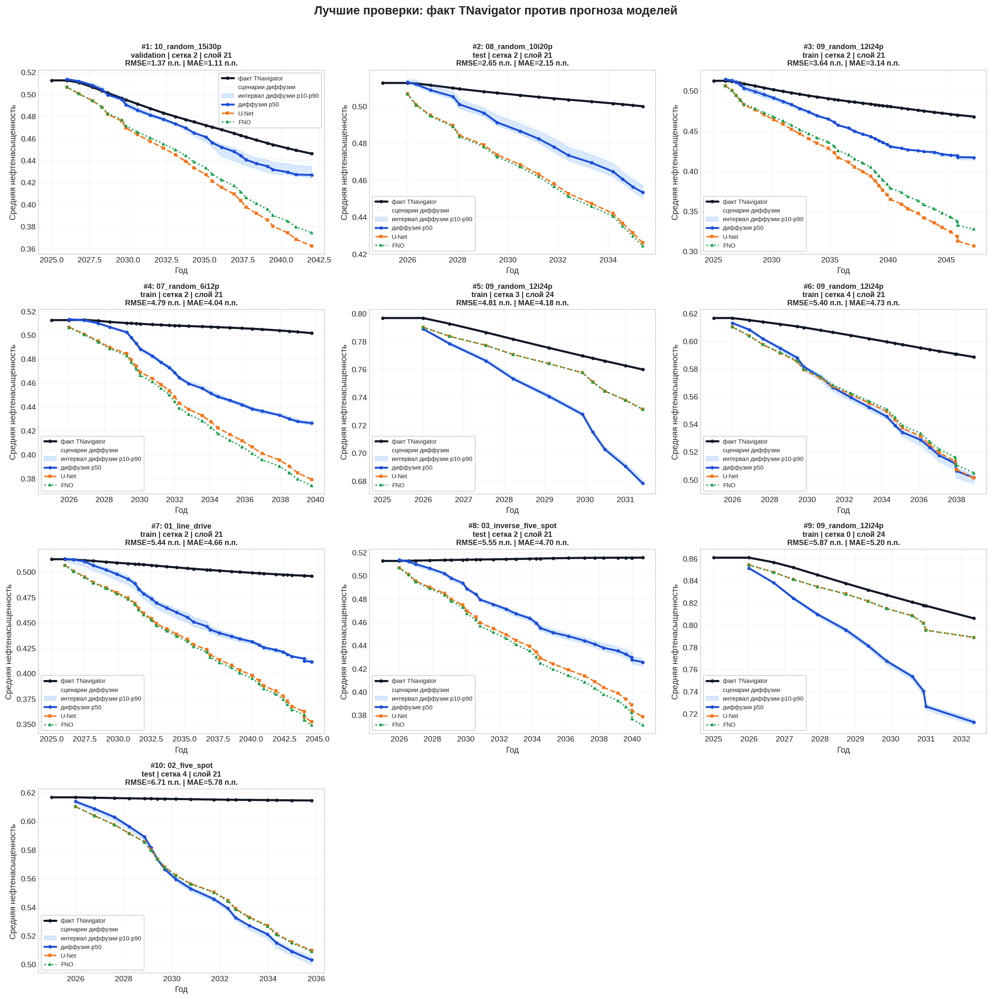

In [ ]:
# Широкий поиск лучших full-history кейсов по train / validation / test.
# Это дольше, зато реально ищет лучшие, а не только среди уже отрисованных.

WIDE_TOP_N = 10
WIDE_CANDIDATES_PER_SPLIT = 25
WIDE_DIFF_ENSEMBLE = 4  # можно 6-8, но будет дольше

if 'R' not in globals():
    def R(s):
        s = str(s)
        if '\\u' in s:
            try:
                return s.encode('ascii').decode('unicode_escape')
            except Exception:
                return s
        return s

BACKTEST_SPLITS = [
    ('train', train_datasets),
    ('validation', val_datasets),
    ('test', test_datasets),
]

def _rmse_case_quick(case):
    truth = np.asarray(case['truth_mean'], dtype=float)
    pred = np.asarray(case['diff_p50'], dtype=float)
    n = min(len(truth), len(pred))
    return float(np.sqrt(np.mean((pred[:n] - truth[:n]) ** 2))) if n else np.inf

def build_wide_candidate_plan(candidates_per_split=25):
    old_n = globals().get('BACKTEST_N_CASES', 30)
    globals()['BACKTEST_N_CASES'] = max(60, candidates_per_split * 3)

    plan = build_backtest_case_plan(globals()['BACKTEST_N_CASES'])

    out = []
    for split_name in ['train', 'validation', 'test']:
        rows = [c for c in plan if c.get('split') == split_name]
        rows = sorted(rows, key=lambda c: float(c.get('score', 0.0)), reverse=True)
        out.extend(rows[:candidates_per_split])

    globals()['BACKTEST_N_CASES'] = old_n
    return out

wide_plan = build_wide_candidate_plan(WIDE_CANDIDATES_PER_SPLIT)
print('Кандидатов для широкого поиска:', len(wide_plan))

wide_results = []
for case in progress_iter(wide_plan, total=len(wide_plan), desc='Широкий поиск лучших кейсов'):
    try:
        r = run_full_history_rollout(case, n_ens=WIDE_DIFF_ENSEMBLE, base_index=FULL_HISTORY_BASE_INDEX)
        r['split_name'] = case.get('split')
        r['rmse_diff'] = _rmse_case_quick(r)
        r['mae_diff'] = float(np.mean(np.abs(np.asarray(r['diff_p50']) - np.asarray(r['truth_mean']))))
        wide_results.append(r)
    except Exception as e:
        print('SKIP_WIDE_CASE', case.get('split'), case.get('grid_group'), case.get('scenario_index'), case.get('layer_index'), e)

wide_best_cases = sorted(wide_results, key=lambda x: x['rmse_diff'])[:WIDE_TOP_N]

display(pd.DataFrame([{
    'Ранг': i + 1,
    'Выборка': c.get('split_name'),
    'Группа сетки': c.get('grid_group'),
    'Слой': c.get('layer_index'),
    'Режим': c.get('regime'),
    'Сценарий': c.get('scenario_name'),
    'RMSE диффузии, п.п.': c['rmse_diff'] * 100,
    'MAE диффузии, п.п.': c['mae_diff'] * 100,
    'Длина истории, лет': float(c['years_full'][-1] - c['years_full'][0]),
} for i, c in enumerate(wide_best_cases)]))

plot_best_full_history_cases_with_legends(
    best_cases=wide_best_cases,
    full_history_cases=None,
    n_show=WIDE_TOP_N
)

Кандидатов для быстрой проверки: 6
Ансамбль: 6 | максимум временных точек: 8
[1/6] train | сетка 1 | сценарий 18 | слой 24
[2/6] train | сетка 0 | сценарий 9 | слой 24
[3/6] validation | сетка 0 | сценарий 7 | слой 24
[4/6] validation | сетка 4 | сценарий 47 | слой 0
[5/6] test | сетка 3 | сценарий 37 | слой 24
[6/6] test | сетка 1 | сценарий 17 | слой 24


,Ранг,Выборка,Группа сетки,Слой,Режим,Сценарий,"Teacher RMSE, п.п.","Recursive RMSE, п.п.","Разница из-за накопления, п.п.","Teacher MAE, п.п.","Recursive MAE, п.п.",DDIM eta,Запусков диффузии
0,1,test,3,24,08_random_10i20p,Baza_PATTERN005_5__08_random_10i20p,0.302104,0.456107,0.154003,0.243213,0.362917,0.7,6
1,2,test,1,24,08_random_10i20p,Baza_PATTERN003_3__08_random_10i20p,0.479235,0.845189,0.365953,0.377286,0.725681,0.7,6
2,3,train,0,24,10_random_15i30p,Baza_PATTERN002_2__10_random_15i30p,1.041526,3.431508,2.389982,0.874717,2.998181,0.7,6
3,4,validation,0,24,08_random_10i20p,Baza_PATTERN002_2__08_random_10i20p,1.058996,4.468263,3.409268,1.013865,4.020809,0.7,6
4,5,train,1,24,09_random_12i24p,Baza_PATTERN003_3__09_random_12i24p,1.791513,7.961432,6.169919,1.669938,7.313704,0.7,6
5,6,validation,4,0,08_random_10i20p,Baza_PATTERN006_6__08_random_10i20p,7.196340,20.738625,13.542285,3.253640,20.723802,0.7,6


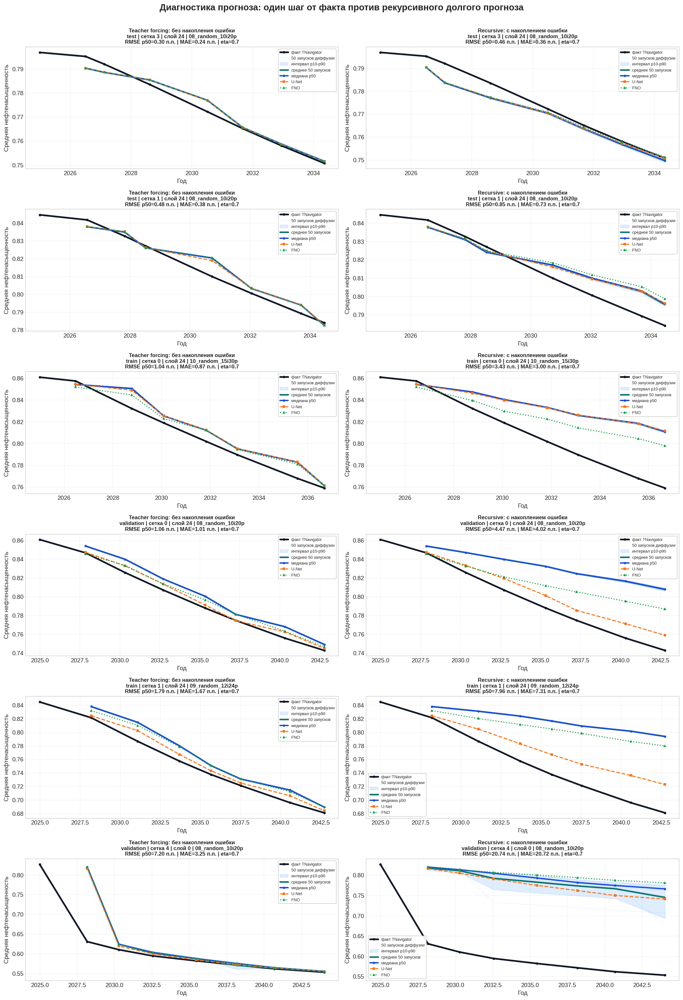

In [41]:
# БЫСТРАЯ версия teacher-forcing vs recursive:
# меньше кандидатов, меньше ансамбль, меньше кадров истории.

COMPARE_TOP_N = 6
COMPARE_CANDIDATES_PER_SPLIT = 2
COMPARE_DIFF_ENSEMBLE = 6
COMPARE_DDIM_ETA = 0.7
COMPARE_CHUNK_SIZE = 4
COMPARE_BASE_INDEX = 0
COMPARE_MAX_TIME_POINTS = 8

def _thin_case_time_grid(case, max_points=8):
    ds = case['ds']
    s = int(case['scenario_index'])
    T = len(ds.z[f'times_{s:03d}'])
    if T <= max_points:
        return case

    idx = np.unique(np.linspace(0, T - 1, max_points).round().astype(int))
    idx = idx[idx >= 0]
    if len(idx) < 3:
        return case

    # Для быстрой диагностики monkey-patch через поле custom_time_indices.
    c = dict(case)
    c['custom_time_indices'] = idx.tolist()
    return c

@torch.no_grad()
def run_history_compare_case_fast(case, n_ens=12, base_index=0):
    ds = case['ds']
    scenario_idx = int(case['scenario_index'])
    layer_idx = int(case['layer_index'])

    full_times = np.asarray(ds.z[f'times_{scenario_idx:03d}'], dtype=float)
    T = len(full_times)

    if T < 3:
        raise ValueError('Scenario has less than three snapshots.')

    if 'custom_time_indices' in case:
        time_indices = [int(x) for x in case['custom_time_indices'] if 0 <= int(x) < T]
        time_indices = sorted(set(time_indices))
        if time_indices[0] != 0:
            time_indices = [0] + time_indices
    else:
        time_indices = list(range(T))

    if len(time_indices) < 3:
        raise ValueError('Too few time points.')

    base_global = int(time_indices[0])
    target_globals = time_indices[1:]

    times = full_times
    years = START_YEAR + (times - times[base_global]) / 365.25

    mask = ds.act[layer_idx].astype(np.float32)
    mask_bool = mask.astype(bool)

    fact_maps = np.stack([
        ds._layer(scenario_idx, t, layer_idx).clip(0, 1).astype(np.float32)
        for t in time_indices
    ])
    fact_mean = np.asarray([float(x[mask_bool].mean()) for x in fact_maps], dtype=float)
    truth_mean = fact_mean[1:]

    base = fact_maps[0]

    # ---------- teacher forcing ----------
    tf_diff_lines = []
    tf_unet_mean = []
    tf_fno_mean = []

    for local_k, t in enumerate(target_globals, start=1):
        prev_t = time_indices[local_k - 1]
        real_prev_map = ds._layer(scenario_idx, prev_t, layer_idx).clip(0, 1).astype(np.float32)

        step_idx = max(1, int(t - prev_t))
        rel = min(step_idx / max(1, max_delta_steps), 1.0)
        rel_days = float((times[t] - times[prev_t]) / max(1.0, float(HORIZON_DAYS_SCALE)))

        source_maps = np.repeat(real_prev_map[None], n_ens, axis=0).astype(np.float32)
        diff_next, unet_next, fno_next = _predict_transition_maps(
            ds, scenario_idx, layer_idx, source_maps, mask,
            rel=rel,
            rel_days=rel_days,
            n_ens=n_ens,
            seed_base=100_000 + scenario_idx * 1009 + layer_idx * 101 + int(t) * 17
        )

        tf_diff_lines.append(diff_next[:, mask_bool].mean(axis=1))
        tf_unet_mean.append(float(unet_next[mask_bool].mean()))
        tf_fno_mean.append(float(fno_next[mask_bool].mean()))

    tf_diff_lines = np.asarray(tf_diff_lines).T  # [ens,time]
    tf_q10, tf_p50, tf_q90 = np.percentile(tf_diff_lines, [10, 50, 90], axis=0)
    tf_mean = tf_diff_lines.mean(axis=0)

    # ---------- recursive ----------
    rec_cur_diff = np.repeat(base[None], n_ens, axis=0).astype(np.float32)
    rec_cur_unet = base.copy()
    rec_cur_fno = base.copy()

    rec_diff_lines = []
    rec_unet_mean = []
    rec_fno_mean = []

    prev_t = base_global
    for t in target_globals:
        step_idx = max(1, int(t - prev_t))
        rel = min(step_idx / max(1, max_delta_steps), 1.0)
        rel_days = float((times[t] - times[prev_t]) / max(1.0, float(HORIZON_DAYS_SCALE)))

        rec_next_diff, _, _ = _predict_transition_maps(
            ds, scenario_idx, layer_idx, rec_cur_diff, mask,
            rel=rel,
            rel_days=rel_days,
            n_ens=n_ens,
            seed_base=200_000 + scenario_idx * 1009 + layer_idx * 101 + int(t) * 17
        )
        rec_cur_diff = rec_next_diff
        rec_diff_lines.append(rec_cur_diff[:, mask_bool].mean(axis=1))

        one_unet = np.repeat(rec_cur_unet[None], n_ens, axis=0)
        _, rec_cur_unet, _ = _predict_transition_maps(
            ds, scenario_idx, layer_idx, one_unet, mask,
            rel=rel,
            rel_days=rel_days,
            n_ens=n_ens,
            seed_base=300_000 + scenario_idx * 1009 + layer_idx * 101 + int(t) * 17
        )
        rec_unet_mean.append(float(rec_cur_unet[mask_bool].mean()))

        one_fno = np.repeat(rec_cur_fno[None], n_ens, axis=0)
        _, _, rec_cur_fno = _predict_transition_maps(
            ds, scenario_idx, layer_idx, one_fno, mask,
            rel=rel,
            rel_days=rel_days,
            n_ens=n_ens,
            seed_base=400_000 + scenario_idx * 1009 + layer_idx * 101 + int(t) * 17
        )
        rec_fno_mean.append(float(rec_cur_fno[mask_bool].mean()))

        prev_t = t

    rec_diff_lines = np.asarray(rec_diff_lines).T
    rec_q10, rec_p50, rec_q90 = np.percentile(rec_diff_lines, [10, 50, 90], axis=0)
    rec_mean = rec_diff_lines.mean(axis=0)

    regime, regime_numbers = _short_regime_label(ds, scenario_idx)

    target_years = years[target_globals]
    full_years = years[time_indices]

    out = {
        **case,
        'split_name': case.get('split'),
        'scenario_name': str(ds.scenario_names[scenario_idx]),
        'regime': regime,
        'regime_numbers': regime_numbers,
        'years_full': full_years,
        'years_target': target_years,
        'fact_full': fact_mean,
        'truth_mean': truth_mean,
        'n_ens': n_ens,
        'ddim_eta': COMPARE_DDIM_ETA,

        'teacher_diff_lines': tf_diff_lines,
        'teacher_q10': tf_q10,
        'teacher_p50': tf_p50,
        'teacher_q90': tf_q90,
        'teacher_mean': tf_mean,
        'teacher_unet_mean': np.asarray(tf_unet_mean),
        'teacher_fno_mean': np.asarray(tf_fno_mean),

        'recursive_diff_lines': rec_diff_lines,
        'recursive_q10': rec_q10,
        'recursive_p50': rec_p50,
        'recursive_q90': rec_q90,
        'recursive_mean': rec_mean,
        'recursive_unet_mean': np.asarray(rec_unet_mean),
        'recursive_fno_mean': np.asarray(rec_fno_mean),
    }

    out['teacher_rmse_pp'] = _rmse_1d(tf_p50, truth_mean) * 100
    out['recursive_rmse_pp'] = _rmse_1d(rec_p50, truth_mean) * 100
    out['teacher_mae_pp'] = _mae_1d(tf_p50, truth_mean) * 100
    out['recursive_mae_pp'] = _mae_1d(rec_p50, truth_mean) * 100
    out['teacher_bias_pp'] = _bias_1d(tf_p50, truth_mean) * 100
    out['recursive_bias_pp'] = _bias_1d(rec_p50, truth_mean) * 100

    return out

# Собираем меньше кандидатов.
compare_plan = build_compare_candidate_plan(COMPARE_CANDIDATES_PER_SPLIT)
compare_plan = [_thin_case_time_grid(c, COMPARE_MAX_TIME_POINTS) for c in compare_plan]

print('Кандидатов для быстрой проверки:', len(compare_plan))
print('Ансамбль:', COMPARE_DIFF_ENSEMBLE, '| максимум временных точек:', COMPARE_MAX_TIME_POINTS)

compare_results = []
for i, case in enumerate(compare_plan, start=1):
    print(f'[{i}/{len(compare_plan)}] {case.get("split")} | сетка {case.get("grid_group")} | сценарий {case.get("scenario_index")} | слой {case.get("layer_index")}')
    try:
        r = run_history_compare_case_fast(case, n_ens=COMPARE_DIFF_ENSEMBLE, base_index=COMPARE_BASE_INDEX)
        compare_results.append(r)
    except Exception as e:
        print('SKIP_COMPARE_CASE', case.get('split'), case.get('grid_group'), case.get('scenario_index'), case.get('layer_index'), e)

compare_best = sorted(compare_results, key=lambda x: x['teacher_rmse_pp'])[:COMPARE_TOP_N]

compare_df = pd.DataFrame([{
    'Ранг': i + 1,
    'Выборка': c.get('split_name'),
    'Группа сетки': c.get('grid_group'),
    'Слой': c.get('layer_index'),
    'Режим': c.get('regime'),
    'Сценарий': c.get('scenario_name'),
    'Teacher RMSE, п.п.': c['teacher_rmse_pp'],
    'Recursive RMSE, п.п.': c['recursive_rmse_pp'],
    'Разница из-за накопления, п.п.': c['recursive_rmse_pp'] - c['teacher_rmse_pp'],
    'Teacher MAE, п.п.': c['teacher_mae_pp'],
    'Recursive MAE, п.п.': c['recursive_mae_pp'],
    'DDIM eta': c['ddim_eta'],
    'Запусков диффузии': c['n_ens'],
} for i, c in enumerate(compare_best)])

display(compare_df)

plot_compare_case_grid(compare_best, n_show=COMPARE_TOP_N)

In [42]:
# Настройки для GIF с тремя картами изменения.
# 1) факт TNavigator: изменение от стартовой карты;
# 2) рекурсивная диффузия: изменение от стартовой карты;
# 3) teacher forcing: каждый шаг от реальной предыдущей карты TNavigator.

# Быстрый режим GIF, чтобы не ждать вечность.
N_GIFS = 3
N_ENSEMBLE_GIF = 6
MAX_FRAMES_PER_GIF = 6
GIF_FPS = 2
DIFFUSION_DDIM_ETA_GIF = 0.7

@torch.no_grad()
def _diffusion_step_ensemble(
    ds,
    scenario_idx,
    layer,
    cur_map,
    mask,
    step_index_delta,
    step_days_delta,
    n_ens=50,
    seed=123,
    ddim_eta=DIFFUSION_DDIM_ETA_GIF,
):
    rel_idx = min(float(step_index_delta) / max(1, float(max_delta_steps)), 1.0)
    hscale = float(globals().get('HORIZON_DAYS_SCALE', 365.25 * max(1, max_delta_steps)))
    rel_days = min(float(step_days_delta) / max(1.0, hscale), 1.5)

    b = build_forecast_batch(
        ds,
        int(scenario_idx),
        cur_map.astype(np.float32),
        mask.astype(np.float32),
        rel_idx,
        int(layer),
        rel_days,
    )
    c = make_condition(b, max_delta_steps=max_delta_steps, layers=ds.layers)

    chunks = []
    batch_chunk = 4

    for start in range(0, n_ens, batch_chunk):
        n = min(batch_chunk, n_ens - start)
        torch.manual_seed(int(seed + start))

        cc = c.repeat_interleave(n, 0)

        # Модель выдает нормированное приращение ΔS_o / dS_clip.
        delta_norm = diff.sample(
            cc,
            sampler='ddim',
            ddim_eta=ddim_eta,
        ).detach().cpu().numpy()[:, 0]

        pred = np.clip(cur_map[None] + delta_norm * dS_clip, 0, 1)
        pred = pred * mask[None] + cur_map[None] * (1 - mask[None])
        chunks.append(pred.astype(np.float32))

    ens = np.concatenate(chunks, axis=0)
    return ens


def _rollout_case_against_tnav(case, n_ens=50):
    ds = case['ds']
    s = int(case['scenario_idx'])
    layer = _best_layer_for_scenario(ds, s)

    times = np.asarray(ds.z[f'times_{s:03d}'], dtype=float)
    T = len(times)

    frame_idx = np.unique(
        np.linspace(
            START_INDEX_FOR_COMPARISON,
            T - 1,
            min(MAX_FRAMES_PER_GIF, T),
        ).round().astype(int)
    )

    if frame_idx[0] != START_INDEX_FOR_COMPARISON:
        frame_idx = np.r_[START_INDEX_FOR_COMPARISON, frame_idx]

    frame_idx = np.unique(frame_idx)

    mask = _active_mask(ds, layer).astype(np.float32)
    m = mask.astype(bool)

    base = ds._layer(s, int(frame_idx[0]), layer).clip(0, 1).astype(np.float32)

    truth = np.stack([
        ds._layer(s, int(ti), layer).clip(0, 1).astype(np.float32)
        for ti in frame_idx
    ])

    # -------------------------
    # A) Рекурсивная диффузия:
    # каждый следующий шаг стартует от собственного прошлого прогноза.
    # -------------------------
    rec_series = []
    cur_ens = np.repeat(base[None], n_ens, axis=0).astype(np.float32)
    rec_series.append(cur_ens.copy())

    for k in range(1, len(frame_idx)):
        prev_i = int(frame_idx[k - 1])
        next_i = int(frame_idx[k])

        step_index_delta = max(1, next_i - prev_i)
        step_days_delta = max(1.0, float(times[next_i] - times[prev_i]))

        next_members = []
        for j in range(n_ens):
            member_ens = _diffusion_step_ensemble(
                ds,
                s,
                layer,
                cur_ens[j],
                mask,
                step_index_delta=step_index_delta,
                step_days_delta=step_days_delta,
                n_ens=1,
                seed=10000 + 97 * j + 131 * k + s,
                ddim_eta=DIFFUSION_DDIM_ETA_GIF,
            )
            next_members.append(member_ens[0])

        cur_ens = np.stack(next_members).astype(np.float32)
        rec_series.append(cur_ens.copy())

    rec_series = np.stack(rec_series, axis=1)  # [ens,time,H,W]

    # -------------------------
    # B) Teacher forcing:
    # каждый шаг стартует от реальной предыдущей карты TNavigator.
    # Это краткосрочная проверка без накопления ошибки.
    # -------------------------
    tf_series = []
    tf_series.append(np.repeat(base[None], n_ens, axis=0).astype(np.float32))

    for k in range(1, len(frame_idx)):
        prev_i = int(frame_idx[k - 1])
        next_i = int(frame_idx[k])

        real_prev = ds._layer(s, prev_i, layer).clip(0, 1).astype(np.float32)

        step_index_delta = max(1, next_i - prev_i)
        step_days_delta = max(1.0, float(times[next_i] - times[prev_i]))

        tf_ens = _diffusion_step_ensemble(
            ds,
            s,
            layer,
            real_prev,
            mask,
            step_index_delta=step_index_delta,
            step_days_delta=step_days_delta,
            n_ens=n_ens,
            seed=50000 + 131 * k + s,
            ddim_eta=DIFFUSION_DDIM_ETA_GIF,
        )
        tf_series.append(tf_ens.astype(np.float32))

    tf_series = np.stack(tf_series, axis=1)  # [ens,time,H,W]

    years = 2025.0 + (times[frame_idx] - times[frame_idx[0]]) / 365.25

    rec_p50 = np.percentile(rec_series, 50, axis=0)
    rec_p10 = np.percentile(rec_series, 10, axis=0)
    rec_p90 = np.percentile(rec_series, 90, axis=0)

    tf_p50 = np.percentile(tf_series, 50, axis=0)
    tf_p10 = np.percentile(tf_series, 10, axis=0)
    tf_p90 = np.percentile(tf_series, 90, axis=0)

    truth_mean = np.array([_masked_mean(x, m) for x in truth])
    rec_p50_mean = np.array([_masked_mean(x, m) for x in rec_p50])
    tf_p50_mean = np.array([_masked_mean(x, m) for x in tf_p50])

    rec_rmse = float(np.sqrt(np.mean((rec_p50[:, m] - truth[:, m]) ** 2)))
    tf_rmse = float(np.sqrt(np.mean((tf_p50[:, m] - truth[:, m]) ** 2)))

    rec_mae = float(np.mean(np.abs(rec_p50[:, m] - truth[:, m])))
    tf_mae = float(np.mean(np.abs(tf_p50[:, m] - truth[:, m])))

    rec_bias = float(np.mean(rec_p50[:, m] - truth[:, m]))
    tf_bias = float(np.mean(tf_p50[:, m] - truth[:, m]))

    rec_coverage = float(np.mean((truth[:, m] >= rec_p10[:, m]) & (truth[:, m] <= rec_p90[:, m])))
    tf_coverage = float(np.mean((truth[:, m] >= tf_p10[:, m]) & (truth[:, m] <= tf_p90[:, m])))

    return {
        **case,
        'layer': int(layer),
        'frame_idx': frame_idx,
        'years': years,
        'mask': m,
        'base': base,

        'truth': truth,

        'ens': rec_series,
        'p50': rec_p50,
        'p10': rec_p10,
        'p90': rec_p90,

        'teacher_ens': tf_series,
        'teacher_p50': tf_p50,
        'teacher_p10': tf_p10,
        'teacher_p90': tf_p90,

        'truth_mean': truth_mean,
        'p50_mean': rec_p50_mean,
        'teacher_p50_mean': tf_p50_mean,

        'rmse': rec_rmse,
        'mae': rec_mae,
        'bias': rec_bias,
        'coverage': rec_coverage,

        'teacher_rmse': tf_rmse,
        'teacher_mae': tf_mae,
        'teacher_bias': tf_bias,
        'teacher_coverage': tf_coverage,

        'n_ens': n_ens,
        'ddim_eta': DIFFUSION_DDIM_ETA_GIF,
        'well_points': _well_proxy_points(ds, s, layer),
    }


def _make_case_gif(result, idx):
    mask = result['mask']
    years = result['years']
    mode = result['mode']
    scenario_name = result['scenario_name']
    layer = result['layer']
    base = result['base']

    sy, sx = _bbox(mask, 5)

    if SHOW_ABSOLUTE_SATURATION_GIF:
        all_vals = np.concatenate([
            result['truth'][:, mask].ravel(),
            result['p50'][:, mask].ravel(),
            result['teacher_p50'][:, mask].ravel(),
        ])
        vmin, vmax = np.nanpercentile(all_vals, [2, 98])
        cmap = SAT_CMAP
        cbar_label = 'S_o'
    else:
        # Показываем развитие карты как изменение относительно старта.
        true_delta_all = result['truth'] - base[None]
        rec_delta_all = result['p50'] - base[None]
        tf_delta_all = result['teacher_p50'] - base[None]

        all_delta = np.concatenate([
            true_delta_all[:, mask].ravel(),
            rec_delta_all[:, mask].ravel(),
            tf_delta_all[:, mask].ravel(),
        ])
        lim = max(0.005, float(np.nanpercentile(np.abs(all_delta), 98)))
        vmin, vmax = -lim, lim
        cmap = 'coolwarm'
        cbar_label = 'ΔS_o от старта'

    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
        vmin, vmax = (-0.02, 0.02) if not SHOW_ABSOLUTE_SATURATION_GIF else (0, 1)

    fig, axes = plt.subplots(1, 3, figsize=(18.5, 6.2), dpi=120)
    ax_true, ax_rec, ax_tf = axes

    def _panel_img(arr):
        return np.where(mask[sy, sx], arr[sy, sx], np.nan)

    def update(k):
        for ax in axes:
            ax.clear()

        if SHOW_ABSOLUTE_SATURATION_GIF:
            true_img = result['truth'][k]
            rec_img = result['p50'][k]
            tf_img = result['teacher_p50'][k]
            titles = [
                'Факт TNavigator',
                'Рекурсивная диффузия, p50',
                'Teacher forcing, p50',
            ]
        else:
            true_img = result['truth'][k] - base
            rec_img = result['p50'][k] - base
            tf_img = result['teacher_p50'][k] - base
            titles = [
                'Факт: реальное изменение ΔS_o',
                'Рекурсивный прогноз: сумма приращений ΔS_o',
                'Краткосрок: teacher forcing ΔS_o',
            ]

        im0 = ax_true.imshow(_panel_img(true_img), origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, interpolation='nearest')
        im1 = ax_rec.imshow(_panel_img(rec_img), origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, interpolation='nearest')
        im2 = ax_tf.imshow(_panel_img(tf_img), origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, interpolation='nearest')

        _draw_wells(ax_true, result['well_points'], sy, sx)
        _draw_wells(ax_rec, result['well_points'], sy, sx)
        _draw_wells(ax_tf, result['well_points'], sy, sx)

        ax_true.set_title(titles[0], fontsize=13.5, fontweight='bold')
        ax_rec.set_title(titles[1], fontsize=13.5, fontweight='bold')
        ax_tf.set_title(titles[2], fontsize=13.5, fontweight='bold')

        for ax in axes:
            ax.set_xticks([])
            ax.set_yticks([])
            for sp in ax.spines.values():
                sp.set_visible(False)

        fig.suptitle(
            f'{idx:02d}. {mode} | сетка {result["grid_group"]} | слой {layer} | год {years[k]:.1f}\n'
            f'{scenario_name}\n'
            f'Рекурсивно: RMSE={result["rmse"]*100:.2f} п.п., MAE={result["mae"]*100:.2f} п.п. | '
            f'Teacher forcing: RMSE={result["teacher_rmse"]*100:.2f} п.п., MAE={result["teacher_mae"]*100:.2f} п.п. | '
            f'ансамбль={result["n_ens"]}, DDIM eta={result["ddim_eta"]}',
            fontsize=11.5,
            fontweight='bold',
            y=0.98,
        )
        return []

    # Один общий colorbar.
    cax = fig.add_axes([0.92, 0.17, 0.015, 0.64])
    cb = fig.colorbar(
        plt.cm.ScalarMappable(
            cmap=cmap,
            norm=plt.Normalize(vmin=vmin, vmax=vmax),
        ),
        cax=cax,
    )
    cb.set_label(cbar_label)

    anim = FuncAnimation(fig, update, frames=len(years), interval=700, blit=False)

    gif_path = GIF_OUT / (
        f'{idx:02d}_{_safe_name(mode)}_{_safe_name(scenario_name)}'
        f'_g{result["grid_group"]}_z{layer}_delta_recursive_teacher.gif'
    )

    anim.save(gif_path, writer=PillowWriter(fps=GIF_FPS))
    plt.close(fig)
    return gif_path

In [ ]:
# Минимальные helper-функции для GIF-блока, если верхняя часть ячейки не была выполнена.

import math, re, os, json, time
from pathlib import Path
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import display, HTML

GIF_OUT = Path('/content/outputs/demo_gifs_tnavigator_vs_diffusion')
GIF_OUT.mkdir(parents=True, exist_ok=True)

# Быстрый режим.
N_GIFS = 3
N_ENSEMBLE_GIF = 6
MAX_FRAMES_PER_GIF = 6
GIF_FPS = 2
START_INDEX_FOR_COMPARISON = 0
DIFFUSION_DDIM_ETA_GIF = 0.7
SHOW_ABSOLUTE_SATURATION_GIF = False

def _mode_label(name):
    s = str(name).lower()
    rules = [
        ('five_spot', 'пятиточка'),
        ('inverse_five_spot', 'обратная пятиточка'),
        ('line_drive', 'рядная система'),
        ('random_2i4p', 'случайная: 2 нагн. / 4 доб.'),
        ('random_4i8p', 'случайная: 4 нагн. / 8 доб.'),
        ('random_6i12p', 'случайная: 6 нагн. / 12 доб.'),
        ('random_10i20p', 'случайная: 10 нагн. / 20 доб.'),
        ('random_15i30p', 'случайная: 15 нагн. / 30 доб.'),
    ]
    for key, label in rules:
        if key in s:
            return label
    return 'другой режим'

def _safe_name(s):
    s = re.sub(r'[^A-Za-zА-Яа-я0-9_\\-]+', '_', str(s))
    return s[:90]

def _active_mask(ds, layer):
    return ds.act[int(layer)].astype(bool)

def _masked_mean(img, mask):
    m = np.asarray(mask).astype(bool)
    return float(np.asarray(img)[m].mean()) if m.any() else float(np.nan)

def _bbox(mask, pad=5):
    yy, xx = np.where(mask)
    if len(xx) == 0:
        return slice(0, mask.shape[0]), slice(0, mask.shape[1])
    return (
        slice(max(0, int(yy.min()) - pad), min(mask.shape[0], int(yy.max()) + pad + 1)),
        slice(max(0, int(xx.min()) - pad), min(mask.shape[1], int(xx.max()) + pad + 1)),
    )

def _best_layer_for_scenario(ds, scenario_idx, max_layers_to_scan=8):
    active = np.asarray(ds.act).reshape(ds.layers, -1).sum(1)
    candidate_layers = list(np.argsort(active)[::-1][:min(max_layers_to_scan, ds.layers)])
    times = np.asarray(ds.z[f'times_{scenario_idx:03d}'], dtype=float)
    if len(times) < 3:
        return int(candidate_layers[0])

    idxs = np.unique(np.linspace(0, len(times) - 1, min(5, len(times))).round().astype(int))
    best_layer, best_score = int(candidate_layers[0]), -1

    for z in candidate_layers:
        vals = []
        mask = _active_mask(ds, z)
        if mask.sum() < 20:
            continue
        for ti in idxs:
            vals.append(_masked_mean(ds._layer(scenario_idx, int(ti), int(z)).clip(0, 1), mask))
        score = float(np.nanmax(vals) - np.nanmin(vals))
        if score > best_score:
            best_layer, best_score = int(z), score

    return best_layer

def _select_diverse_cases(n_cases=3):
    pools = []
    for split_name, dss in [('train', train_datasets), ('validation', val_datasets), ('test', test_datasets)]:
        for ds in dss:
            for s in getattr(ds, 'scenario_indices', []):
                T = len(ds.z[f'times_{int(s):03d}'])
                if T < 4:
                    continue
                name = str(ds.scenario_names[int(s)])
                mode = _mode_label(name)
                years = (float(ds.z[f'times_{int(s):03d}'][-1]) - float(ds.z[f'times_{int(s):03d}'][0])) / 365.25
                pools.append({
                    'split': split_name,
                    'ds': ds,
                    'scenario_idx': int(s),
                    'scenario_name': name,
                    'mode': mode,
                    'grid_group': int(getattr(ds, 'grid_group', -1)),
                    'T': int(T),
                    'years': float(years),
                })

    pools = sorted(pools, key=lambda r: (r['mode'], r['grid_group'], -r['years']))

    selected, used_modes, used_pairs = [], set(), set()
    for row in pools:
        key = (row['mode'], row['grid_group'])
        if row['mode'] not in used_modes or key not in used_pairs:
            selected.append(row)
            used_modes.add(row['mode'])
            used_pairs.add(key)
        if len(selected) >= n_cases:
            break

    if len(selected) < n_cases:
        for row in sorted(pools, key=lambda r: -r['years']):
            if all(row['scenario_name'] != x['scenario_name'] for x in selected):
                selected.append(row)
            if len(selected) >= n_cases:
                break

    return selected[:n_cases]

def _well_proxy_points(ds, scenario_idx, layer, max_points=25):
    try:
        maps = ds._active_channels_to_layer(ds._well_active(int(scenario_idx)), int(layer)).astype(np.float32)
        names = [str(x).lower() for x in getattr(ds, 'well_map_channel_names', [])]
        pts = []
        for role_key, marker, color, label in [
            ('inj_binary', '^', '#0077b6', 'нагнет.'),
            ('prod_binary', 'o', '#d00000', 'добыв.'),
        ]:
            if role_key in names:
                arr = maps[names.index(role_key)]
                vmax = np.nanmax(arr)
                yy, xx = np.where(arr > vmax * 0.5 if vmax > 0 else arr > 0)
                if len(xx):
                    step = max(1, len(xx) // max_points)
                    for y, x in zip(yy[::step][:max_points], xx[::step][:max_points]):
                        pts.append((float(x), float(y), marker, color, label))
        return pts
    except Exception:
        return []

def _draw_wells(ax, points, sy, sx):
    if not points:
        return
    used = set()
    for x, y, marker, color, label in points:
        xx = x - (sx.start or 0)
        yy = y - (sy.start or 0)
        if 0 <= xx and 0 <= yy:
            lab = label if label not in used else None
            used.add(label)
            ax.scatter(xx, yy, s=35, marker=marker, c=color, edgecolor='white', linewidth=0.7, label=lab, zorder=5)

In [45]:
cases = _select_diverse_cases(N_GIFS)
print(f'Выбрано кейсов для GIF: {len(cases)}')

results = []
gif_paths = []

for i, case in enumerate(cases, 1):
    print(f'[{i}/{len(cases)}] {case["split"]} | сетка {case["grid_group"]} | {case["mode"]} | {case["scenario_name"]}')
    res = _rollout_case_against_tnav(case, n_ens=N_ENSEMBLE_GIF)
    results.append(res)
    gif_path = _make_case_gif(res, i)
    gif_paths.append(gif_path)
    print('saved:', gif_path)

gif_metrics = pd.DataFrame([{
    '№': i + 1,
    'Выборка': r['split'],
    'Режим': r['mode'],
    'Группа сетки': r['grid_group'],
    'Слой': r['layer'],
    'Сценарий': r['scenario_name'],
    'Кадров': len(r['years']),
    'Длина истории, лет': float(r['years'][-1] - r['years'][0]),
    'RMSE рекурсивно, п.п.': r['rmse'] * 100,
    'MAE рекурсивно, п.п.': r['mae'] * 100,
    'Bias рекурсивно, п.п.': r['bias'] * 100,
    'Покрытие рекурсивно p10-p90': r['coverage'],
    'RMSE teacher forcing, п.п.': r['teacher_rmse'] * 100,
    'MAE teacher forcing, п.п.': r['teacher_mae'] * 100,
    'Bias teacher forcing, п.п.': r['teacher_bias'] * 100,
    'Покрытие teacher forcing p10-p90': r['teacher_coverage'],
    'Ансамбль': r['n_ens'],
    'DDIM eta': r['ddim_eta'],
    'GIF': str(gif_paths[i]),
} for i, r in enumerate(results)])

display(gif_metrics)

print('Папка с GIF:', GIF_OUT)
for p in gif_paths:
    print(p)

display(HTML('<br>'.join([
    f'<div style="margin:18px 0"><b>{i+1}. {results[i]["mode"]}</b><br>'
    f'<img src="{gif_paths[i]}" style="max-width:100%; border:1px solid #ddd"></div>'
    for i in range(min(3, len(gif_paths)))
])))

Выбрано кейсов для GIF: 3
[1/3] test | сетка 0 | другой режим | Baza_PATTERN002_2__04_random_1i3p
saved: /content/outputs/demo_gifs_tnavigator_vs_diffusion/01_другой_режим_Baza_PATTERN002_2__04_random_1i3p_g0_z25_delta_recursive_teacher.gif
[2/3] train | сетка 1 | другой режим | Baza_PATTERN003_3__09_random_12i24p
saved: /content/outputs/demo_gifs_tnavigator_vs_diffusion/02_другой_режим_Baza_PATTERN003_3__09_random_12i24p_g1_z27_delta_recursive_teacher.gif
[3/3] train | сетка 2 | другой режим | Baza_PATTERN004_4__09_random_12i24p
saved: /content/outputs/demo_gifs_tnavigator_vs_diffusion/03_другой_режим_Baza_PATTERN004_4__09_random_12i24p_g2_z13_delta_recursive_teacher.gif


,№,Выборка,Режим,Группа сетки,Слой,Сценарий,Кадров,"Длина истории, лет","RMSE рекурсивно, п.п.","MAE рекурсивно, п.п.","Bias рекурсивно, п.п.",Покрытие рекурсивно p10-p90,"RMSE teacher forcing, п.п.","MAE teacher forcing, п.п.","Bias teacher forcing, п.п.",Покрытие teacher forcing p10-p90,Ансамбль,DDIM eta,GIF
0,1,test,другой режим,0,25,Baza_PATTERN002_2__04_random_1i3p,6,14.455852,5.426121,4.114051,3.902112,0.669954,1.966480,1.582788,1.481135,0.721933,6,0.7,/content/outputs/demo_gifs_tnavigator_vs_diffu...
1,2,train,другой режим,1,27,Baza_PATTERN003_3__09_random_12i24p,6,17.722108,24.984862,15.009233,14.113694,0.551823,10.003931,5.210828,4.792283,0.588611,6,0.7,/content/outputs/demo_gifs_tnavigator_vs_diffu...
2,3,train,другой режим,2,13,Baza_PATTERN004_4__09_random_12i24p,6,22.349076,20.787375,11.676078,11.079350,0.579371,8.154110,4.097537,3.843887,0.600520,6,0.7,/content/outputs/demo_gifs_tnavigator_vs_diffu...


Папка с GIF: /content/outputs/demo_gifs_tnavigator_vs_diffusion
/content/outputs/demo_gifs_tnavigator_vs_diffusion/01_другой_режим_Baza_PATTERN002_2__04_random_1i3p_g0_z25_delta_recursive_teacher.gif
/content/outputs/demo_gifs_tnavigator_vs_diffusion/02_другой_режим_Baza_PATTERN003_3__09_random_12i24p_g1_z27_delta_recursive_teacher.gif
/content/outputs/demo_gifs_tnavigator_vs_diffusion/03_другой_режим_Baza_PATTERN004_4__09_random_12i24p_g2_z13_delta_recursive_teacher.gif
